In [1]:
#Name:Swaminaathan Pudukottai Jayaraman Murali
#UBID:50321404
import numpy as np
import matplotlib.pyplot as plt
Lost=(4, 2)#Loosing State Position
Won=(4, 4)#Winning state position
deter=True#CHANGE THIS FOR DETERMINISTIC OR STOCHASTIC :True value is determinsitic; False value is Stochastic
OPEN=(0,0)#Starting state position
ovsteps=[]#Total number of time steps
rew=[]#Total rewards
eps=[]#For Epsilon Decay

In [2]:
#Environment 
class GridEnvironment():
    metadata = { 'render.modes': [] }
    
    def __init__(self,state=OPEN):
        self.grid=np.zeros((5,5))#Initialising a 5 * 5 grid 
        self.loss_pos=(4,2)
        self.goal_pos=(4,4) 
        self.state=state
        self.grid[tuple(self.state)]=1
        self.grid[tuple(self.loss_pos)]=0.25
        self.grid[tuple(self.goal_pos)]=0.5
        self.det=deter
        self.end_st=False
    
    def rewardfun(self):
        # The reward given to each state
        if(self.state==Won):#If winning state
            return(4)
        elif(self.state==Lost):#If loosing state
            return(-3)
        else:
            return(-1)#For other states

    def actselect(self, act):
        #For Stochastic environment
        if(act=="D"):#Probability of going to down,left,right,up if the action is Down as given by P
            return(np.random.choice(["D", "L", "R", "U"], p=[0.76, 0.08, 0.08, 0.08]))
        if(act=="U"):#Probability of going to up,down,left,right if the action is Up as given by P
            return(np.random.choice(["U", "D", "L", "R"], p=[0.76, 0.08, 0.08, 0.08]))
        if(act=="R"):#Probability of going to right,left,up,down if the action is Right as given by P
            return(np.random.choice(["R", "L", "U", "D"], p=[0.76, 0.08, 0.08, 0.08]))
        if(act=="L"):#Probability of going to left,right,up,down if the action is Left as given by P
            return(np.random.choice(["L", "R", "U", "D"], p=[0.76, 0.08, 0.08, 0.08]))

        
    def reset(self):
        #Resetting the environment
        self.state=(0, 0)
        self.loss_pos=(2,4)
        self.goal_pos=(4,4)   
        self.grid = np.zeros((5,5))
        self.grid[tuple(self.state)]=1
        self.grid[tuple(self.loss_pos)]=0.25
        self.grid[tuple(self.goal_pos)]=0.5
        return self.grid
    
    def end(self):
        #To check if the end state has been reached or not
        if((self.state==Lost)or(self.state==Won)):
            self.end_st=True
        
    def step(self, act):
        #To give the next state in stochastic or deterministic environment
        if(self.det):#checking if it is deterministic
            #for determinstic
            if(act=="D"):#if action Down
                newst=(self.state[0]+1,self.state[1])
            elif(act=="U"):#if action Up
                newst=(self.state[0]-1,self.state[1])
            elif(act=="R"):#if action Right
                newst=(self.state[0],self.state[1]+1)
            elif(act=="L"):#if action Left
                newst=(self.state[0],self.state[1]-1)
            self.det=False
        else:
            #for stochastic
            act = self.actselect(act)#Choose action stochastically by calling actselect function
            if(act=="D"):#if action Down
                newst=(self.state[0]+1,self.state[1])
            elif(act=="U"):#if action Up
                newst=(self.state[0]-1,self.state[1])
            elif(act=="R"):#if action Right
                newst=(self.state[0],self.state[1]+1)
            elif(act=="L"):#if action Left
                newst=(self.state[0],self.state[1]-1)
            self.det=False
          
        #To check if the next state is not outside the grid
        if((newst[0]>=0)and(newst[0]<5)):
            if((newst[1]>=0)and(newst[1]<5)):
                return(newst)
        return(self.state)
        
    def render(self):
        #To print the Grid
        self.grid[tuple(self.state)]=1
        self.grid[tuple(self.loss_pos)]=0.25
        self.grid[tuple(self.goal_pos)]=0.5
        plt.imshow(self.grid)
        plt.show()

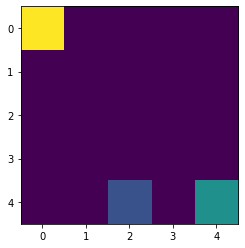

In [3]:
env=GridEnvironment()
env.render()

In [4]:
#Agent   
class Q_Agent:
    
    def __init__(self):
        self.State=GridEnvironment()
        self.actions=["U","D","L","R"]#Actions
        self.stats=[]
        self.end_st=self.State.end_st
        self.gamma = 0.8#discount factor gamma
        self.eps=0.99#Epsilon
        self.alpha=0.2#Learning rate alpha
        self.timestep=0
        self.overall_steps=0
        self.qval={}#Q value is initialised as a dictionary
        self.rew=0
        self.max_timestep=20
        
        # Q Values Initialisation using dictionary
        for m in range(5):
            for n in range(5):
                self.qval[(m,n)]={}
                for act in self.actions:
                    self.qval[(m,n)][act]=0 
                    
    def acttake(self, action):
        #To get the next position from the environment given action
        pos=self.State.step(action)
        return(GridEnvironment(state=pos))   
    
    def actionselect(self):
        # choosing actions using epsilon Greedy method      
        if(np.random.uniform(0, 1)<=self.eps):
            action=np.random.choice(self.actions)
        else:
            curpos=self.State.state
            maxrew=self.qval[curpos]['U']
            action='U'
            for a in self.actions:
                curpos=self.State.state
                new_rew=self.qval[curpos][a]
                if(new_rew>maxrew):
                    maxrew=new_rew
                    action=a
        return(action)
    
    def execute(self, iters=10, ad=False):
        #Q-Learning algorithm
        j=0
        while(j<iters):
            self.overall_steps+=1
            self.timestep+= 1
            print("..................................................")
            print("\n\nIteration : ",j)
            if(self.State.end_st):
                self.State.render()
                reward=self.State.rewardfun()
                self.rew+=reward
                self.eps=(self.eps*0.95)
                for ac in self.actions:
                    self.qval[self.State.state][ac]=reward
                print("Reward in the end : ", reward)
                print("Timestep : ",self.timestep)
                if(reward==-3):
                    print("\nGAME LOST!!!!")
                else:
                    print("\nGAME WON!!!!")
                print("..................................................")
                self.reset()
                ovsteps.insert(j,self.overall_steps)
                rew.insert(j,self.rew)
                eps.insert(j,self.eps)
                self.overall_steps=0
                self.rew=0
                j+=1
            else:
                action=self.actionselect()#Selecting the action to take given current state
                self.stats.append([(self.State.state),action])
                print("Current State of Agent : ",self.State.state)
                print("Action Taken by Agent (U:Up; D:Down: R:Right; L:Left): ",action)
                self.State.render()
                curpos=self.State.state
                self.State=self.acttake(action)#Getting the next state given action
                self.State.end()
                print("Next state of Agent : ", self.State.state)
                d=max(self.qval[self.State.state]['U'],self.qval[self.State.state]['L'],self.qval[self.State.state]['D'],self.qval[self.State.state]['R'])#Finding the max of q value of next state
                reward=self.State.rewardfun()#Getting current reward
                print("Reward got : ", reward)
                self.rew+=reward#Updating rewards
                reward=self.qval[curpos][action] + self.alpha*(reward+(self.gamma*d) - self.qval[curpos][action])#Updation of Q value
                self.qval[curpos][action]=round(reward,4)#Rounding it to 4 decimal places
                print("Timestep : ",self.timestep)
                print("..................................................")
                if(self.timestep==self.max_timestep):
                    self.reset()
                self.end_st=self.State.end_st
            if(ad==False):
                print("\nQ-Table \n")
                print(Qplay.qval)
    
    def reset(self):
        #Resetting the environment and agent 
        self.timestep=0
        self.State.reset()
        self.State = GridEnvironment()#Environment Reset
        self.stats=[]
        self.end_st = self.State.end_st

..................................................


Iteration :  0
Current State of Agent :  (0, 0)
Action Taken by Agent (U:Up; D:Down: R:Right; L:Left):  R


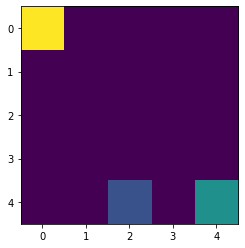

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (0, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (0, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (4, 0): {'U': 0, 'D': 0, 'L': 0, 

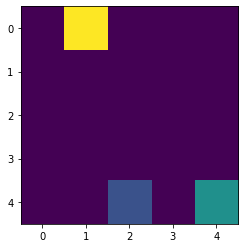

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (0, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (4, 0): {'U': 0, 'D': 0, 'L': 

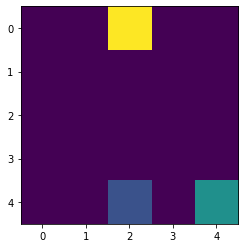

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 2): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (0, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (4, 0): {'U': 0, 'D': 0, 'L

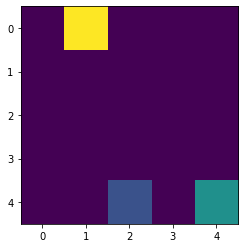

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (0, 2): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (0, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (4, 0): {'U': 0, 'D': 0, '

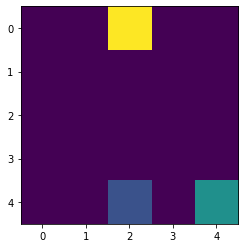

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (0, 2): {'U': 0, 'D': 0, 'L': -0.2, 'R': -0.2}, (0, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (4, 0): {'U': 0, 'D': 0

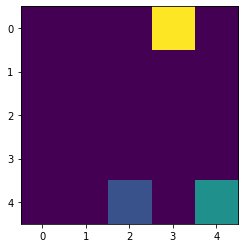

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (0, 2): {'U': 0, 'D': 0, 'L': -0.2, 'R': -0.2}, (0, 3): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (4, 0): {'U': 0, 'D'

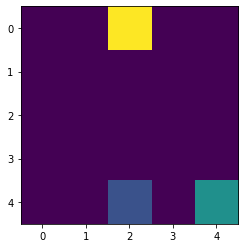

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.2}, (0, 3): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (4, 0): {'U': 0, 

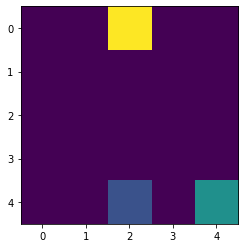

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (4, 0): {'U': 0,

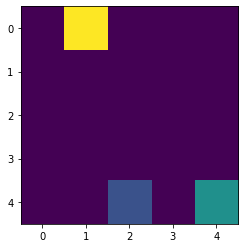

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (4, 0): {'U':

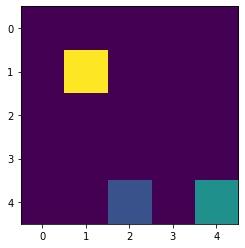

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': 0}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (4, 0): {

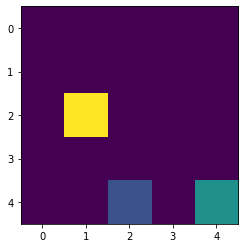

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': 0}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (4, 0)

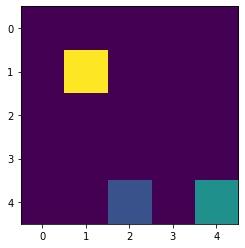

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (4,

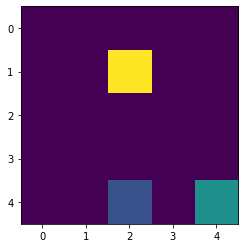

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, 

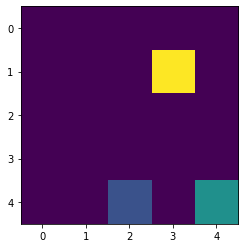

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0

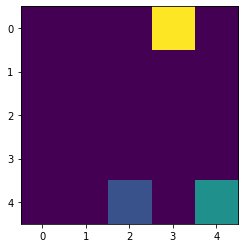

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 'R'

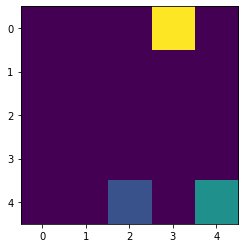

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 0, 

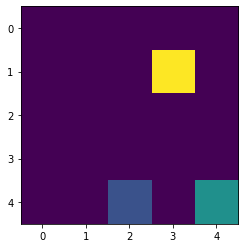

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': -0.2}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L': 

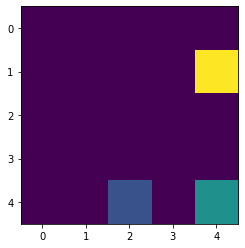

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': -0.2}, (1, 4): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0, 'L

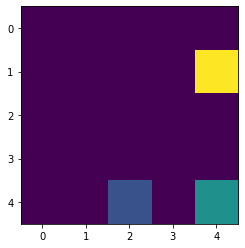

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': -0.2}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D': 0,

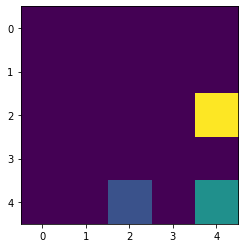

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': -0.2}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D':

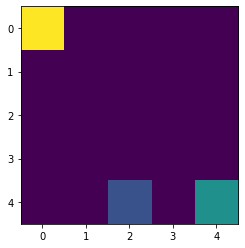

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': -0.2, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': -0.2}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, 'D

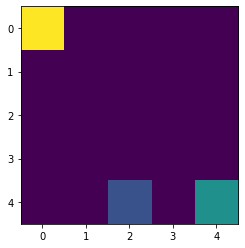

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': 0, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': -0.2}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0, '

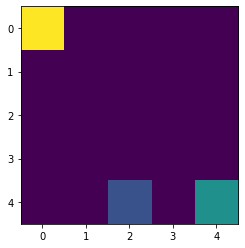

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': -0.2}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U': 0

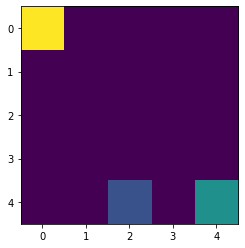

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': -0.2}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {'U'

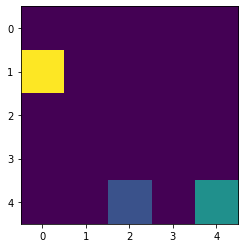

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': -0.2}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4): {

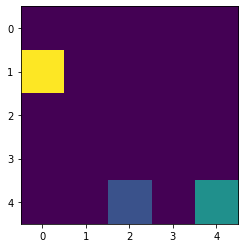

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': -0.2}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 4)

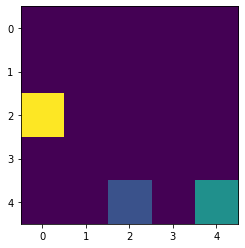

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': -0.2}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3,

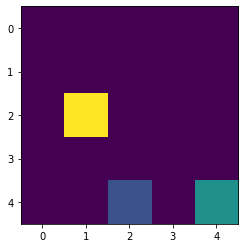

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': -0.2}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3

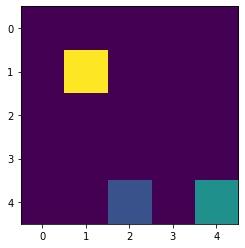

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': -0.2}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (

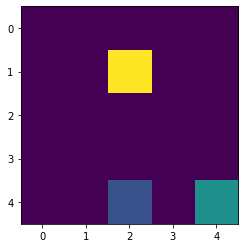

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (1, 3): {'U': -0.2, 'D': 0, 'L': 0, 'R': -0.2}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0},

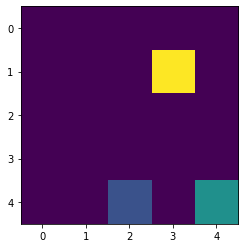

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.2}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 

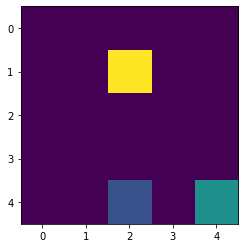

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.2}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R':

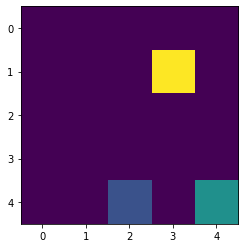

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.36}, (1, 4): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 'R'

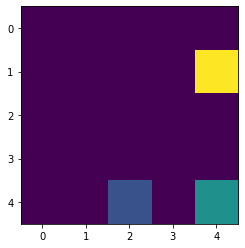

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.36}, (1, 4): {'U': -0.2, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 0, 

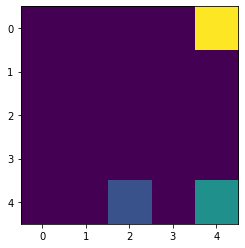

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.36}, (1, 4): {'U': -0.2, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L': 

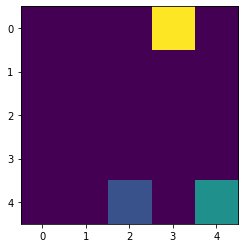

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.36}, (1, 4): {'U': -0.2, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L':

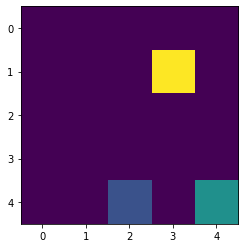

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L'

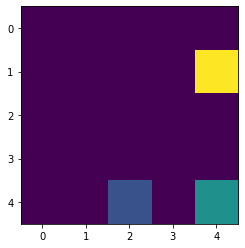

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0, 'L

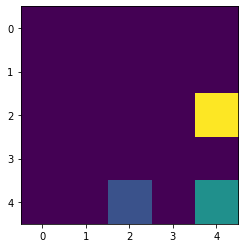

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': 0, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D': 0,

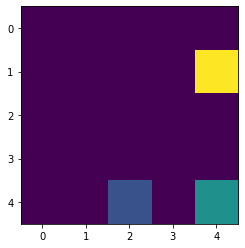

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.2, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D':

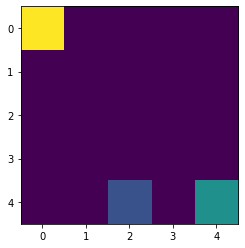

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.36, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0, 'D':

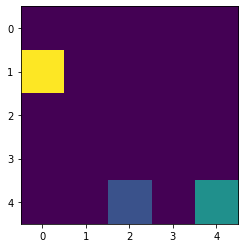

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.36, 'L': -0.36, 'R': -0.2}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0,

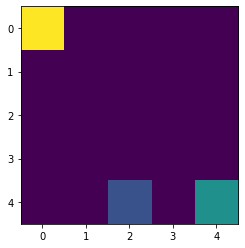

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.36, 'L': -0.36, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'U': 0

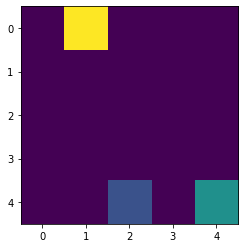

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -0.2, 'D': -0.36, 'L': -0.36, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.2, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): {'

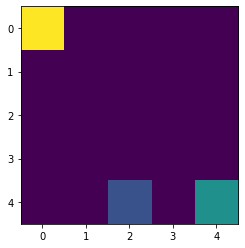

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.36, 'L': -0.36, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.2, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3): 

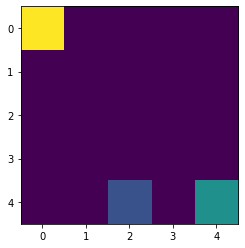

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.2, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3)

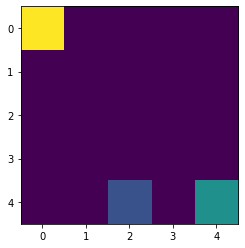

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.2, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': 0}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 3

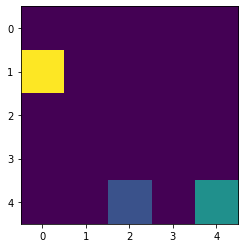

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.2, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3

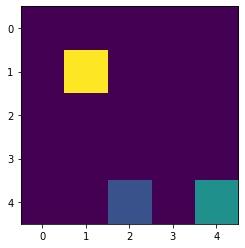

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.2, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': 0, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': 0, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (

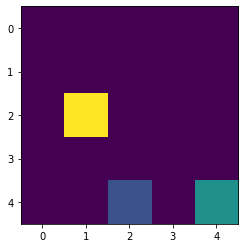

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.2, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': 0, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (2, 1): {'U': -0.36, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0

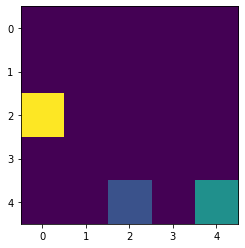

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.2, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': 0, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.36, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 

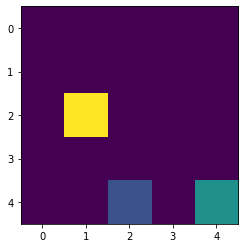

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.2, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': 0, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 'R':

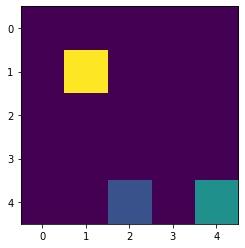

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.2, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': -0.2, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, '

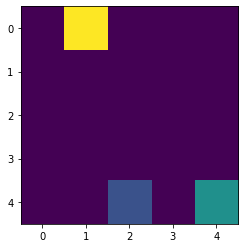

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.36, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': -0.2, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0, 

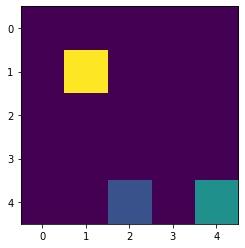

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.36, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': -0.36, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0,

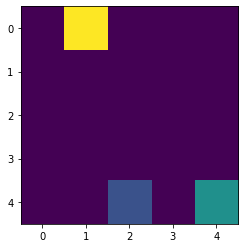

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.488, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': -0.36, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 0

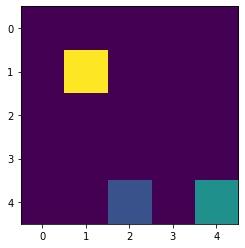

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': 0, 'D': -0.488, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': -0.488, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L': 

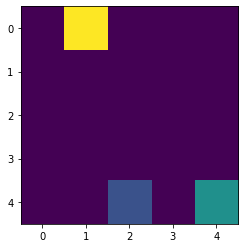

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': -0.2, 'D': -0.488, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': -0.488, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 'L

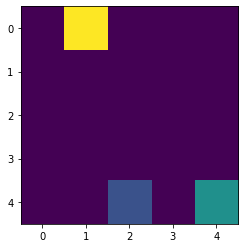

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': -0.392, 'D': -0.488, 'L': -0.232, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': -0.488, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 

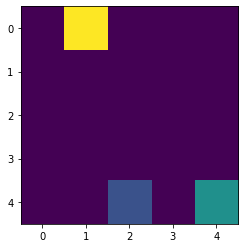

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.5456, 'R': -0.36}, (0, 1): {'U': -0.392, 'D': -0.488, 'L': -0.4432, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': -0.488, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0,

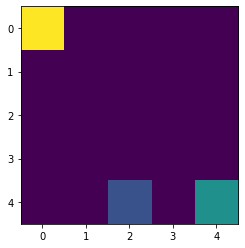

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -0.392, 'D': -0.488, 'L': -0.6941, 'R': -0.36}, (0, 1): {'U': -0.392, 'D': -0.488, 'L': -0.4432, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': -0.488, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0, 

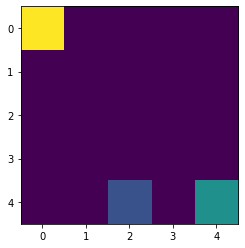

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -0.5712, 'D': -0.488, 'L': -0.6941, 'R': -0.36}, (0, 1): {'U': -0.392, 'D': -0.488, 'L': -0.4432, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': -0.488, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0,

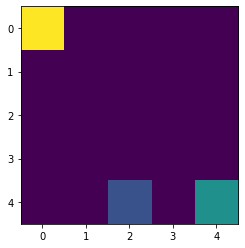

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -0.5712, 'D': -0.488, 'L': -0.8129, 'R': -0.36}, (0, 1): {'U': -0.392, 'D': -0.488, 'L': -0.4432, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': -0.488, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0,

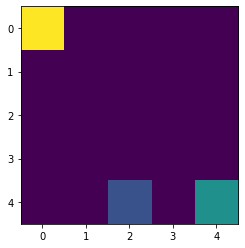

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -0.7146, 'D': -0.488, 'L': -0.8129, 'R': -0.36}, (0, 1): {'U': -0.392, 'D': -0.488, 'L': -0.4432, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': -0.488, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0,

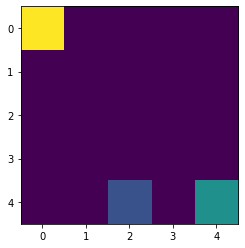

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -0.7146, 'D': -0.6224, 'L': -0.8129, 'R': -0.36}, (0, 1): {'U': -0.392, 'D': -0.488, 'L': -0.4432, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (1, 1): {'U': -0.488, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D': 0

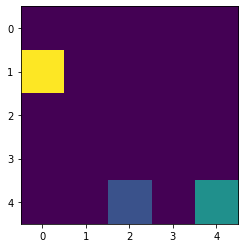

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -0.7146, 'D': -0.6224, 'L': -0.8129, 'R': -0.36}, (0, 1): {'U': -0.392, 'D': -0.488, 'L': -0.4432, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.232, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.488, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D':

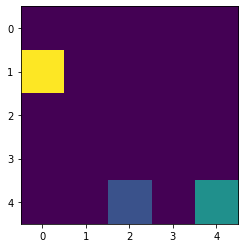

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -0.7146, 'D': -0.6224, 'L': -0.8129, 'R': -0.36}, (0, 1): {'U': -0.392, 'D': -0.488, 'L': -0.4432, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.488, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D'

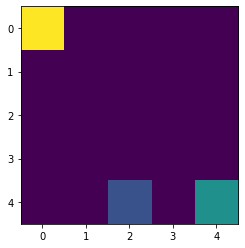

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -0.8129, 'R': -0.36}, (0, 1): {'U': -0.392, 'D': -0.488, 'L': -0.4432, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.488, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, 'D'

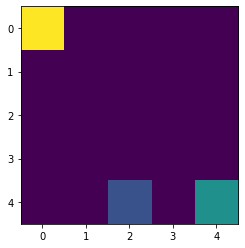

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -0.8129, 'R': -0.5456}, (0, 1): {'U': -0.392, 'D': -0.488, 'L': -0.4432, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.488, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0, '

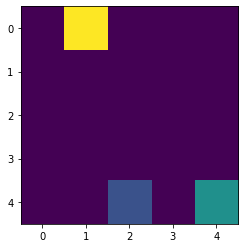

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -0.8129, 'R': -0.5456}, (0, 1): {'U': -0.392, 'D': -0.5904, 'L': -0.4432, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.488, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0,

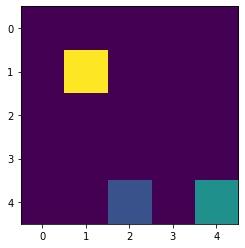

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -0.8129, 'R': -0.5456}, (0, 1): {'U': -0.392, 'D': -0.5904, 'L': -0.4432, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.648, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0,

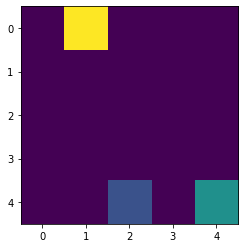

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -0.8129, 'R': -0.5456}, (0, 1): {'U': -0.5712, 'D': -0.5904, 'L': -0.4432, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.648, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0

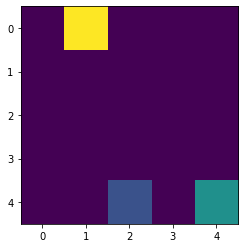

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -0.8129, 'R': -0.5456}, (0, 1): {'U': -0.7146, 'D': -0.5904, 'L': -0.4432, 'R': -0.36}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.648, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 0

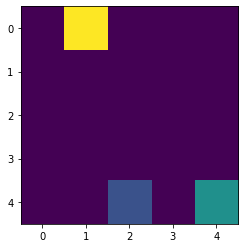

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -0.8129, 'R': -0.5456}, (0, 1): {'U': -0.7146, 'D': -0.5904, 'L': -0.4432, 'R': -0.488}, (0, 2): {'U': -0.2, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.648, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U': 

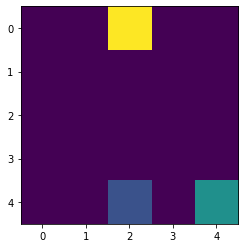

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -0.8129, 'R': -0.5456}, (0, 1): {'U': -0.7146, 'D': -0.5904, 'L': -0.4432, 'R': -0.488}, (0, 2): {'U': -0.36, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.648, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U':

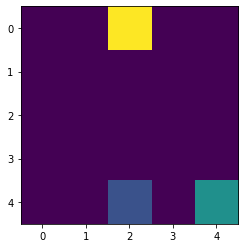

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -0.8129, 'R': -0.5456}, (0, 1): {'U': -0.7146, 'D': -0.5904, 'L': -0.4432, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.2}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.648, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U'

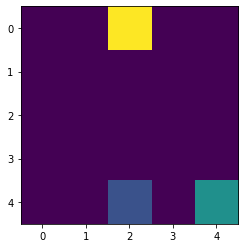

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -0.8129, 'R': -0.5456}, (0, 1): {'U': -0.7146, 'D': -0.5904, 'L': -0.4432, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.648, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'U

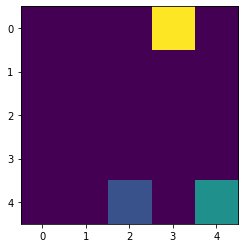

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -0.8129, 'R': -0.5456}, (0, 1): {'U': -0.7146, 'D': -0.5904, 'L': -0.4432, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.648, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2): {'

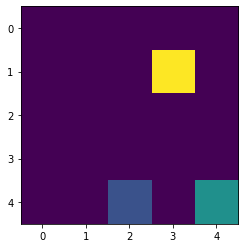

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -0.8129, 'R': -0.5456}, (0, 1): {'U': -0.7146, 'D': -0.5904, 'L': -0.4432, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.648, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 2):

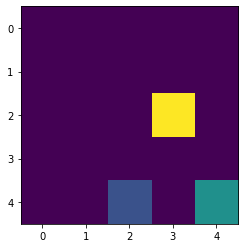

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -0.8129, 'R': -0.5456}, (0, 1): {'U': -0.7146, 'D': -0.5904, 'L': -0.4432, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.648, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3

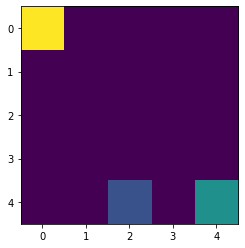

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -0.9376, 'R': -0.5456}, (0, 1): {'U': -0.7146, 'D': -0.5904, 'L': -0.4432, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.648, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3,

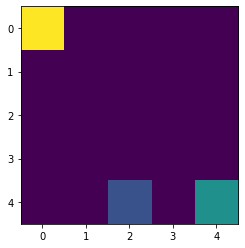

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -1.0374, 'R': -0.5456}, (0, 1): {'U': -0.7146, 'D': -0.5904, 'L': -0.4432, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.648, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3,

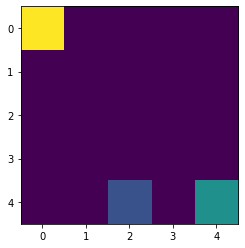

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -1.0374, 'R': -0.7074}, (0, 1): {'U': -0.7146, 'D': -0.5904, 'L': -0.4432, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.648, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3,

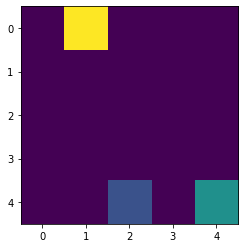

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -1.0374, 'R': -0.7074}, (0, 1): {'U': -0.7146, 'D': -0.6723, 'L': -0.4432, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.648, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3,

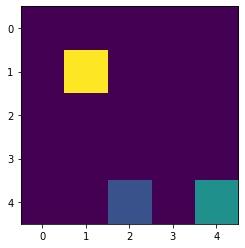

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -1.0374, 'R': -0.7074}, (0, 1): {'U': -0.7146, 'D': -0.6723, 'L': -0.4432, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3

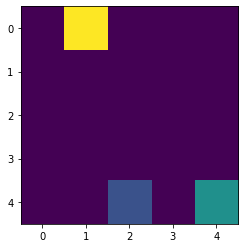

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -0.8293, 'D': -0.6224, 'L': -1.0374, 'R': -0.7074}, (0, 1): {'U': -0.7146, 'D': -0.6723, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3

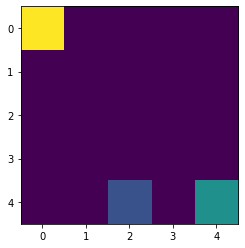

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -0.963, 'D': -0.6224, 'L': -1.0374, 'R': -0.7074}, (0, 1): {'U': -0.7146, 'D': -0.6723, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3,

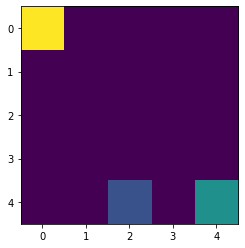

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -0.963, 'D': -0.6224, 'L': -1.1295, 'R': -0.7074}, (0, 1): {'U': -0.7146, 'D': -0.6723, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3,

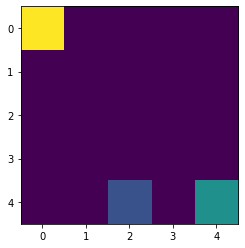

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -0.963, 'D': -0.7299, 'L': -1.1295, 'R': -0.7074}, (0, 1): {'U': -0.7146, 'D': -0.6723, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3,

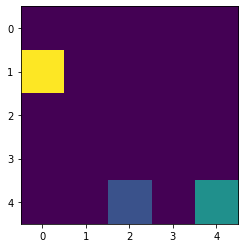

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -0.963, 'D': -0.7299, 'L': -1.1295, 'R': -0.7074}, (0, 1): {'U': -0.7146, 'D': -0.6723, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3

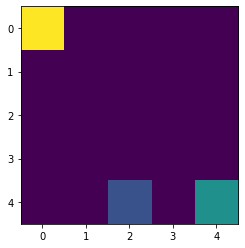

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -0.963, 'D': -0.7299, 'L': -1.2168, 'R': -0.7074}, (0, 1): {'U': -0.7146, 'D': -0.6723, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3

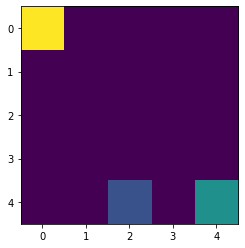

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.0836, 'D': -0.7299, 'L': -1.2168, 'R': -0.7074}, (0, 1): {'U': -0.7146, 'D': -0.6723, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (

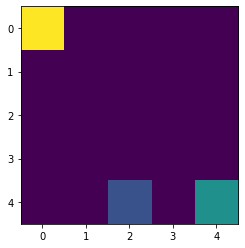

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.1801, 'D': -0.7299, 'L': -1.2168, 'R': -0.7074}, (0, 1): {'U': -0.7146, 'D': -0.6723, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (

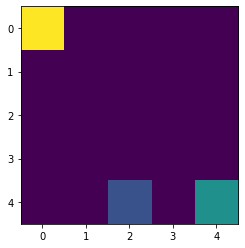

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.2573, 'D': -0.7299, 'L': -1.2168, 'R': -0.7074}, (0, 1): {'U': -0.7146, 'D': -0.6723, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (

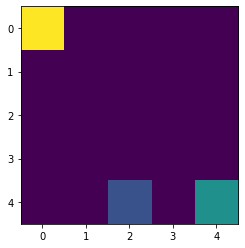

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.2573, 'D': -0.7299, 'L': -1.2866, 'R': -0.7074}, (0, 1): {'U': -0.7146, 'D': -0.6723, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (

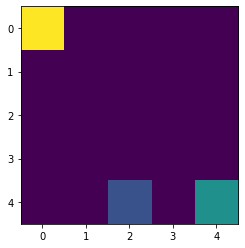

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.2573, 'D': -0.7299, 'L': -1.2866, 'R': -0.844}, (0, 1): {'U': -0.7146, 'D': -0.6723, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3

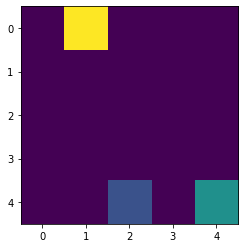

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.2573, 'D': -0.7299, 'L': -1.2866, 'R': -0.844}, (0, 1): {'U': -0.8498, 'D': -0.6723, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3

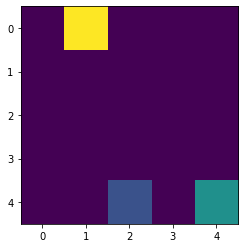

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.2573, 'D': -0.7299, 'L': -1.2866, 'R': -0.844}, (0, 1): {'U': -0.9579, 'D': -0.6723, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3

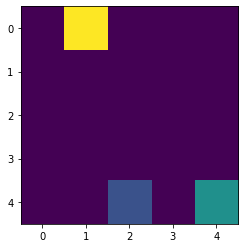

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.2573, 'D': -0.7299, 'L': -1.2866, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.6723, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3

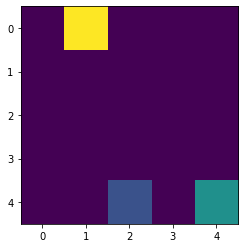

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.2573, 'D': -0.7299, 'L': -1.2866, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3

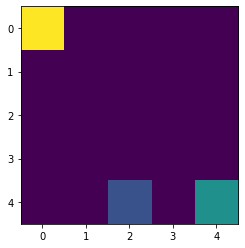

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.2573, 'D': -0.7299, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3,

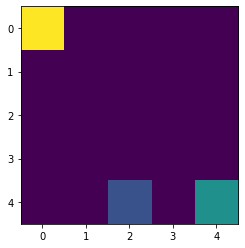

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.7299, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3,

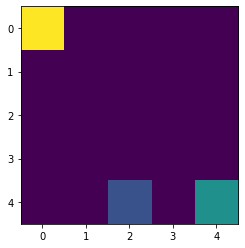

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.2}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3,

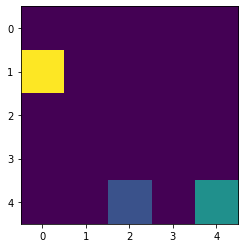

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.36, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3

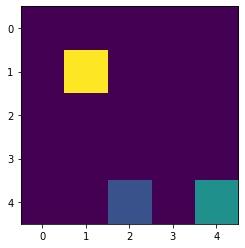

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.2, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (

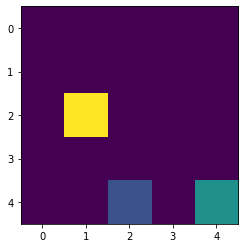

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, 

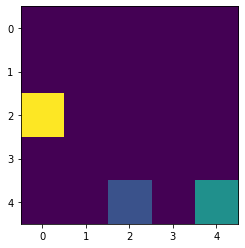

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R':

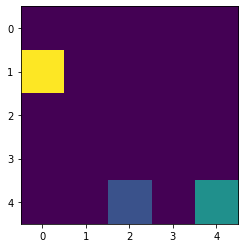

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.2, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R'

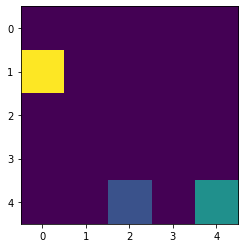

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0, 'R

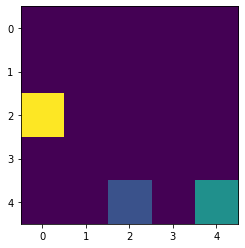

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (3, 1): {'U': 0, 'D': 0, 'L': 0

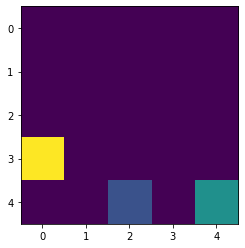

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': 0, 'D': 0, 'L'

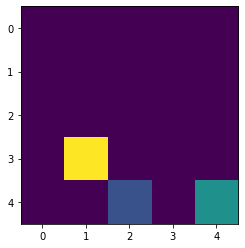

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': 0, 'D': -0.2, 

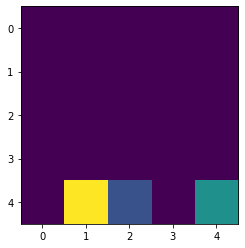

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': 0, 'D': -0.2, 

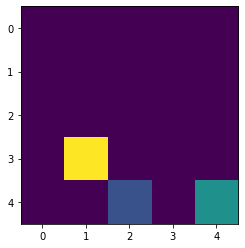

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.2, 'D': -0.

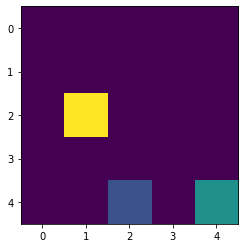

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.36, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.2, 'D': 

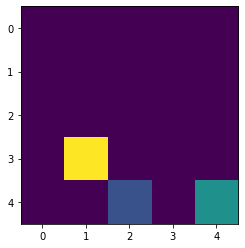

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.36, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.2, 'D': 

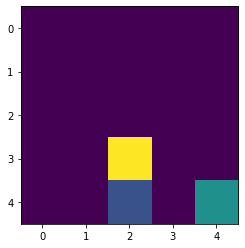

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.36, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.2, 'D': 

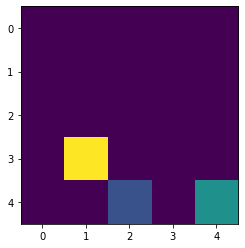

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.36, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.36, 'D':

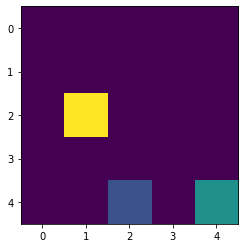

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': 0, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.36, 'D'

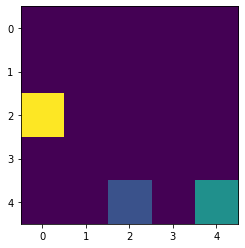

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.3226, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.36, 

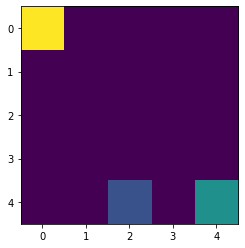

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.3886, 'D': -0.8159, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.36, '

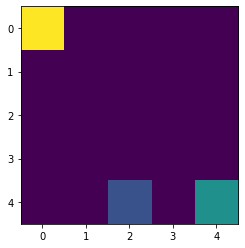

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.3886, 'D': -0.9103, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.6677, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.36, '

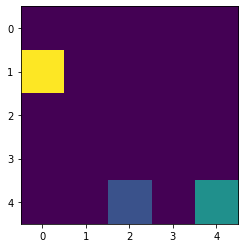

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.3886, 'D': -0.9103, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.8692, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.36, '

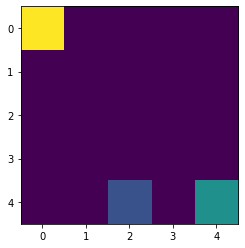

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.3886, 'D': -0.9858, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.8692, 'D': -0.36, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.36, '

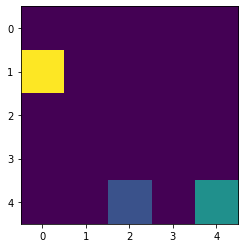

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.3886, 'D': -0.9858, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.8692, 'D': -0.52, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': -0.2, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.36, '

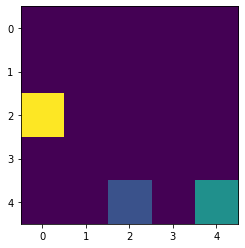

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.3886, 'D': -0.9858, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.8692, 'D': -0.52, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.232, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.36,

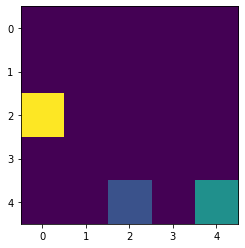

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.3886, 'D': -0.9858, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.8692, 'D': -0.52, 'L': -0.5456, 'R': -0.36}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.36

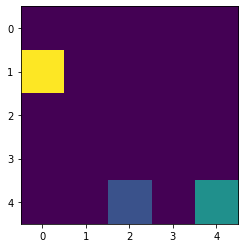

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.3886, 'D': -0.9858, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.8692, 'D': -0.52, 'L': -0.5456, 'R': -0.488}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': 0, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U': -0.3

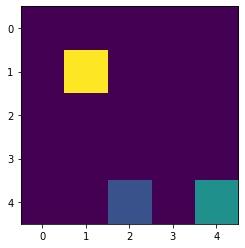

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.3886, 'D': -0.9858, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.8692, 'D': -0.52, 'L': -0.5456, 'R': -0.488}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': -0.2781, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'U'

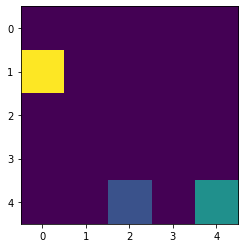

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.3886, 'D': -0.9858, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.8692, 'D': -0.648, 'L': -0.5456, 'R': -0.488}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': -0.2781, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.4432, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'

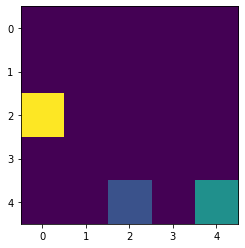

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.3886, 'D': -0.9858, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.8692, 'D': -0.648, 'L': -0.5456, 'R': -0.488}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': -0.2781, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'

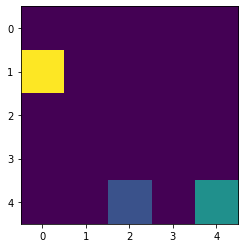

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.3886, 'D': -0.9858, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -0.8692, 'D': -0.648, 'L': -0.7146, 'R': -0.488}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': -0.2781, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'

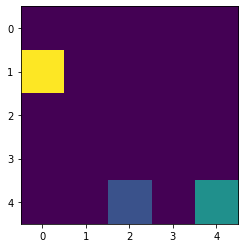

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.3886, 'D': -0.9858, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.0304, 'D': -0.648, 'L': -0.7146, 'R': -0.488}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': -0.2781, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'

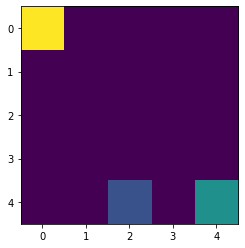

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -0.9858, 'L': -1.3461, 'R': -0.844}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.0304, 'D': -0.648, 'L': -0.7146, 'R': -0.488}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': -0.2781, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'

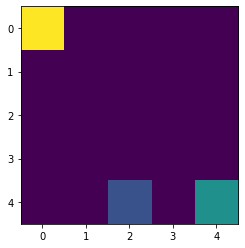

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -0.9858, 'L': -1.3461, 'R': -0.9533}, (0, 1): {'U': -1.0444, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.0304, 'D': -0.648, 'L': -0.7146, 'R': -0.488}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': -0.2781, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

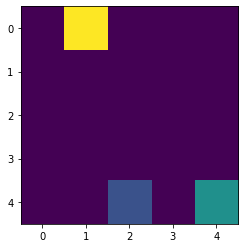

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -0.9858, 'L': -1.3461, 'R': -0.9533}, (0, 1): {'U': -1.1136, 'D': -0.7378, 'L': -0.6541, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.0304, 'D': -0.648, 'L': -0.7146, 'R': -0.488}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': -0.2781, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

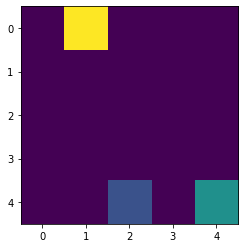

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -0.9858, 'L': -1.3461, 'R': -0.9533}, (0, 1): {'U': -1.1136, 'D': -0.7378, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.0304, 'D': -0.648, 'L': -0.7146, 'R': -0.488}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': -0.2781, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

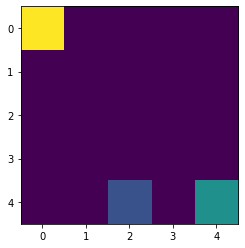

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -0.9858, 'L': -1.3461, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.7378, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.0304, 'D': -0.648, 'L': -0.7146, 'R': -0.488}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': -0.2781, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

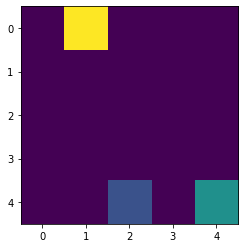

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -0.9858, 'L': -1.3461, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.0304, 'D': -0.648, 'L': -0.7146, 'R': -0.488}, (1, 1): {'U': -0.7893, 'D': -0.488, 'L': -0.2781, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

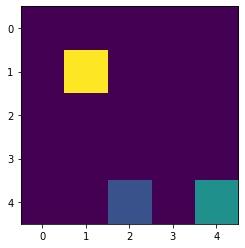

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -0.9858, 'L': -1.3461, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.0304, 'D': -0.648, 'L': -0.7146, 'R': -0.488}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.2781, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): 

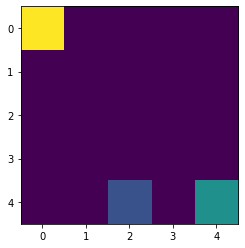

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -1.0667, 'L': -1.3461, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.0304, 'D': -0.648, 'L': -0.7146, 'R': -0.488}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.2781, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

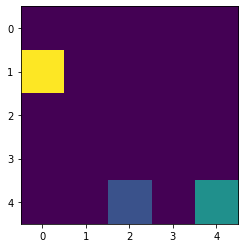

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -1.0667, 'L': -1.3461, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.0304, 'D': -0.648, 'L': -0.7146, 'R': -0.6349}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.2781, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): 

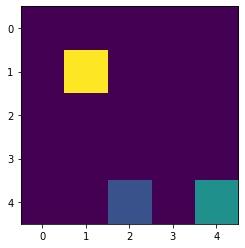

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -1.0667, 'L': -1.3461, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.0304, 'D': -0.648, 'L': -0.7146, 'R': -0.6349}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.5241, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): 

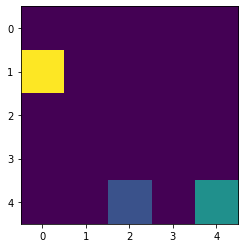

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -1.0667, 'L': -1.3461, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.0304, 'D': -0.648, 'L': -0.7146, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.5241, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): 

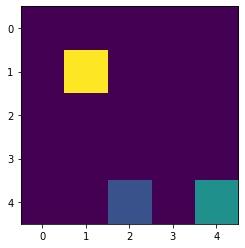

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -1.0667, 'L': -1.3461, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.0304, 'D': -0.648, 'L': -0.7146, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

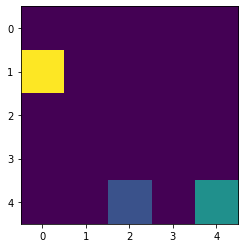

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -1.0667, 'L': -1.3461, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.0304, 'D': -0.648, 'L': -0.8754, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

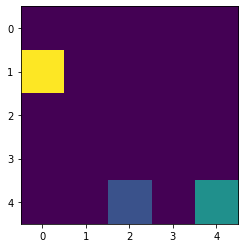

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -1.0667, 'L': -1.3461, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.1908, 'D': -0.648, 'L': -0.8754, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

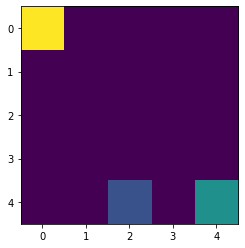

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -1.0667, 'L': -1.4434, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.1908, 'D': -0.648, 'L': -0.8754, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

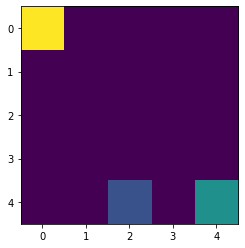

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -1.157, 'L': -1.4434, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.1908, 'D': -0.648, 'L': -0.8754, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'

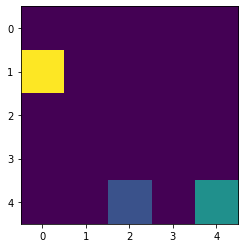

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.4459, 'D': -1.157, 'L': -1.4434, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.3192, 'D': -0.648, 'L': -0.8754, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

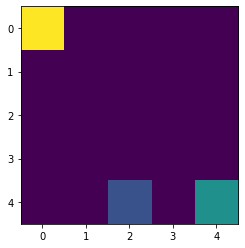

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.5232, 'D': -1.157, 'L': -1.4434, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.3192, 'D': -0.648, 'L': -0.8754, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

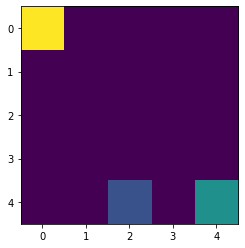

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.5232, 'D': -1.2293, 'L': -1.4434, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.3192, 'D': -0.648, 'L': -0.8754, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): 

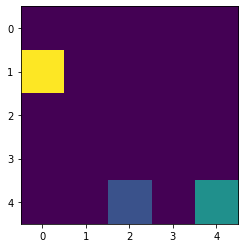

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.5232, 'D': -1.2293, 'L': -1.4434, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.3192, 'D': -0.648, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

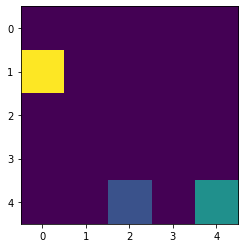

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.5232, 'D': -1.2293, 'L': -1.4434, 'R': -1.0407}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.4219, 'D': -0.648, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

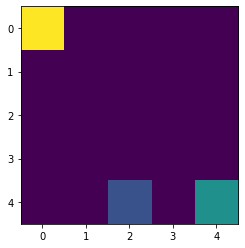

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.5232, 'D': -1.2293, 'L': -1.4434, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -0.8758, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.4219, 'D': -0.648, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

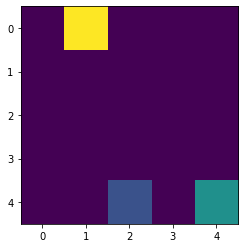

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.5232, 'D': -1.2293, 'L': -1.4434, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.4219, 'D': -0.648, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

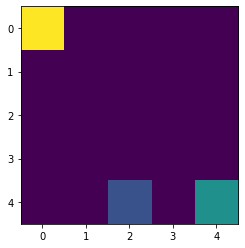

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.5232, 'D': -1.2871, 'L': -1.4434, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.4219, 'D': -0.648, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

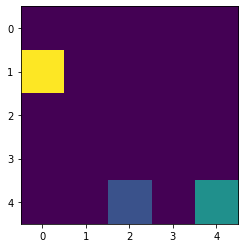

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.5232, 'D': -1.2871, 'L': -1.4434, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.648, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

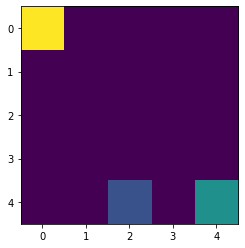

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.5232, 'D': -1.2871, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.648, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

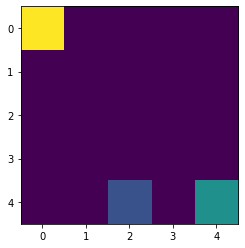

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.5963, 'D': -1.2871, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.648, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

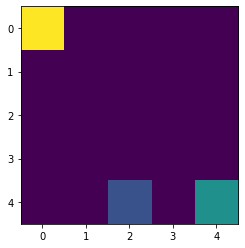

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.2871, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.648, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'

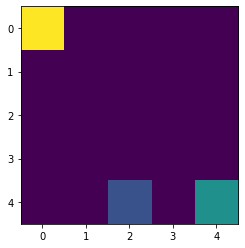

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.648, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {'

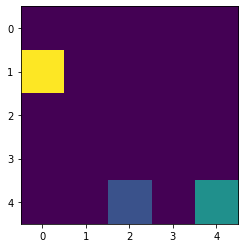

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.2, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): {

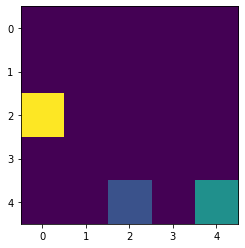

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': 0, 'L': 0, 'R': -0.2}, (3, 1): 

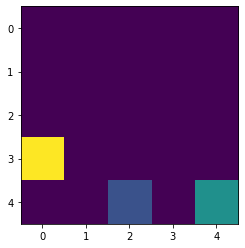

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (3, 1

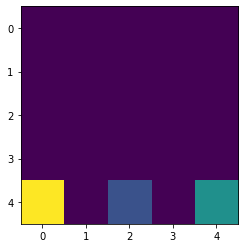

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (3, 1

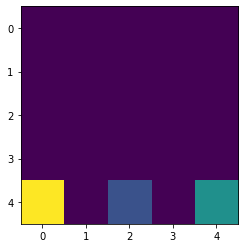

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (3, 1

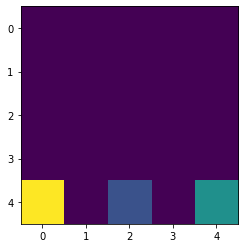

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (3, 1

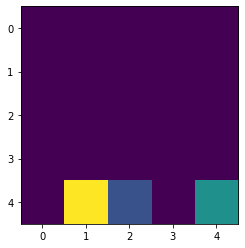

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (3, 1

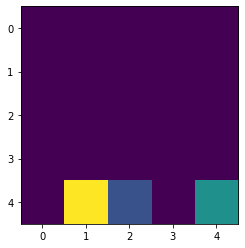

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (3, 

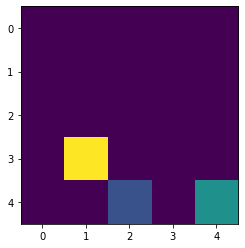

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': -0.2, 'L': 0, 'R': -0.2}, (3, 

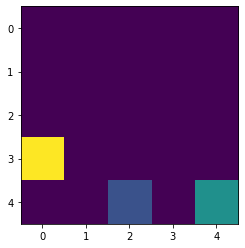

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 0, 'D': -0.2, 'L': -0.2, 'R': -0.2}, (

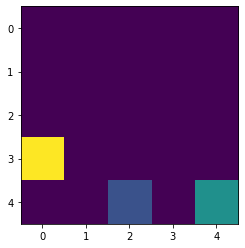

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.36}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R': -0

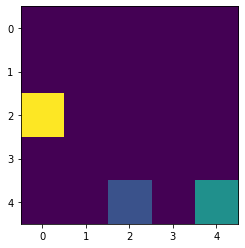

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.2, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R': -

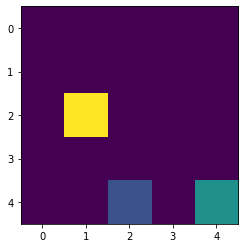

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.392, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R':

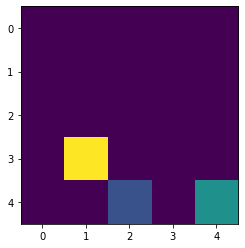

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.392, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R':

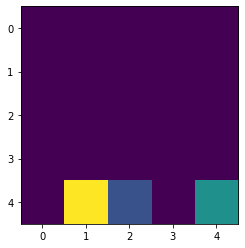

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.392, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R':

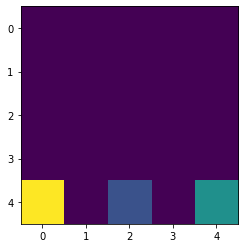

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.392, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R':

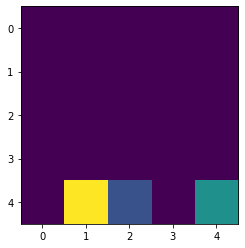

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.392, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R':

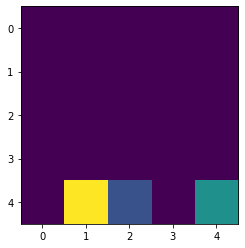

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.6547, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.392, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R':

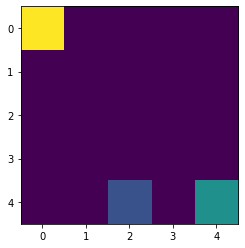

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1106}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.392, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R': 

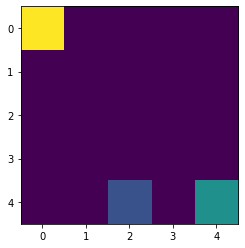

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.1136, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.392, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R': 

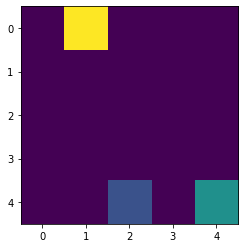

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.8347, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.392, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R': -

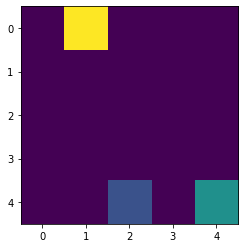

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.723, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.392, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R': -

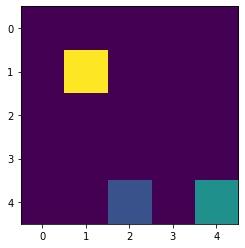

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.7655}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.392, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R': 

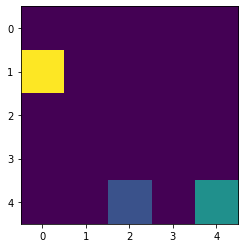

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.7893, 'D': -0.5904, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.392, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R': -0

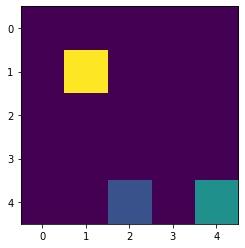

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.7893, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.392, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R': -0

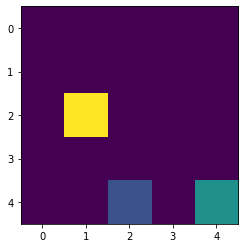

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.7893, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R': -

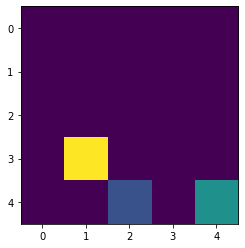

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.7893, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.2576, 'D': -0.2, 'L': -0.2, 'R': -

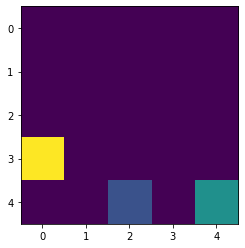

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.7893, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.488}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2, 'L': -0.2, 'R': 

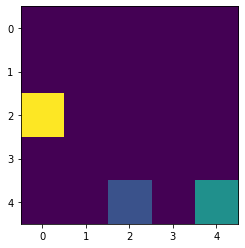

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.7893, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': 0}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2, 'L': -0.2, 'R':

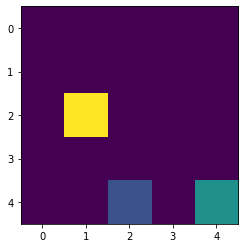

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.7893, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': 0, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2, 'L': -0.2, '

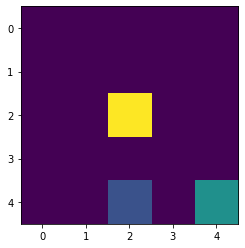

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.7893, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': 0, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2, 'L': -0.2

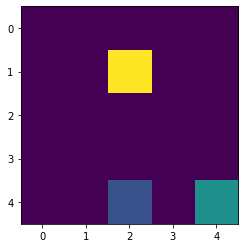

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.7893, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2, 'L'

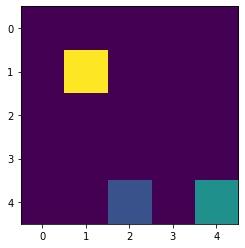

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.0783, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2, 'L'

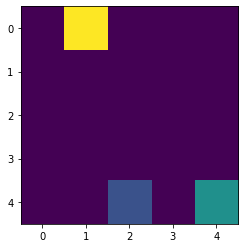

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3334, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.2493, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2, 'L'

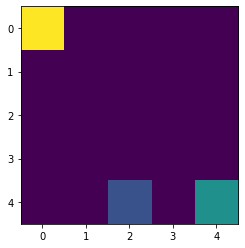

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.2493, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5152, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2, 'L'

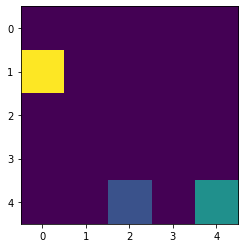

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.1666}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.2493, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2, 'L'

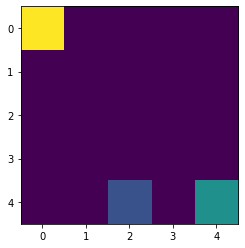

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.2114}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.2493, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2, 'L'

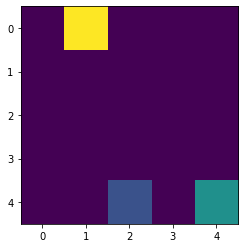

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.2114}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.3933, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2, 'L'

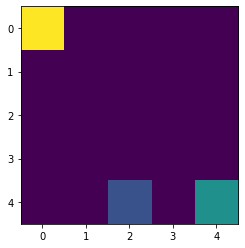

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.2472}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.3933, 'R': -0.488}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2, 'L':

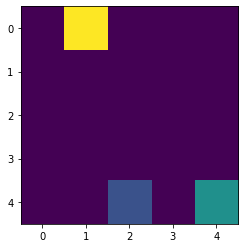

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.2472}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.3933, 'R': -0.5904}, (0, 2): {'U': -0.488, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2, 'L'

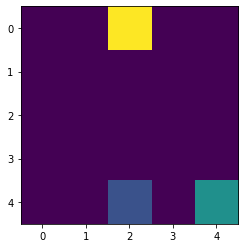

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.2472}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.3933, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': 0, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2, 'L

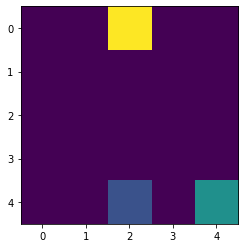

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.2472}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.3933, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.488}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2,

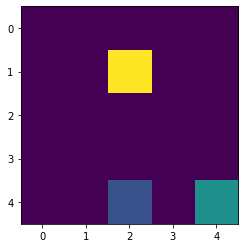

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.2472}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.3933, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.2, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.2

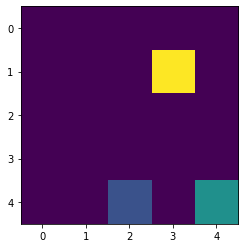

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.2472}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.3933, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.2, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -0.

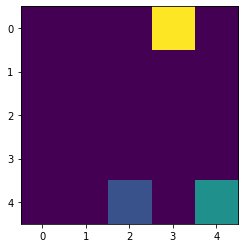

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.2472}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.3933, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.36, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D': -

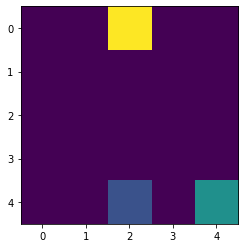

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.2472}, (0, 1): {'U': -1.169, 'D': -0.9254, 'L': -1.3933, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D':

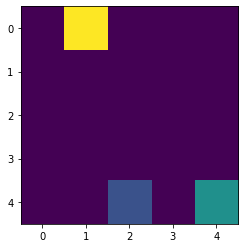

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.2472}, (0, 1): {'U': -1.2297, 'D': -0.9254, 'L': -1.3933, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D'

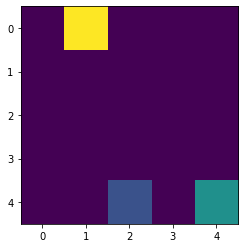

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.3933, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D

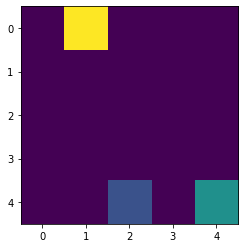

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.5324, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D

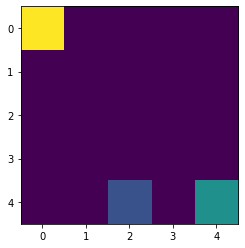

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.7015, 'D': -1.3868, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D

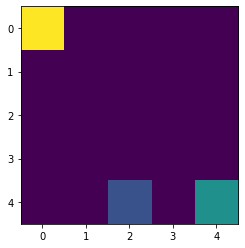

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.3868, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D

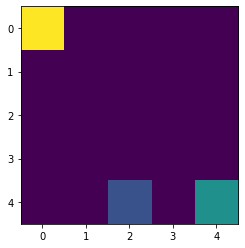

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.4295, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.5988, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D

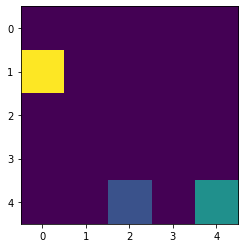

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.4295, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.6786, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D

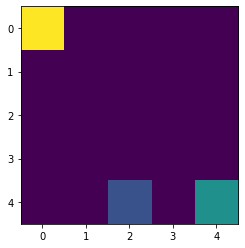

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.4637, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.6786, 'D': -0.7504, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D

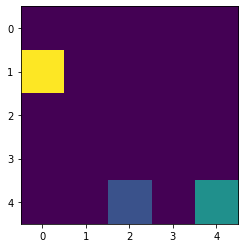

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.4637, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.6786, 'D': -0.8579, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.36, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D

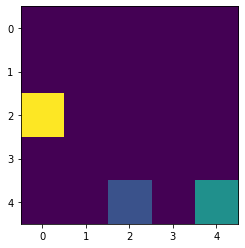

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.4637, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.6786, 'D': -0.8579, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D

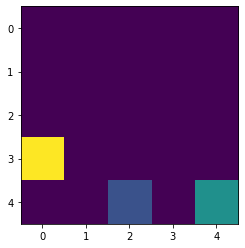

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.4637, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.6786, 'D': -0.8579, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.4637, 'D

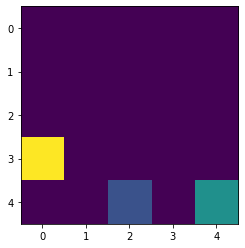

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.4637, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.6786, 'D': -0.8579, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.6337, 'D

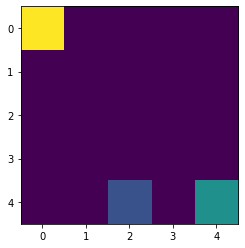

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5082, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.6786, 'D': -0.8579, 'L': -1.004, 'R': -0.87}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.6337, 'D'

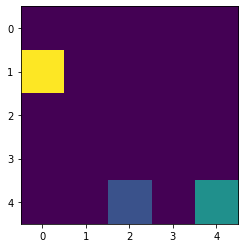

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5082, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.6786, 'D': -0.8579, 'L': -1.004, 'R': -0.9536}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -0.8985, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.6337, '

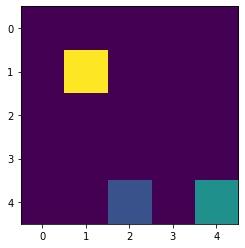

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5082, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.6786, 'D': -0.8579, 'L': -1.004, 'R': -0.9536}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.6337, '

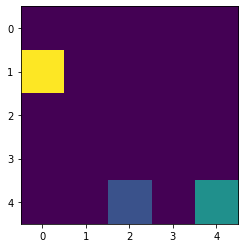

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5082, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.004, 'R': -0.9536}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.6337, '

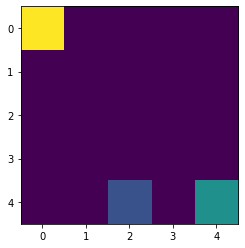

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.004, 'R': -0.9536}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.6337, '

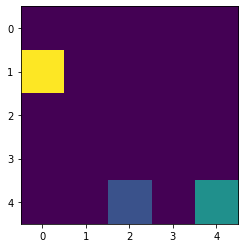

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -0.9536}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.6337, 

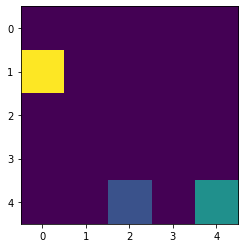

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -0.9095, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.6337, 

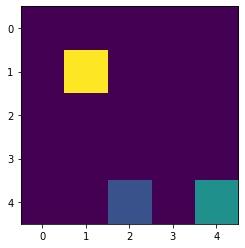

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.5904}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.6337, 

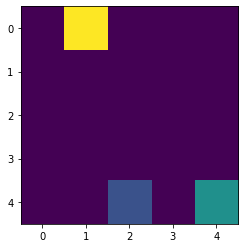

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.7043}, (0, 2): {'U': -0.5904, 'D': -0.2, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.6337, 

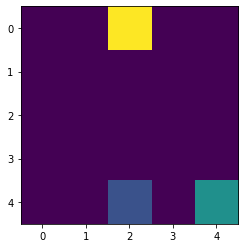

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.7043}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': 0, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -0.6337

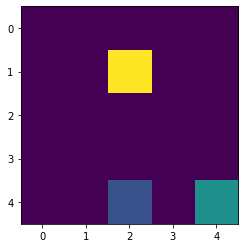

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.7043}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.5825, 'R': -0.36}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': -

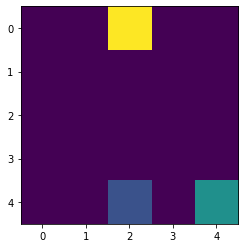

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.7043}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.5825, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': 0}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U': 

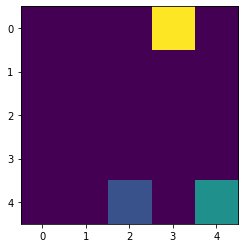

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.7043}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.5825, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': 0}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): {'U

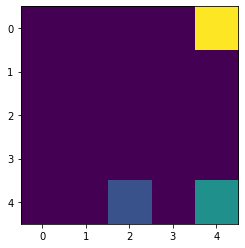

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.7043}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.5825, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': 0, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3, 0): 

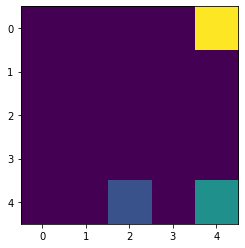

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.7043}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.5825, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.2, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (3,

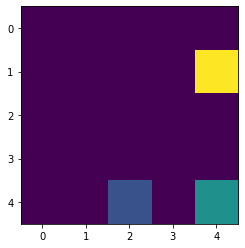

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.7043}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.5825, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.488}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.392, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, (

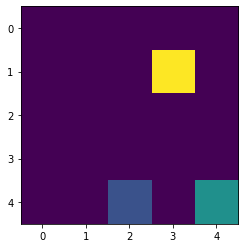

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.7043}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.5825, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.392, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}, 

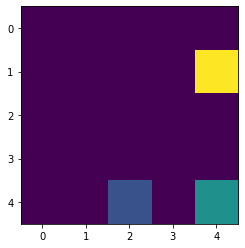

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.7043}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.5825, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.2, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0},

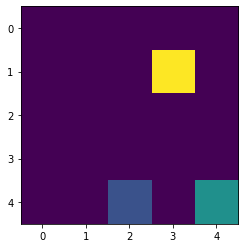

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.7043}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.5825, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': 0}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}

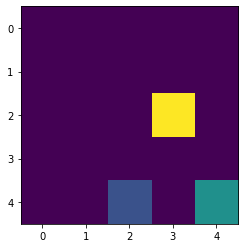

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.2472}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.7043}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.5825, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R':

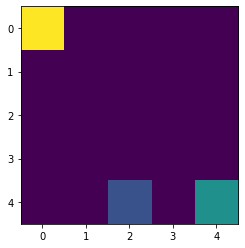

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.2782, 'D': -0.9254, 'L': -1.5142, 'R': -0.7043}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.5825, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 

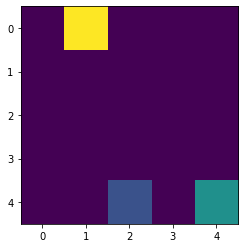

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3352, 'D': -0.9254, 'L': -1.5142, 'R': -0.7043}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.5825, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 

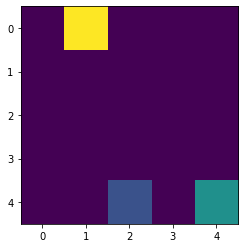

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3352, 'D': -0.9254, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.5825, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0

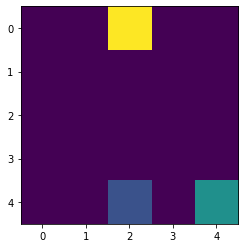

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3352, 'D': -0.9254, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0

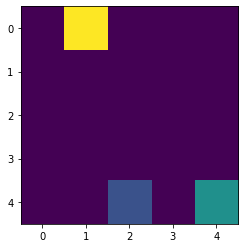

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9254, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0

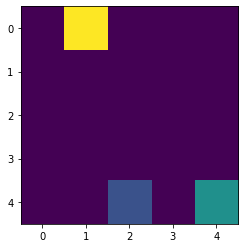

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.0561, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0

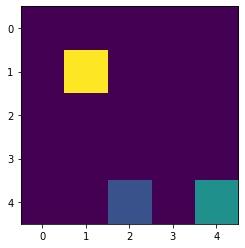

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.1405, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.1821, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0

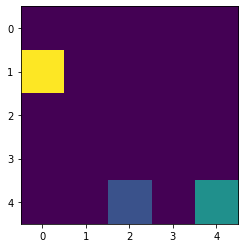

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.2497, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.1821, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0

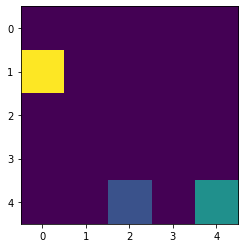

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.337, 'R': -1.0205}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.1821, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}

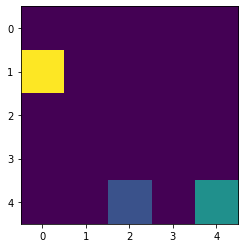

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.337, 'R': -1.074}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.1821, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}

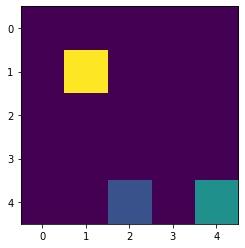

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.8579, 'L': -1.337, 'R': -1.074}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}

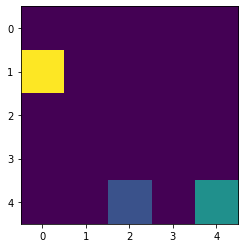

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.949, 'L': -1.337, 'R': -1.074}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.6326, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0},

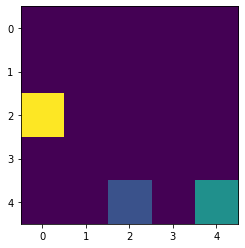

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.949, 'L': -1.337, 'R': -1.074}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0},

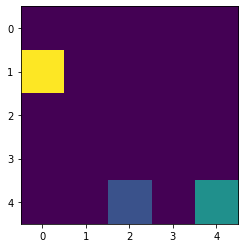

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.949, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.36}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0}

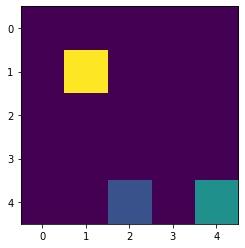

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.949, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': 0, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R': 0

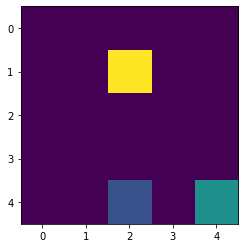

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.949, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.2, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.2, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 'R'

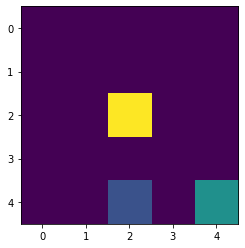

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.949, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.2, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.392, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, '

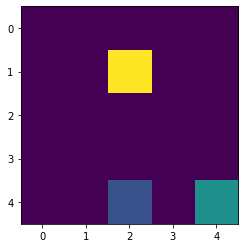

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.949, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.392, 'D': 0, 'L': 0, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0.2, 

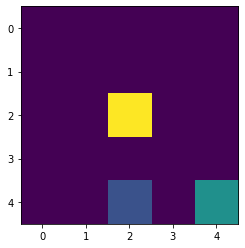

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.949, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.5456, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.392, 'D': 0, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -

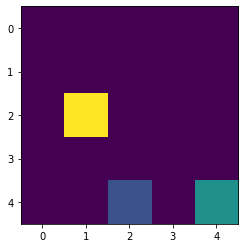

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.7608, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.949, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.392, 'D': 0, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -

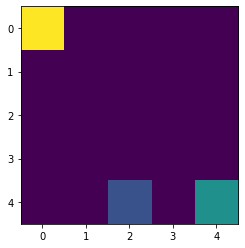

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5438, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.949, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.392, 'D': 0, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0

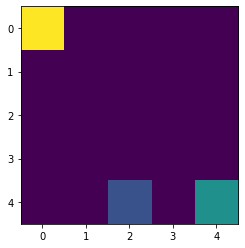

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -0.949, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.392, 'D': 0, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -0

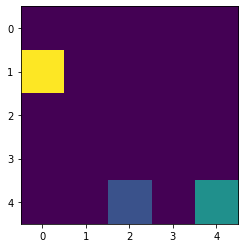

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -1.0219, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.392, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.392, 'D': 0, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': -

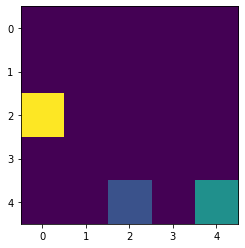

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -1.0219, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.5763, 'R': -0.5904}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.392, 'D': 0, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': 

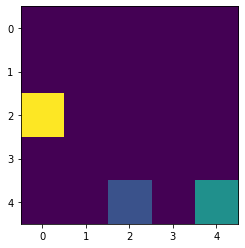

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -1.0219, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.5763, 'R': -0.7043}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.488, 'R': -0.2}, (2, 2): {'U': -0.392, 'D': 0, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L': 

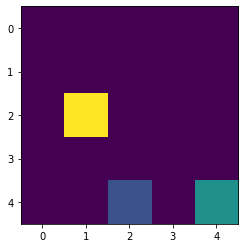

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -1.0219, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.5763, 'R': -0.7043}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.488, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': 0, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L':

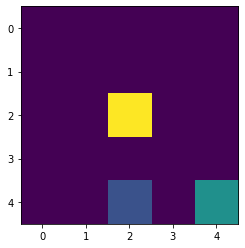

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -1.0219, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.5763, 'R': -0.7043}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.488, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, '

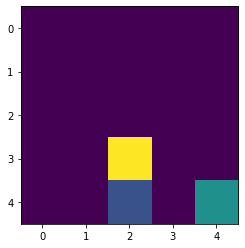

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -1.0219, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.5763, 'R': -0.7043}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.488, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, '

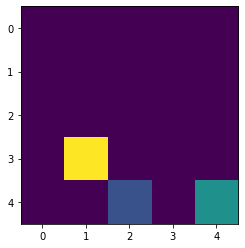

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -1.0219, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.5763, 'R': -0.7043}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.488, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, '

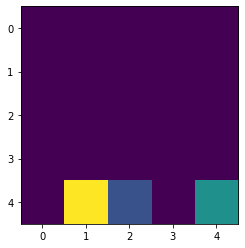

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -1.0219, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.5763, 'R': -0.7043}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.488, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 

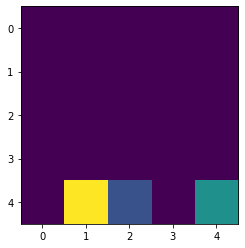

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -1.0219, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.5763, 'R': -0.7043}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.488, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 

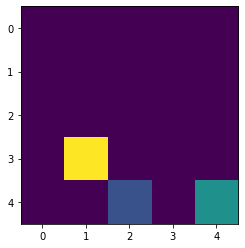

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -1.0219, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.5763, 'R': -0.7043}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.488, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 

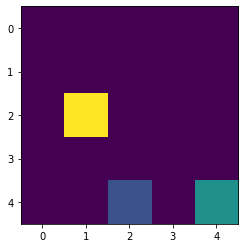

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -1.0219, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -0.8579, 'D': -0.52, 'L': -0.5763, 'R': -0.7043}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0,

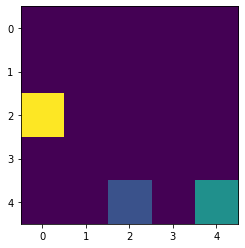

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -1.0219, 'L': -1.337, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.7043}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0,

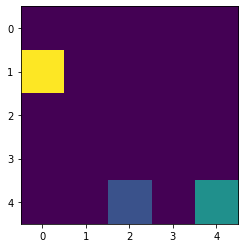

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.7424, 'D': -1.0219, 'L': -1.4331, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.7043}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

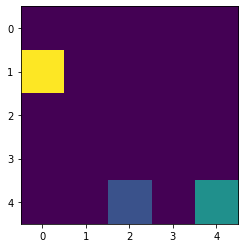

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.5869, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.0219, 'L': -1.4331, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.7043}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

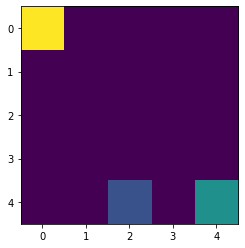

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.633, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.0219, 'L': -1.4331, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.7043}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0,

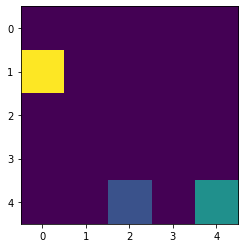

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.633, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.4331, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.7043}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0,

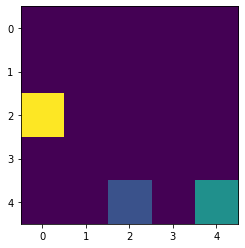

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.633, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.4331, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.6685, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 

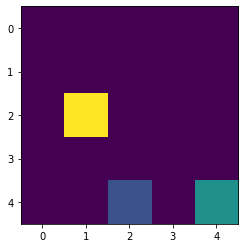

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.633, 'L': -1.6255, 'R': -1.3104}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.4331, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 

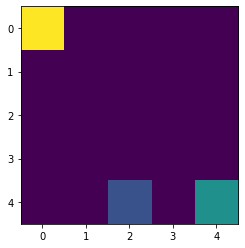

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.633, 'L': -1.6255, 'R': -1.3797}, (0, 1): {'U': -1.3995, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.4331, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, '

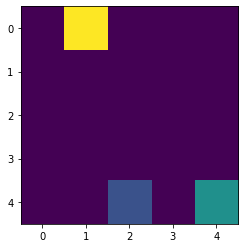

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.633, 'L': -1.6255, 'R': -1.3797}, (0, 1): {'U': -1.451, 'D': -0.9979, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.4331, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L

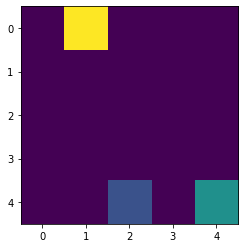

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.633, 'L': -1.6255, 'R': -1.3797}, (0, 1): {'U': -1.451, 'D': -1.0764, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.4331, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.2829, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L

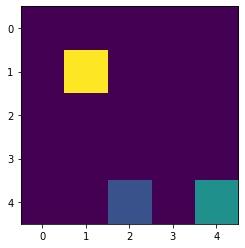

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.633, 'L': -1.6255, 'R': -1.3797}, (0, 1): {'U': -1.451, 'D': -1.0764, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.4331, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.4024, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L

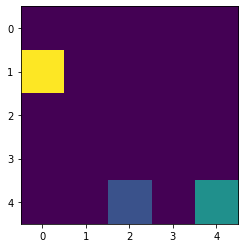

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.633, 'L': -1.6255, 'R': -1.3797}, (0, 1): {'U': -1.451, 'D': -1.0764, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.1168}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.4024, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L

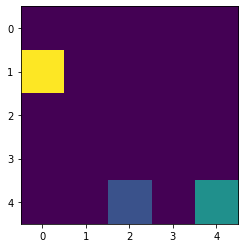

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.633, 'L': -1.6255, 'R': -1.3797}, (0, 1): {'U': -1.451, 'D': -1.0764, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.1715}, (1, 1): {'U': -1.0221, 'D': -0.6723, 'L': -1.4024, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L

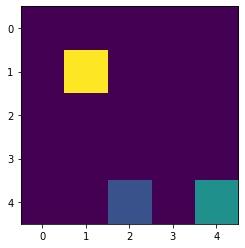

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.633, 'L': -1.6255, 'R': -1.3797}, (0, 1): {'U': -1.451, 'D': -1.0764, 'L': -1.5142, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.1715}, (1, 1): {'U': -1.149, 'D': -0.6723, 'L': -1.4024, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L'

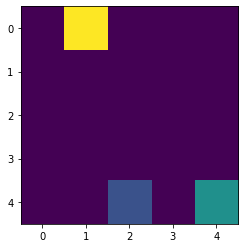

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.8183, 'D': -1.633, 'L': -1.6255, 'R': -1.3797}, (0, 1): {'U': -1.451, 'D': -1.0764, 'L': -1.6321, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.1715}, (1, 1): {'U': -1.149, 'D': -0.6723, 'L': -1.4024, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L'

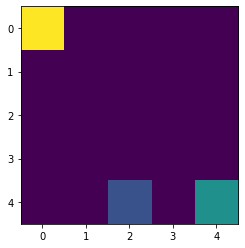

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.8754, 'D': -1.633, 'L': -1.6255, 'R': -1.3797}, (0, 1): {'U': -1.451, 'D': -1.0764, 'L': -1.6321, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.1715}, (1, 1): {'U': -1.149, 'D': -0.6723, 'L': -1.4024, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L'

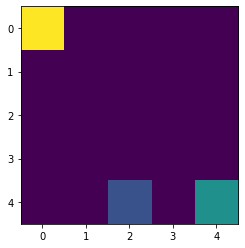

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.8754, 'D': -1.633, 'L': -1.7212, 'R': -1.3797}, (0, 1): {'U': -1.451, 'D': -1.0764, 'L': -1.6321, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.1715}, (1, 1): {'U': -1.149, 'D': -0.6723, 'L': -1.4024, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L

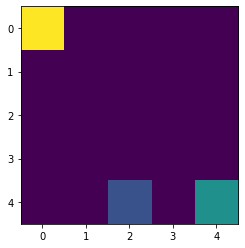

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.8754, 'D': -1.633, 'L': -1.7212, 'R': -1.4351}, (0, 1): {'U': -1.451, 'D': -1.0764, 'L': -1.6321, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.1715}, (1, 1): {'U': -1.149, 'D': -0.6723, 'L': -1.4024, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L

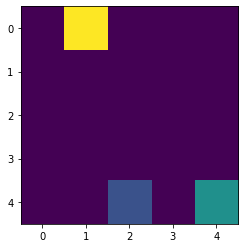

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.8754, 'D': -1.633, 'L': -1.7212, 'R': -1.4351}, (0, 1): {'U': -1.451, 'D': -1.1392, 'L': -1.6321, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.1715}, (1, 1): {'U': -1.149, 'D': -0.6723, 'L': -1.4024, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L

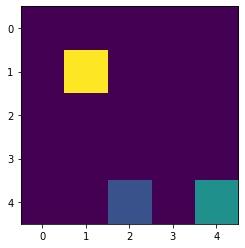

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.8754, 'D': -1.633, 'L': -1.7212, 'R': -1.4351}, (0, 1): {'U': -1.451, 'D': -1.1392, 'L': -1.6321, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.1715}, (1, 1): {'U': -1.149, 'D': -0.6723, 'L': -1.498, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L'

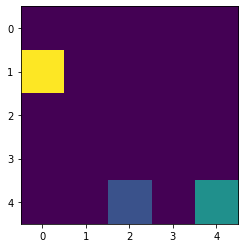

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.8754, 'D': -1.633, 'L': -1.7212, 'R': -1.4351}, (0, 1): {'U': -1.451, 'D': -1.1392, 'L': -1.6321, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.2153}, (1, 1): {'U': -1.149, 'D': -0.6723, 'L': -1.498, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L'

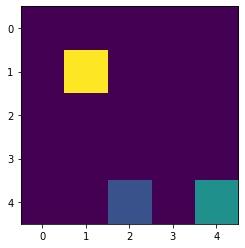

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.8754, 'D': -1.633, 'L': -1.7212, 'R': -1.4351}, (0, 1): {'U': -1.451, 'D': -1.1392, 'L': -1.6321, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.2153}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.498, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L

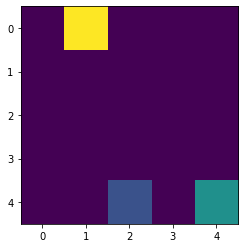

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.8754, 'D': -1.633, 'L': -1.7212, 'R': -1.4351}, (0, 1): {'U': -1.4922, 'D': -1.1392, 'L': -1.6321, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.2153}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.498, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, '

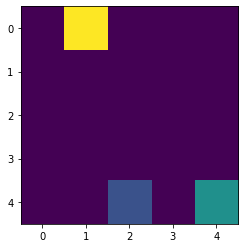

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.8754, 'D': -1.633, 'L': -1.7212, 'R': -1.4351}, (0, 1): {'U': -1.4922, 'D': -1.1392, 'L': -1.7353, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.2153}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.498, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, '

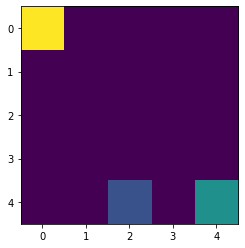

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.8754, 'D': -1.633, 'L': -1.7212, 'R': -1.4794}, (0, 1): {'U': -1.4922, 'D': -1.1392, 'L': -1.7353, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.2153}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.498, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, '

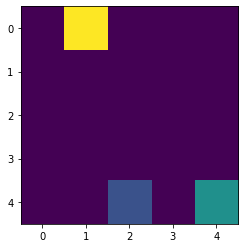

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.8754, 'D': -1.633, 'L': -1.7212, 'R': -1.4794}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.7353, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.2153}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.498, 'R': -0.488}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, '

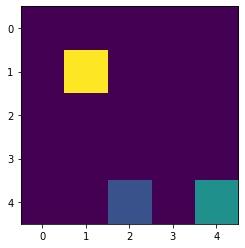

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.8754, 'D': -1.633, 'L': -1.7212, 'R': -1.4794}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.7353, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.2153}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.498, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 

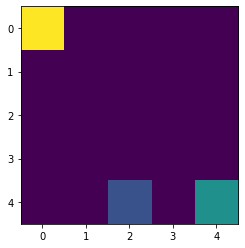

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.8754, 'D': -1.633, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.7353, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.2153}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.498, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, '

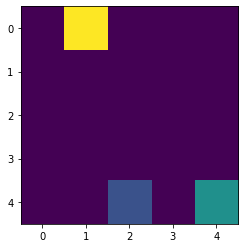

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.8754, 'D': -1.633, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.2153}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.498, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, '

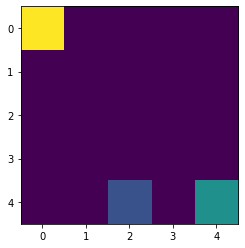

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.633, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.2153}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.498, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, '

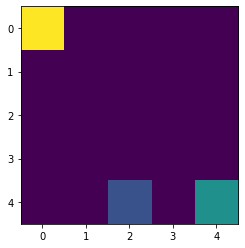

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5226, 'R': -1.2153}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.498, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 

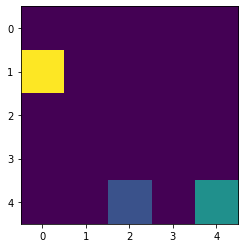

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5942, 'R': -1.2153}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.498, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 

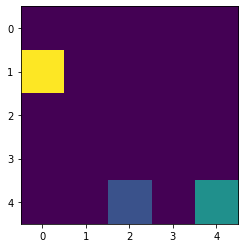

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5942, 'R': -1.2733}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.498, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 

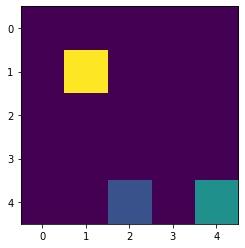

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.5942, 'R': -1.2733}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0,

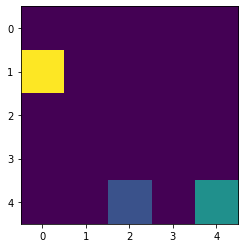

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.2733}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0,

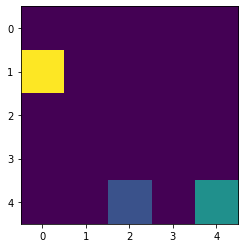

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3197}, (1, 1): {'U': -1.2506, 'D': -0.6723, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0,

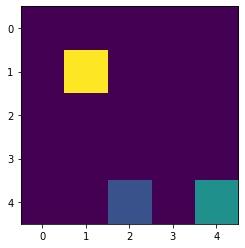

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3197}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.6736, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

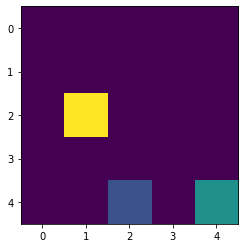

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3197}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.821}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

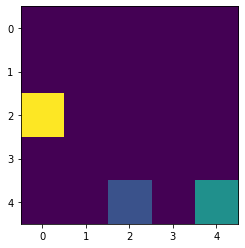

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3197}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.7668, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

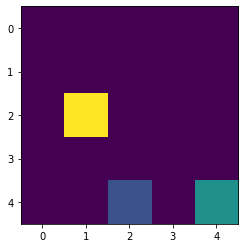

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3197}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

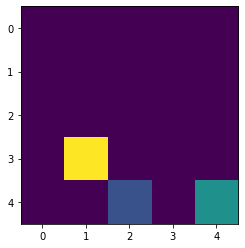

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3197}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

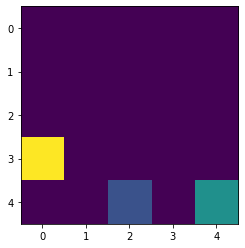

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3197}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

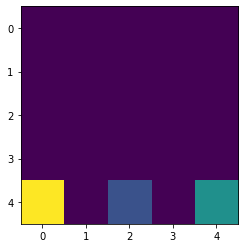

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3197}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

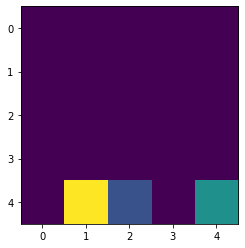

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3197}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

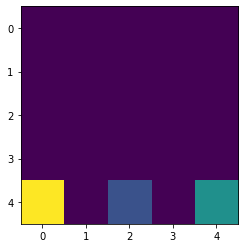

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3197}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

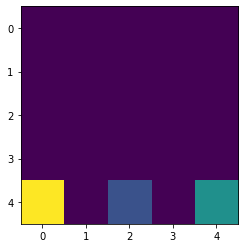

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3197}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

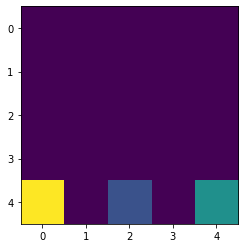

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.9427, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3197}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

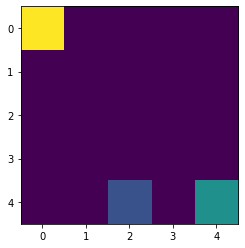

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.6825, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3197}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

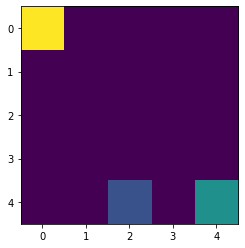

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3197}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

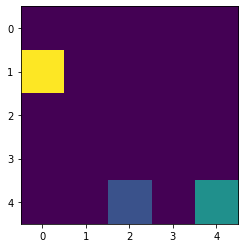

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3568}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.6316}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

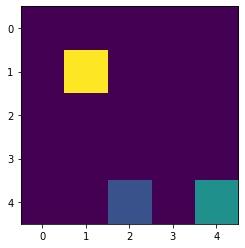

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3568}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.2576, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

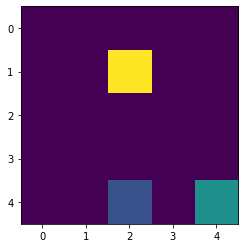

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3568}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.5745, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

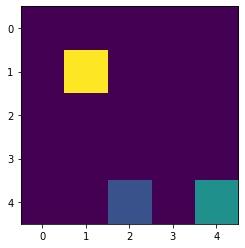

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.3568}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

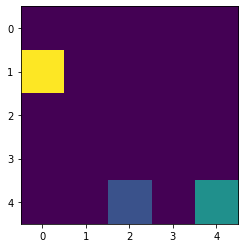

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.7954, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

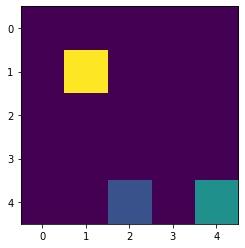

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.8454, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

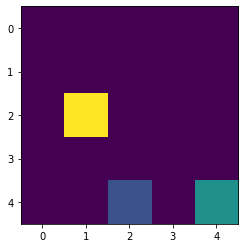

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

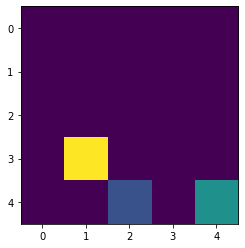

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.8221, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

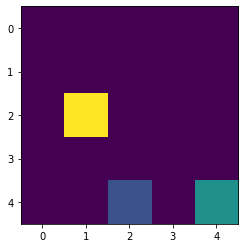

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.0498, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

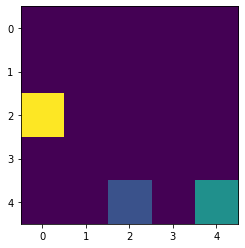

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1007, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

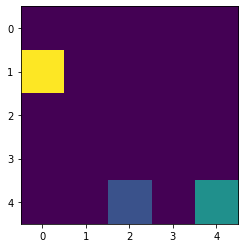

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1638, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.5763, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

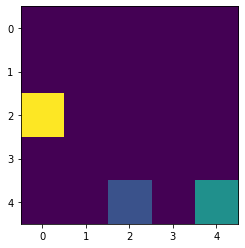

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1638, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9144}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

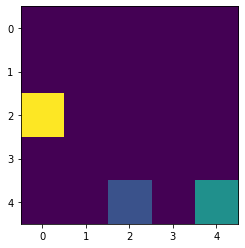

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1638, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.36}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0

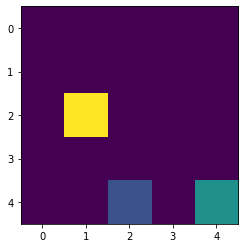

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1638, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.488}, (2, 2): {'U': -0.392, 'D': -0.2, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

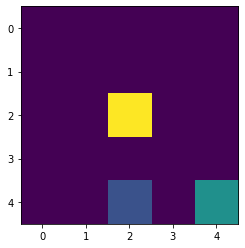

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1638, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.488}, (2, 2): {'U': -0.392, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D':

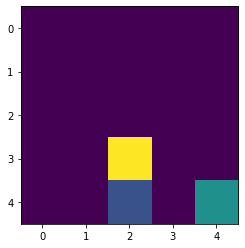

Next state of Agent :  (4, 2)
Reward got :  -3
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1638, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.488}, (2, 2): {'U': -0.392, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D':

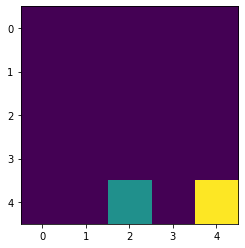

Reward in the end :  -3
Timestep :  19

GAME LOST!!!!
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.7212, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1638, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.488}, (2, 2): {'U': -0.392, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 0, 'L':

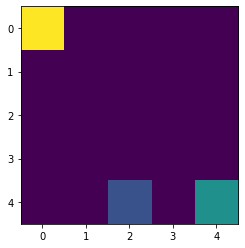

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7221, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1638, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.488}, (2, 2): {'U': -0.392, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

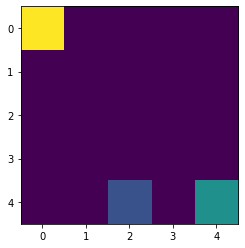

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7639, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8036, 'D': -1.1638, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.488}, (2, 2): {'U': -0.392, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

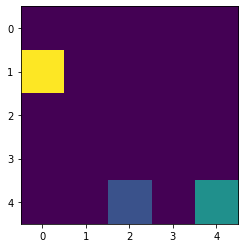

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7639, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.488}, (2, 2): {'U': -0.392, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

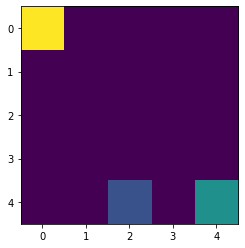

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4049}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.488}, (2, 2): {'U': -0.392, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

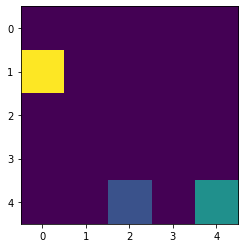

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4434}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6357, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.488}, (2, 2): {'U': -0.392, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

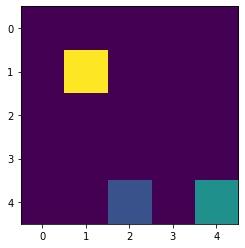

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4434}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.488}, (2, 2): {'U': -0.392, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

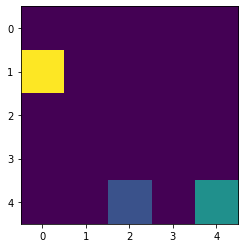

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.8939, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.488}, (2, 2): {'U': -0.392, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

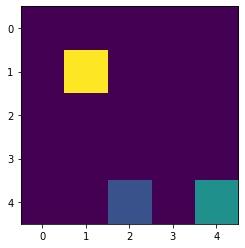

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.488}, (2, 2): {'U': -0.392, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D': 

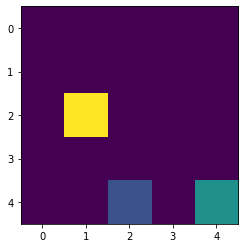

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.392, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D':

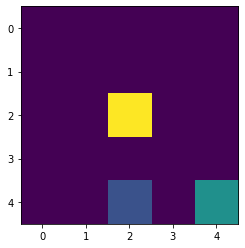

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.6224}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

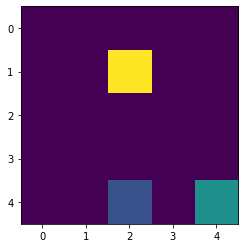

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.36, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

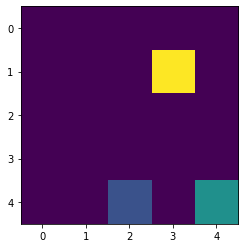

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.392, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

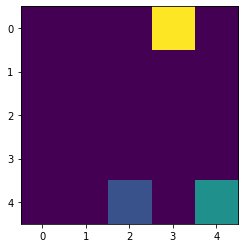

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.7974, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, '

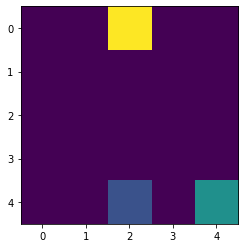

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.4922, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, '

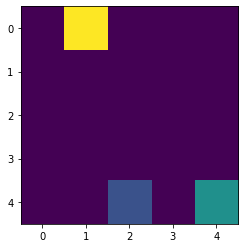

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.5251, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, '

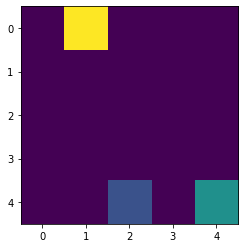

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.5514, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, '

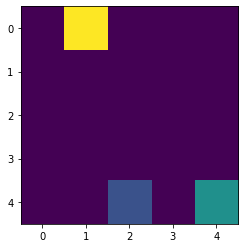

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.5725, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, '

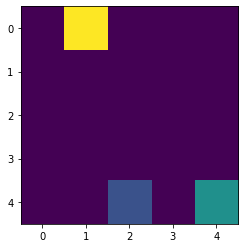

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.8306, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, '

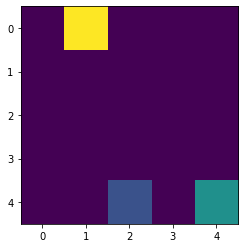

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8193, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, '

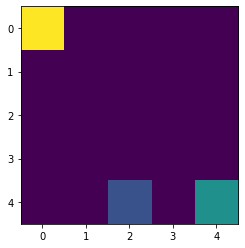

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.7973, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, '

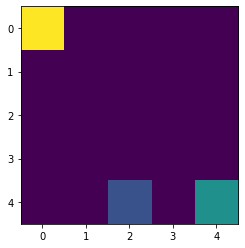

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.6515, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D'

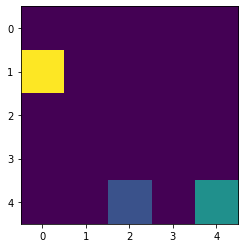

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.1638, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D'

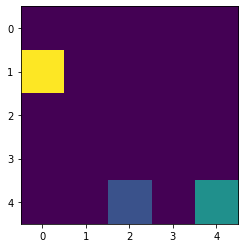

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.52, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D'

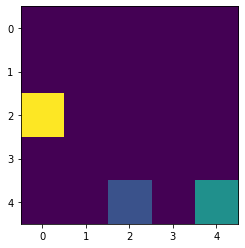

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.648, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

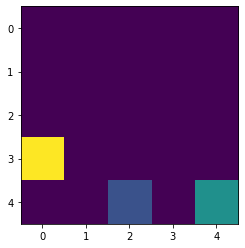

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.648, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

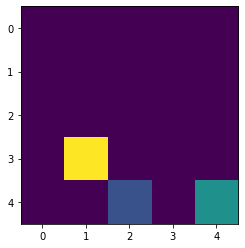

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.648, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -0.9409, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

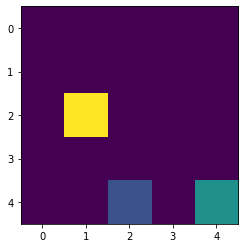

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.648, 'L': -0.7442, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

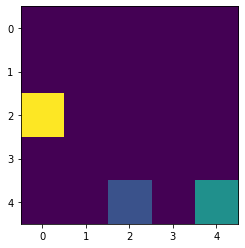

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.648, 'L': -0.899, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D'

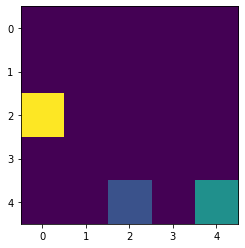

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D'

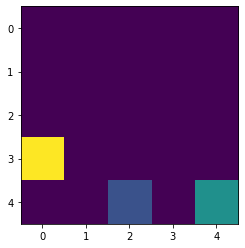

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -0.9891}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

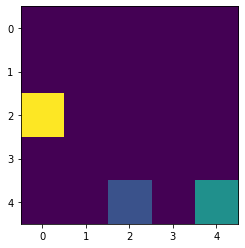

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9083, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

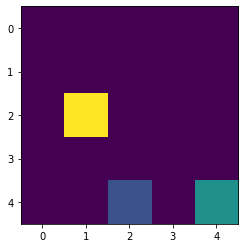

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9586, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

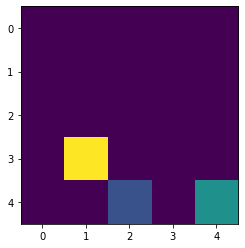

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9586, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

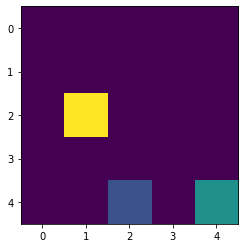

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

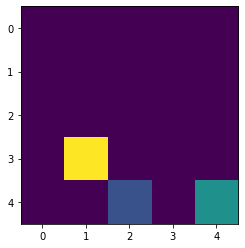

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

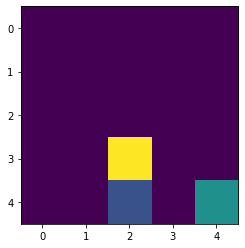

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

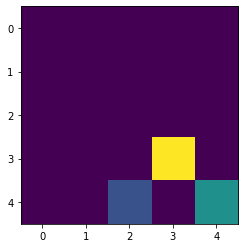

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

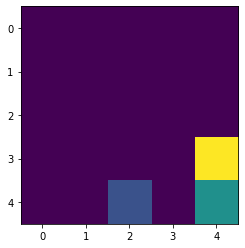

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

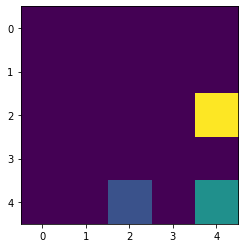

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.232, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 'D

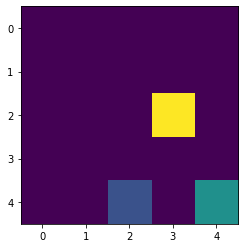

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.824, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, '

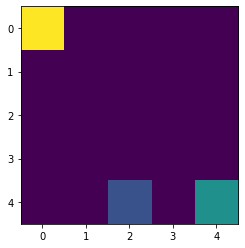

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4742}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, '

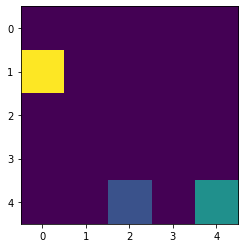

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4988}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.6948, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, '

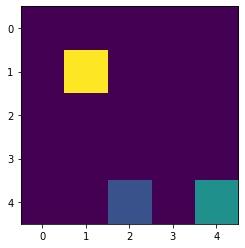

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2142, 'L': -1.7074, 'R': -1.4988}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, '

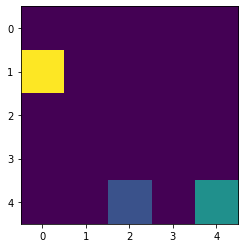

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2955, 'L': -1.7074, 'R': -1.4988}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -0.899, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, '

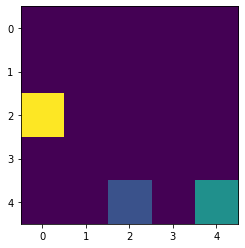

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2955, 'L': -1.7074, 'R': -1.4988}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.776, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2, 

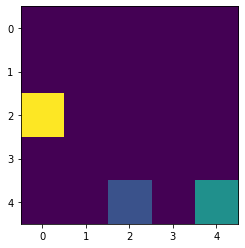

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2955, 'L': -1.7074, 'R': -1.4988}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2,

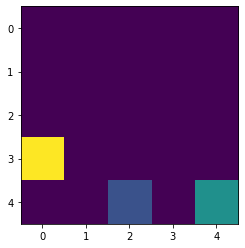

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2955, 'L': -1.7074, 'R': -1.4988}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.216, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2,

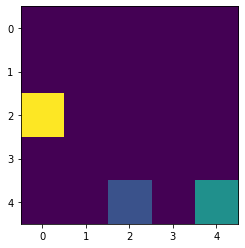

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2955, 'L': -1.7074, 'R': -1.4988}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.3801, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2

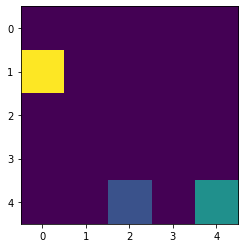

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2955, 'L': -1.7732, 'R': -1.4988}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.3801, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2

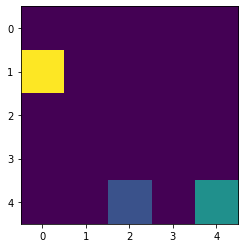

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2955, 'L': -1.7732, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -0.9932, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.3801, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.

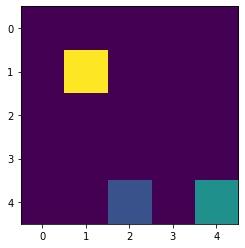

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2955, 'L': -1.7732, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.3801, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.0564, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.

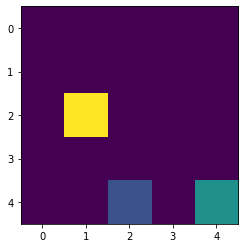

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2955, 'L': -1.7732, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.3801, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.

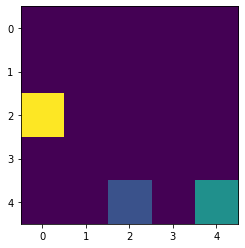

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2955, 'L': -1.7732, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.5114, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.

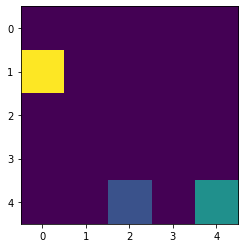

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.2955, 'L': -1.8258, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.5114, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.

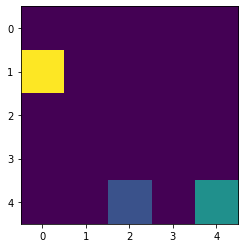

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.3769, 'L': -1.8258, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.5114, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.

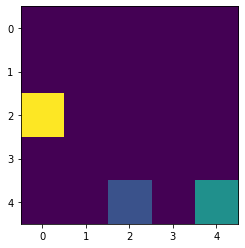

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.3769, 'L': -1.8258, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.6294, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.

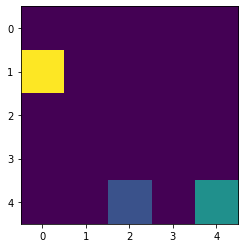

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.4421, 'L': -1.8258, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.6294, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.

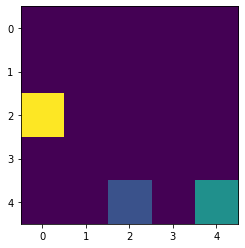

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.4421, 'L': -1.8258, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.

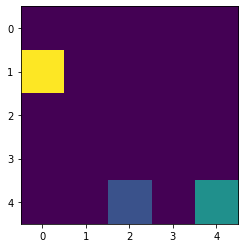

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.4421, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.

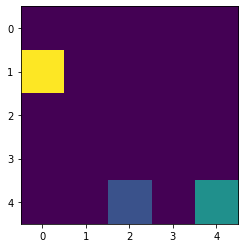

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.8978, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.4942, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.

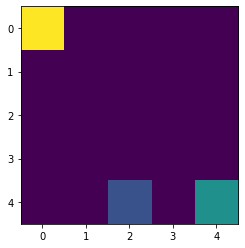

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.8535, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.4942, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2

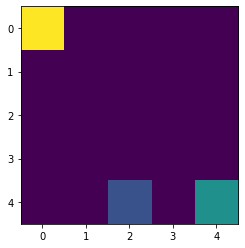

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.4942, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2

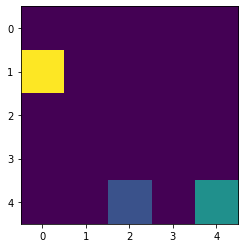

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.0434, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2

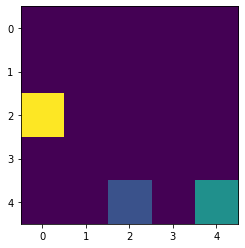

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.1753, 'R': -1.0694}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2

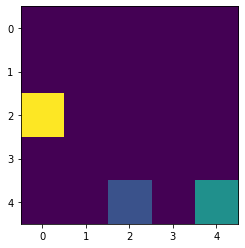

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.1753, 'R': -1.1336}, (2, 1): {'U': -0.488, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2

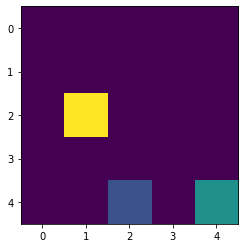

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.7465}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.1753, 'R': -1.1336}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.

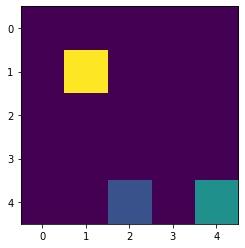

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.2576, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.1753, 'R': -1.1336}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.

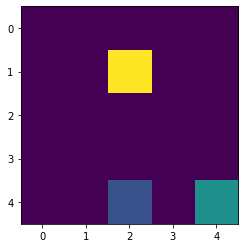

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.36, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.1753, 'R': -1.1336}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.

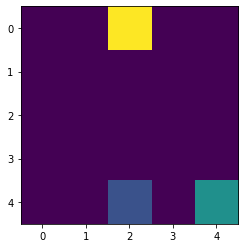

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.36, 'L': -0.5255, 'R': -0.7299}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.1753, 'R': -1.1336}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -

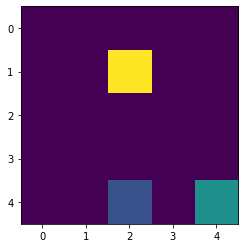

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.36, 'L': -0.5255, 'R': -0.8159}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.2, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.1753, 'R': -1.1336}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': 

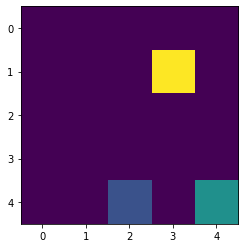

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.36, 'L': -0.5255, 'R': -0.8159}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.4176, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.1753, 'R': -1.1336}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U

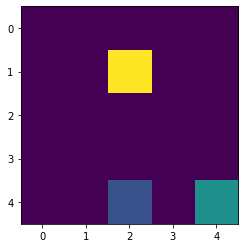

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.36, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.4176, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.1753, 'R': -1.1336}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U

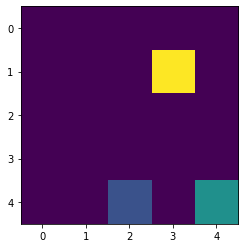

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.36, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.1753, 'R': -1.1336}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U

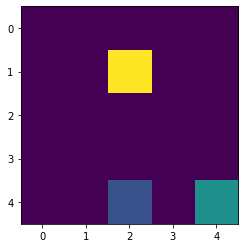

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.1753, 'R': -1.1336}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.232, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

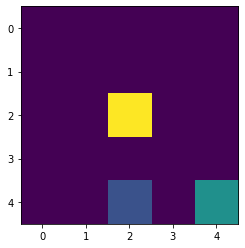

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.1753, 'R': -1.1336}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.1857, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

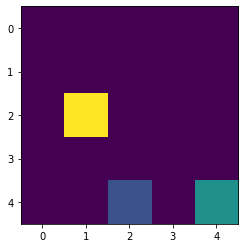

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.1753, 'R': -1.1336}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.2891, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

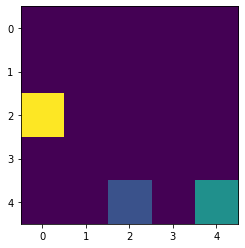

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.2808, 'R': -1.1336}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.2891, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

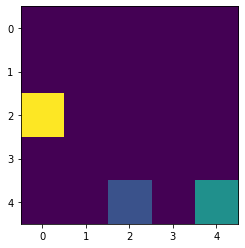

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.2891, 'R': -0.5904}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

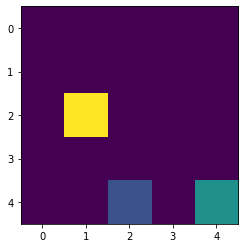

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.2891, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': 0}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

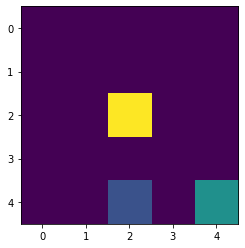

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -1.9965, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.2891, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4)

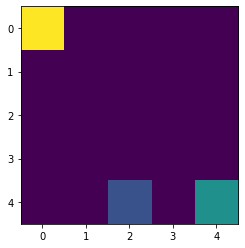

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.0396, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.2891, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4):

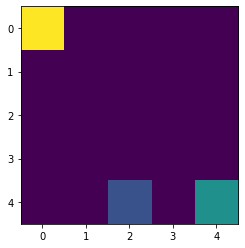

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -1.9219, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.2891, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4):

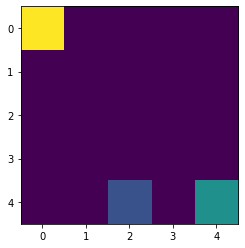

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -1.9805, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5185}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.2891, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4):

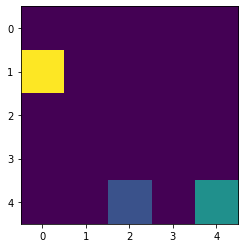

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -1.9805, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.2506, 'D': -1.0726, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.2891, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4):

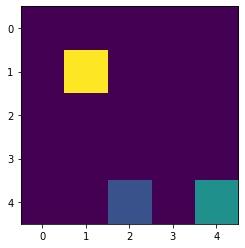

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -1.9805, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.2506, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.2891, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4):

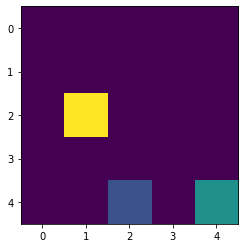

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -1.9805, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.2506, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.7343, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4):

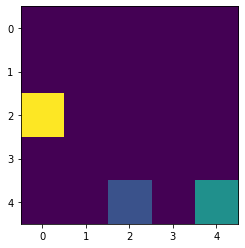

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -1.9805, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.8853, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.2506, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4):

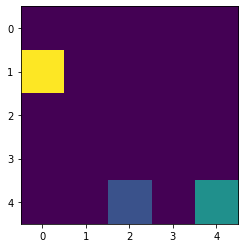

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -1.9805, 'L': -1.9606, 'R': -1.5149}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.9506, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.2506, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4):

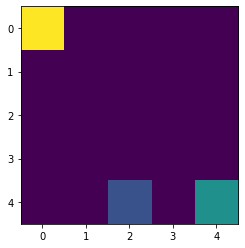

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -1.9805, 'L': -1.9606, 'R': -1.5433}, (0, 1): {'U': -1.5894, 'D': -1.1894, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.9506, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.2506, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4):

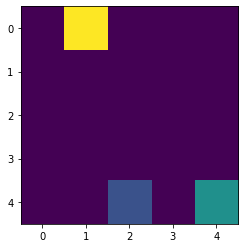

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -1.9805, 'L': -1.9606, 'R': -1.5433}, (0, 1): {'U': -1.5894, 'D': -1.2857, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.9506, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.2506, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4)

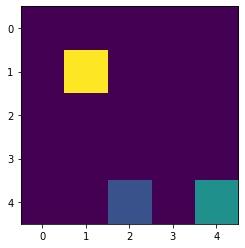

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -1.9805, 'L': -1.9606, 'R': -1.5433}, (0, 1): {'U': -1.5894, 'D': -1.2857, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.9506, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4)

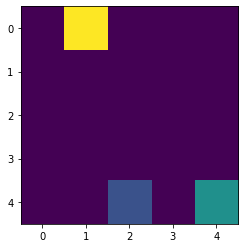

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -1.9805, 'L': -1.9606, 'R': -1.5433}, (0, 1): {'U': -1.6029, 'D': -1.2857, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.9506, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4)

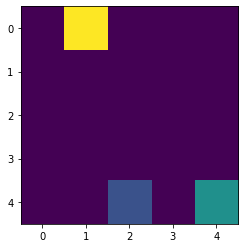

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -1.9805, 'L': -1.9606, 'R': -1.5433}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -1.9069, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.9506, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4)

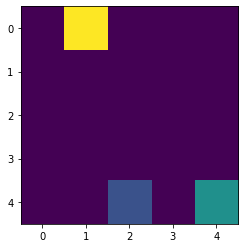

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -1.9805, 'L': -1.9606, 'R': -1.5433}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -1.9724, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.9506, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4)

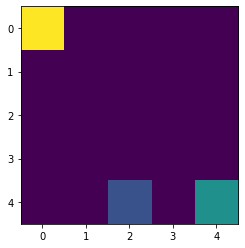

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -2.0301, 'L': -1.9606, 'R': -1.5433}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -1.9724, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -1.9506, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4)

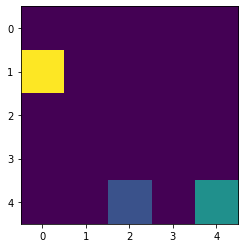

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.0741, 'D': -2.0301, 'L': -1.9606, 'R': -1.5433}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -1.9724, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4)

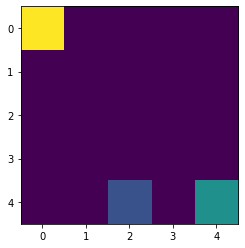

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.1062, 'D': -2.0301, 'L': -1.9606, 'R': -1.5433}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -1.9724, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4)

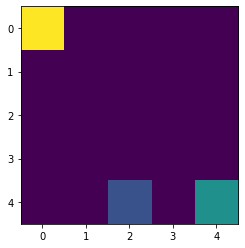

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.1319, 'D': -2.0301, 'L': -1.9606, 'R': -1.5433}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -1.9724, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4)

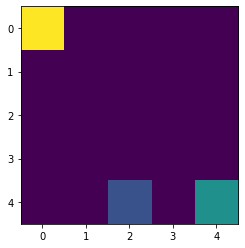

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.1319, 'D': -2.0301, 'L': -2.0154, 'R': -1.5433}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -1.9724, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4)

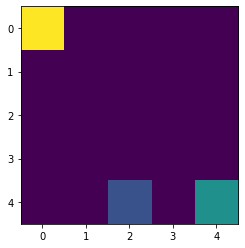

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.1319, 'D': -2.0301, 'L': -2.0592, 'R': -1.5433}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -1.9724, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4)

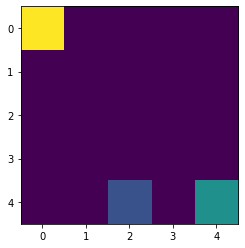

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0301, 'L': -2.0592, 'R': -1.5433}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -1.9724, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4):

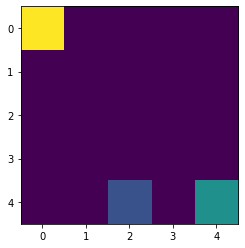

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0301, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -1.9724, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

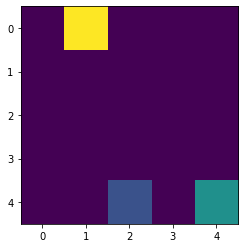

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0301, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

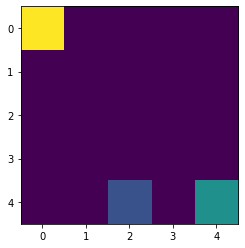

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5359, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

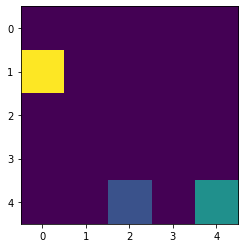

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.2808, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

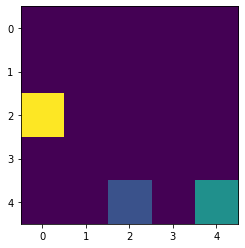

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.3652, 'R': -1.2013}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

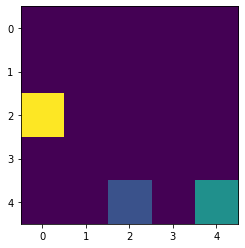

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.3652, 'R': -1.2686}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.3718, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

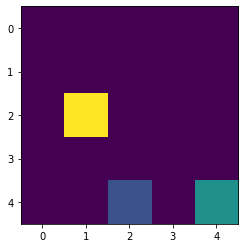

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.3652, 'R': -1.2686}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

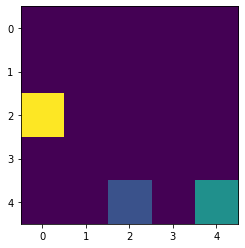

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.8784, 'L': -1.4327, 'R': -1.2686}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

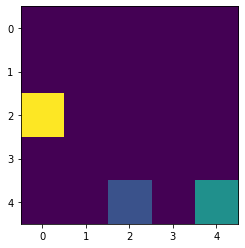

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4327, 'R': -1.2686}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

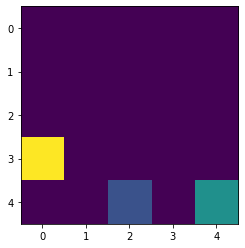

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4327, 'R': -1.2686}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

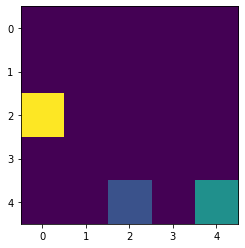

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4327, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -0.9989, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

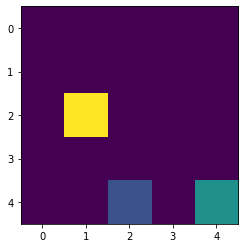

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4327, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.0567, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

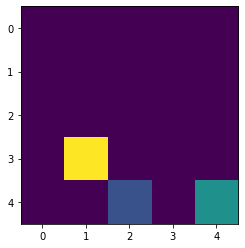

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4327, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.0567, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

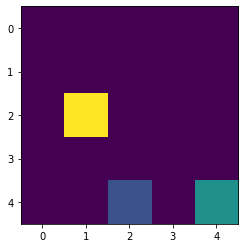

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4327, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

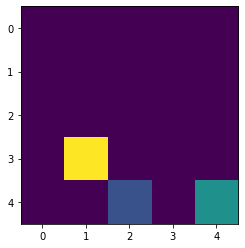

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4327, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

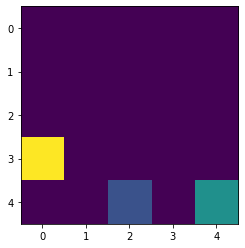

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4327, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

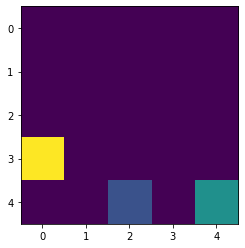

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4327, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

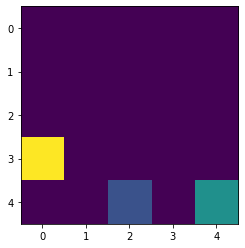

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4327, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

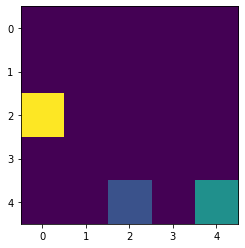

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0592, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4998, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

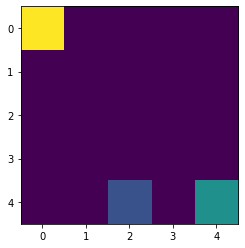

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.0979, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4998, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

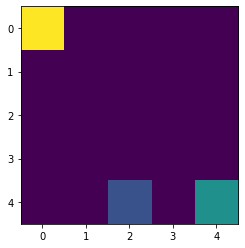

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.0698, 'L': -2.1289, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4998, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

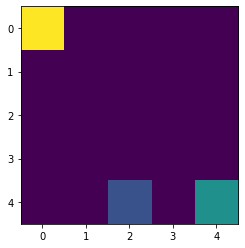

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1037, 'L': -2.1289, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.5693, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4998, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

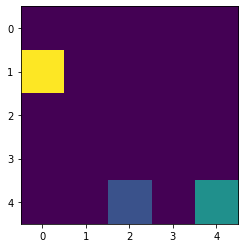

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1037, 'L': -2.1289, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.6091, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.4998, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

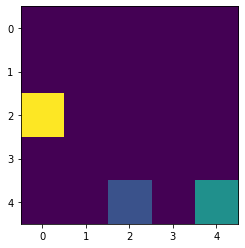

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1037, 'L': -2.1289, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.6091, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.5535, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

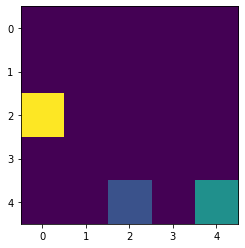

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1037, 'L': -2.1289, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.6091, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -0.9603, 'L': -1.5964, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

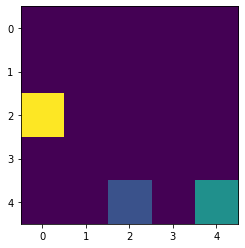

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1037, 'L': -2.1289, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.6091, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -1.0258, 'L': -1.5964, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

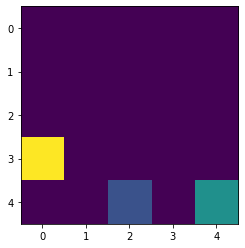

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1037, 'L': -2.1289, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.6091, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -1.0258, 'L': -1.5964, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

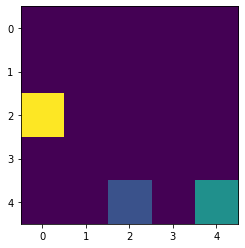

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1037, 'L': -2.1289, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.6091, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.8332, 'D': -1.0258, 'L': -1.6412, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

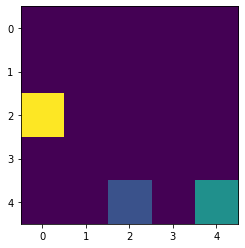

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1037, 'L': -2.1289, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0074, 'D': -1.6091, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9144, 'D': -1.0258, 'L': -1.6412, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

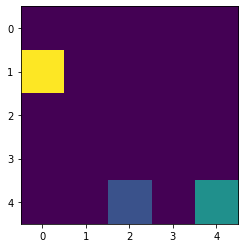

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1037, 'L': -2.1289, 'R': -1.566}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0565, 'D': -1.6091, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9144, 'D': -1.0258, 'L': -1.6412, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

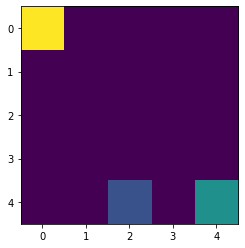

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1037, 'L': -2.1289, 'R': -1.5842}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0285, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0565, 'D': -1.6091, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9144, 'D': -1.0258, 'L': -1.6412, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

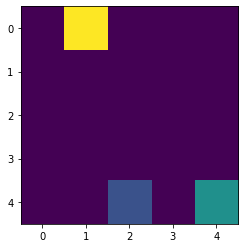

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1037, 'L': -2.1289, 'R': -1.5842}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0763, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0565, 'D': -1.6091, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9144, 'D': -1.0258, 'L': -1.6412, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

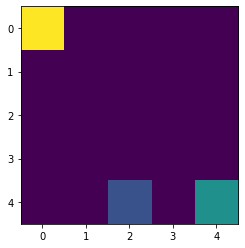

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1308, 'L': -2.1289, 'R': -1.5842}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0763, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0565, 'D': -1.6091, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9144, 'D': -1.0258, 'L': -1.6412, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

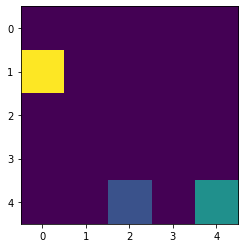

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1308, 'L': -2.1289, 'R': -1.5842}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0763, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0987, 'D': -1.6091, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9144, 'D': -1.0258, 'L': -1.6412, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

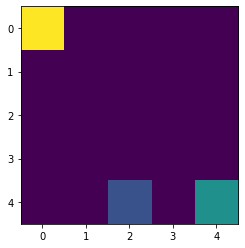

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1525, 'L': -2.1289, 'R': -1.5842}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0763, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0987, 'D': -1.6091, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9144, 'D': -1.0258, 'L': -1.6412, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

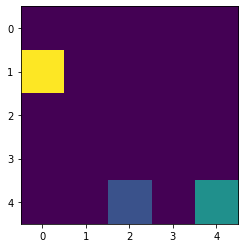

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1525, 'L': -2.1289, 'R': -1.5842}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0763, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0987, 'D': -1.6514, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9144, 'D': -1.0258, 'L': -1.6412, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

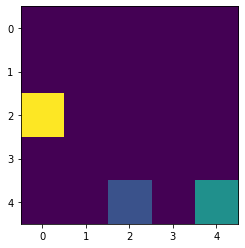

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1525, 'L': -2.1289, 'R': -1.5842}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0763, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0987, 'D': -1.6514, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9144, 'D': -1.0258, 'L': -1.6771, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

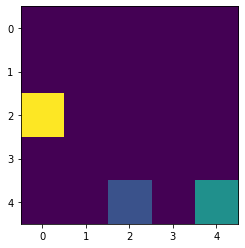

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1525, 'L': -2.1289, 'R': -1.5842}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0763, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0987, 'D': -1.6514, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9144, 'D': -1.0258, 'L': -1.7058, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

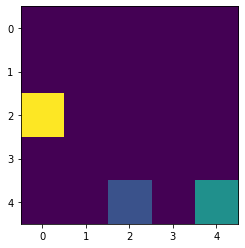

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1525, 'L': -2.1289, 'R': -1.5842}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0763, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0987, 'D': -1.6514, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9144, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

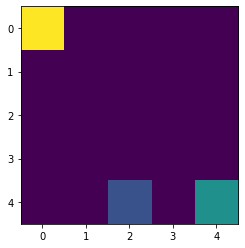

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1698, 'L': -2.1289, 'R': -1.5842}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0763, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0987, 'D': -1.6514, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9144, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

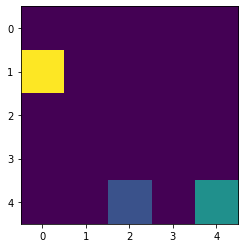

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1698, 'L': -2.1289, 'R': -1.5842}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0763, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0987, 'D': -1.6852, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9144, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

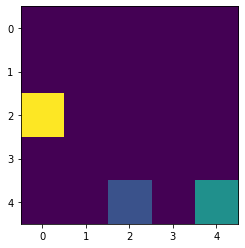

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1698, 'L': -2.1289, 'R': -1.5842}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0763, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0987, 'D': -1.6852, 'L': -1.8914, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

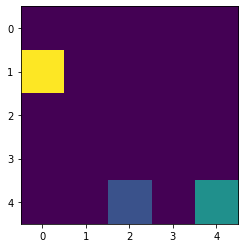

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1698, 'L': -2.1289, 'R': -1.5842}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0763, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.0987, 'D': -1.6852, 'L': -1.9609, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

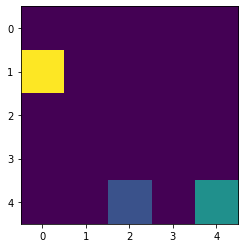

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1698, 'L': -2.1289, 'R': -1.5842}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0763, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

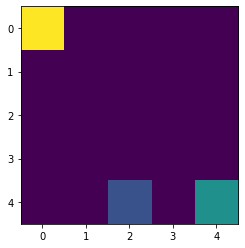

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1698, 'L': -2.1289, 'R': -1.5987}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.0763, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

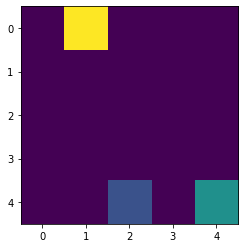

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.1524, 'D': -2.1698, 'L': -2.1289, 'R': -1.5987}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1168, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

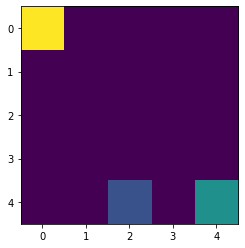

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.1777, 'D': -2.1698, 'L': -2.1289, 'R': -1.5987}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1168, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

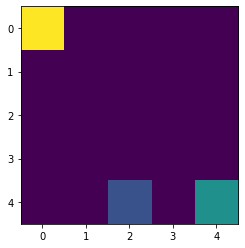

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.1777, 'D': -2.1698, 'L': -2.1289, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1168, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

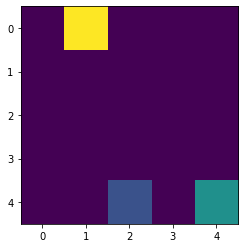

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.1777, 'D': -2.1698, 'L': -2.1289, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

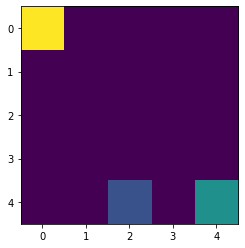

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.1777, 'D': -2.1837, 'L': -2.1289, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5489}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

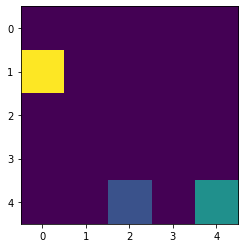

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.1777, 'D': -2.1837, 'L': -2.1289, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.1656, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): 

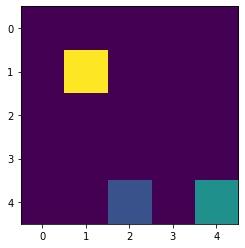

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.1777, 'D': -2.1837, 'L': -2.1289, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.438, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

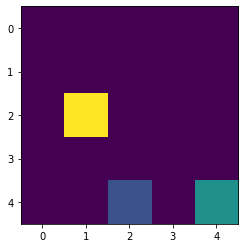

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.1777, 'D': -2.1837, 'L': -2.1289, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3224}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

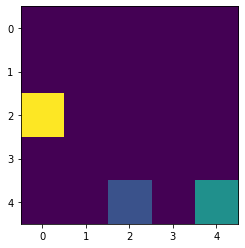

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.1777, 'D': -2.1837, 'L': -2.1289, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.103, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

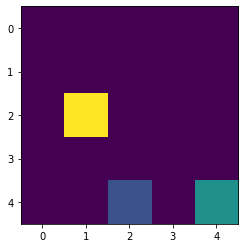

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.1777, 'D': -2.1837, 'L': -2.1289, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

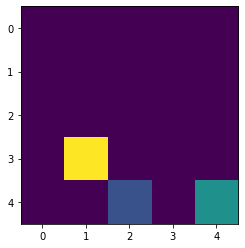

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.1777, 'D': -2.1837, 'L': -2.1289, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

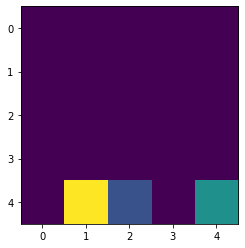

Next state of Agent :  (4, 2)
Reward got :  -3
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.1777, 'D': -2.1837, 'L': -2.1289, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

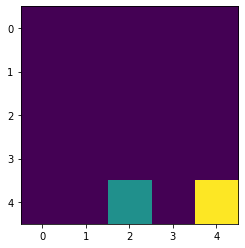

Reward in the end :  -3
Timestep :  19

GAME LOST!!!!
..................................................

Q-Table 

{(0, 0): {'U': -2.1777, 'D': -2.1837, 'L': -2.1289, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U': -0.2

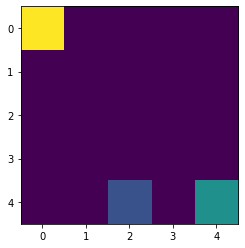

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.1998, 'D': -2.1837, 'L': -2.1289, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U

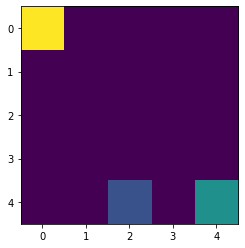

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.2175, 'D': -2.1837, 'L': -2.1289, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U

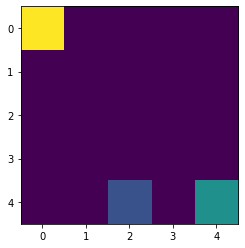

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.2175, 'D': -2.1837, 'L': -2.1608, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U

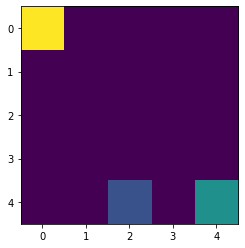

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6103}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U

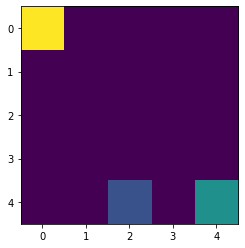

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6137, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U

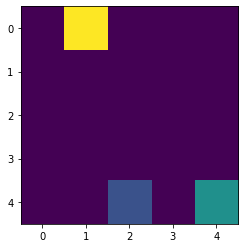

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6223, 'D': -1.2857, 'L': -2.1511, 'R': -0.821}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U

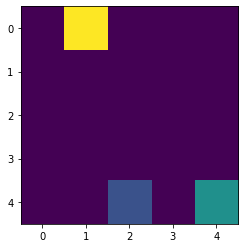

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6223, 'D': -1.2857, 'L': -2.1511, 'R': -0.9349}, (0, 2): {'U': -0.5904, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

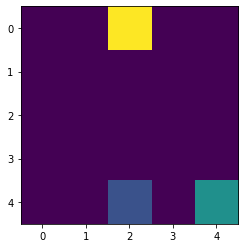

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6223, 'D': -1.2857, 'L': -2.1511, 'R': -0.9349}, (0, 2): {'U': -0.7504, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

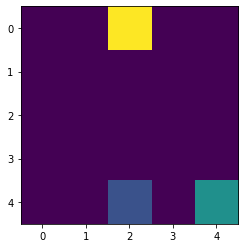

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6223, 'D': -1.2857, 'L': -2.1511, 'R': -0.9349}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -0.9693, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

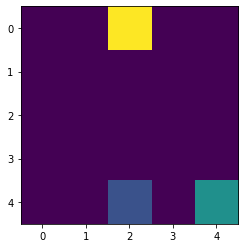

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6223, 'D': -1.2857, 'L': -2.1511, 'R': -0.9349}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

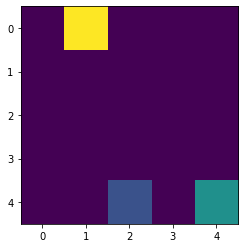

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6474, 'D': -1.2857, 'L': -2.1511, 'R': -0.9349}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

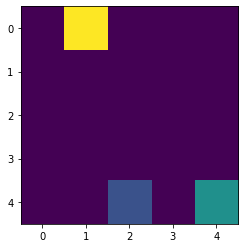

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1511, 'R': -0.9349}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

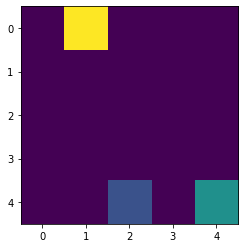

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1511, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.488}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'U

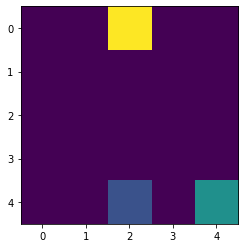

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1511, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.488, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

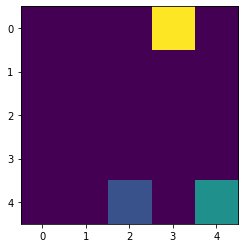

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1511, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.36, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {'

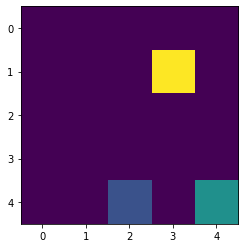

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1511, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': 0, 'L': 0, 'R': -0.2}, (2, 4): {

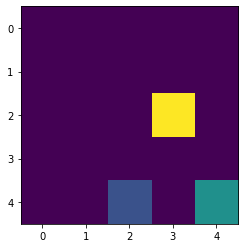

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1511, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4)

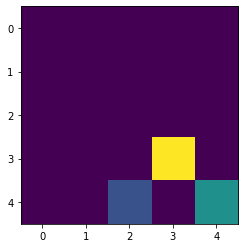

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1511, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.4176, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4)

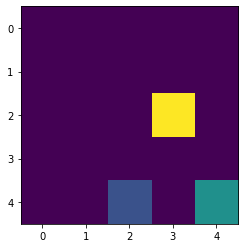

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1511, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.5917, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4)

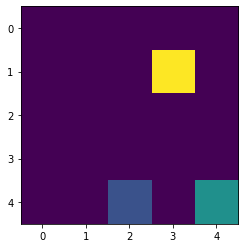

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.2316, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1511, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4)

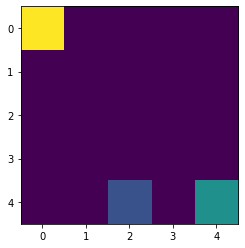

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.1837, 'L': -2.1608, 'R': -1.6196}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1511, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4):

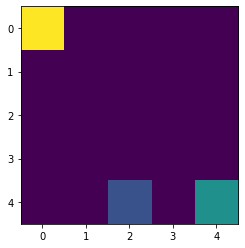

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.1837, 'L': -2.1608, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1511, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4):

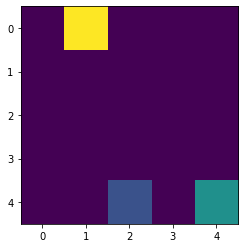

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.1837, 'L': -2.1608, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4):

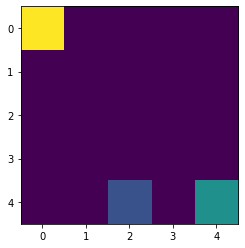

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.1987, 'L': -2.1608, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1324, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4):

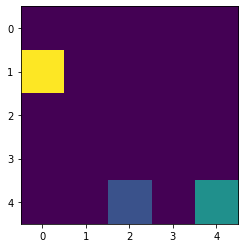

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.1987, 'L': -2.1608, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4):

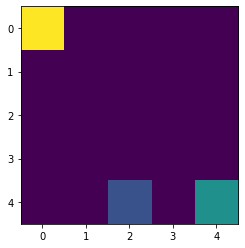

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.1987, 'L': -2.1942, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4):

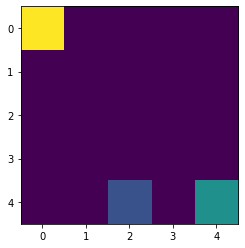

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.1987, 'L': -2.2209, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4):

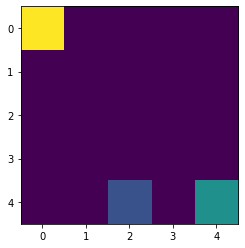

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.1987, 'L': -2.2423, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4):

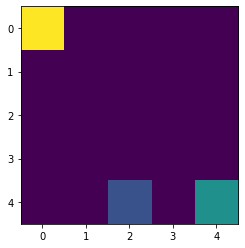

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5733}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4):

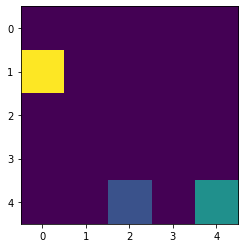

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.8384}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4)

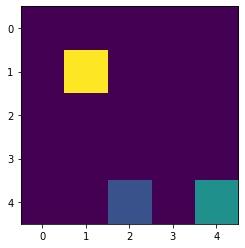

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.4637, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4)

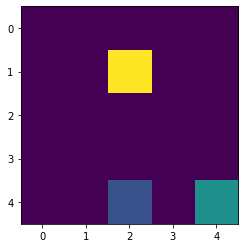

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.026}, (0, 2): {'U': -0.8784, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.6583, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4)

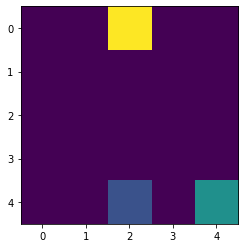

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.026}, (0, 2): {'U': -0.99, 'D': -0.5456, 'L': -1.125, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.6583, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4): 

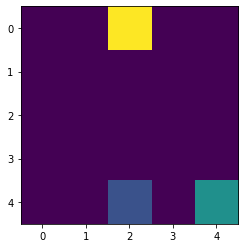

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.026}, (0, 2): {'U': -0.99, 'D': -0.5456, 'L': -1.2642, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.6583, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4):

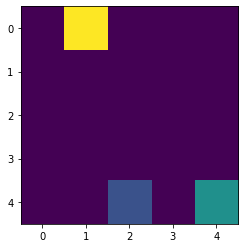

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1081}, (0, 2): {'U': -0.99, 'D': -0.5456, 'L': -1.2642, 'R': -0.6224}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.6583, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4)

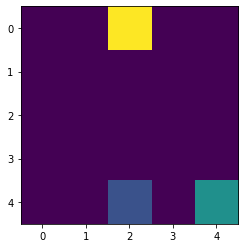

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1081}, (0, 2): {'U': -0.99, 'D': -0.5456, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.648, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.6583, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4)

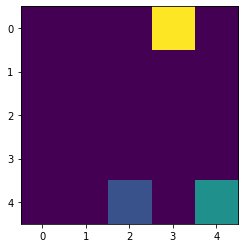

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1081}, (0, 2): {'U': -0.99, 'D': -0.5456, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.6583, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.6224}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4

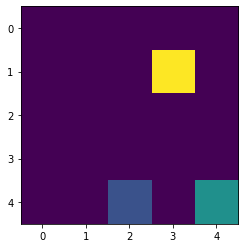

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1081}, (0, 2): {'U': -0.99, 'D': -0.5456, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.6583, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.7299}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.5456, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4

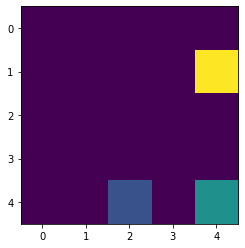

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1081}, (0, 2): {'U': -0.99, 'D': -0.5456, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.6583, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.7299}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4

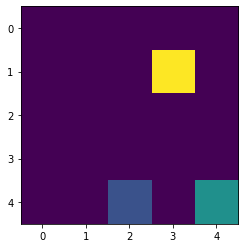

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.6598}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1081}, (0, 2): {'U': -0.99, 'D': -0.5456, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.6583, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4

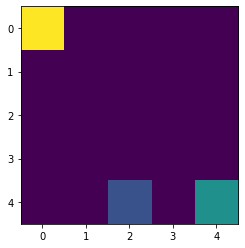

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1081}, (0, 2): {'U': -0.99, 'D': -0.5456, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.6583, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4)

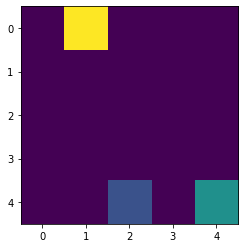

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.5456, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.6583, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4)

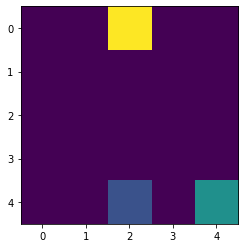

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.7146, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.6583, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4)

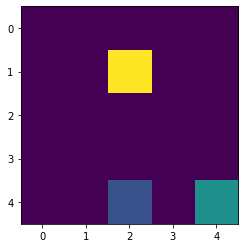

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.7146, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4):

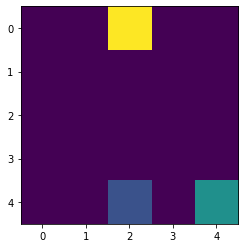

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.488, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4):

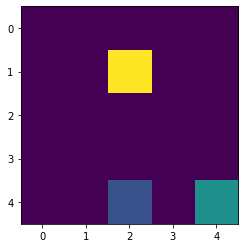

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.2}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4)

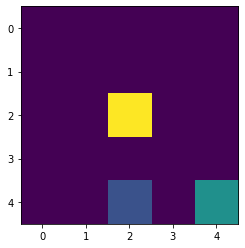

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.6122, 'D': -0.2, 'L': 0, 'R': -0.2}, (2, 4

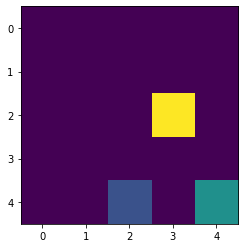

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.6122, 'D': -0.36, 'L': 0, 'R': -0.2}, (2, 

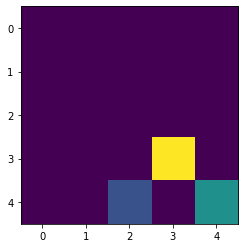

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.6122, 'D': -0.36, 'L': 0, 'R': -0.2}, (2, 

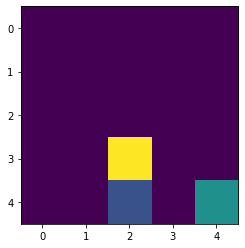

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.6122, 'D': -0.36, 'L': 0, 'R': -0.2}, (2,

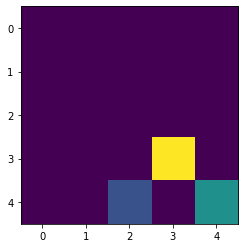

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.6122, 'D': -0.36, 'L': 0, 'R': -0.2}, (2,

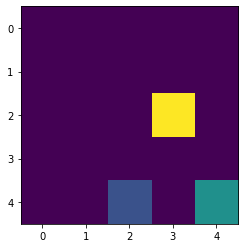

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.488, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.7678, 'D': -0.36, 'L': 0, 'R': -0.2}, (2,

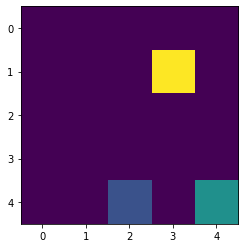

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.7678, 'D': -0.36, 'L': 0, 'R': -0.2}, (2

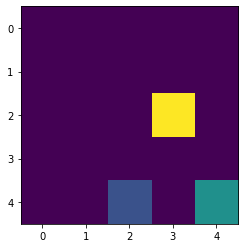

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.7476, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, (2

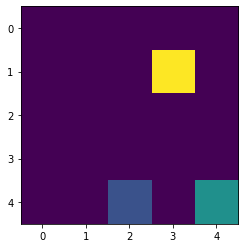

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.5255, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, (2

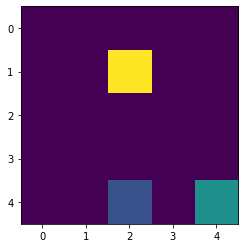

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.24, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.7716, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, (2

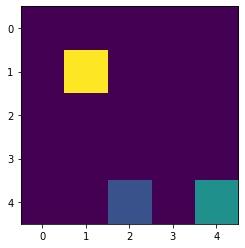

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.7716, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.6723}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, 

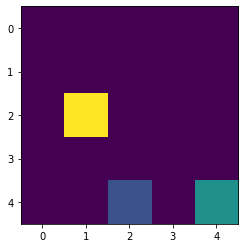

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.7716, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.36, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, 

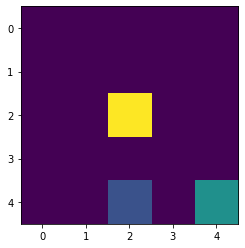

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.7716, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2},

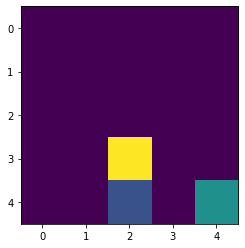

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2107, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.7716, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2},

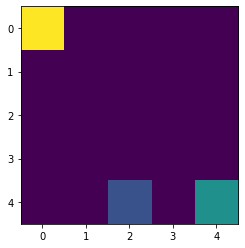

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.6852, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.7716, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, 

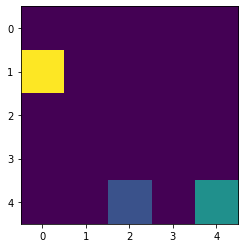

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.7716, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.3655}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, 

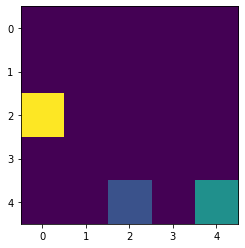

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.7716, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.7098, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, (

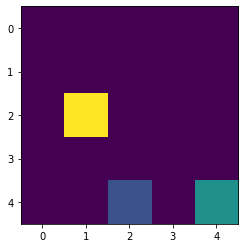

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.7501, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.7716, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, (2

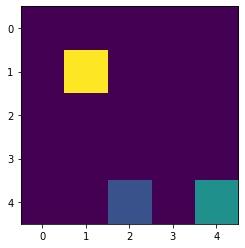

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.5928}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.7716, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, (2

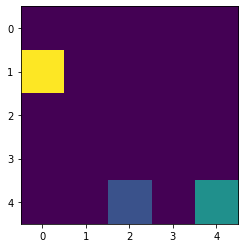

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -0.9449}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.7716, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, (2

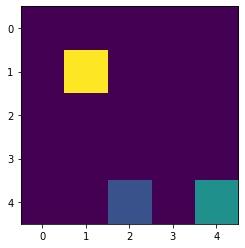

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.0555}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.7716, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, (2

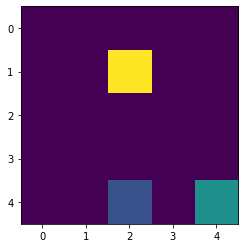

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.0555}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, (2

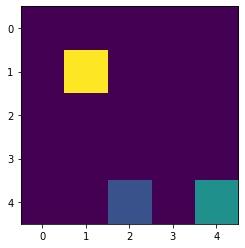

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.841, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, (2,

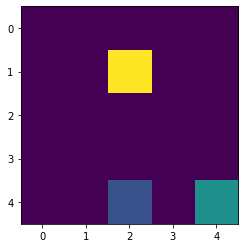

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.7299}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, (

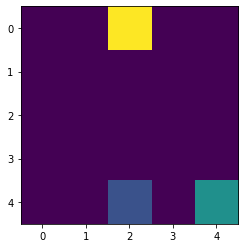

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.2}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, (

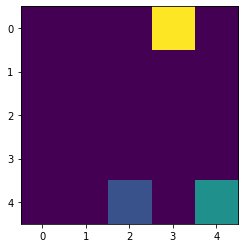

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.36}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.2, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}, 

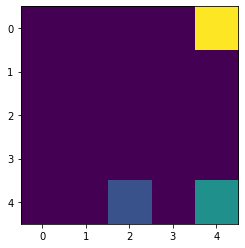

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.36}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.392, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}

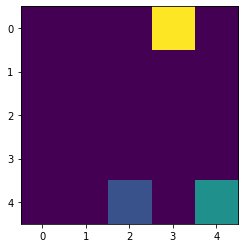

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.232, 'L': -0.392, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2

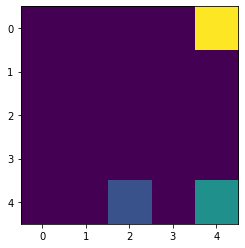

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.392, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.2, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.

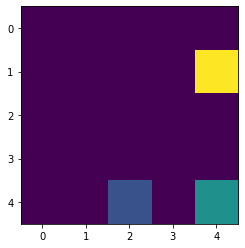

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.392, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0

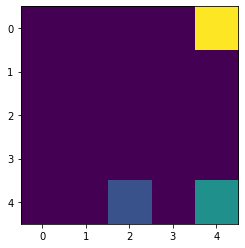

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.2, 'D': -0.7965, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -

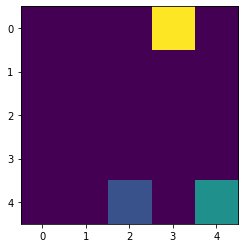

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.7965, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R':

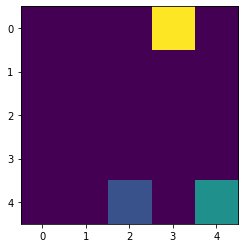

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8159}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R':

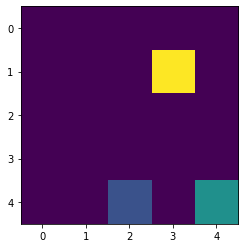

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7051}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R':

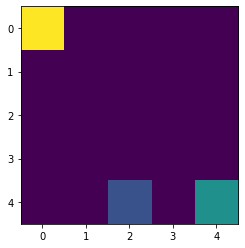

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.2857, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': 

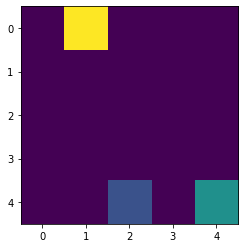

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.2996, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': 

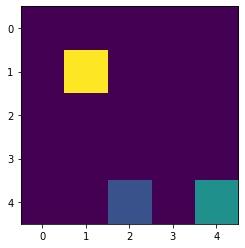

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.14, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': 

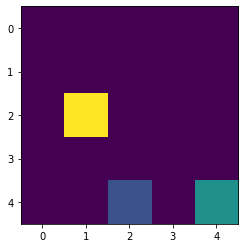

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R'

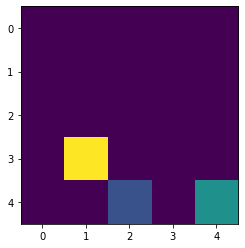

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R'

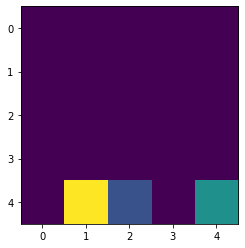

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R'

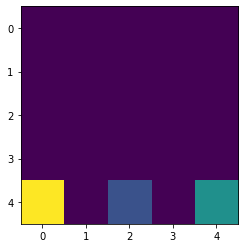

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R'

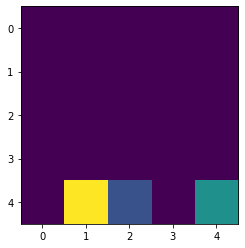

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R'

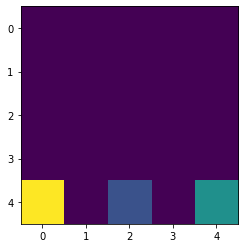

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R'

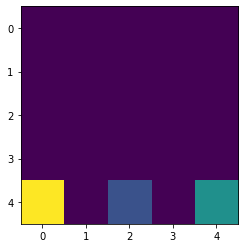

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

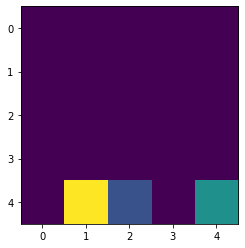

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

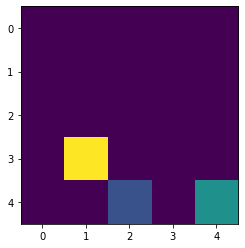

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

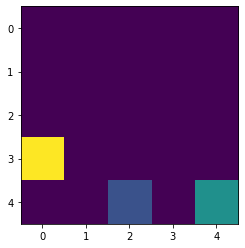

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0258, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

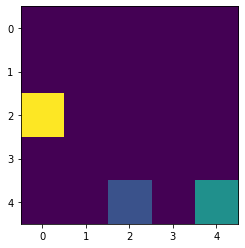

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

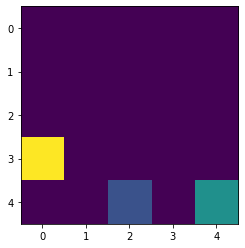

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

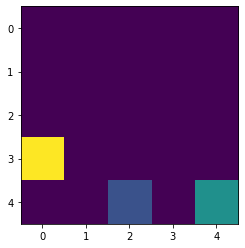

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

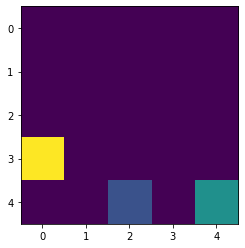

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

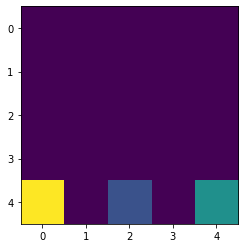

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

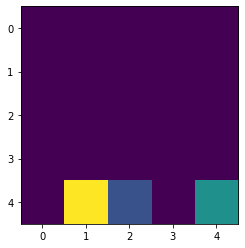

Next state of Agent :  (4, 2)
Reward got :  -3
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

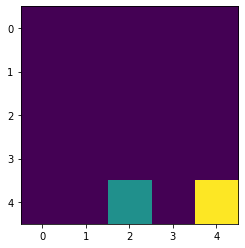

Reward in the end :  -3
Timestep :  20

GAME LOST!!!!
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2234, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R': -0.2}

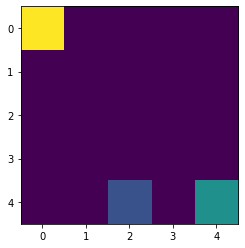

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6254}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R'

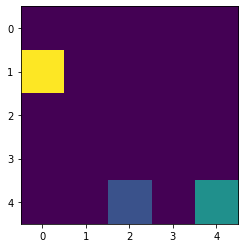

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.144}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R'

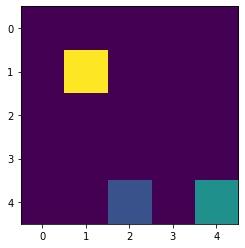

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.6224, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

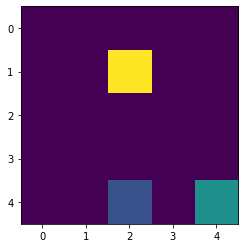

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.5548, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

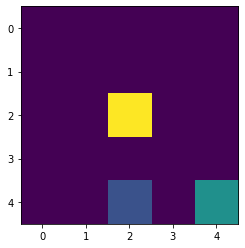

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -0.9862, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.7647, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

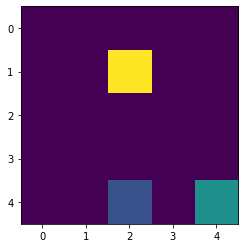

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.8549, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.7647, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

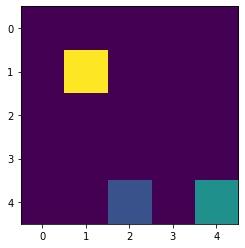

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -1.9609, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.7647, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

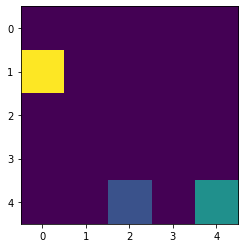

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.1715, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.7647, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

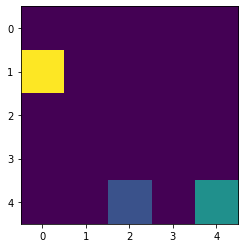

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7519}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.7647, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 'R

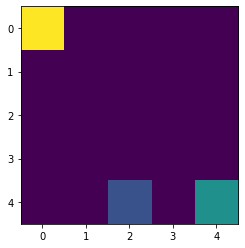

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7893}, (0, 1): {'U': -1.6675, 'D': -1.4116, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.7647, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, '

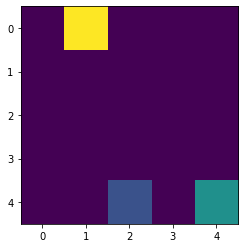

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7893}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.3669, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.7647, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, '

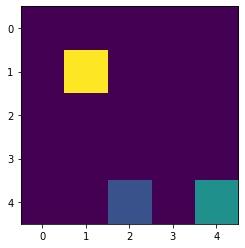

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7893}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.7954}, (2, 2): {'U': -0.7647, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, '

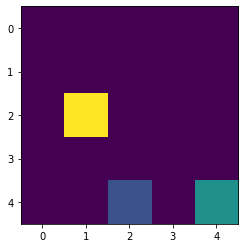

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7893}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.7647, 'D': -0.488, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, '

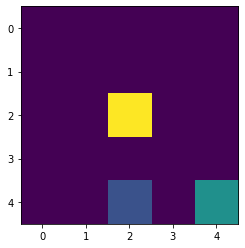

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7893}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.7647, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 

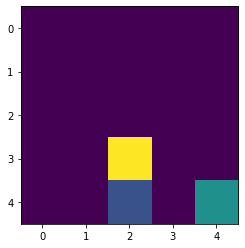

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7893}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.7647, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 

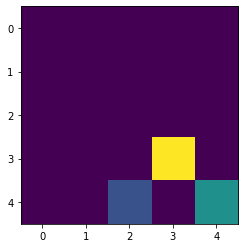

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7893}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.7647, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 0, 

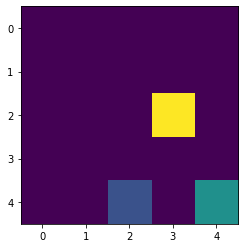

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7893}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.7647, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': -0.

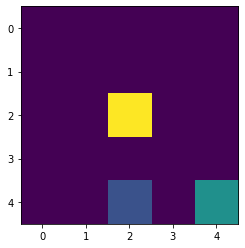

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7893}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -0.9103}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': -0.

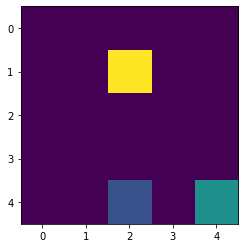

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7893}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.0114}, (1, 3): {'U': -0.52, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': -0.

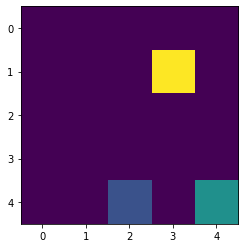

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.7893}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.0114}, (1, 3): {'U': -0.6787, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': -

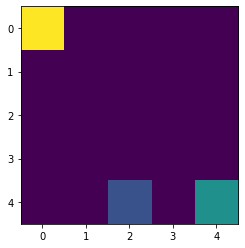

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.8192}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.1864, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.0114}, (1, 3): {'U': -0.6787, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': -0

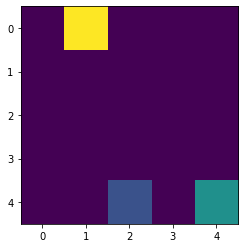

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.2444, 'D': -2.2388, 'L': -2.2423, 'R': -1.8192}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.2402, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.0114}, (1, 3): {'U': -0.6787, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': -0

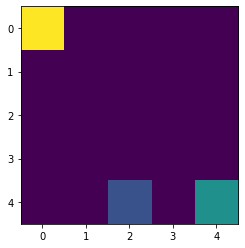

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2423, 'R': -1.8192}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.2402, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.0114}, (1, 3): {'U': -0.6787, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': -0

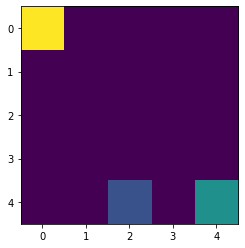

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8192}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.2402, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.0114}, (1, 3): {'U': -0.6787, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': -0

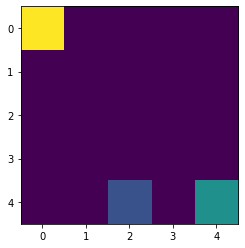

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.5236, 'L': -2.2402, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.0114}, (1, 3): {'U': -0.6787, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': -0

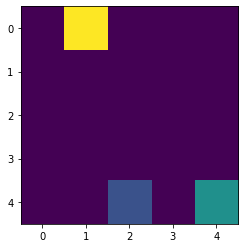

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.3318, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.0114}, (1, 3): {'U': -0.6787, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': -0

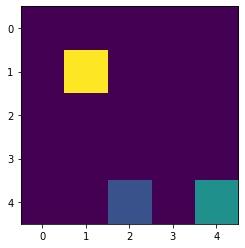

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.1738}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.0114}, (1, 3): {'U': -0.6787, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': -0

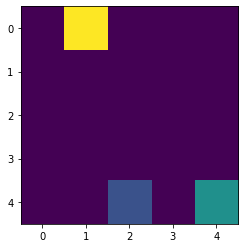

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -0.99, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.0114}, (1, 3): {'U': -0.6787, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': -0

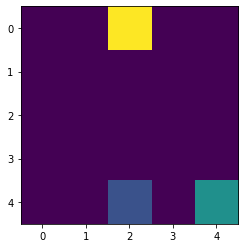

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -0.8498, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.0114}, (1, 3): {'U': -0.6787, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L': 

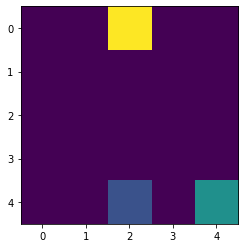

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.0114}, (1, 3): {'U': -0.6787, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L':

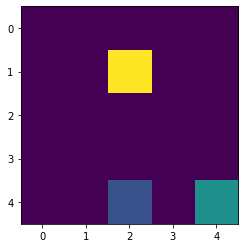

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.6787, 'D': -0.5904, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L':

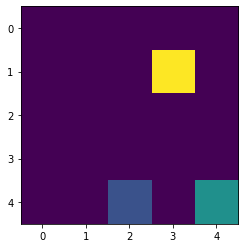

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.6787, 'D': -0.7043, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -0.8974, 'D': -0.36, 'L':

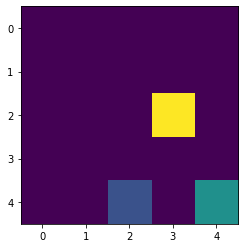

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.6787, 'D': -0.7043, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L':

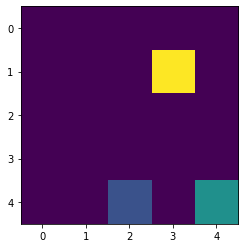

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -0.9204, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7043, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L':

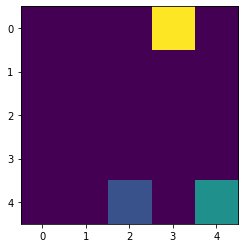

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7043, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': 

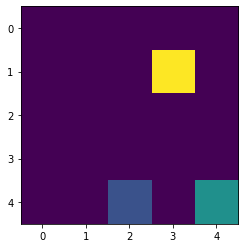

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': 

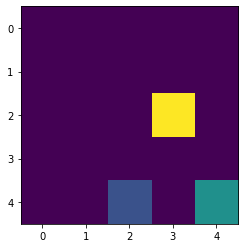

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.5904, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': 

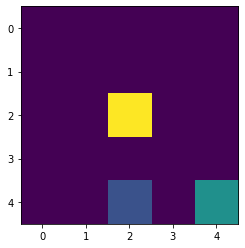

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.6723, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': 

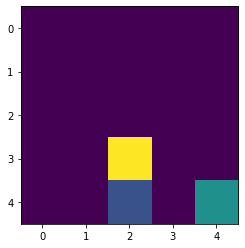

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.6723, 'L': -0.4801, 'R': -0.36}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': 

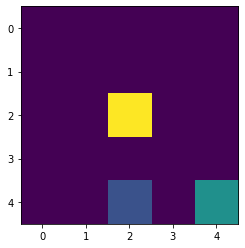

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8432}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': 

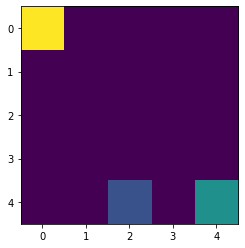

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.6132, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': -

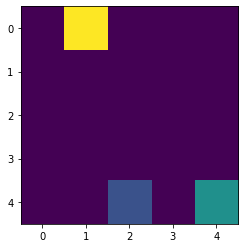

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.6849, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2148}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': -

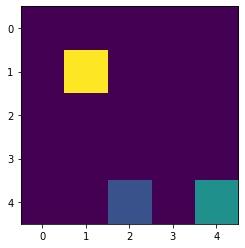

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.6849, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -0.9896, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': -

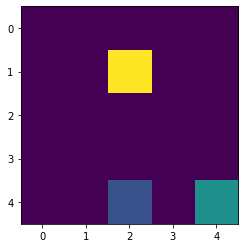

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.6849, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.1225, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': -

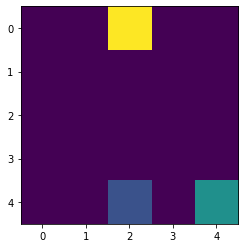

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.6849, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.2285, 'D': -1.0007, 'L': -1.2642, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': -

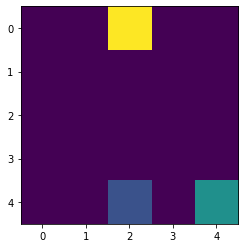

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.6849, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.2285, 'D': -1.0007, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': -

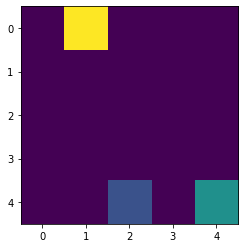

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.2285, 'D': -1.0007, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.4532, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': -

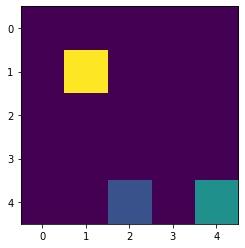

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.2696}, (0, 2): {'U': -1.2285, 'D': -1.0007, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': -

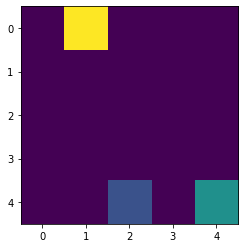

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.0007, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': -

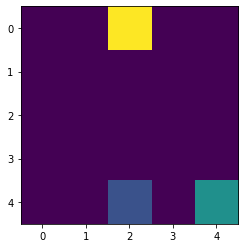

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.7555, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': 

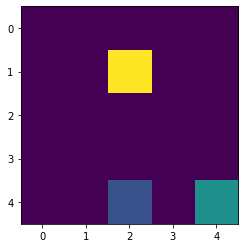

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -0.9326, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': 

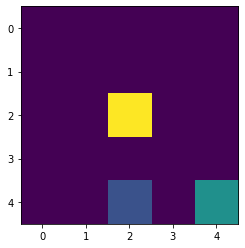

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.1036}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': 

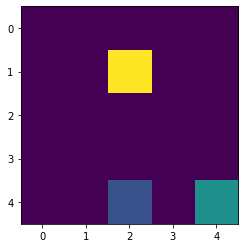

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.8057, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': 

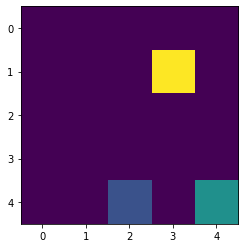

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.488}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L': 

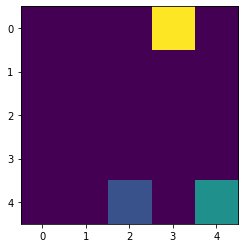

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': 0, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L':

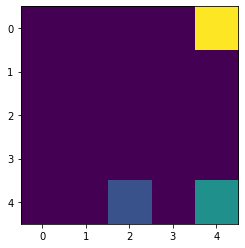

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.2, 'D': -0.4176, 'L': -0.5456, 'R': -0.2}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, '

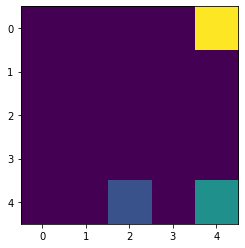

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.2, 'D': -0.4176, 'L': -0.5456, 'R': -0.392}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36,

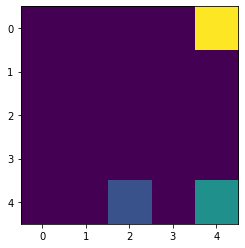

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.5456, 'R': -0.392}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

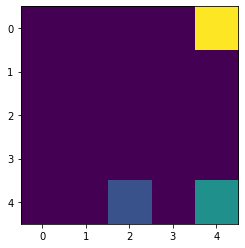

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.5456, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.

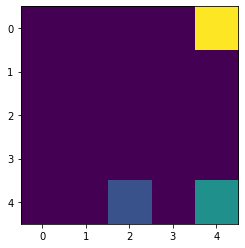

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2388, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.

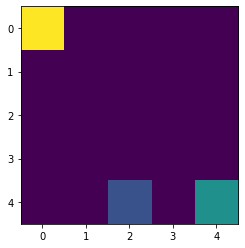

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2604, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7123, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

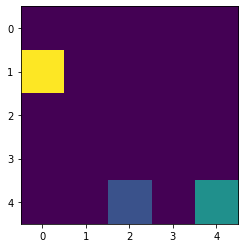

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2604, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7288, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

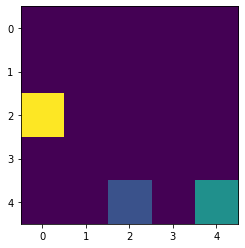

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2604, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.0782, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

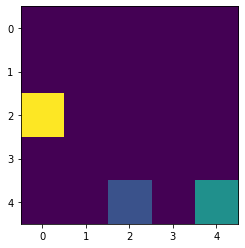

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2604, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

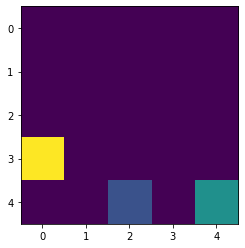

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2604, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

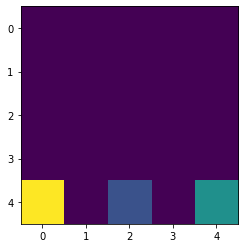

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2604, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

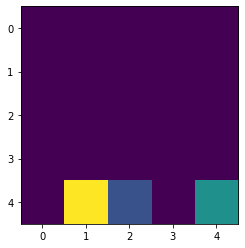

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2604, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

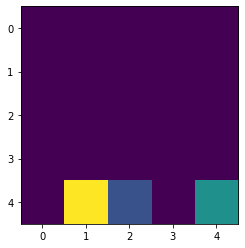

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2604, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

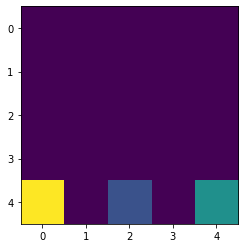

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2604, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

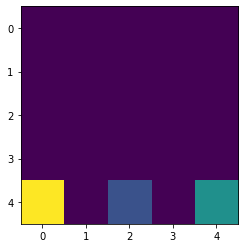

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2604, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.

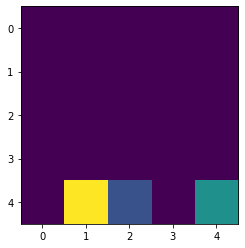

Next state of Agent :  (4, 2)
Reward got :  -3
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2604, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.

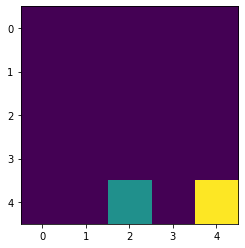

Reward in the end :  -3
Timestep :  12

GAME LOST!!!!
..................................................

Q-Table 

{(0, 0): {'U': -2.2866, 'D': -2.2604, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L':

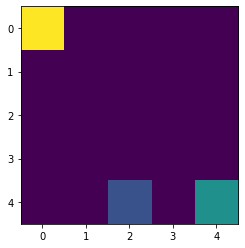

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.3297, 'D': -2.2604, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

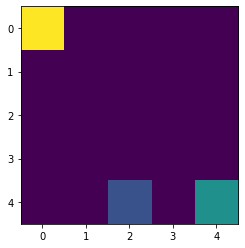

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.3297, 'D': -2.2777, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2175, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

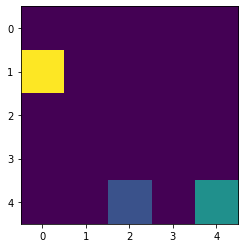

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.3297, 'D': -2.2777, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

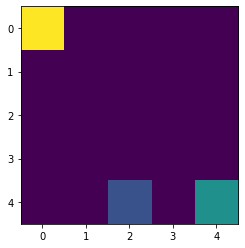

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.3297, 'D': -2.2915, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.7424, 'L': -2.0381, 'R': -1.6834}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

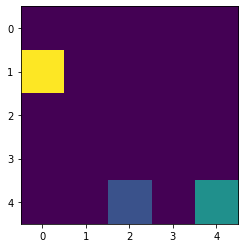

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.3297, 'D': -2.2915, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.7424, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -1.9533, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

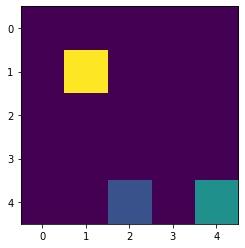

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.3297, 'D': -2.2915, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.7424, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

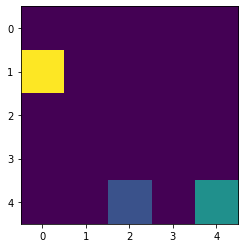

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.3297, 'D': -2.2915, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.406}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36

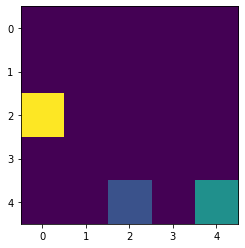

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.3297, 'D': -2.2915, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.8939}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

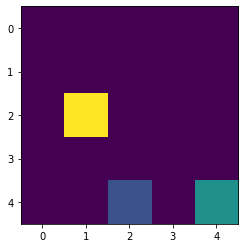

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.3297, 'D': -2.2915, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.6723, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

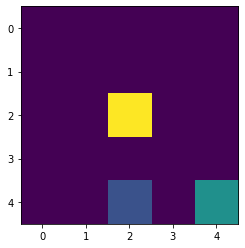

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.3297, 'D': -2.2915, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.

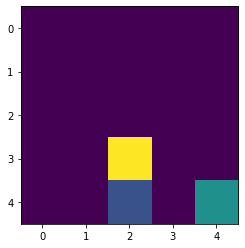

Next state of Agent :  (4, 2)
Reward got :  -3
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.3297, 'D': -2.2915, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.

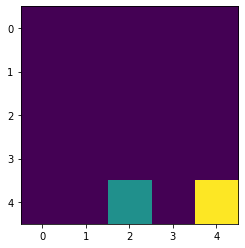

Reward in the end :  -3
Timestep :  12

GAME LOST!!!!
..................................................

Q-Table 

{(0, 0): {'U': -2.3297, 'D': -2.2915, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.36, 'L':

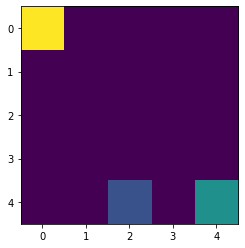

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.8777}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

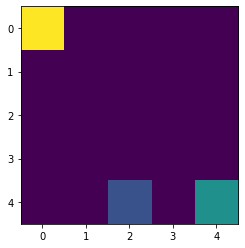

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.6675, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

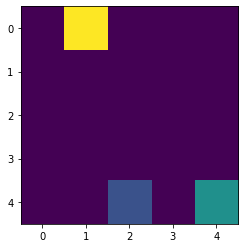

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.3462}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

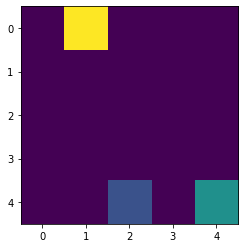

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.1214, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

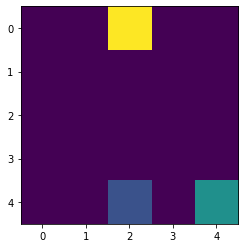

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.1222, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

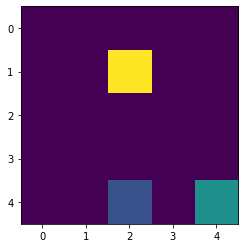

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.8159}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

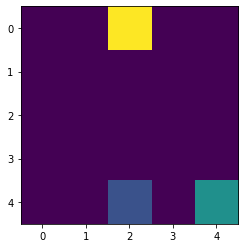

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.9154}, (0, 3): {'U': -0.392, 'D': -1.049, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

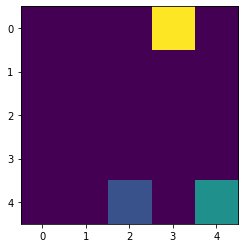

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.9154}, (0, 3): {'U': -0.392, 'D': -1.1665, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9073, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.

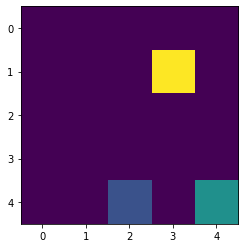

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.9154}, (0, 3): {'U': -0.392, 'D': -1.1665, 'L': -0.5712, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.

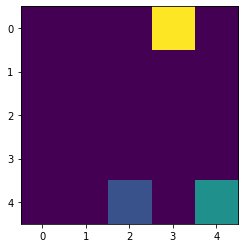

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.9154}, (0, 3): {'U': -0.392, 'D': -1.1665, 'L': -0.8034, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0

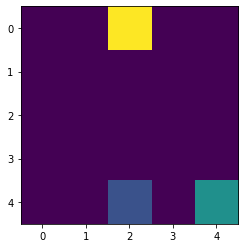

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.995}, (0, 3): {'U': -0.392, 'D': -1.1665, 'L': -0.8034, 'R': -0.5904}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.

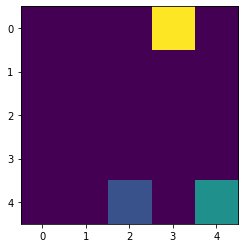

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.995}, (0, 3): {'U': -0.392, 'D': -1.1665, 'L': -0.8034, 'R': -0.735}, (0, 4): {'U': -0.392, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.3

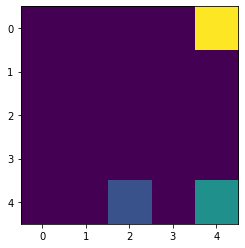

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.995}, (0, 3): {'U': -0.392, 'D': -1.1665, 'L': -0.8034, 'R': -0.735}, (0, 4): {'U': -0.5763, 'D': -0.4176, 'L': -0.6992, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.

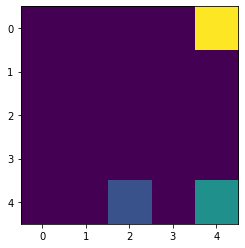

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.995}, (0, 3): {'U': -0.392, 'D': -1.1665, 'L': -0.8034, 'R': -0.735}, (0, 4): {'U': -0.5763, 'D': -0.4176, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.

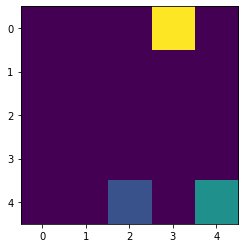

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.995}, (0, 3): {'U': -0.5763, 'D': -1.1665, 'L': -0.8034, 'R': -0.735}, (0, 4): {'U': -0.5763, 'D': -0.4176, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0

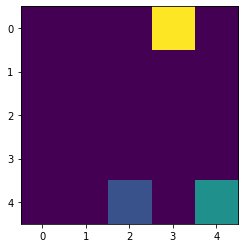

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.995}, (0, 3): {'U': -0.5763, 'D': -1.2605, 'L': -0.8034, 'R': -0.735}, (0, 4): {'U': -0.5763, 'D': -0.4176, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.7954, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0

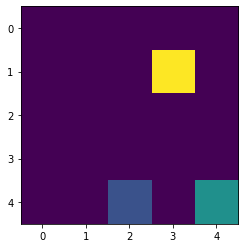

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.995}, (0, 3): {'U': -0.5763, 'D': -1.2605, 'L': -0.8034, 'R': -0.735}, (0, 4): {'U': -0.5763, 'D': -0.4176, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.8683, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0

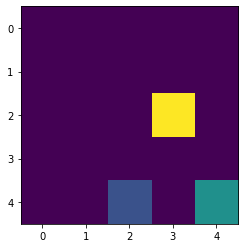

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.995}, (0, 3): {'U': -0.5763, 'D': -1.2605, 'L': -0.8034, 'R': -0.735}, (0, 4): {'U': -0.5763, 'D': -0.4176, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.8683, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0

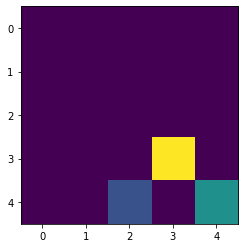

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.995}, (0, 3): {'U': -0.5763, 'D': -1.2605, 'L': -0.8034, 'R': -0.735}, (0, 4): {'U': -0.5763, 'D': -0.4176, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.8683, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0

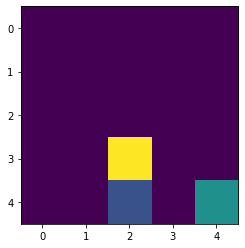

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9176}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.995}, (0, 3): {'U': -0.5763, 'D': -1.2605, 'L': -0.8034, 'R': -0.735}, (0, 4): {'U': -0.5763, 'D': -0.4176, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.8683, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0

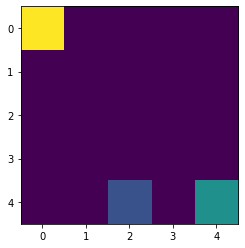

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4075}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.995}, (0, 3): {'U': -0.5763, 'D': -1.2605, 'L': -0.8034, 'R': -0.735}, (0, 4): {'U': -0.5763, 'D': -0.4176, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.8683, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.

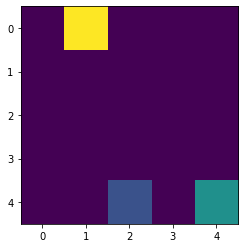

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -0.995}, (0, 3): {'U': -0.5763, 'D': -1.2605, 'L': -0.8034, 'R': -0.735}, (0, 4): {'U': -0.5763, 'D': -0.4176, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.8683, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0.

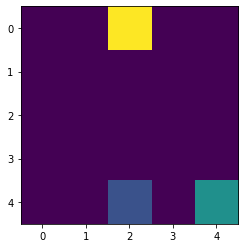

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.5763, 'D': -1.2605, 'L': -0.8034, 'R': -0.735}, (0, 4): {'U': -0.5763, 'D': -0.4176, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.8683, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0

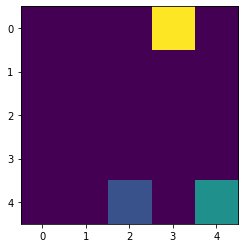

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.7532, 'D': -1.2605, 'L': -0.8034, 'R': -0.735}, (0, 4): {'U': -0.5763, 'D': -0.4176, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.8683, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0

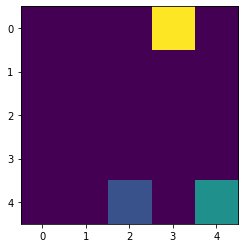

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.735}, (0, 4): {'U': -0.5763, 'D': -0.4176, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.8683, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -0

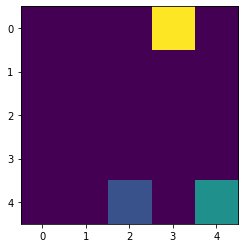

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.4176, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.8683, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -

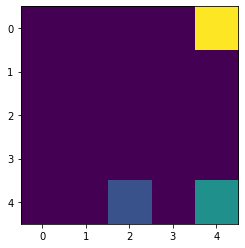

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.8683, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.36, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': -

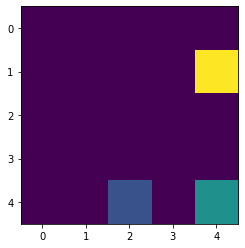

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.8683, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': 

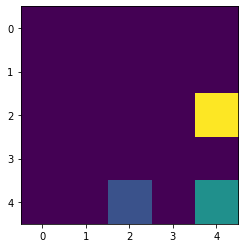

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.8683, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.0265, 'D': 

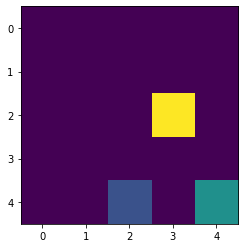

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.8683, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D':

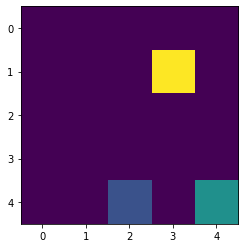

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D':

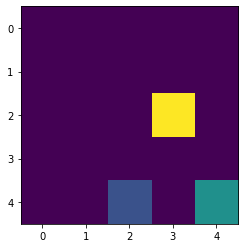

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D':

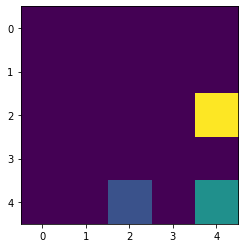

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D':

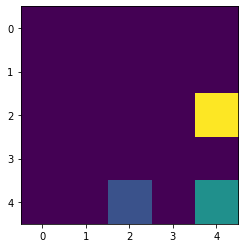

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.7146, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D':

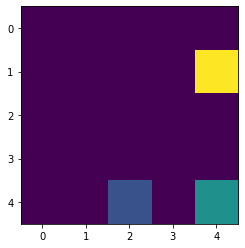

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -0.8822, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D':

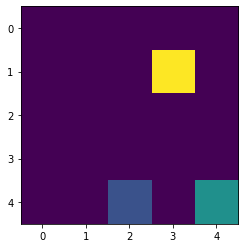

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.2283, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D':

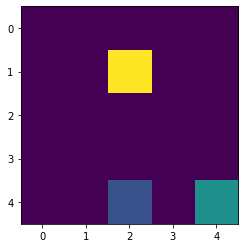

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.4145, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.3568, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D':

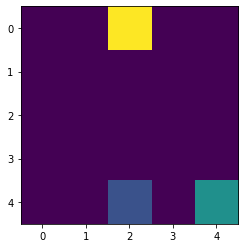

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.4852}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.5692, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.3568, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D':

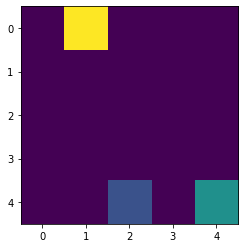

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.5623}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.5692, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.3568, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D':

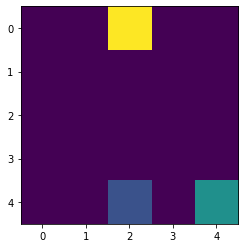

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -1.9593}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.5623}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.3568, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D':

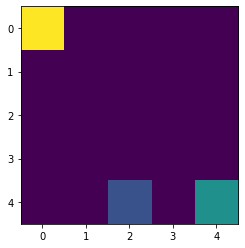

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.5623}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.3568, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

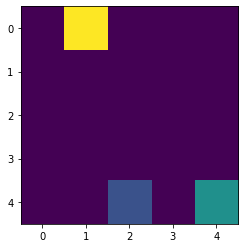

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.2285, 'D': -1.2381, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.3568, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': -

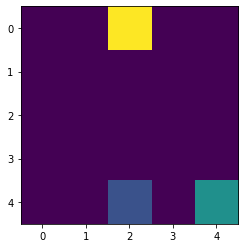

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.2285, 'D': -1.3315, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.3568, 'D': -0.8812, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': -

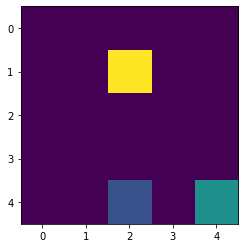

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.2285, 'D': -1.3315, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.4801, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': -

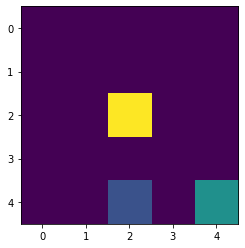

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.2285, 'D': -1.3315, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -0.919, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': -

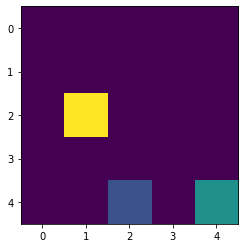

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.2285, 'D': -1.3315, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.2927}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': -

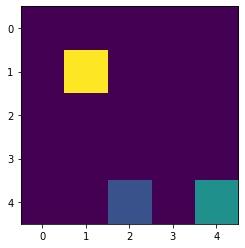

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.2285, 'D': -1.3315, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.3912}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.1833, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': -

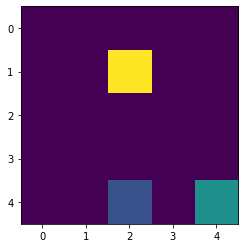

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.2285, 'D': -1.3315, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.3912}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': -

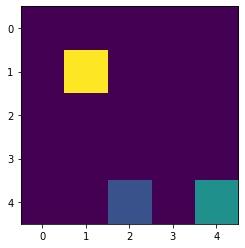

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.2285, 'D': -1.3315, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.2101}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': -0.

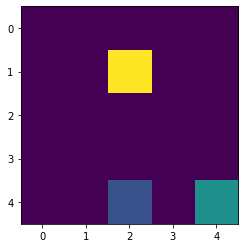

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.2285, 'D': -1.3315, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.8847}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': -0

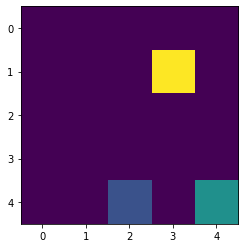

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.2285, 'D': -1.3315, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.36, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': -0

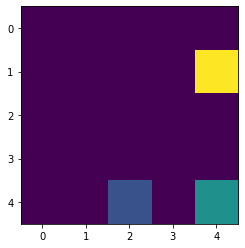

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.2285, 'D': -1.3315, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.5763}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

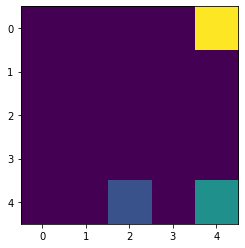

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.2285, 'D': -1.3315, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.8221, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

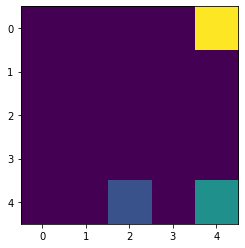

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.2285, 'D': -1.3315, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -0.8034, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.9862, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

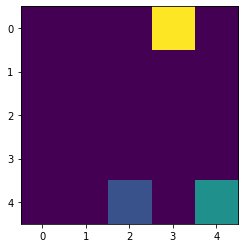

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.2285, 'D': -1.3315, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -1.0168, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.9862, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

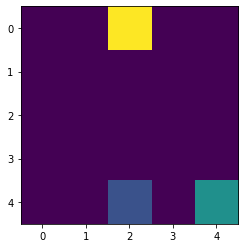

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.3569, 'D': -1.3315, 'L': -1.7053, 'R': -1.0882}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -1.0168, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.9862, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

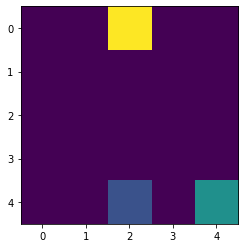

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.3569, 'D': -1.3315, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -1.0168, 'R': -0.8548}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.9862, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

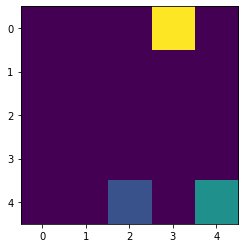

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.3569, 'D': -1.3315, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -0.9862, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

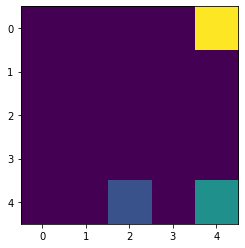

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.3569, 'D': -1.3315, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -0.9202, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

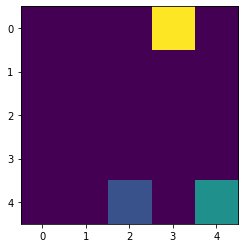

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.3642, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.3569, 'D': -1.3315, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

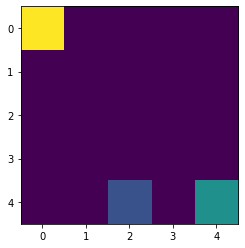

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0174}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.3569, 'D': -1.3315, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': -

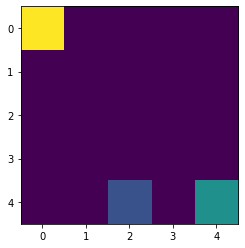

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.624}, (0, 2): {'U': -1.3569, 'D': -1.3315, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': -

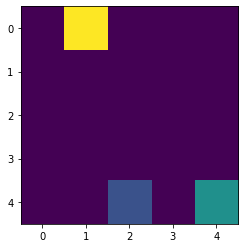

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.3315, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

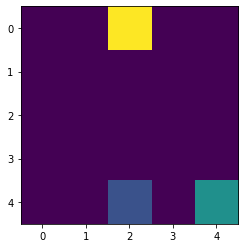

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3096}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

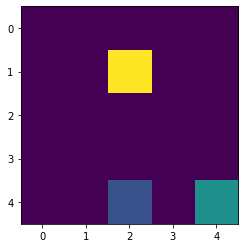

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9266, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

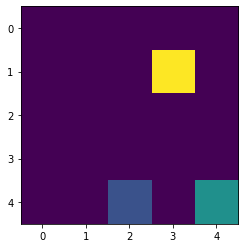

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

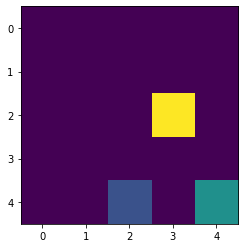

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

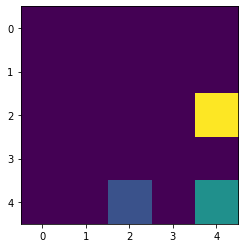

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

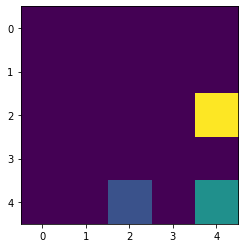

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.488, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': 

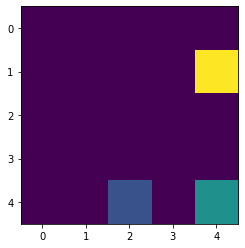

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.5904, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D'

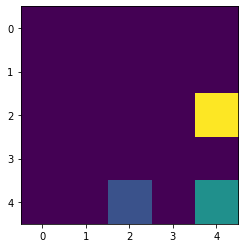

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.5904, 'L': -0.9128, 'R': -0.2}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D'

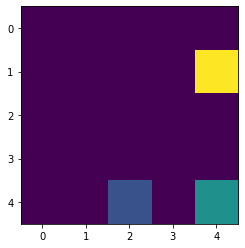

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.5904, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, '

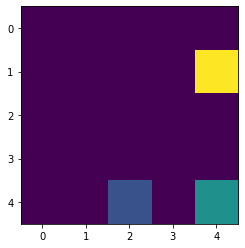

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, '

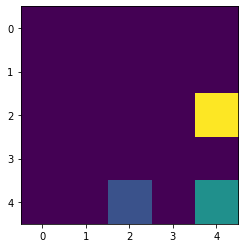

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, '

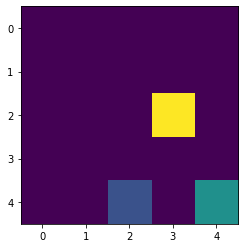

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, '

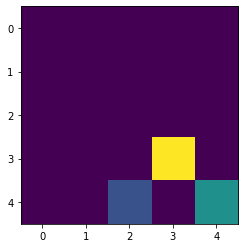

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, '

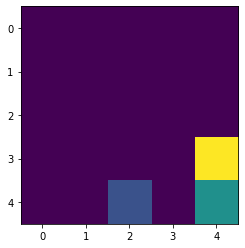

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, '

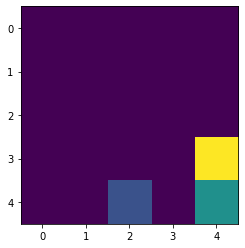

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D

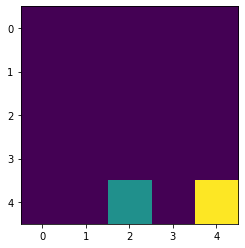

Reward in the end :  4
Timestep :  19

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.0738}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D': -0.590

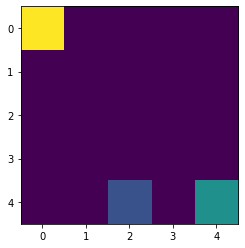

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.7494, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D

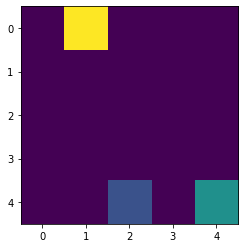

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.6924}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D

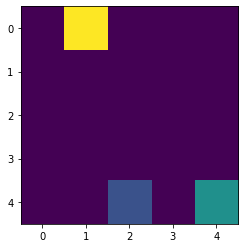

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4223, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D

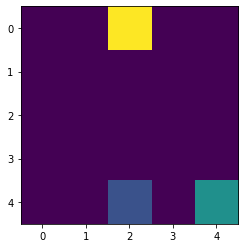

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -0.9818, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D

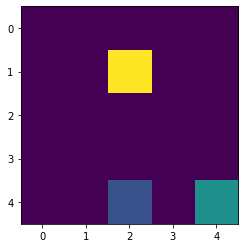

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.0686, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.7311, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D

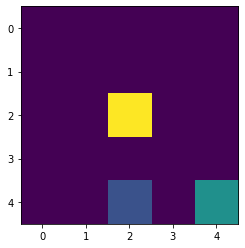

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.0686, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -0.9919}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.9436, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D

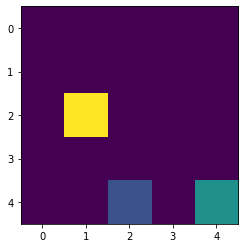

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.0686, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.0871, 'D': -0.7791, 'L': -0.9436, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D

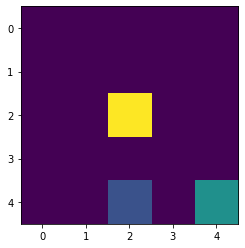

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.0686, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.0871, 'D': -0.8645, 'L': -0.9436, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D

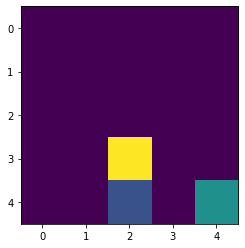

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.0686, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.0871, 'D': -0.8645, 'L': -0.9436, 'R': -0.52}, (2, 3): {'U': -1.1601, 'D

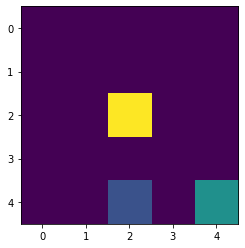

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.0686, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.2407, 'D': -0.8645, 'L': -0.9436, 'R': -0.52}, (2, 3): {'U': -1.1601, '

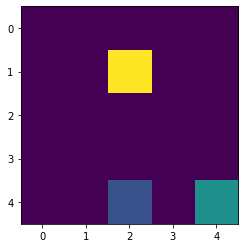

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1381, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.2407, 'D': -0.8645, 'L': -0.9436, 'R': -0.52}, (2, 3): {'U': -1.1601, '

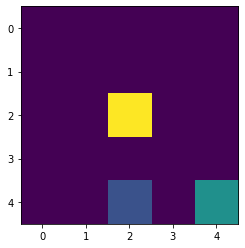

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1381, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.8645, 'L': -0.9436, 'R': -0.52}, (2, 3): {'U': -1.1601, '

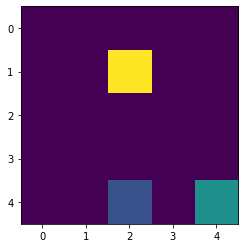

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.8645, 'L': -0.9436, 'R': -0.52}, (2, 3): {'U': -1.1601, '

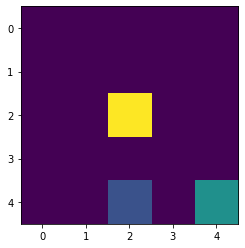

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.52}, (2, 3): {'U': -1.1601, '

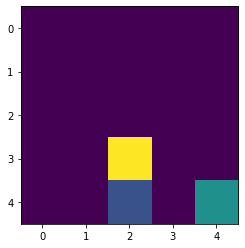

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.52}, (2, 3): {'U': -1.1601, '

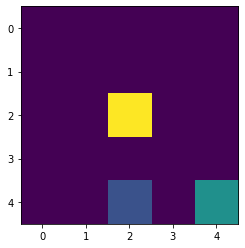

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.1601,

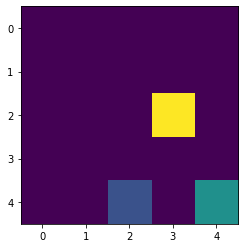

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.1601,

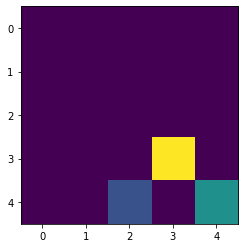

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.1601,

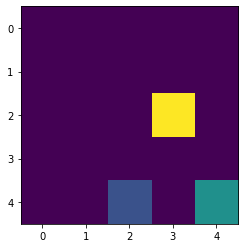

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.0468, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784,

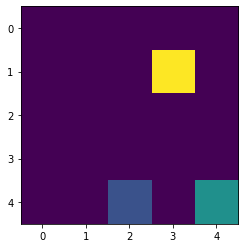

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1298}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.2284, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784,

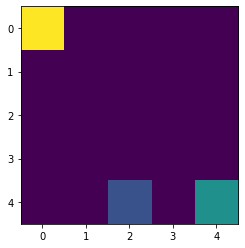

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.8703, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.2284, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784, 

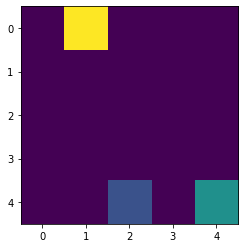

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7471}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.2284, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784, 

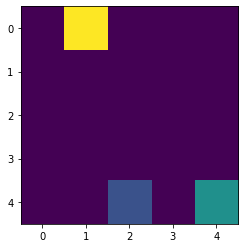

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.2073}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.2284, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784, 

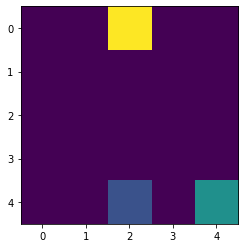

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -0.9744}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.2284, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784, 

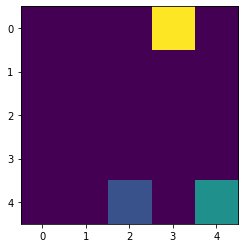

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.5661, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.2284, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784, 

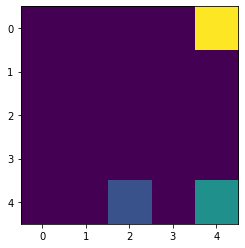

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.2284, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -0.9128, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784, 

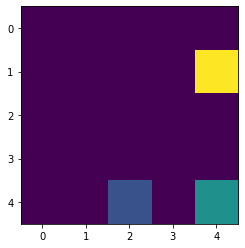

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.2284, 'R': -0.9398}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.0806, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784, 

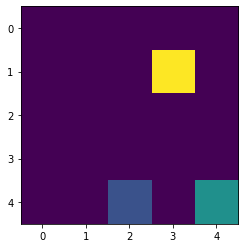

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.0806, 'R': -0.392}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784, 

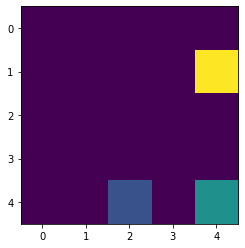

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.0806, 'R': -0.5763}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784,

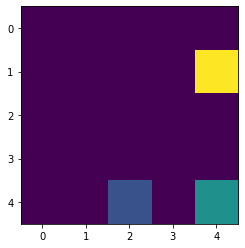

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.0806, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784

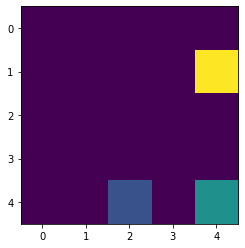

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -0.9989, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784

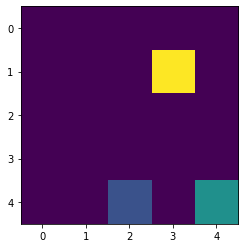

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784

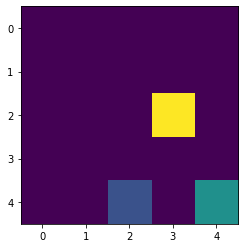

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.6902}, (2, 3): {'U': -1.2784

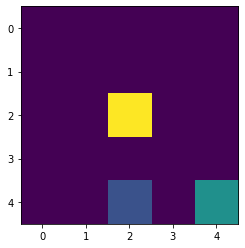

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.8302}, (2, 3): {'U': -1.2784

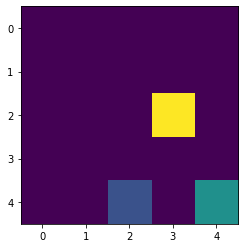

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.8302}, (2, 3): {'U': -1.2784

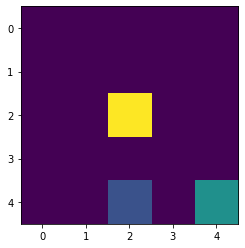

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

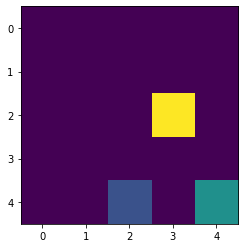

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

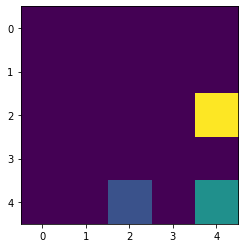

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

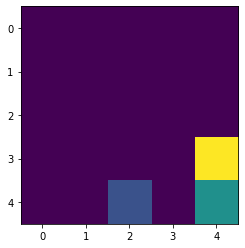

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

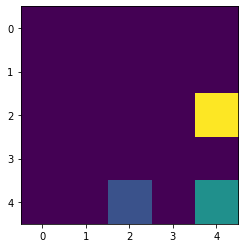

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.2915, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

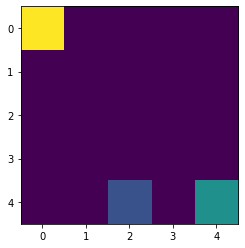

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.0381, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

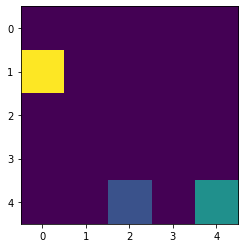

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.2744, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

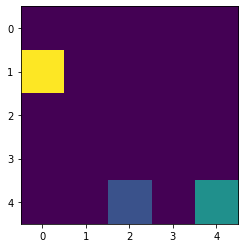

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.1834}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

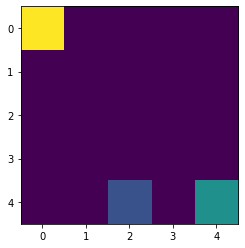

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.7908}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

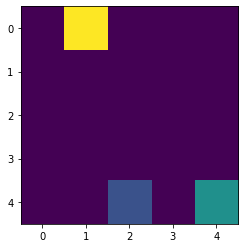

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.7053, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

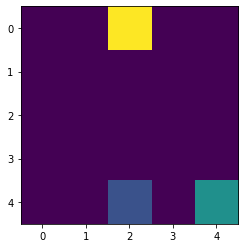

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.7548, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

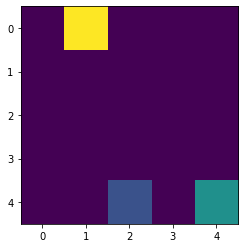

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.47}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

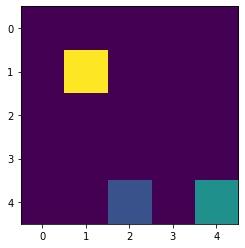

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.1937, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

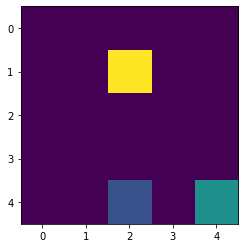

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -0.9699, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

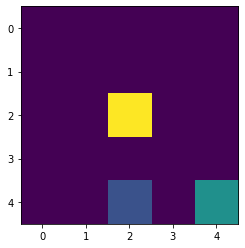

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

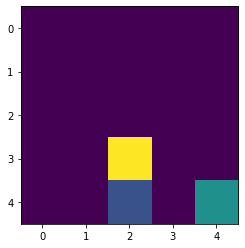

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

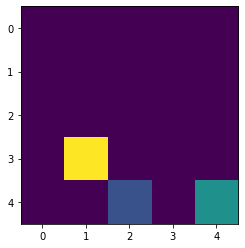

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5145, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

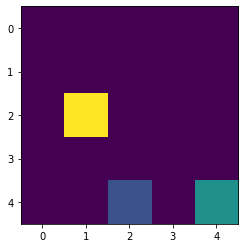

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7556, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

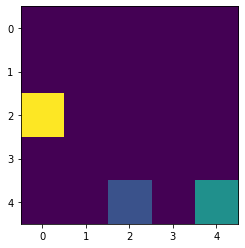

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7845, 'R': -1.4678}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

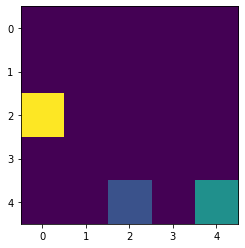

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7845, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1696, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

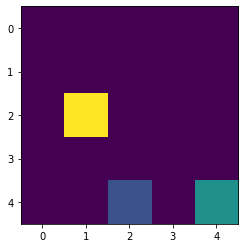

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7845, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

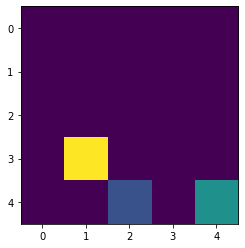

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7845, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

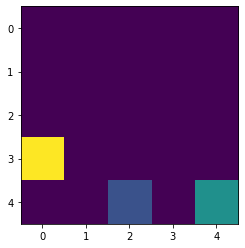

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.7845, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

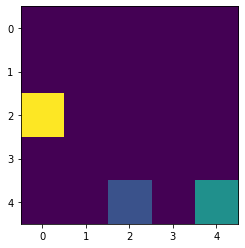

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.1253, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

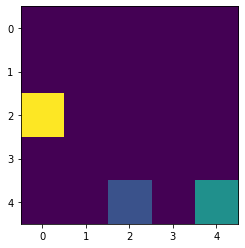

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.4141, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

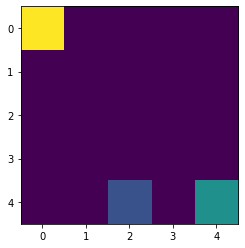

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.2275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

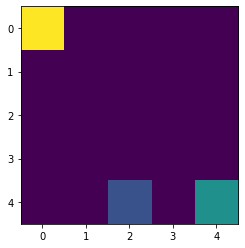

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8441}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

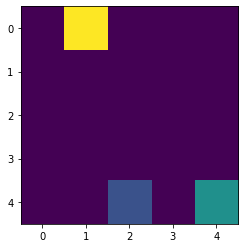

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.3217}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

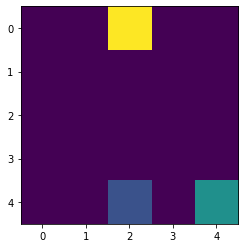

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.42}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.0168, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 'D'

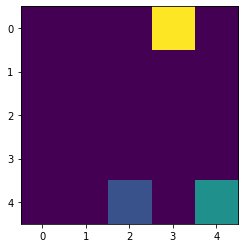

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.3569, 'D': -1.4949, 'L': -1.845, 'R': -1.42}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.2305, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 'D'

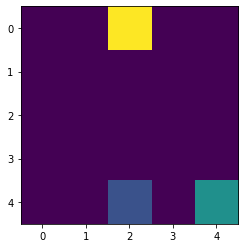

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.5026, 'D': -1.4949, 'L': -1.845, 'R': -1.42}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.2305, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 'D'

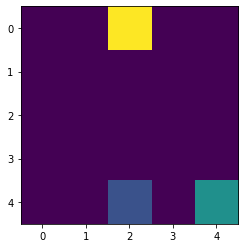

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.5026, 'D': -1.4949, 'L': -1.845, 'R': -1.5072}, (0, 3): {'U': -1.0834, 'D': -1.2605, 'L': -1.2305, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

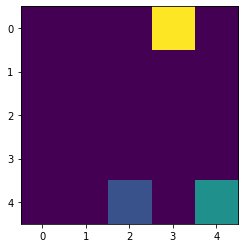

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.5026, 'D': -1.4949, 'L': -1.845, 'R': -1.5072}, (0, 3): {'U': -1.2379, 'D': -1.2605, 'L': -1.2305, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

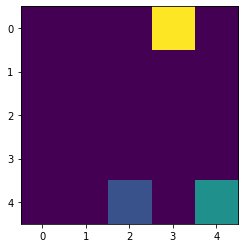

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.5026, 'D': -1.4949, 'L': -1.845, 'R': -1.5072}, (0, 3): {'U': -1.3615, 'D': -1.2605, 'L': -1.2305, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

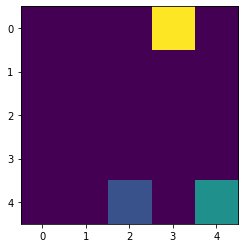

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.5026, 'D': -1.4949, 'L': -1.845, 'R': -1.5072}, (0, 3): {'U': -1.4604, 'D': -1.2605, 'L': -1.2305, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

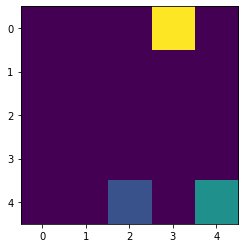

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.5026, 'D': -1.4949, 'L': -1.845, 'R': -1.5072}, (0, 3): {'U': -1.4604, 'D': -1.2605, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

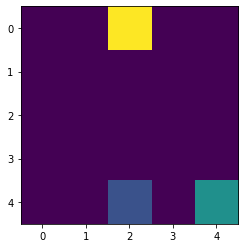

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.5026, 'D': -1.6048, 'L': -1.845, 'R': -1.5072}, (0, 3): {'U': -1.4604, 'D': -1.2605, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3057, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

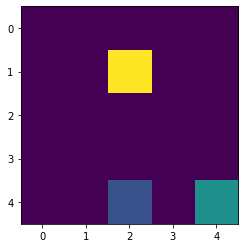

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.5026, 'D': -1.6048, 'L': -1.845, 'R': -1.5072}, (0, 3): {'U': -1.4604, 'D': -1.2605, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3953, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.3747, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

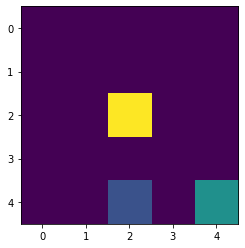

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.5026, 'D': -1.6048, 'L': -1.845, 'R': -1.5072}, (0, 3): {'U': -1.4604, 'D': -1.2605, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.3568, 'D': -1.3953, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

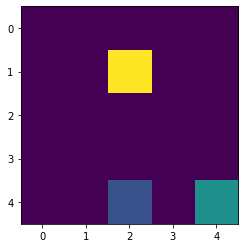

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.5026, 'D': -1.6048, 'L': -1.845, 'R': -1.5072}, (0, 3): {'U': -1.4604, 'D': -1.2605, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

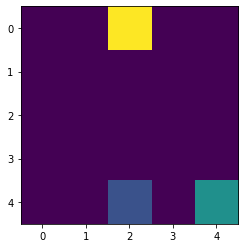

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.5072}, (0, 3): {'U': -1.4604, 'D': -1.2605, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

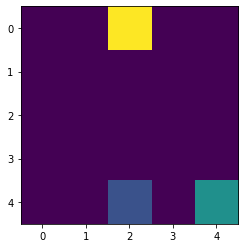

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.577}, (0, 3): {'U': -1.4604, 'D': -1.2605, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

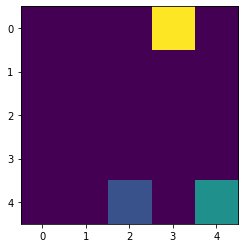

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.577}, (0, 3): {'U': -1.4604, 'D': -1.3666, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.2284, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

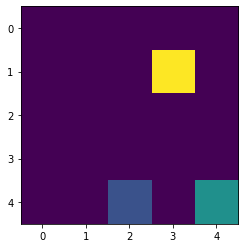

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.577}, (0, 3): {'U': -1.4604, 'D': -1.3666, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.3959}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

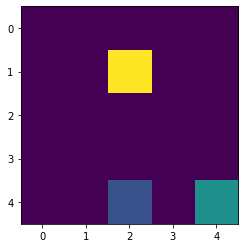

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.275}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.577}, (0, 3): {'U': -1.4604, 'D': -1.3666, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

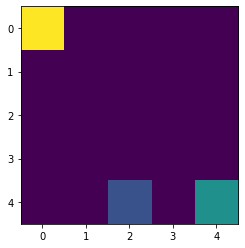

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.8868}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.577}, (0, 3): {'U': -1.4604, 'D': -1.3666, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 'D

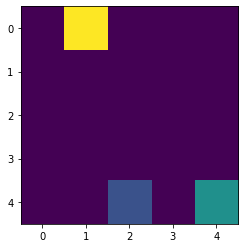

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.577}, (0, 3): {'U': -1.4604, 'D': -1.3666, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 'D

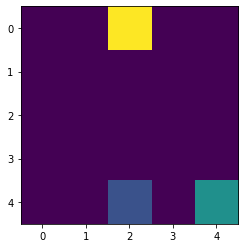

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.4604, 'D': -1.3666, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

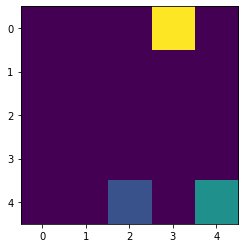

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.5395, 'D': -1.3666, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

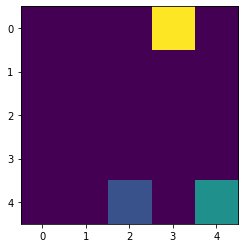

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.5395, 'D': -1.4515, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -0.9886, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

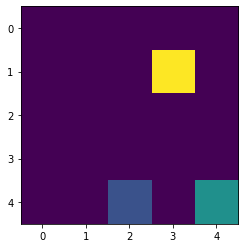

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.5395, 'D': -1.4515, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

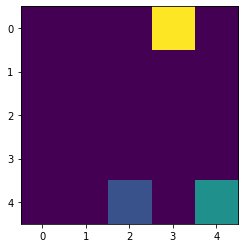

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.0701}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

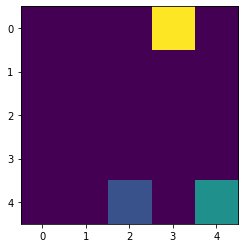

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -0.5763, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

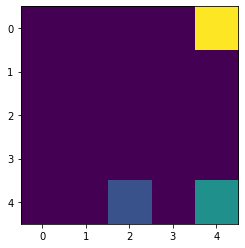

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -0.7532, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

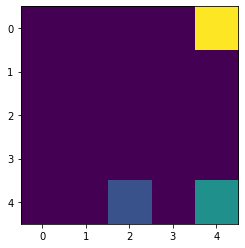

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -0.9171, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

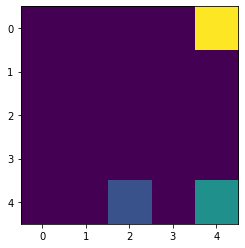

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.7156, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

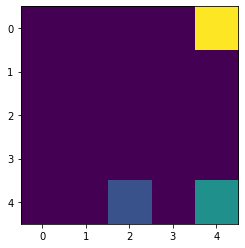

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.2227, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

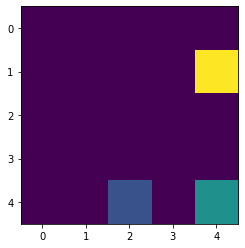

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.4018, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

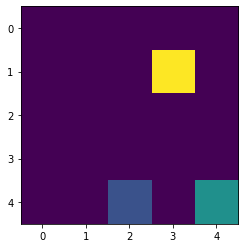

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.5259, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

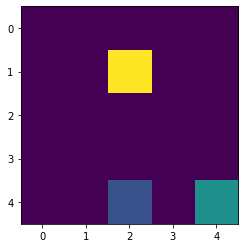

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.6048, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

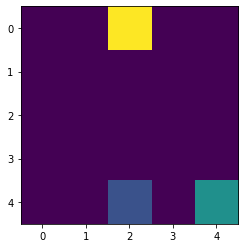

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.3692, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

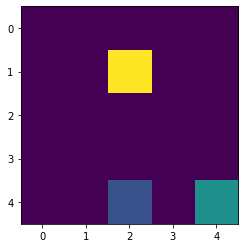

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.4208, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

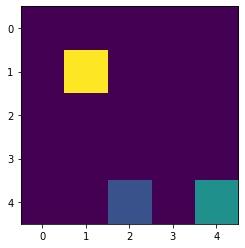

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.5089, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.142, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

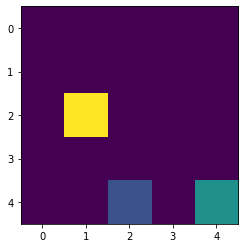

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.5089, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

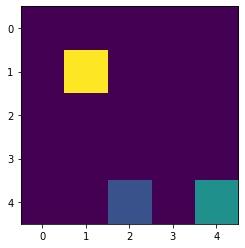

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.2849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

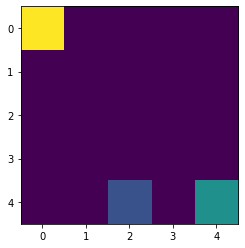

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.3935, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

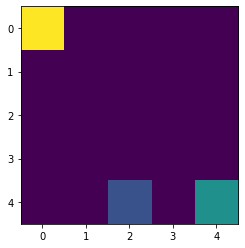

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3138, 'L': -2.4849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

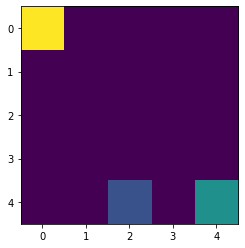

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3316, 'L': -2.4849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.7536}, (1, 1): {'U': -1.5657, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

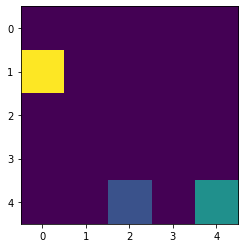

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3316, 'L': -2.4849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.5657, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

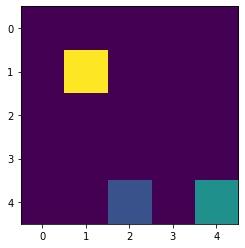

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3316, 'L': -2.4849, 'R': -2.313}, (0, 1): {'U': -1.9758, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

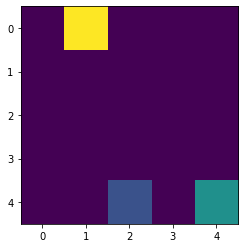

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3316, 'L': -2.4849, 'R': -2.313}, (0, 1): {'U': -2.0736, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

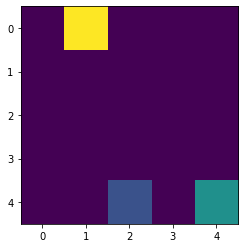

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3316, 'L': -2.4849, 'R': -2.313}, (0, 1): {'U': -2.1519, 'D': -1.8312, 'L': -2.2402, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

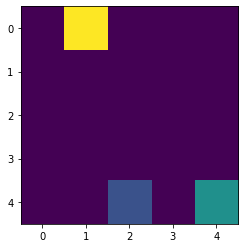

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3316, 'L': -2.4849, 'R': -2.313}, (0, 1): {'U': -2.1519, 'D': -1.8312, 'L': -2.3622, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

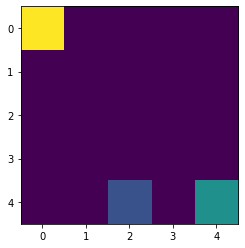

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3316, 'L': -2.4849, 'R': -2.3434}, (0, 1): {'U': -2.1519, 'D': -1.8312, 'L': -2.3622, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

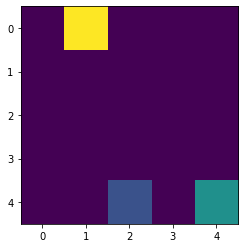

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.4877, 'D': -2.3316, 'L': -2.4849, 'R': -2.3434}, (0, 1): {'U': -2.1519, 'D': -1.8312, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

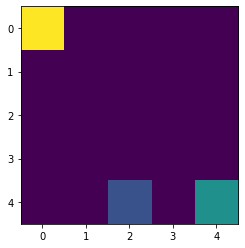

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.5632, 'D': -2.3316, 'L': -2.4849, 'R': -2.3434}, (0, 1): {'U': -2.1519, 'D': -1.8312, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

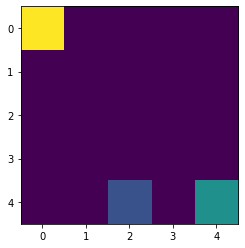

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.6236, 'D': -2.3316, 'L': -2.4849, 'R': -2.3434}, (0, 1): {'U': -2.1519, 'D': -1.8312, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

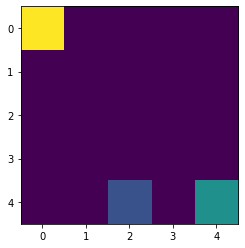

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3316, 'L': -2.4849, 'R': -2.3434}, (0, 1): {'U': -2.1519, 'D': -1.8312, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

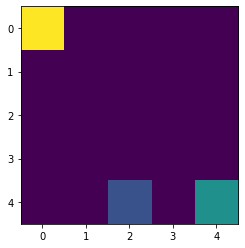

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3491, 'L': -2.4849, 'R': -2.3434}, (0, 1): {'U': -2.1519, 'D': -1.8312, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.3689, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

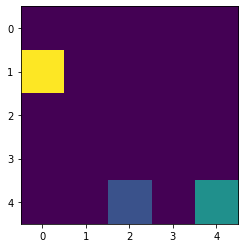

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3491, 'L': -2.4849, 'R': -2.3434}, (0, 1): {'U': -2.1519, 'D': -1.8312, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.4701, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

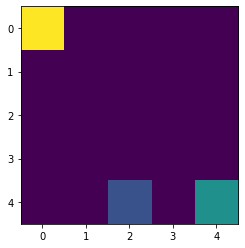

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3491, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.1519, 'D': -1.8312, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.4701, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

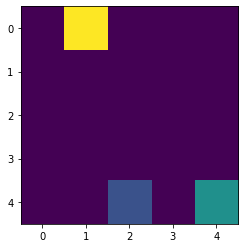

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3491, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.8312, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.4701, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

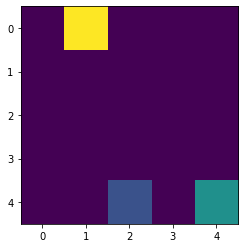

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3491, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.4701, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.567}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

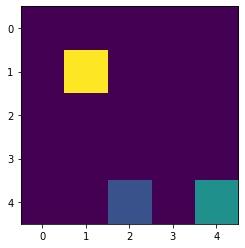

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3491, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.4701, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.3953, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

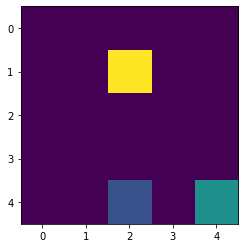

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3491, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.4701, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

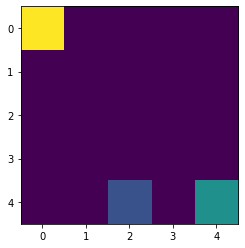

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.4701, 'D': -1.774, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

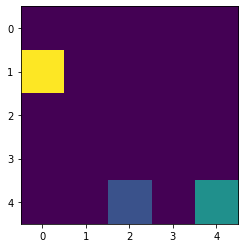

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -1.9793, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

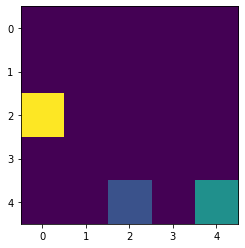

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.8534}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

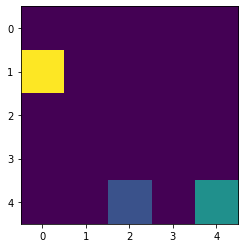

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.7456, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

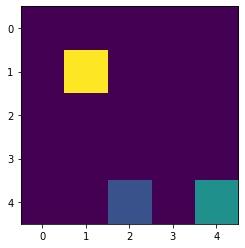

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -1.9618}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

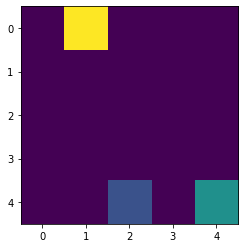

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0307}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.6328}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

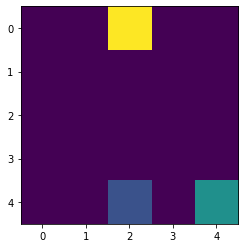

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0307}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.69}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.1483}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 'D

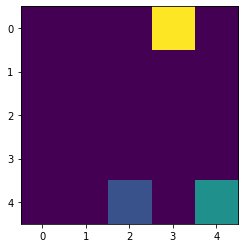

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0307}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.69}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.7516}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 'D

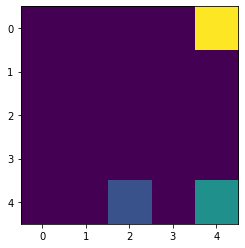

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0307}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.69}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.8651, 'L': -1.1362, 'R': -0.9215}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 'D

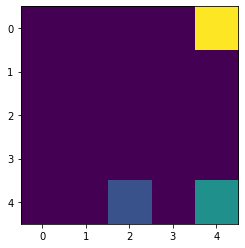

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0307}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.69}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.1362, 'R': -0.9215}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.5786, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

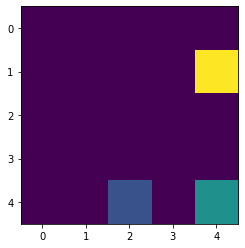

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0307}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.69}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.1362, 'R': -0.9215}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

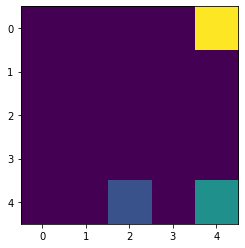

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0307}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.69}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.1362, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

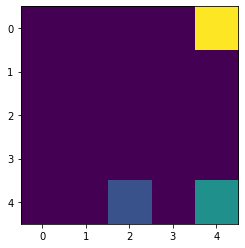

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0307}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.69}, (0, 3): {'U': -1.6028, 'D': -1.4515, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

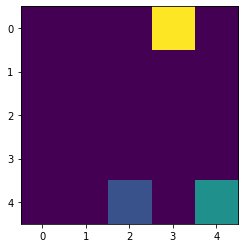

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0307}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.69}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.5405, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

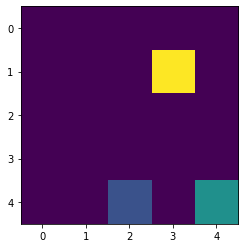

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0307}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.69}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.6775, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

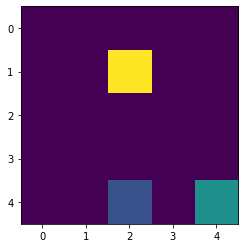

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0307}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.845, 'R': -1.69}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, '

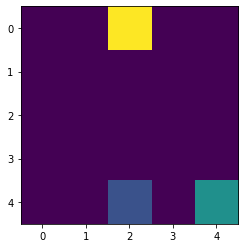

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0307}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.9825, 'R': -1.69}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

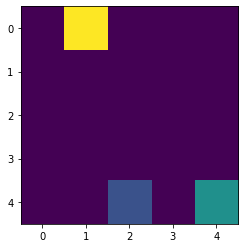

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.6425, 'D': -1.7029, 'L': -1.9825, 'R': -1.69}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

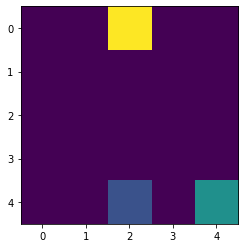

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.69}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784, 

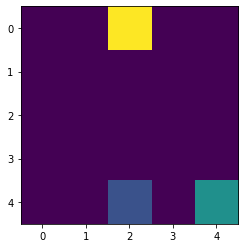

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3631, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

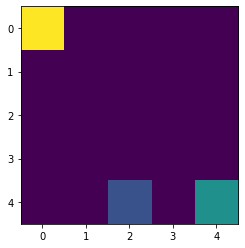

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8053, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

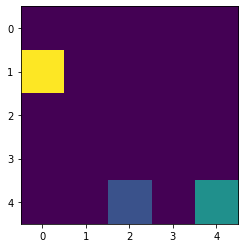

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8303, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.163, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784,

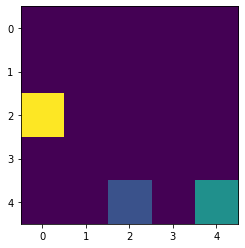

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8303, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.1931, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

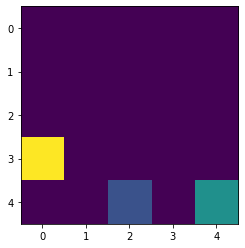

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8303, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.0723, 'D': -1.1931, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

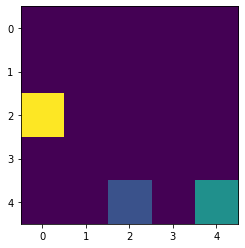

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8303, 'L': -2.1111, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.1931, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

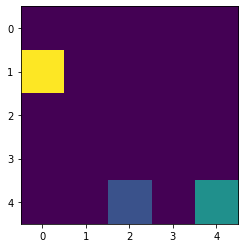

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8303, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.1931, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

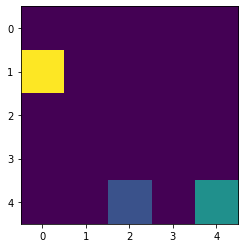

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.1931, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

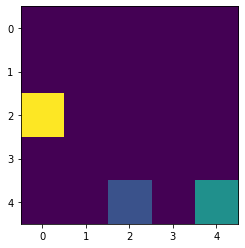

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2172, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

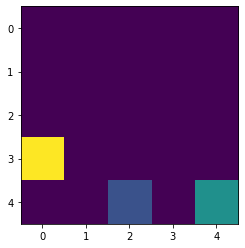

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2172, 'L': -1.8076, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.2784

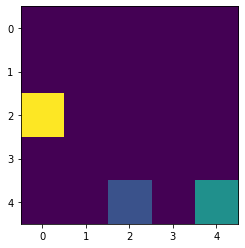

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2172, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.278

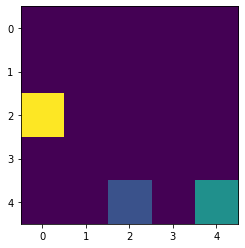

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.278

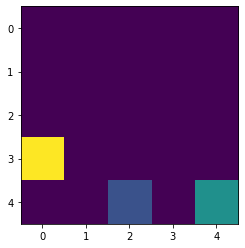

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.278

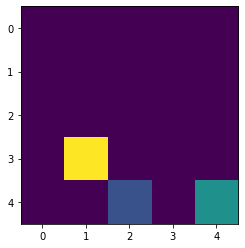

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.278

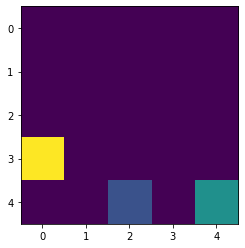

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.278

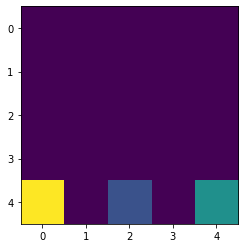

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.278

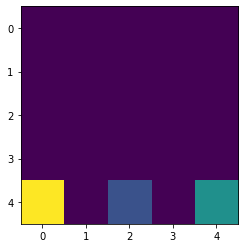

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.278

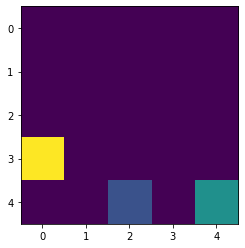

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.278

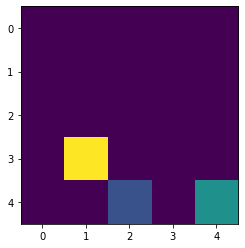

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.0767}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.278

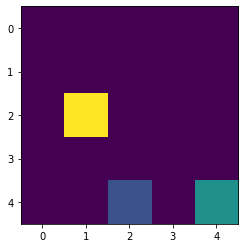

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -0.9422}, (2, 3): {'U': -1.278

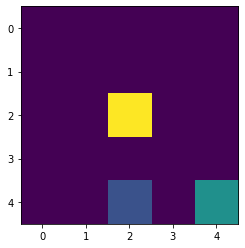

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.3793, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

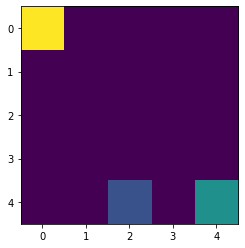

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.4003, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.4701, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784

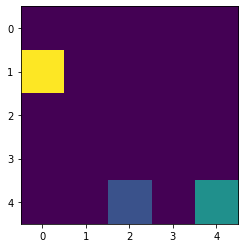

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.4003, 'L': -2.4849, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784

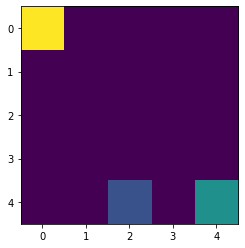

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.4003, 'L': -2.5668, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784

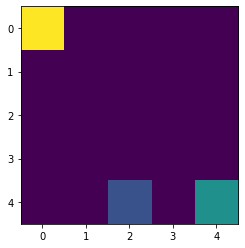

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.6719, 'D': -2.4003, 'L': -2.6323, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784

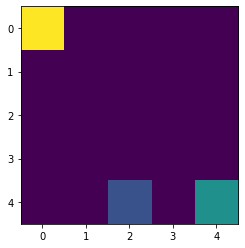

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.3677}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784

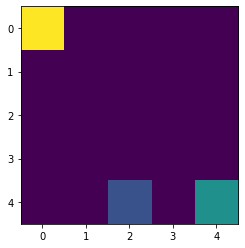

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -1.9157, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784

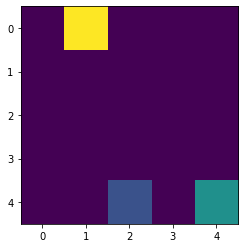

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -1.9853, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -1.903, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784

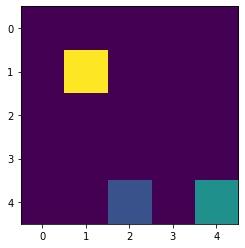

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -1.9853, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.04, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784,

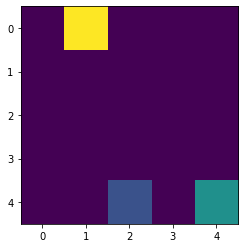

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.0409, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.04, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784,

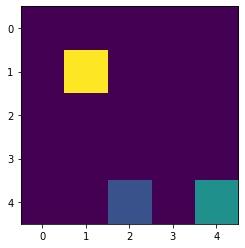

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.0409, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.1585, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

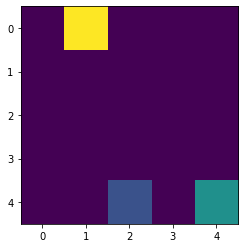

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.0854, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.1585, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

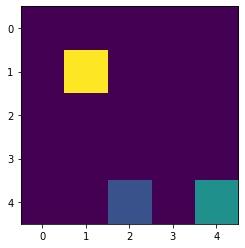

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.0854, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

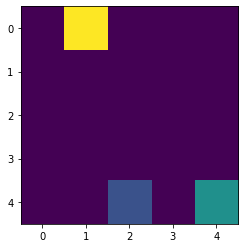

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.6768}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

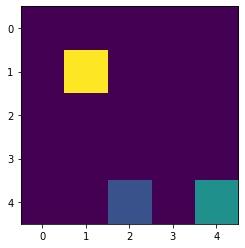

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.4749}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

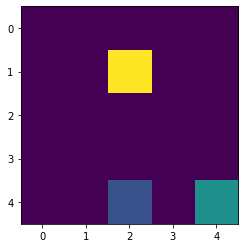

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.6671, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

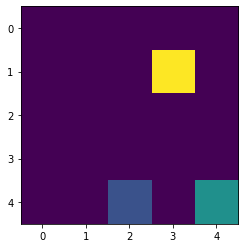

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.8048, 'D': -1.467, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

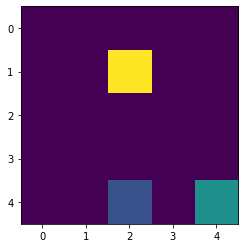

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.8048, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.5168, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

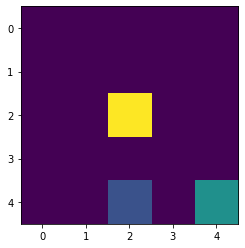

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.8048, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

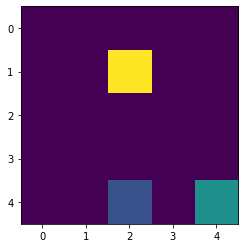

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7502}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

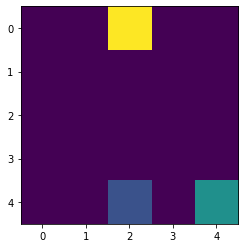

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4003, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

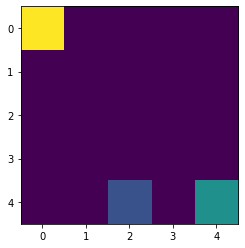

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8551, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

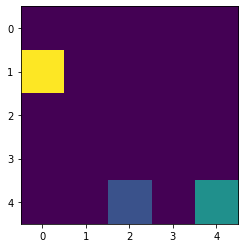

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2365, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

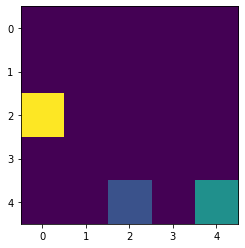

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2968, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

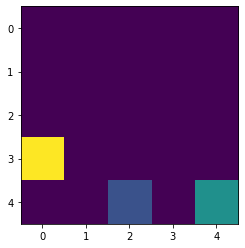

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.2968, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

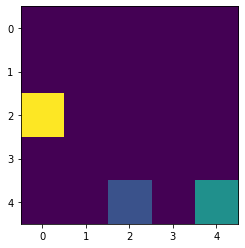

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.345, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784

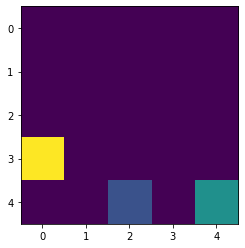

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.345, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784

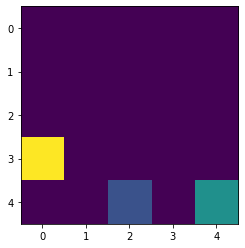

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.345, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784

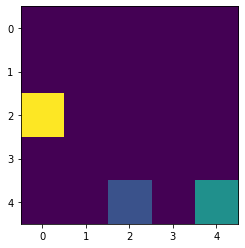

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

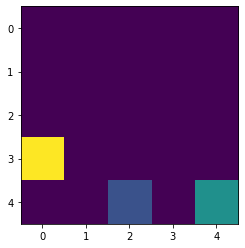

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

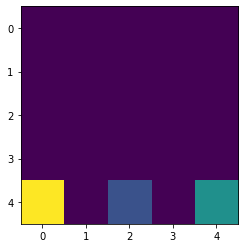

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

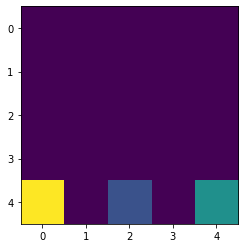

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

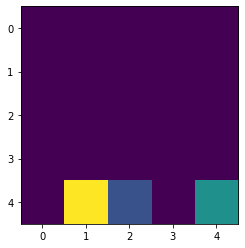

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

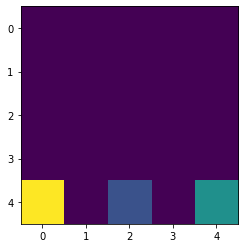

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

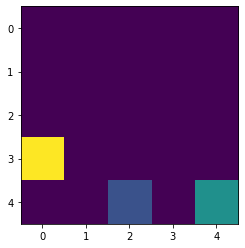

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

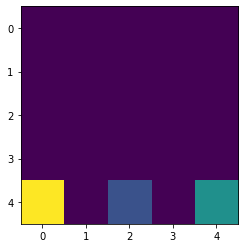

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

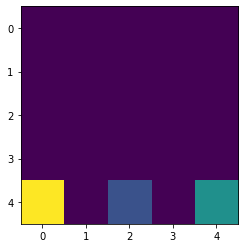

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

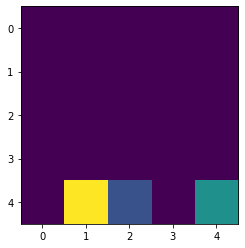

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

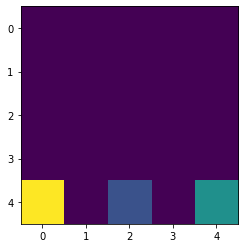

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

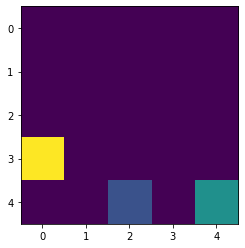

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

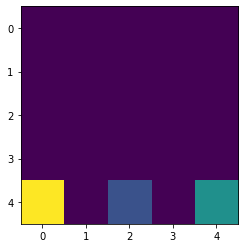

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4007}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

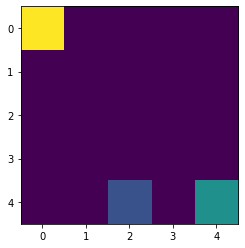

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4545}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.0874}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

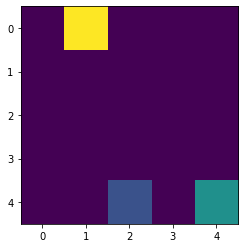

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4545}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.1424}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -1.9825, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

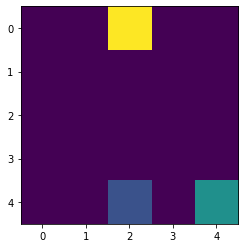

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4545}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.4628, 'R': -2.1424}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.1254, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

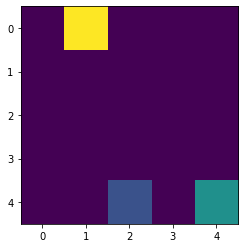

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.7164, 'D': -2.4171, 'L': -2.6323, 'R': -2.4545}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.557, 'R': -2.1424}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.1254, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784

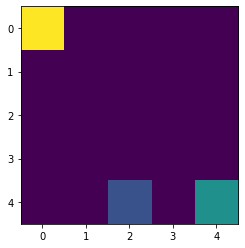

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.4545}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.557, 'R': -2.1424}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.1254, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784

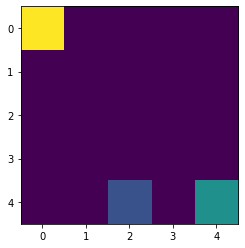

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.503}, (0, 1): {'U': -2.2145, 'D': -2.121, 'L': -2.557, 'R': -2.1424}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.1254, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784,

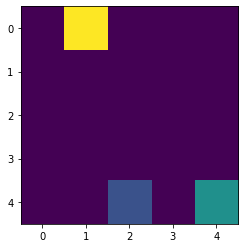

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.503}, (0, 1): {'U': -2.311, 'D': -2.121, 'L': -2.557, 'R': -2.1424}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.1254, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784, 

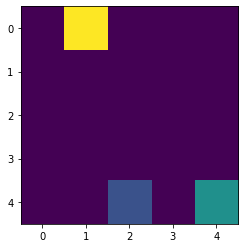

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.503}, (0, 1): {'U': -2.311, 'D': -2.1495, 'L': -2.557, 'R': -2.1424}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.1254, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.2605, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784,

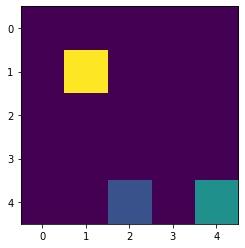

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.503}, (0, 1): {'U': -2.311, 'D': -2.1495, 'L': -2.557, 'R': -2.1424}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.1254, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2784,

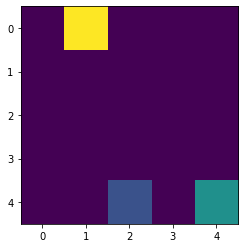

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.503}, (0, 1): {'U': -2.311, 'D': -2.1495, 'L': -2.6323, 'R': -2.1424}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.1254, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

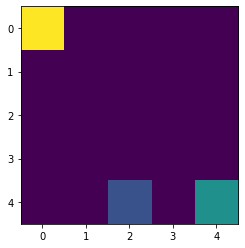

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1495, 'L': -2.6323, 'R': -2.1424}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.1254, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

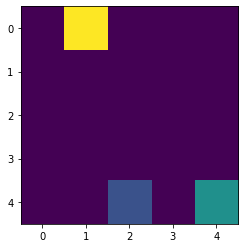

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1495, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.1254, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

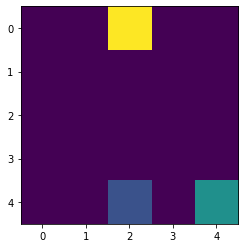

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1495, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

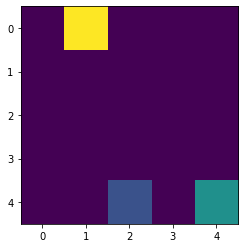

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.5794, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

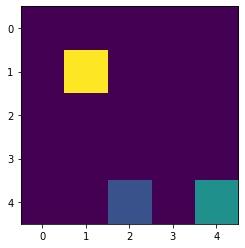

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.6544, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.355, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

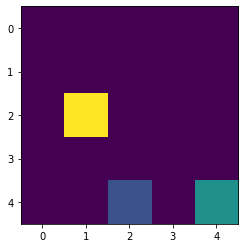

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.6544, 'L': -2.0414, 'R': -1.7762}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2

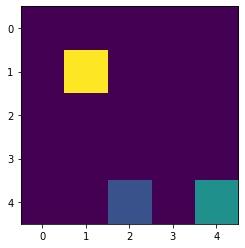

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.6544, 'L': -2.0414, 'R': -1.8646}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.5227, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2

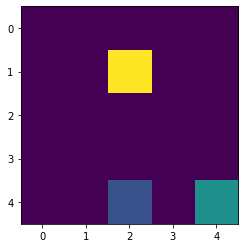

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.6544, 'L': -2.0414, 'R': -1.8646}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2

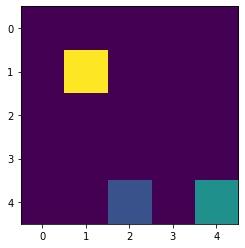

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.1817, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.6544, 'L': -2.1342, 'R': -1.8646}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2

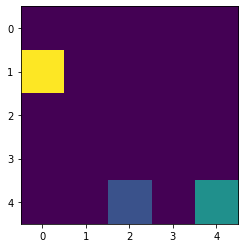

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4171, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.2465, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.6544, 'L': -2.1342, 'R': -1.8646}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2

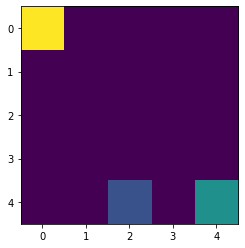

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.8819, 'L': -2.2465, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.6544, 'L': -2.1342, 'R': -1.8646}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

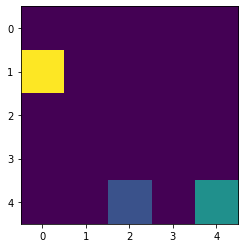

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9269, 'L': -2.2465, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.6544, 'L': -2.1342, 'R': -1.8646}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.1507, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

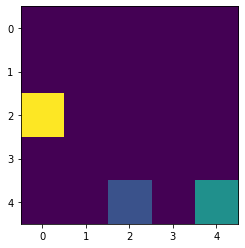

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9269, 'L': -2.2465, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.6544, 'L': -2.1342, 'R': -1.8646}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2289, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

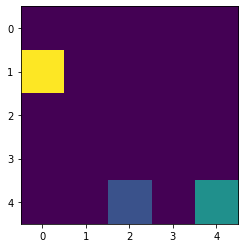

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.6544, 'L': -2.1342, 'R': -1.8646}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2289, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

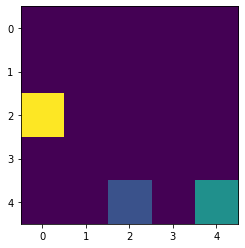

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -1.9354}, (1, 1): {'U': -2.3512, 'D': -1.6544, 'L': -2.1342, 'R': -1.8646}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

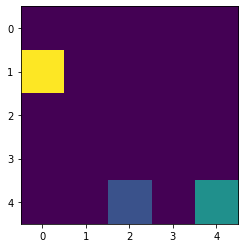

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.3512, 'D': -1.6544, 'L': -2.1342, 'R': -1.8646}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

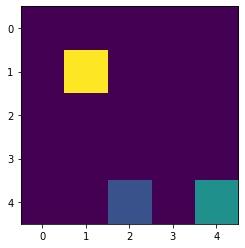

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.311, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.8646}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.278

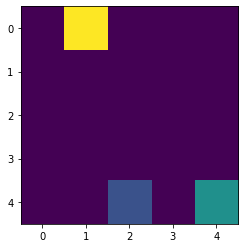

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.1723, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.8646}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

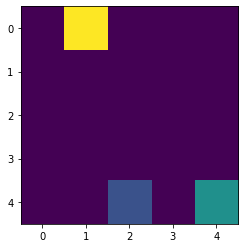

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.8646}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.27

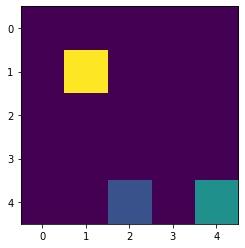

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5246, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2

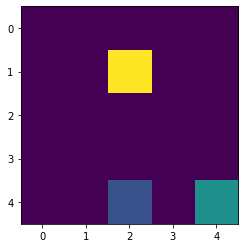

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -0.9436, 'R': -1.0482}, (2, 3): {'U': -1.2

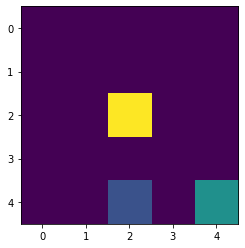

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.5916, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.2

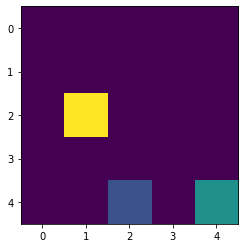

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.5465}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.2

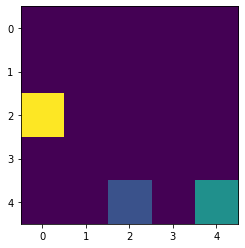

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6281}, (2, 1): {'U': -1.5487, 'D': -1.1933, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.2

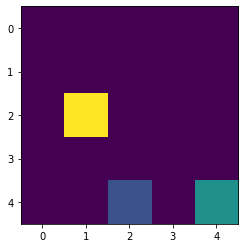

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6281}, (2, 1): {'U': -1.5487, 'D': -1.2122, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.2

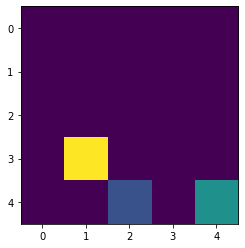

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6281}, (2, 1): {'U': -1.5487, 'D': -1.2122, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.2

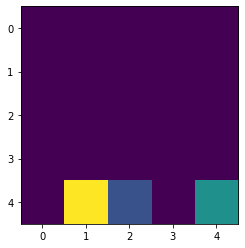

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6281}, (2, 1): {'U': -1.5487, 'D': -1.2122, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.2

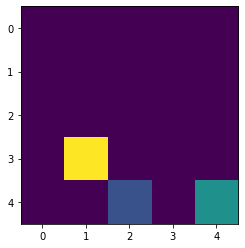

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6281}, (2, 1): {'U': -1.5487, 'D': -1.2122, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.2

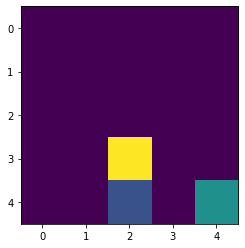

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6281}, (2, 1): {'U': -1.5487, 'D': -1.2122, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.6571, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.2

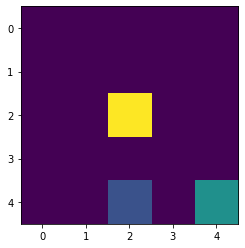

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.7599, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6281}, (2, 1): {'U': -1.5487, 'D': -1.2122, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.2

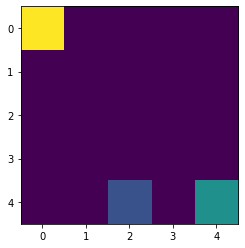

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.7975, 'D': -2.4348, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6281}, (2, 1): {'U': -1.5487, 'D': -1.2122, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.27

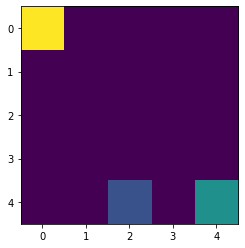

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.7975, 'D': -2.4619, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9629, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6281}, (2, 1): {'U': -1.5487, 'D': -1.2122, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.27

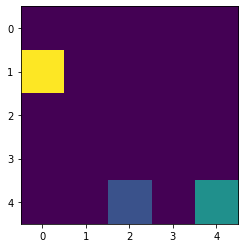

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.7975, 'D': -2.4619, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9917, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6281}, (2, 1): {'U': -1.5487, 'D': -1.2122, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.27

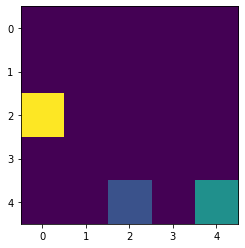

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.7975, 'D': -2.4619, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9917, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6964}, (2, 1): {'U': -1.5487, 'D': -1.2122, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.27

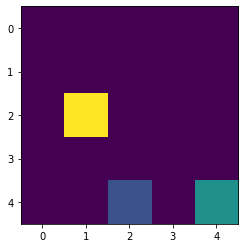

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.7975, 'D': -2.4619, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9917, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6964}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.278

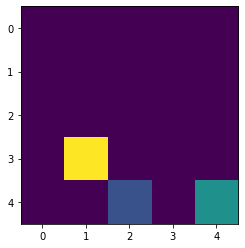

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.7975, 'D': -2.4619, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9917, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6964}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.278

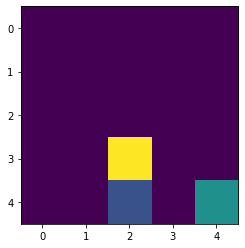

Next state of Agent :  (4, 2)
Reward got :  -3
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.7975, 'D': -2.4619, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9917, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6964}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.278

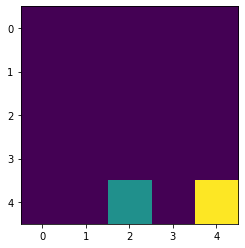

Reward in the end :  -3
Timestep :  8

GAME LOST!!!!
..................................................

Q-Table 

{(0, 0): {'U': -2.7975, 'D': -2.4619, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9917, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6964}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.2784, 'D': 

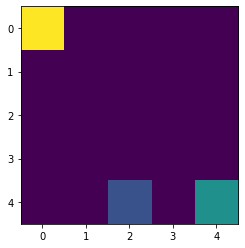

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4619, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9917, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6964}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.278

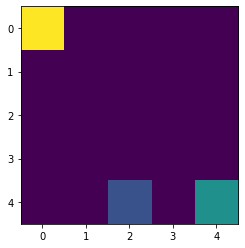

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -1.9917, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6964}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.278

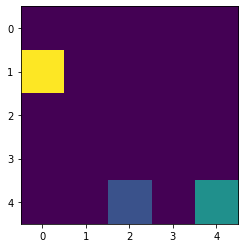

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.6964}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.278

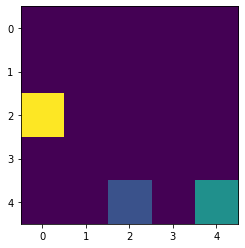

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.6947, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.278

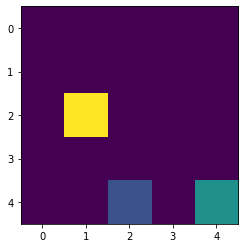

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.3836, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.278

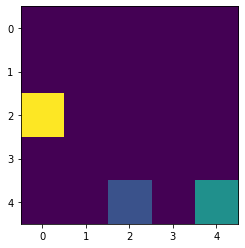

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.278

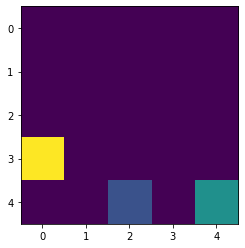

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.278

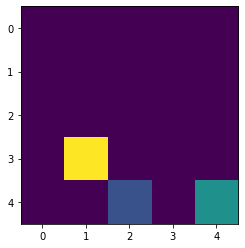

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.278

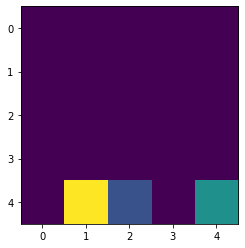

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.278

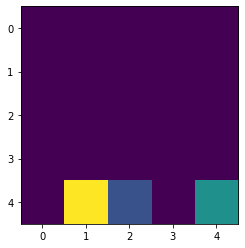

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.27

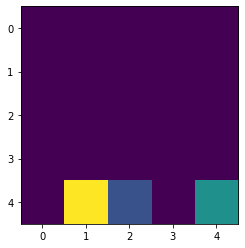

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.27

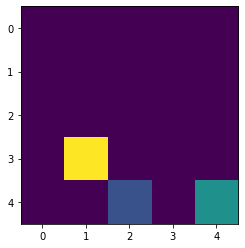

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.27

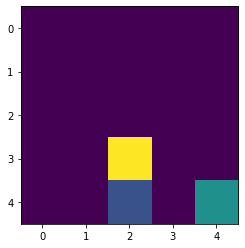

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.27

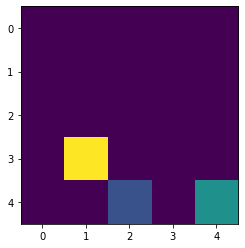

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.27

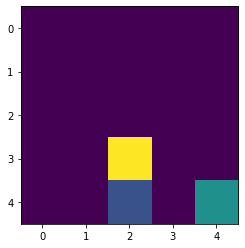

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.0482}, (2, 3): {'U': -1.27

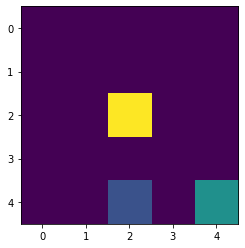

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.278

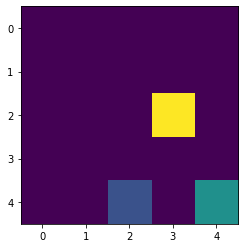

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.278

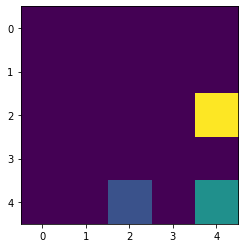

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.278

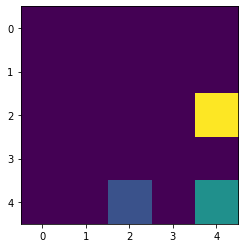

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.278

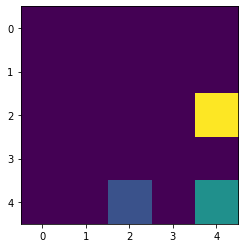

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.4882, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.278

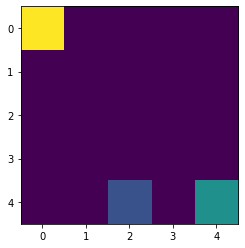

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.013}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.2784

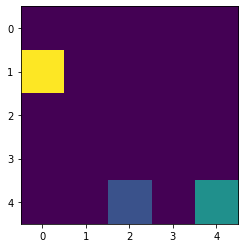

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.6544, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.278

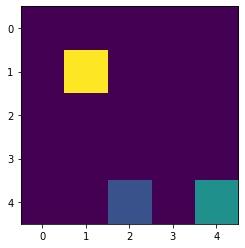

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.263, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.278

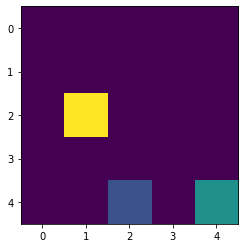

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.27

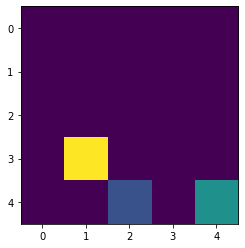

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.27

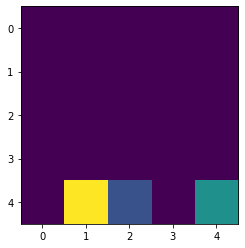

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.27

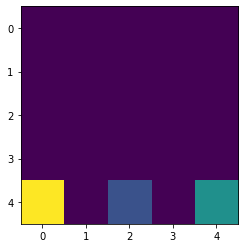

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.27

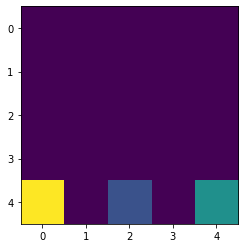

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.27

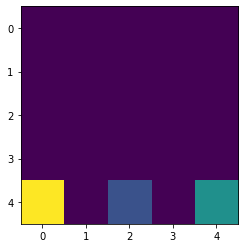

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.27

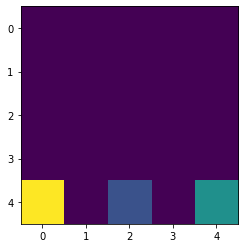

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.2

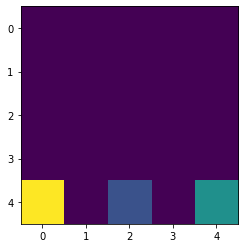

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.2

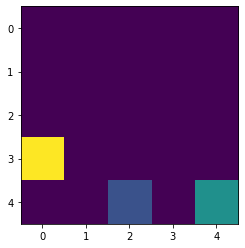

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.2

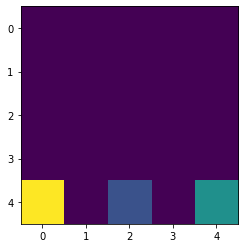

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.2

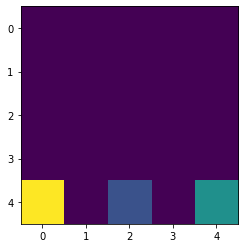

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.2

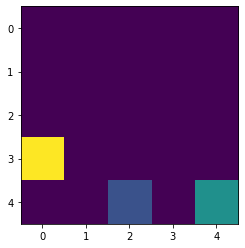

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.2

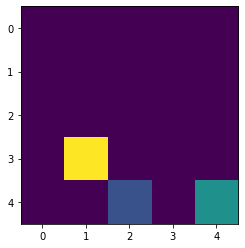

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.2

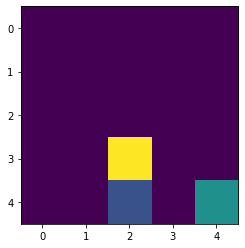

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.2

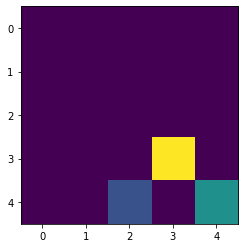

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.2

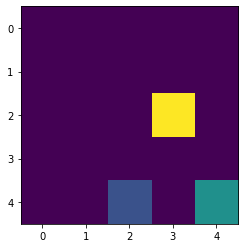

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.0146}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3

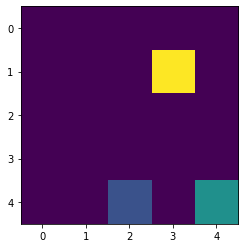

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5126, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3

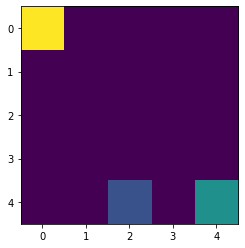

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5324, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0147, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.38

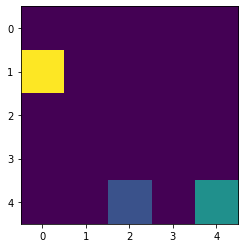

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5324, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0392, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.2928, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.38

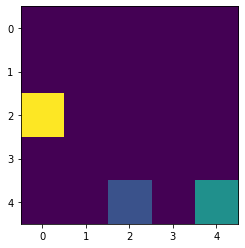

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5324, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.5549, 'D': -2.0392, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.3605, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.38

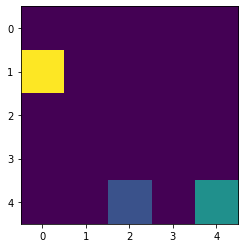

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5324, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0392, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.3605, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.38

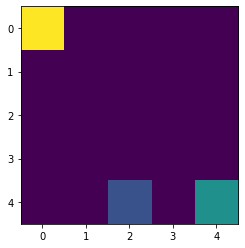

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0392, 'L': -2.2465, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.3605, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.38

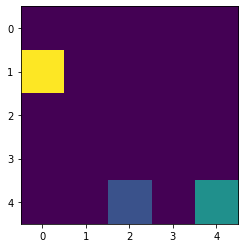

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0392, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.3605, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.38

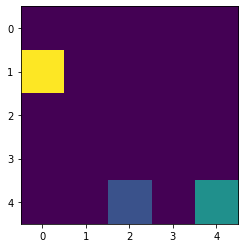

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0588, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.3605, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.38

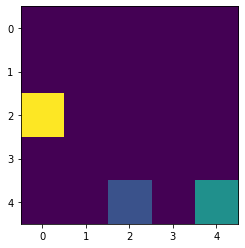

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0588, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.38

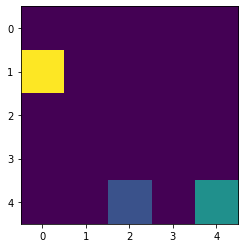

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.4212, 'L': -1.8408, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.38

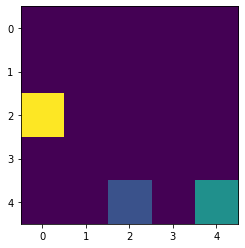

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.4212, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851

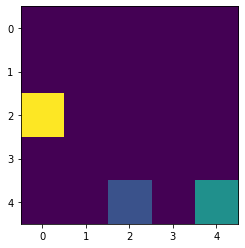

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851

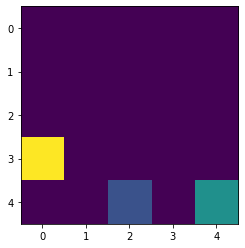

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851

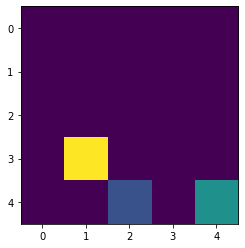

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851

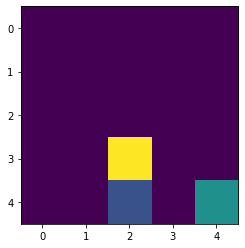

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851

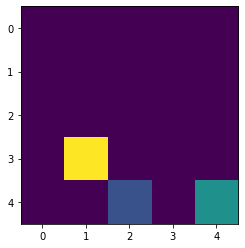

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851

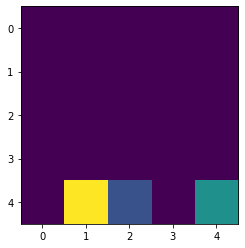

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851

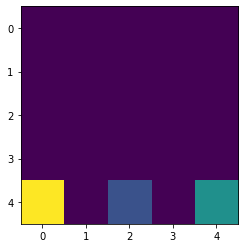

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851

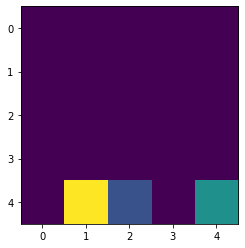

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851

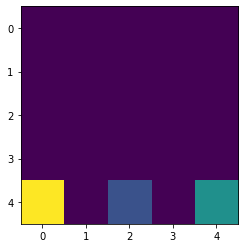

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851

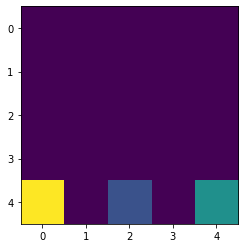

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.5452}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851

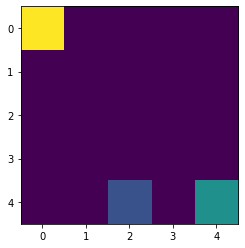

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.3964, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

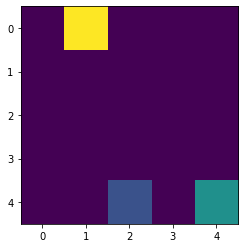

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.1864}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

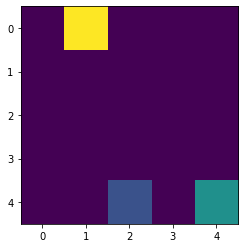

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.7029, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

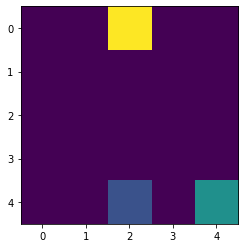

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.5423}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

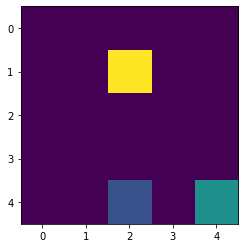

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.1192}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

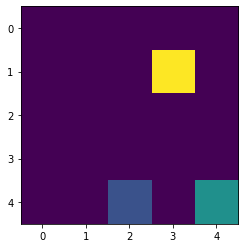

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -0.8103, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

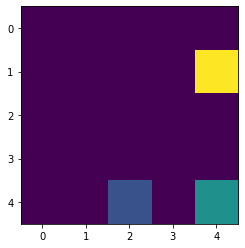

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.0846}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

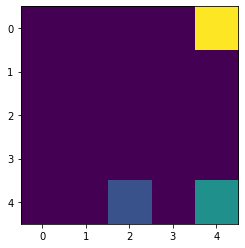

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -0.9847, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

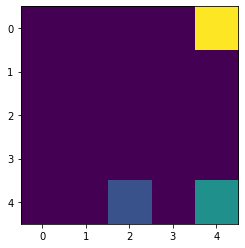

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.6723, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

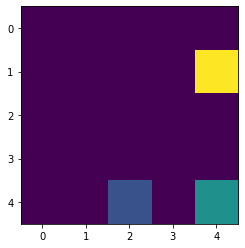

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

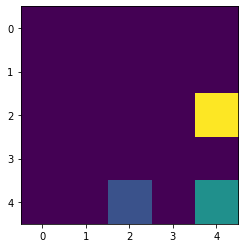

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

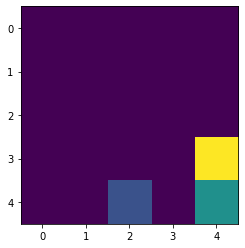

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

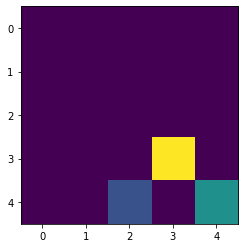

Next state of Agent :  (4, 3)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

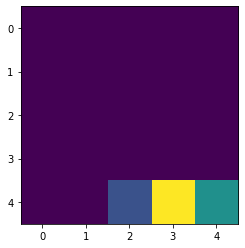

Next state of Agent :  (4, 2)
Reward got :  -3
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

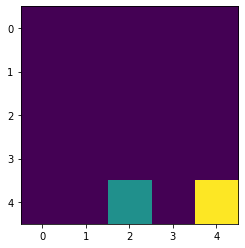

Reward in the end :  -3
Timestep :  15

GAME LOST!!!!
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.586}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 'D': -0.

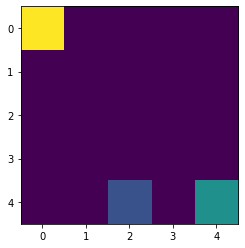

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2025, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

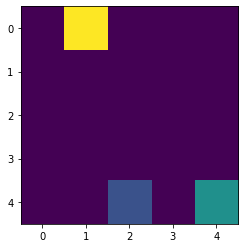

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7175, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

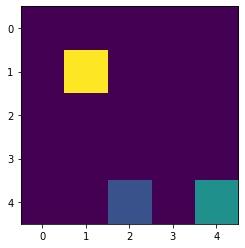

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.2121}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

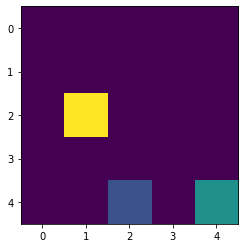

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.7724, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

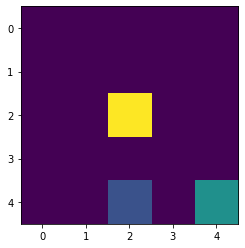

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6056}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

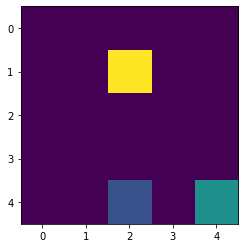

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.7684, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

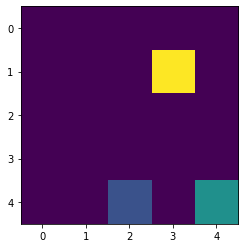

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -1.9163, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, '

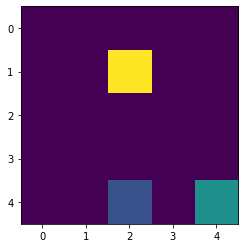

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.7768, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, '

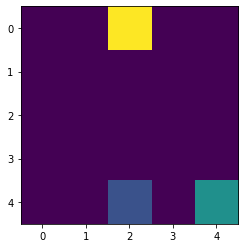

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.7984}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, '

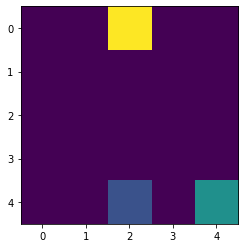

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.2389}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

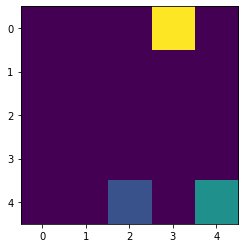

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.2252}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

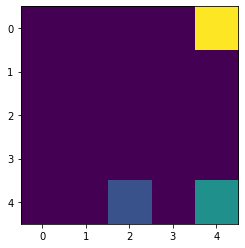

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.0482, 'D': -1.0953, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

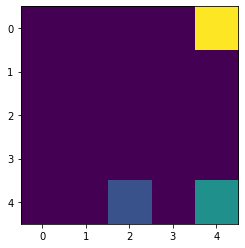

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.0953, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

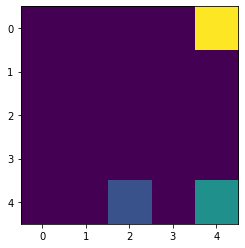

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.7532}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

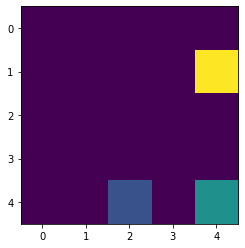

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -0.9231}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

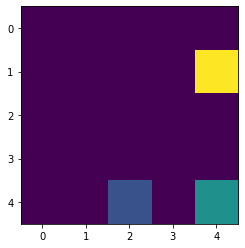

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.766, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, '

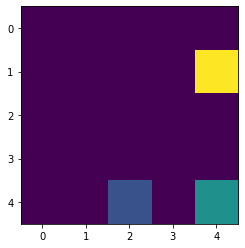

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

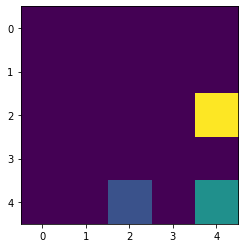

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 

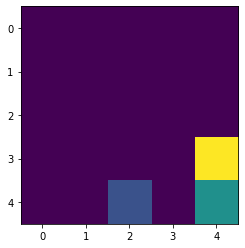

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, '

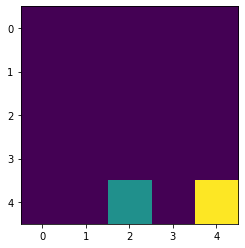

Reward in the end :  4
Timestep :  20

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -2.8319, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, 'D': -0.67

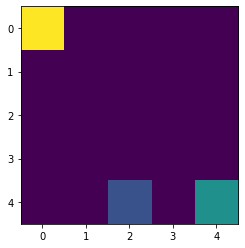

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.8739, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, '

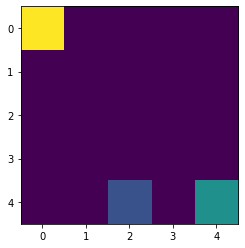

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5522, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, '

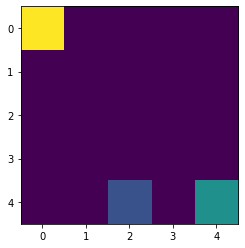

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.6491, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, '

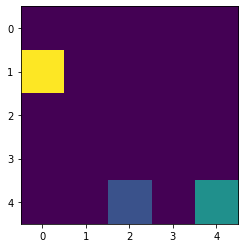

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6212}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, '

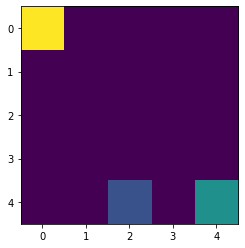

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2216}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, '

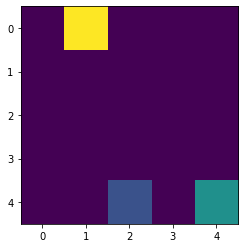

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8091, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, '

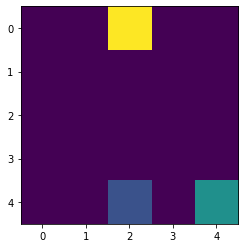

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.5707, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, '

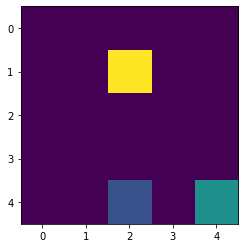

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.1458, 'R': -1.133}, (2, 3): {'U': -1.3851, '

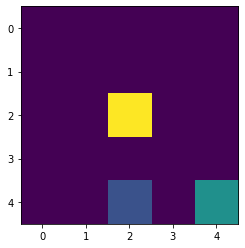

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.3404}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.3311, 'R': -1.133}, (2, 3): {'U': -1.3851, '

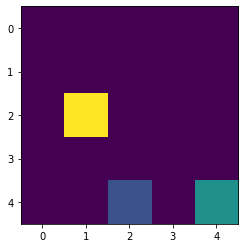

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.0673, 'L': -1.3311, 'R': -1.133}, (2, 3): {'U': -1.3851, 

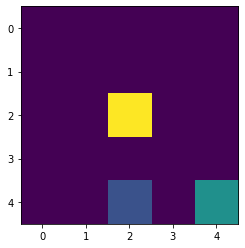

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.3311, 'R': -1.133}, (2, 3): {'U': -1.3851, 

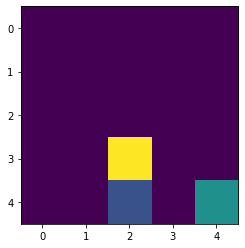

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.3311, 'R': -1.133}, (2, 3): {'U': -1.3851, 

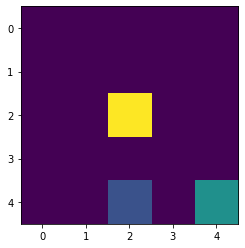

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.3731, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.133}, (2, 3): {'U': -1.3851, 

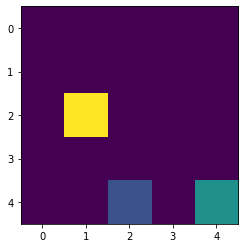

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.133}, (2, 3): {'U': -1.3851, '

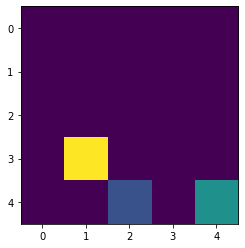

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.133}, (2, 3): {'U': -1.3851, '

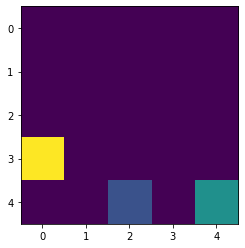

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.133}, (2, 3): {'U': -1.3851, '

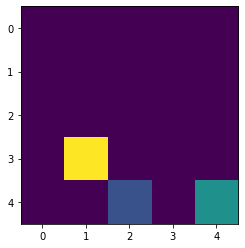

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.133}, (2, 3): {'U': -1.3851, '

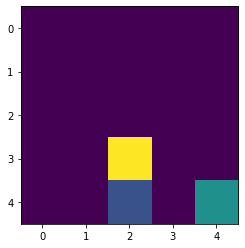

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.133}, (2, 3): {'U': -1.3851, '

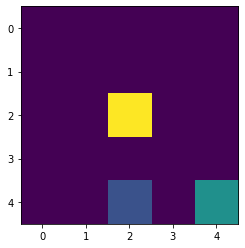

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, '

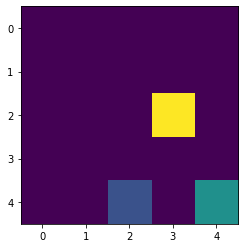

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.6323, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, '

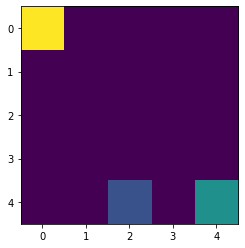

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5737, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 'D

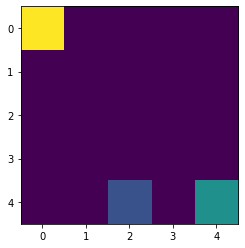

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5909, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3235, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 'D

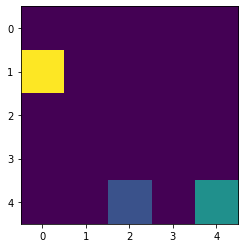

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5909, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.0744, 'L': -2.3907, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 'D

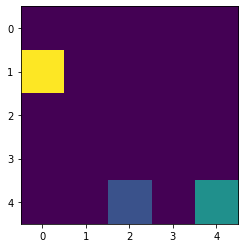

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5909, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.1002, 'L': -2.3907, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 'D

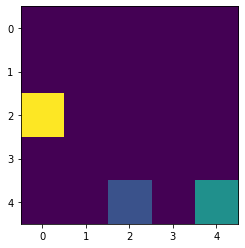

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5909, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.1002, 'L': -2.3907, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -1.9607, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

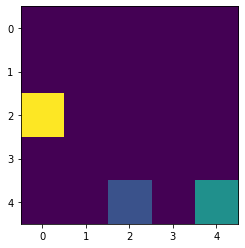

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5909, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.1002, 'L': -2.3907, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -2.0092, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

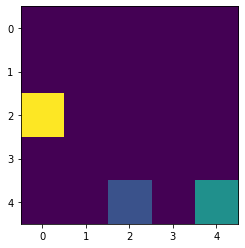

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5909, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.1002, 'L': -2.3907, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -2.048, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

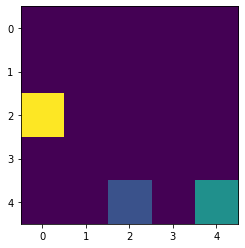

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5909, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.1002, 'L': -2.3907, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4178, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

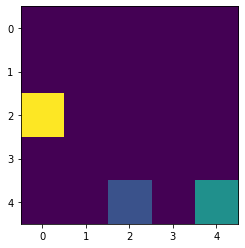

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5909, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7311, 'D': -2.1002, 'L': -2.3907, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

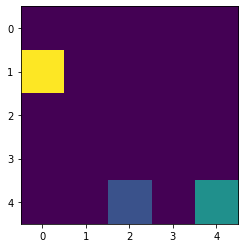

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.5909, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.3907, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851

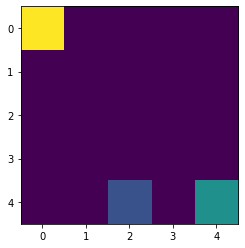

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.6047, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.3907, 'R': -2.0751}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851

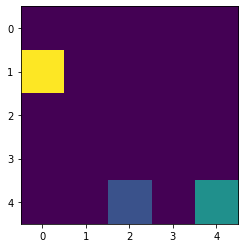

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.6047, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.3907, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.7679, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851

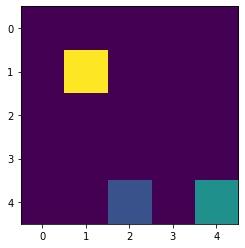

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.6047, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.3907, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.4431}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851

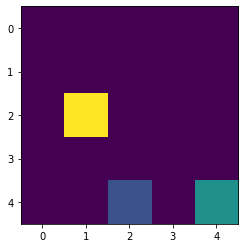

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.6047, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.3907, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.1614, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851

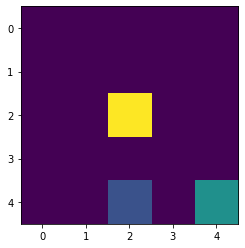

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.6047, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.3907, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851

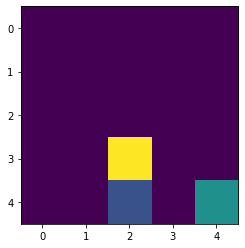

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.6047, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.3907, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851

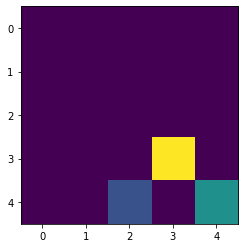

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.6047, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.3907, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851

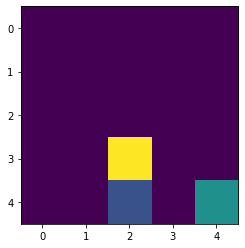

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.6047, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.3907, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851

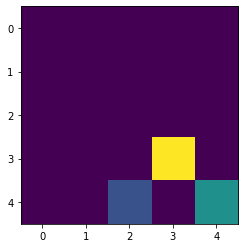

Next state of Agent :  (4, 3)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.6047, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.3907, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851

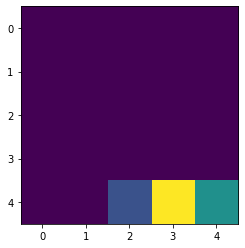

Next state of Agent :  (4, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.9075, 'D': -2.6047, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.3907, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851

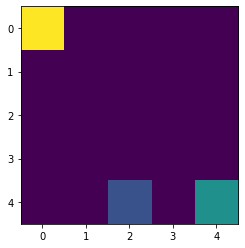

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.9428, 'D': -2.6047, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.3907, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

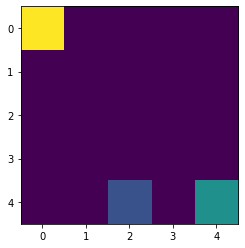

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6047, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.3907, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

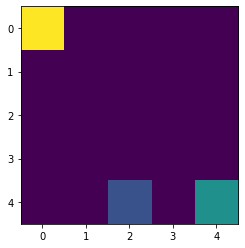

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.3907, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

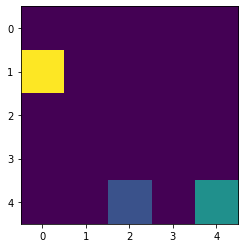

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1002, 'L': -2.4486, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

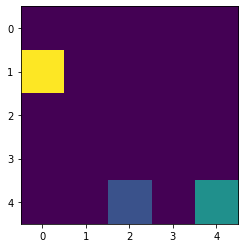

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1208, 'L': -2.4486, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.0791, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

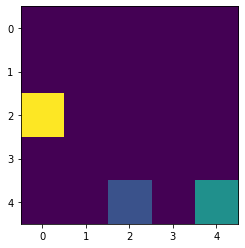

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1208, 'L': -2.4486, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5041, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

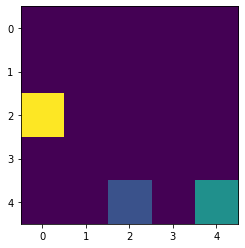

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1208, 'L': -2.4486, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5704, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

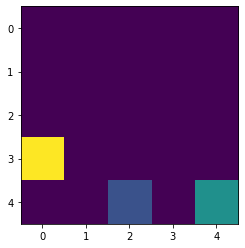

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1208, 'L': -2.4486, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.4663, 'D': -1.5704, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

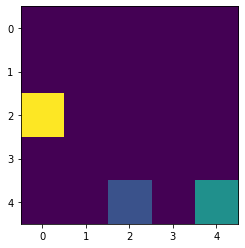

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1208, 'L': -2.4486, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.5704, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

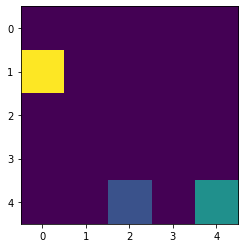

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1208, 'L': -2.4982, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.5704, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

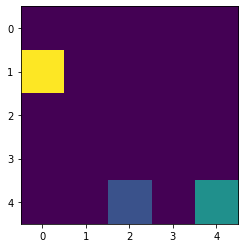

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.5704, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

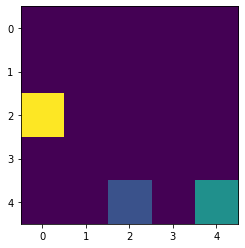

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6234, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

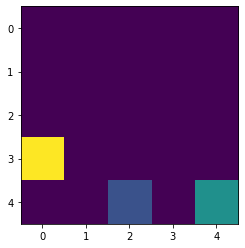

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6234, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

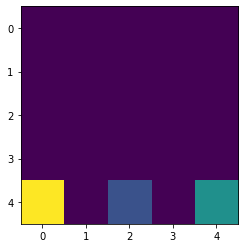

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6234, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

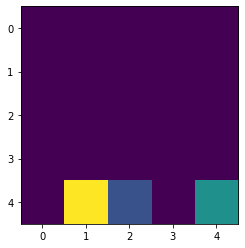

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6234, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

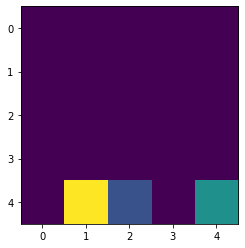

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6234, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

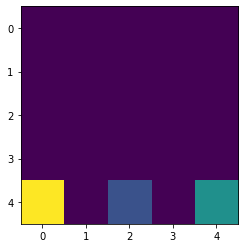

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6234, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

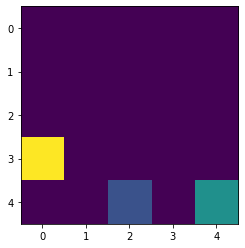

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6234, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

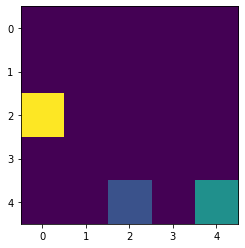

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

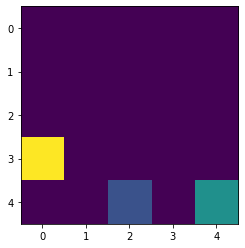

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6198, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851,

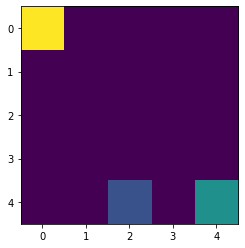

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.1429}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

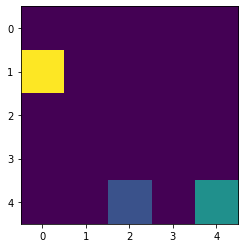

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.8452, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

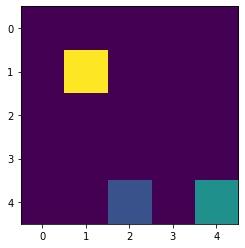

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.5403}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

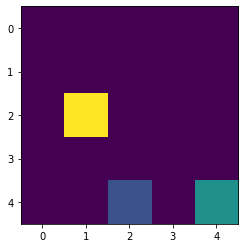

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.8692, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

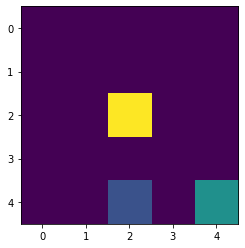

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6273, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

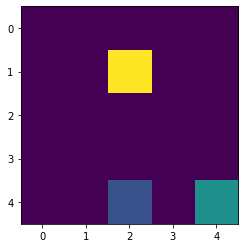

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.2367, 'L': -1.4846, 'R': -1.214}, (2, 3): {'U': -1.3851, 

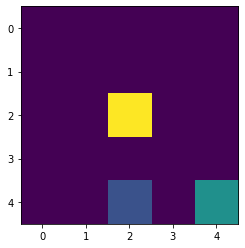

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.2367, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

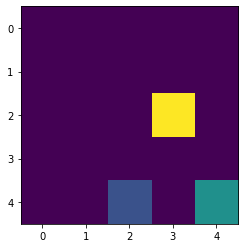

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.2367, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

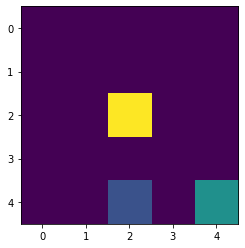

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

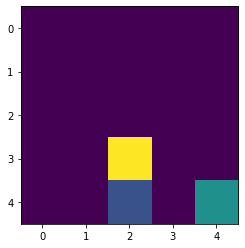

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

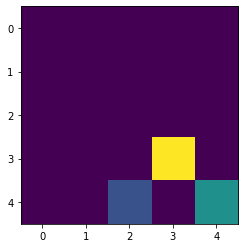

Next state of Agent :  (4, 3)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

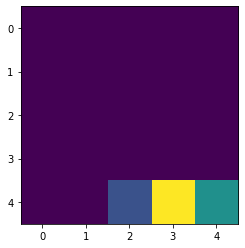

Next state of Agent :  (4, 3)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

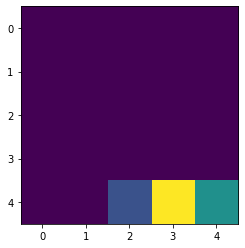

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

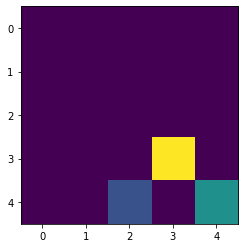

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

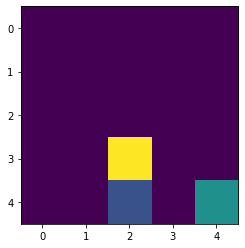

Next state of Agent :  (4, 2)
Reward got :  -3
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

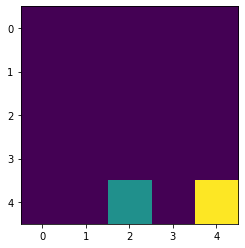

Reward in the end :  -3
Timestep :  16

GAME LOST!!!!
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7176, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 'D': -0

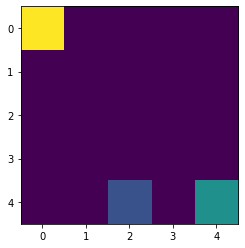

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.7963, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

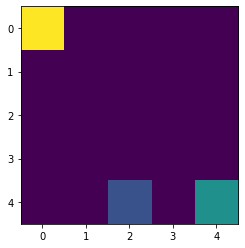

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.971, 'D': -2.6387, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

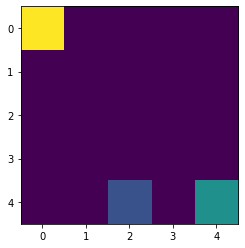

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6387, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

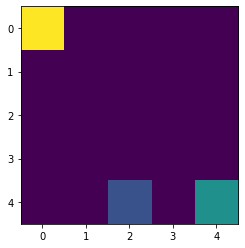

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1479, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

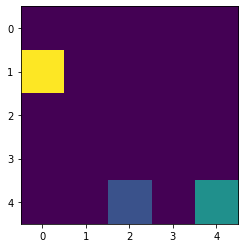

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1039, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

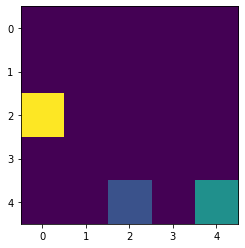

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.6658, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

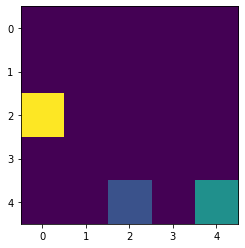

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

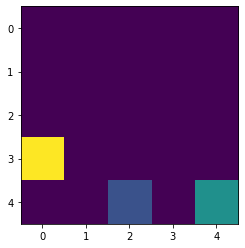

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

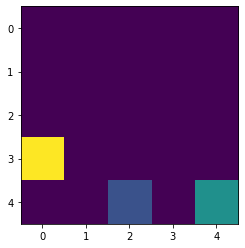

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

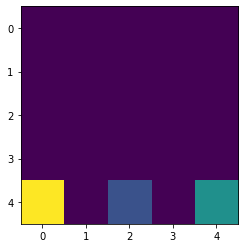

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

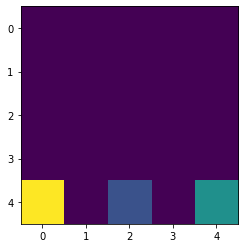

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

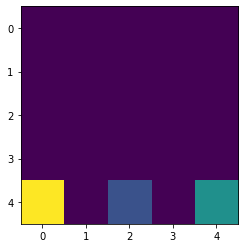

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

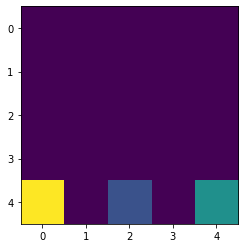

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

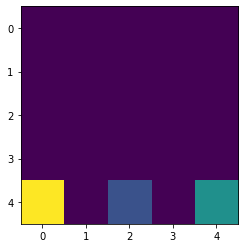

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

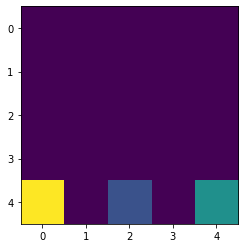

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

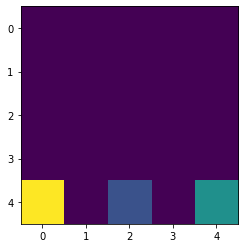

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

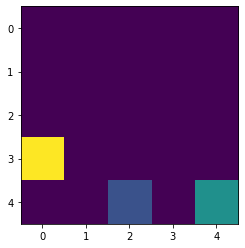

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

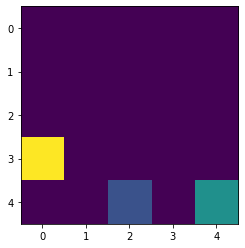

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

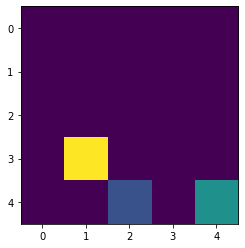

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

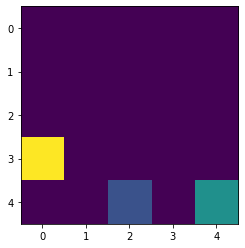

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6524}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

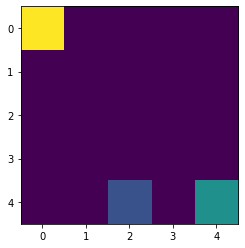

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.6323, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

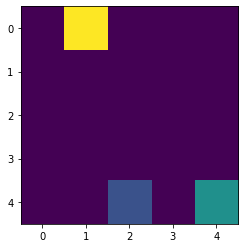

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6546, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

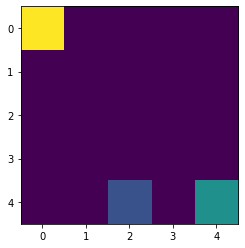

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.4982, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

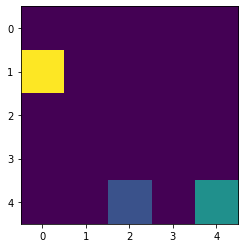

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.1848, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

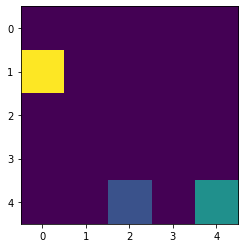

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2239, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5124, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

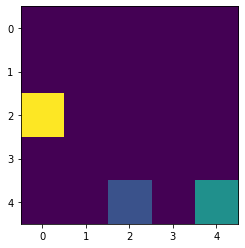

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2239, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

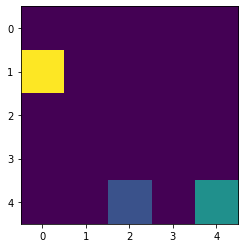

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.7251, 'L': -2.1496, 'R': -1.7511}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

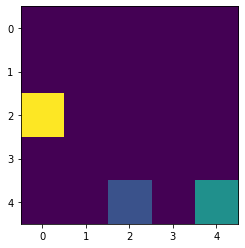

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.7251, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.7771, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

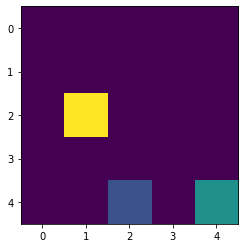

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.7251, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

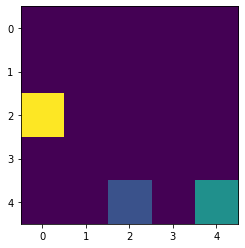

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

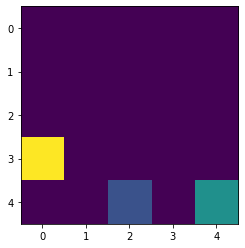

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

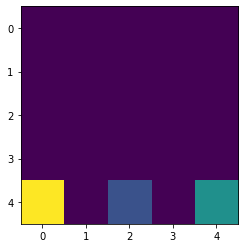

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

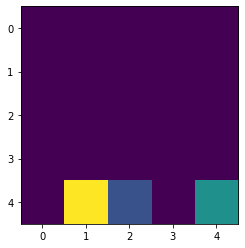

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

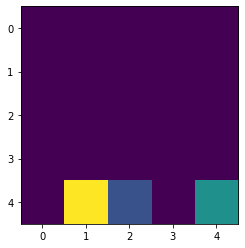

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

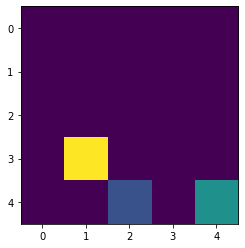

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

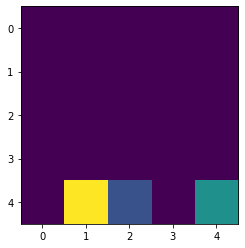

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

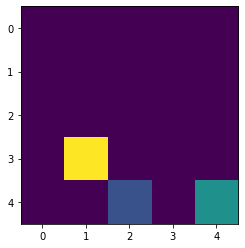

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

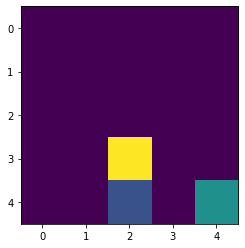

Next state of Agent :  (4, 2)
Reward got :  -3
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

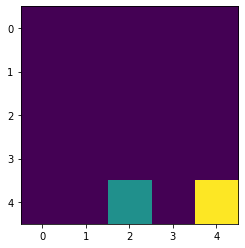

Reward in the end :  -3
Timestep :  19

GAME LOST!!!!
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.8592, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 'D': -0.

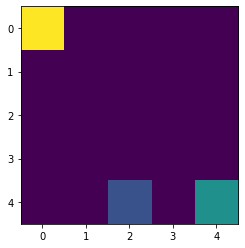

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.9151, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, '

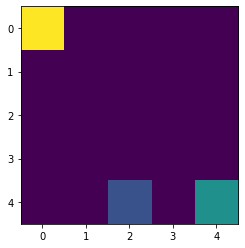

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -2.999, 'D': -2.6732, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, '

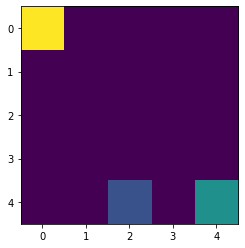

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6732, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

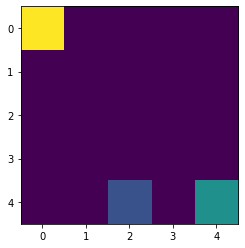

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.5481, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

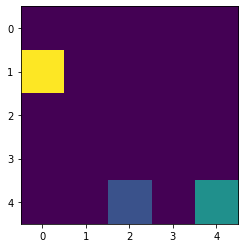

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2096}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, '

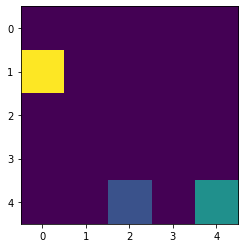

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -1.9101, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, '

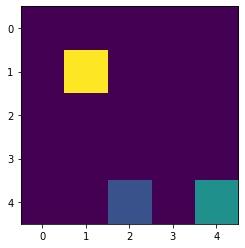

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -1.962, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.462, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 'D

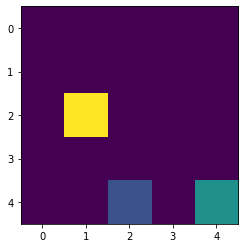

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -1.962, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.5857, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, '

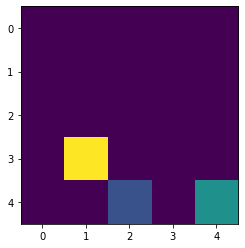

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -1.962, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.5487, 'D': -1.5857, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, '

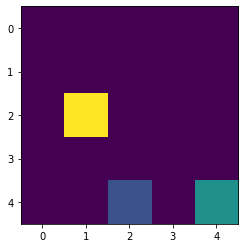

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -1.962, 'L': -2.1342, 'R': -1.9356}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.5857, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

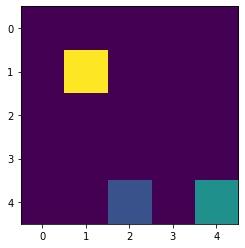

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -1.962, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.6829, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.5857, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

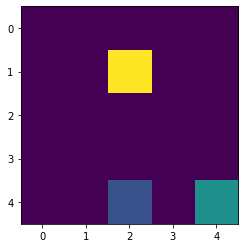

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -1.962, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.5857, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

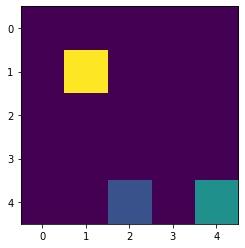

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.5857, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

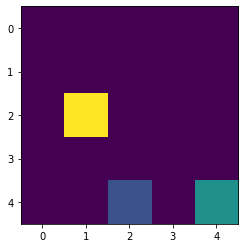

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

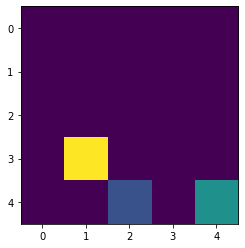

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

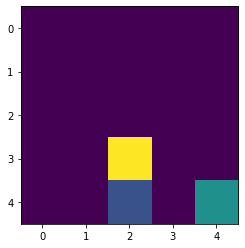

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

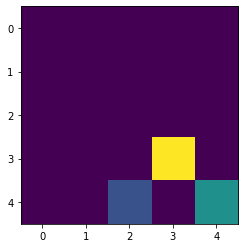

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

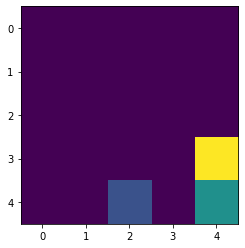

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

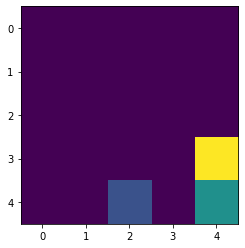

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

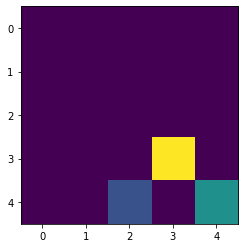

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.6921, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

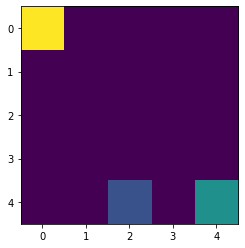

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.592, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851, 

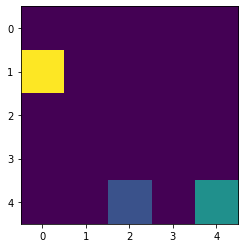

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2551, 'L': -2.6344, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

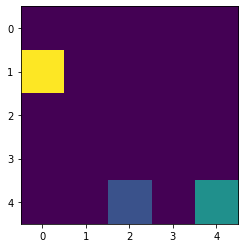

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.1496, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

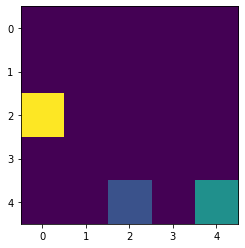

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.5635, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

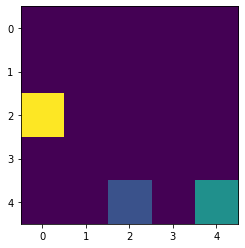

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.2733}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

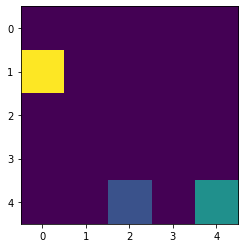

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0135}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

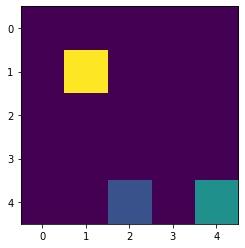

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -1.8602, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

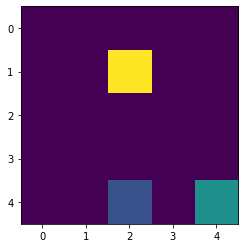

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0233, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

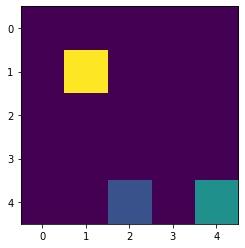

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.6265}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851,

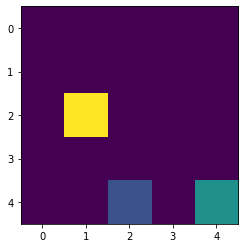

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.2788}, (2, 3): {'U': -1.3851

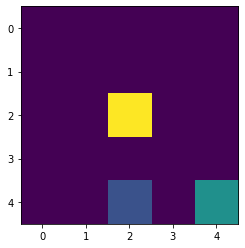

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

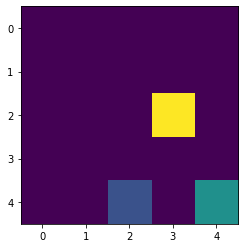

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

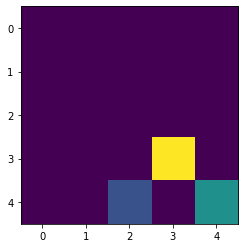

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

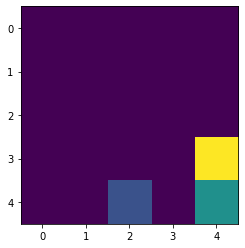

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

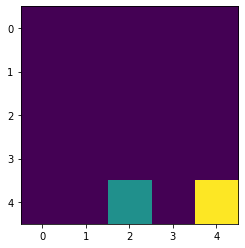

Reward in the end :  4
Timestep :  15

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.6798}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851, 'D': -0.

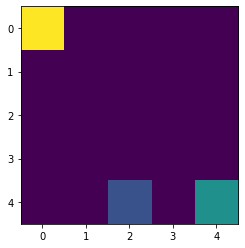

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.7306, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

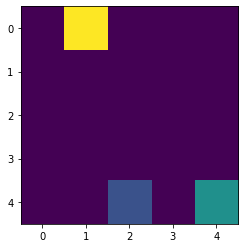

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -2.9598, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

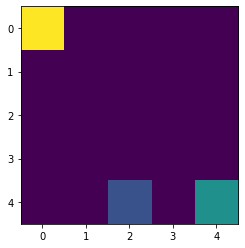

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7145, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

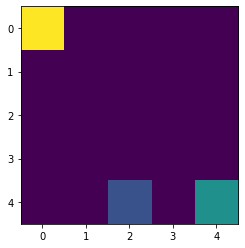

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.2942, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

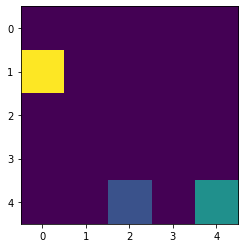

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.813, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

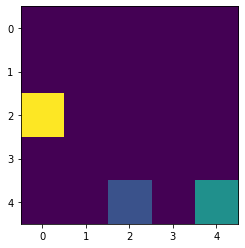

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

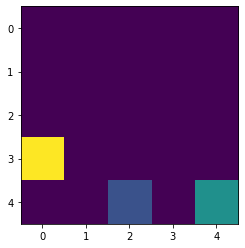

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

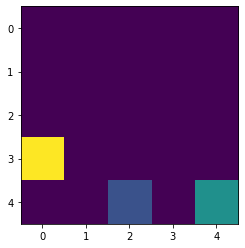

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

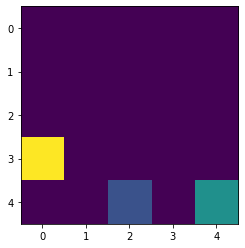

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

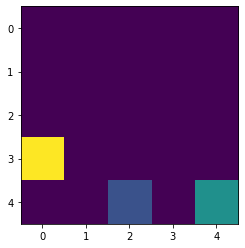

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

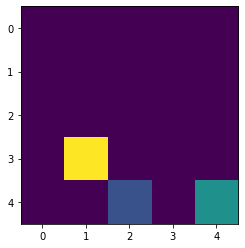

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

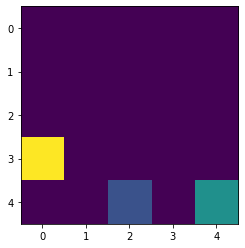

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

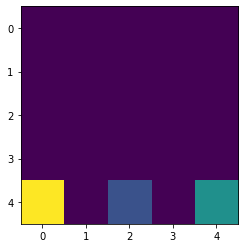

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

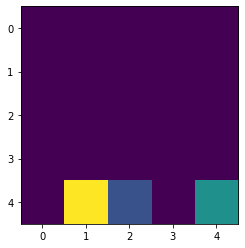

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

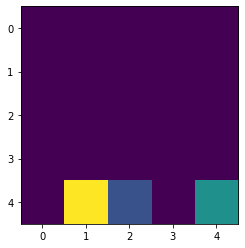

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

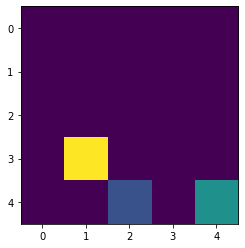

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

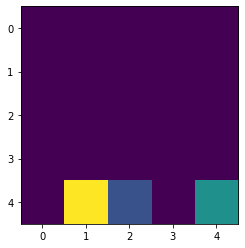

Next state of Agent :  (4, 2)
Reward got :  -3
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

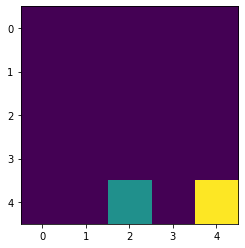

Reward in the end :  -3
Timestep :  18

GAME LOST!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7387, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851, 'D': 

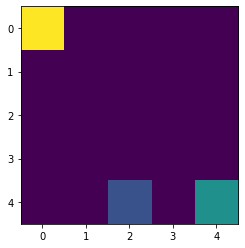

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3254, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

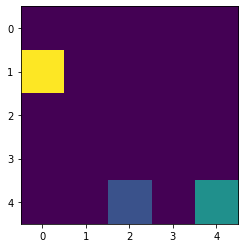

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.8348}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

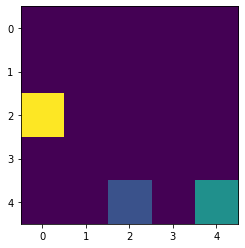

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.7487, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

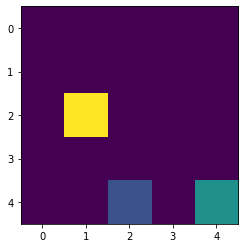

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.0758}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

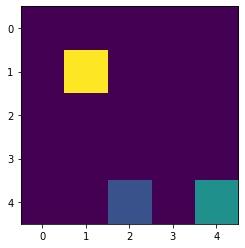

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6562}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

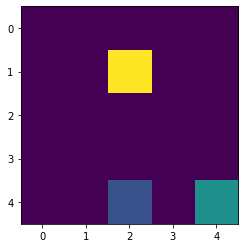

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.1621, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

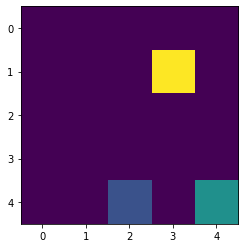

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.3588}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

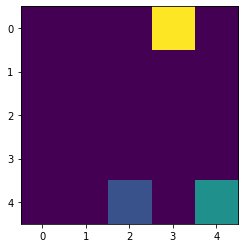

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.3479}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

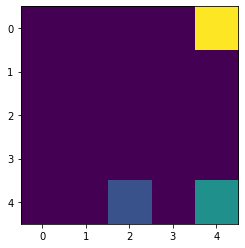

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.2063, 'D': -1.1968, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

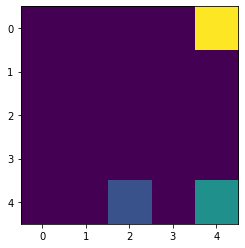

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.1968, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

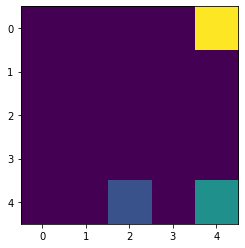

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8468, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

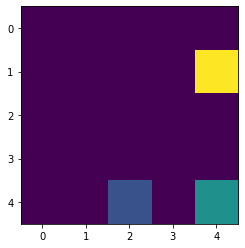

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

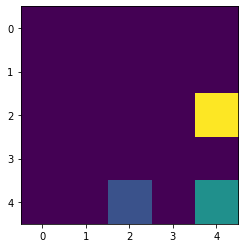

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

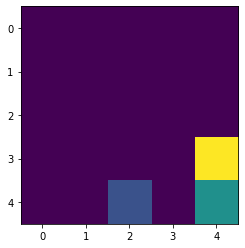

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

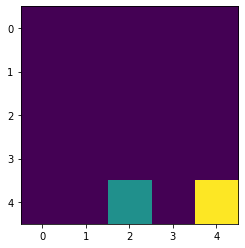

Reward in the end :  4
Timestep :  15

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0001, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851, 'D': -0.

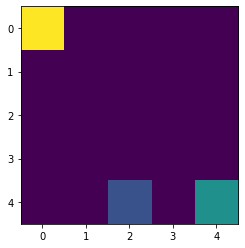

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.763, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

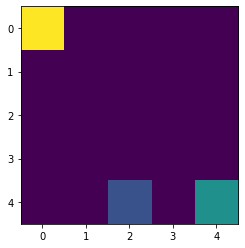

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.3408}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

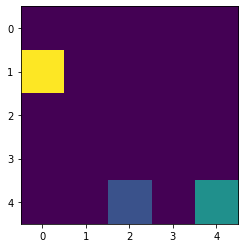

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.0789, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

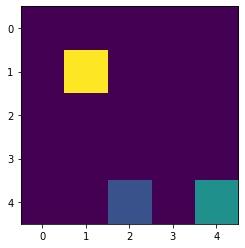

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.6861, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

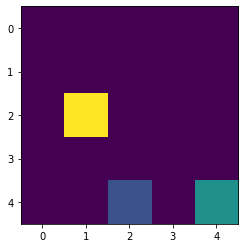

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

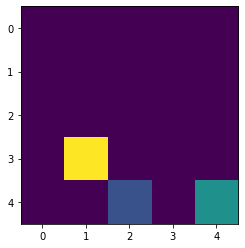

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

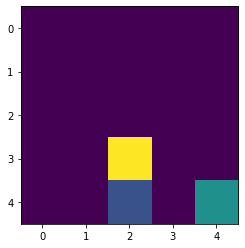

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

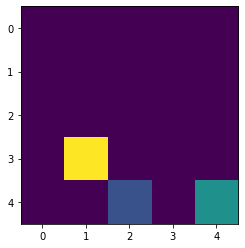

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

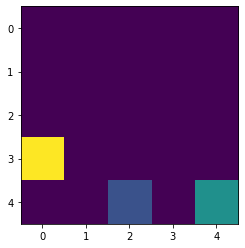

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.8881, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

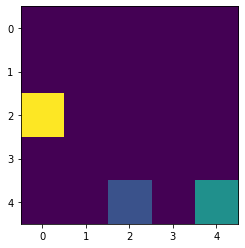

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

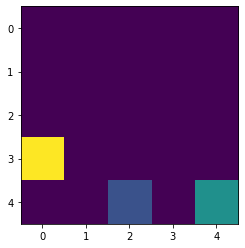

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

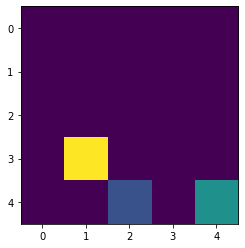

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

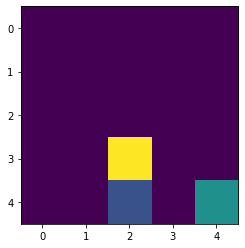

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

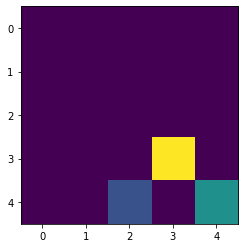

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

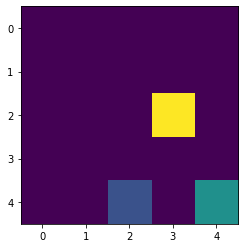

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

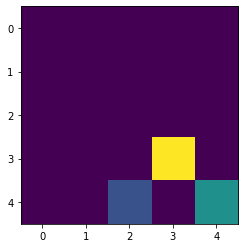

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

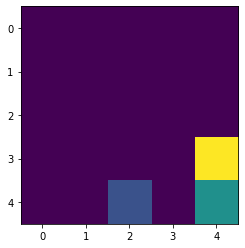

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

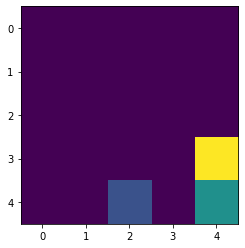

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

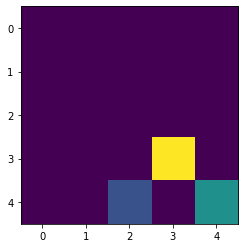

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

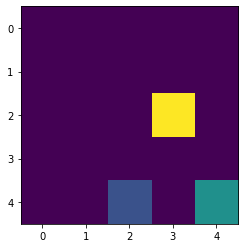

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7017}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

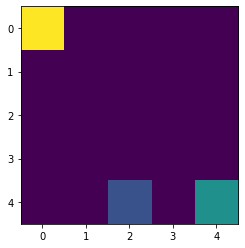

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7192}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8168, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

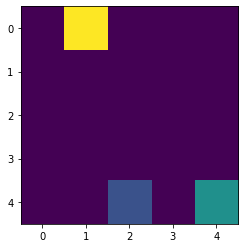

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.7849, 'L': -3.0324, 'R': -2.7192}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8885, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

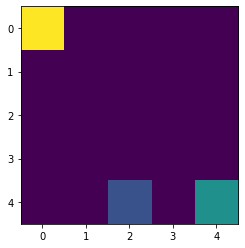

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7192}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8885, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4053}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

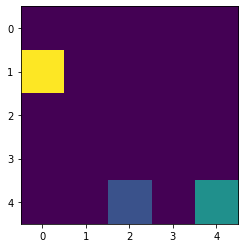

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7192}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8885, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1256}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

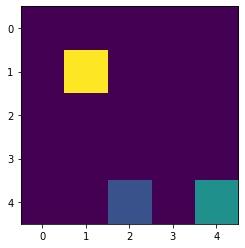

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7192}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8885, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1719}, (1, 2): {'U': -2.0173, 'D': -1.6961, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

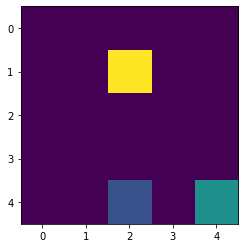

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7192}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8885, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1719}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.325, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

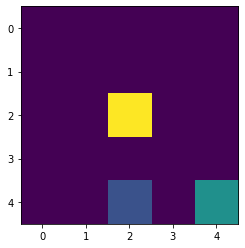

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7192}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8885, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1719}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

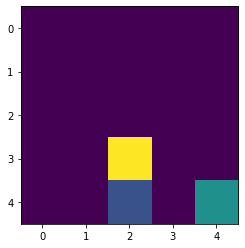

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7192}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8885, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1719}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

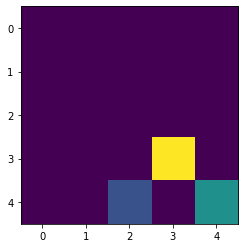

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7192}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8885, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1719}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

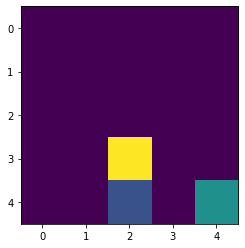

Next state of Agent :  (4, 2)
Reward got :  -3
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7192}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8885, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1719}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

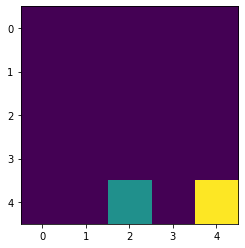

Reward in the end :  -3
Timestep :  11

GAME LOST!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7192}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8885, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1719}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851, 'D': 

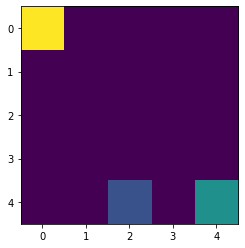

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7332}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.8885, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1719}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

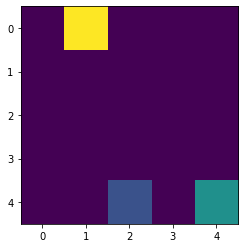

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7332}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1719}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

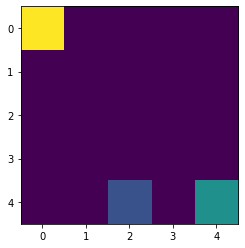

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.2368, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1719}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

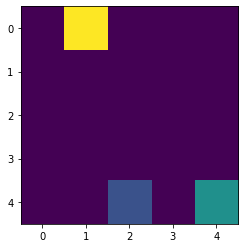

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.1719}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

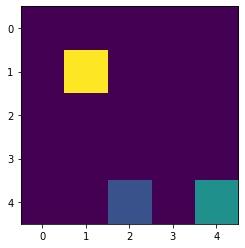

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.6967}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

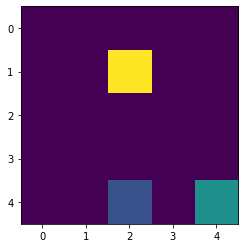

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.7291}, (1, 3): {'U': -1.3471, 'D': -1.0733, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

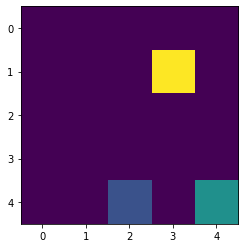

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.7291}, (1, 3): {'U': -1.3471, 'D': -1.175, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851, 

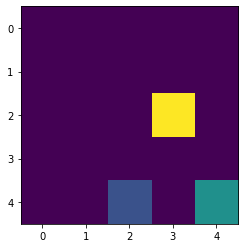

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.7291}, (1, 3): {'U': -1.3471, 'D': -1.175, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -1.9557, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851, 

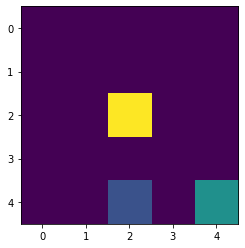

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.0173, 'D': -1.7689, 'L': -2.0119, 'R': -1.7291}, (1, 3): {'U': -1.3471, 'D': -1.175, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851, 

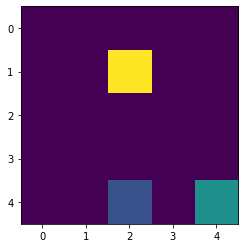

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.8986, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7291}, (1, 3): {'U': -1.3471, 'D': -1.175, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

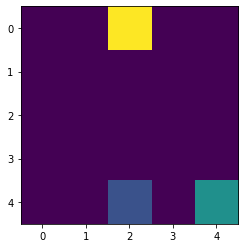

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7291}, (1, 3): {'U': -1.3471, 'D': -1.175, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

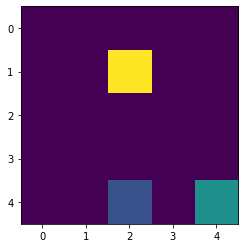

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.175, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

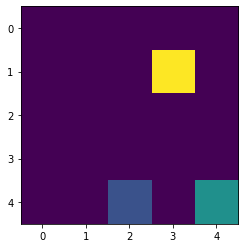

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

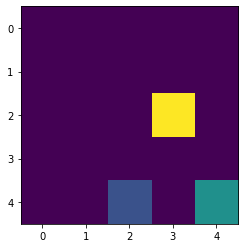

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

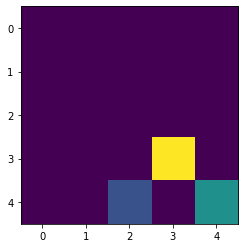

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

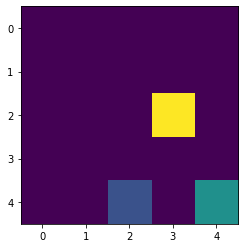

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

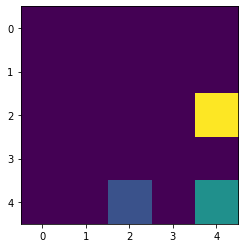

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

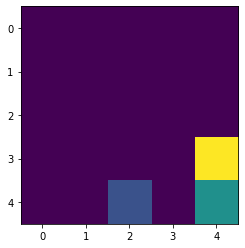

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

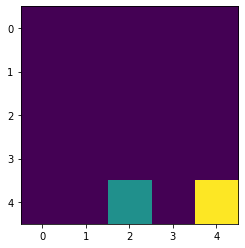

Reward in the end :  4
Timestep :  19

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0269, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851, 'D': -0.

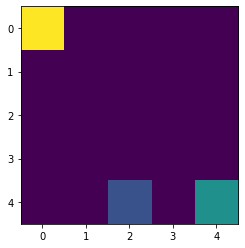

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0606, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

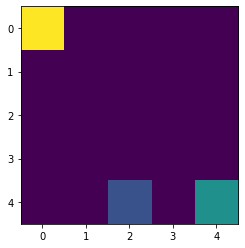

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7444}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

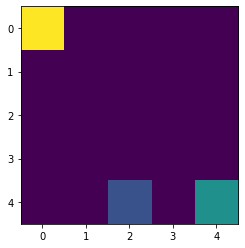

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.2667}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

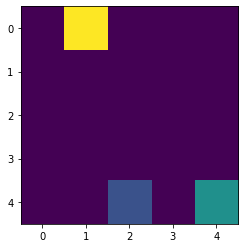

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3073}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8369}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

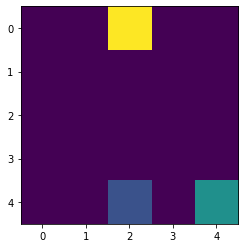

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3073}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8973}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.4236, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

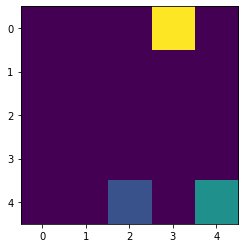

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3073}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.8973}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.6424, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

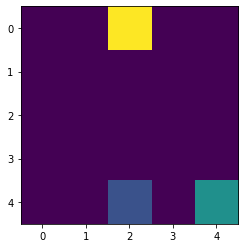

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3073}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.9544}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.6424, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

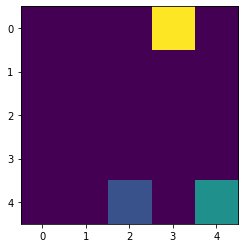

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3073}, (0, 2): {'U': -1.9057, 'D': -1.9955, 'L': -2.2442, 'R': -1.9544}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

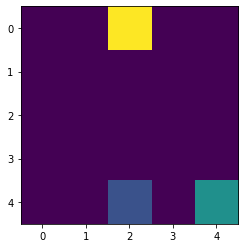

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3073}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.2442, 'R': -1.9544}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851,

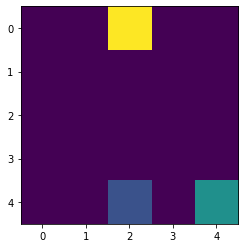

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3073}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -1.9544}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

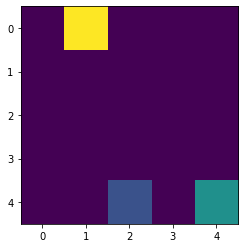

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -1.9544}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

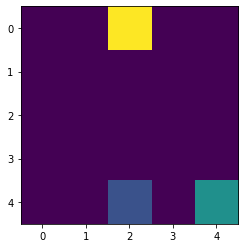

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.4785}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

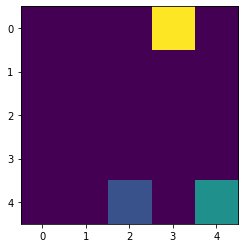

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.2929, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

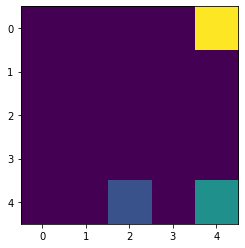

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.061}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

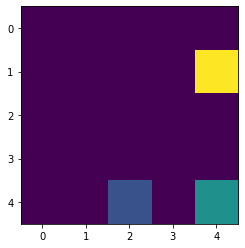

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.1954}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

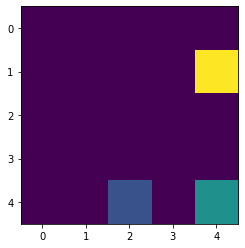

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.9162, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

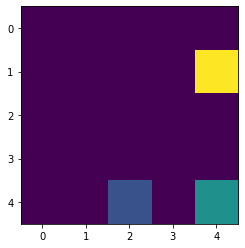

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

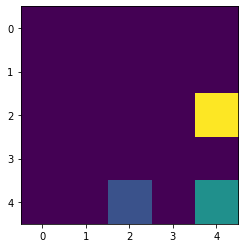

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

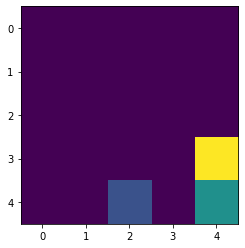

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

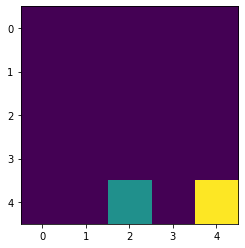

Reward in the end :  4
Timestep :  20

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7582}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851, 'D': -0

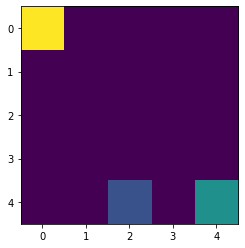

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7795}, (0, 1): {'U': -2.4669, 'D': -2.3307, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

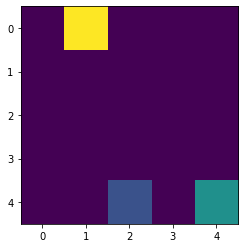

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7795}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.209}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

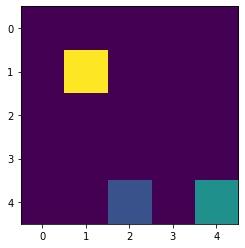

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7795}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.7689, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

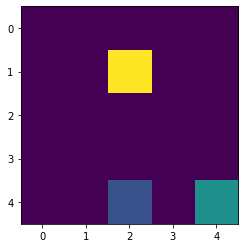

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7795}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.828, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.0412, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

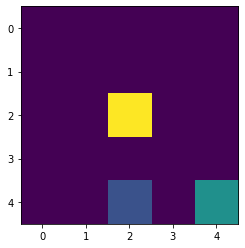

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7795}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.828, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.3851

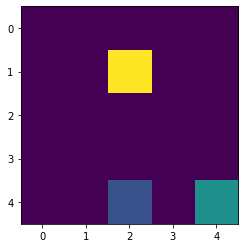

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7795}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.3306}, (2, 3): {'U': -1.385

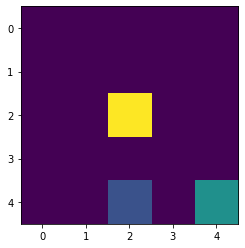

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7795}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.3757}, (2, 3): {'U': -1.385

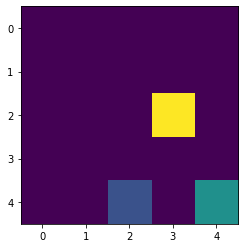

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7795}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.3757}, (2, 3): {'U': -1.385

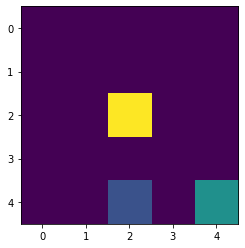

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7795}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.385

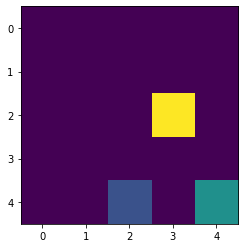

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7795}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.38

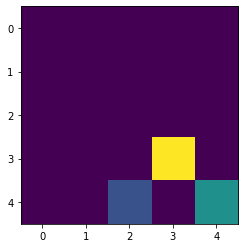

Next state of Agent :  (4, 3)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7795}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.38

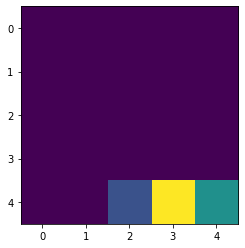

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7795}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.385

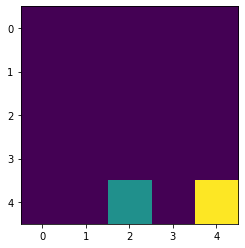

Reward in the end :  4
Timestep :  13

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.7795}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.3851, 'D': -

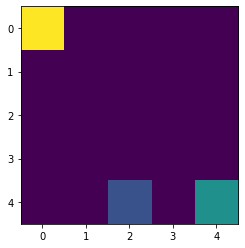

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.801}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.3585}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.3851

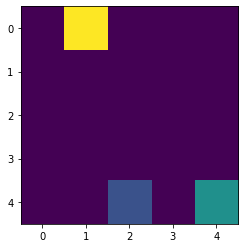

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.801}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -1.9955, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.3851

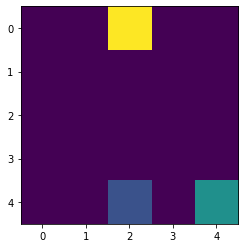

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.801}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.7713}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.3851

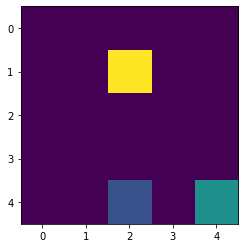

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.801}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2029}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.3851

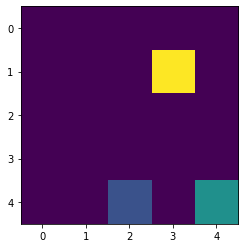

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.801}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2985}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.3405, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.3851

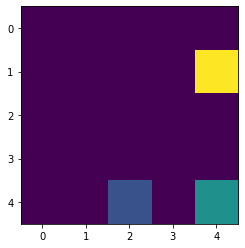

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.801}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.2563, 'L': -1.866, 'R': -1.2985}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.3851

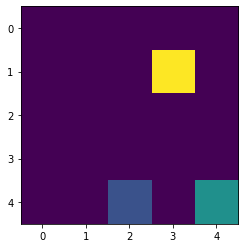

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.801}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.2985}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.3851

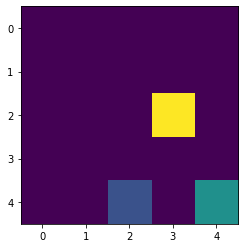

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.801}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.2985}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.5158

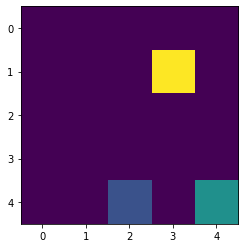

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.801}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.8513, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.5158,

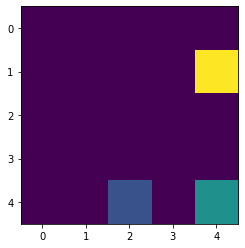

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.801}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.5158

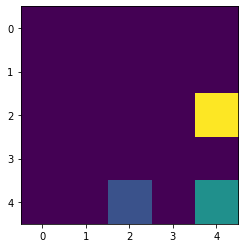

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.801}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.5158

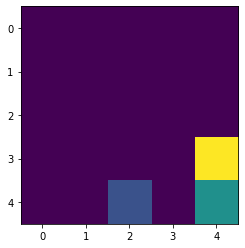

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.801}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.5158,

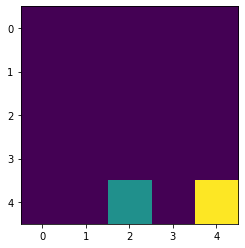

Reward in the end :  4
Timestep :  13

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.801}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.5158, 'D': -0.

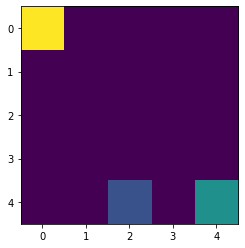

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4058, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.5158

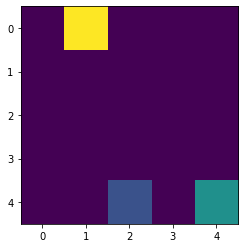

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1329, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.5158

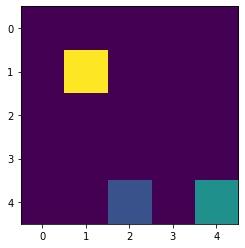

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -1.8977, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.5158

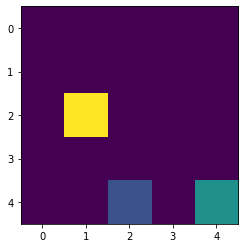

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -1.968, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.5158

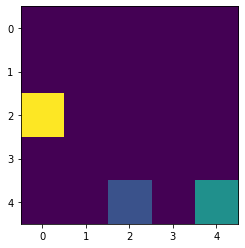

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.515

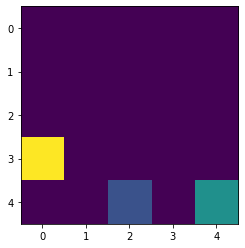

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.515

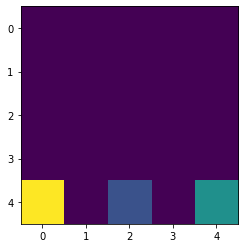

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.515

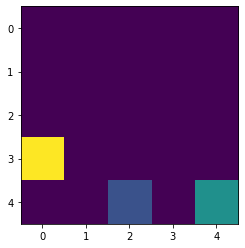

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.515

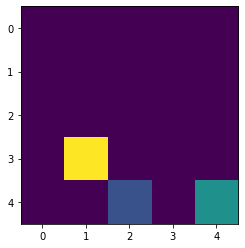

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.515

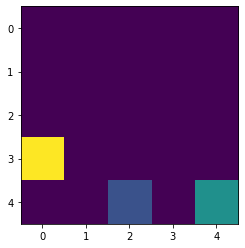

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.51

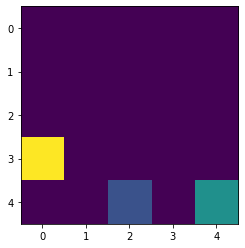

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.51

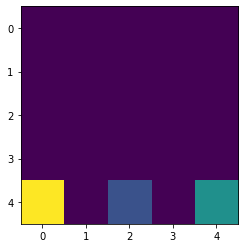

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.51

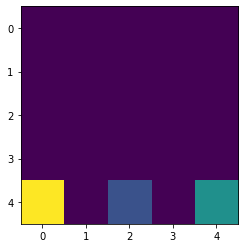

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.51

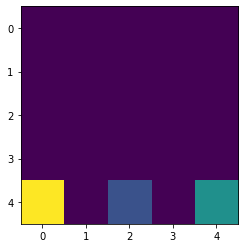

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.51

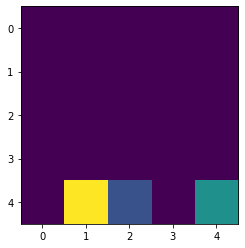

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.51

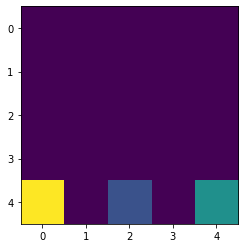

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.51

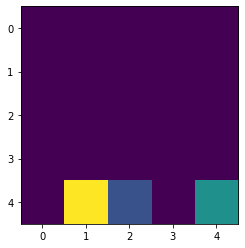

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.51

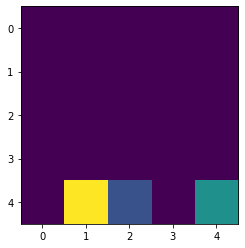

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.51

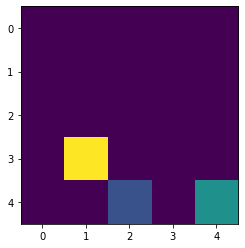

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  19
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7058}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.51

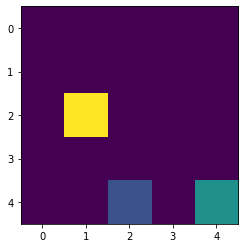

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  20
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8045, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7905}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.51

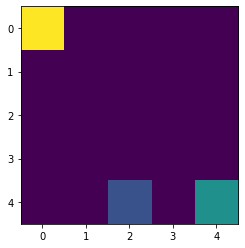

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3539, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7905}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.515

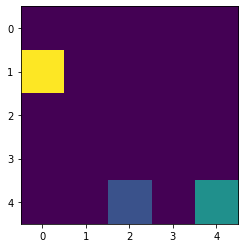

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -1.9376}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7905}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.515

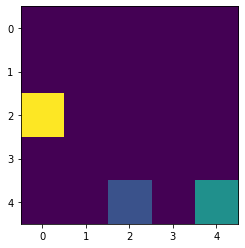

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.7905}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.515

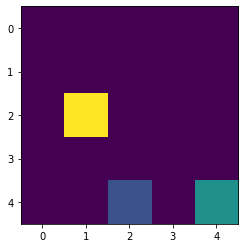

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.4846, 'R': -1.4118}, (2, 3): {'U': -1.515

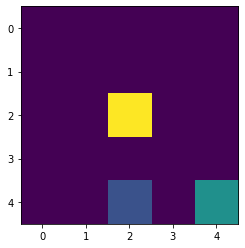

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.7789, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.515

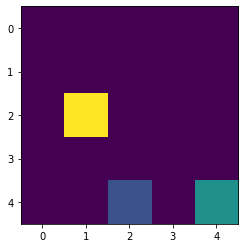

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.5158

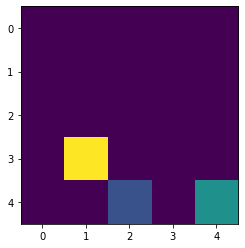

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.5158

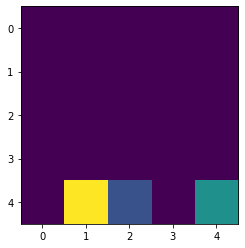

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.5158

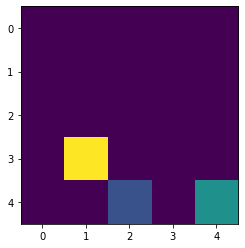

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.5158

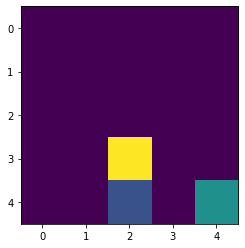

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.515

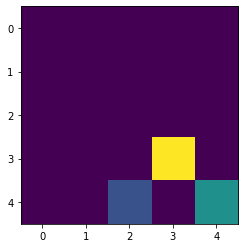

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.515

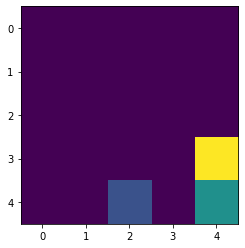

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.515

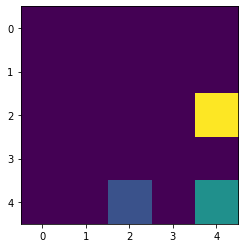

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.515

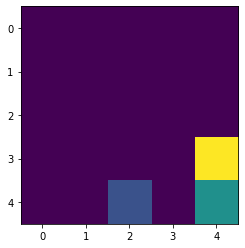

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.5158

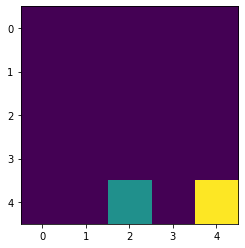

Reward in the end :  4
Timestep :  15

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8202, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.5158, 'D': -0

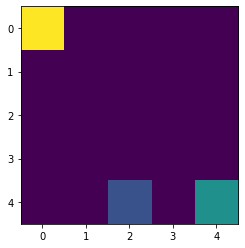

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.3931, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.5158

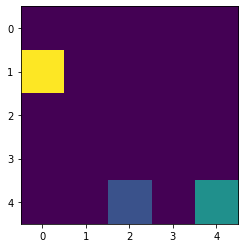

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.0347}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.5158, 

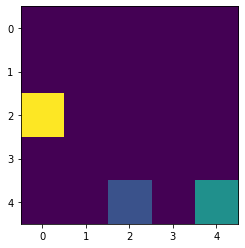

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.8583}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.5158, 

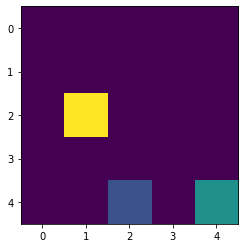

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4118}, (2, 3): {'U': -1.5158, 

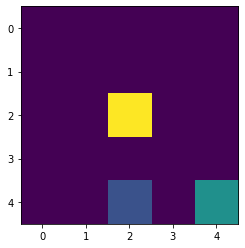

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

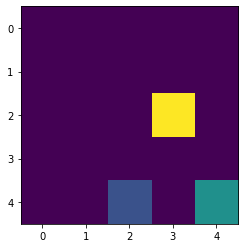

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

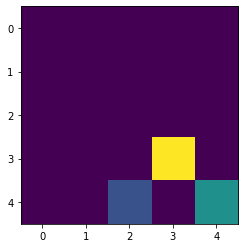

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

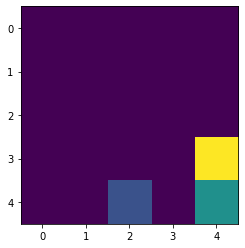

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, '

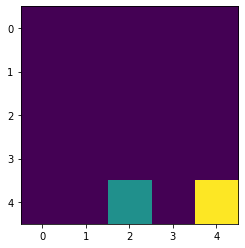

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8257}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D': -0.55

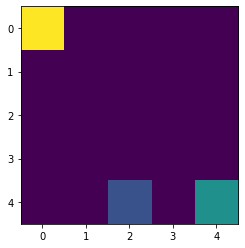

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4061}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

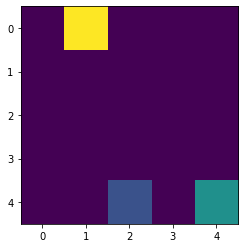

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0001}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

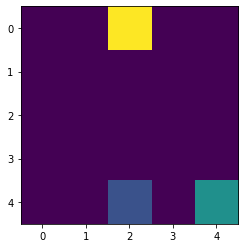

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.5235, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

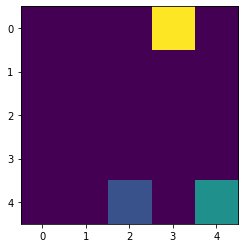

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.3122, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

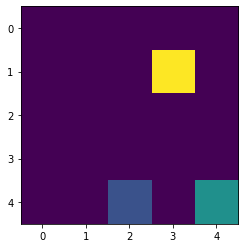

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, '

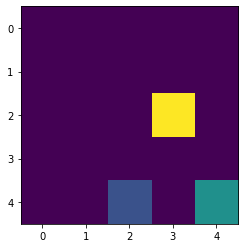

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, '

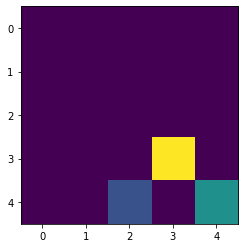

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, '

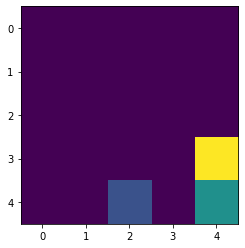

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D

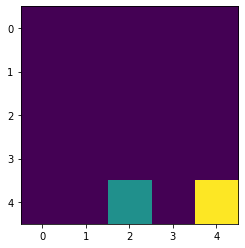

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8391, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D': -0.385

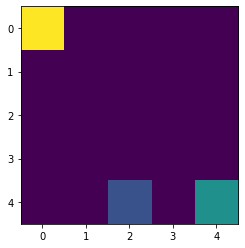

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.44, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, '

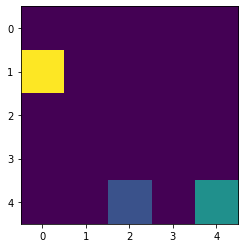

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2098, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158,

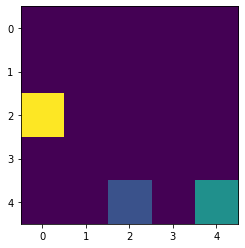

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.0505, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158,

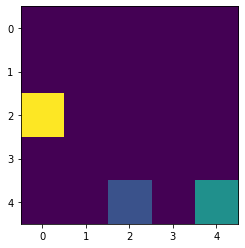

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158,

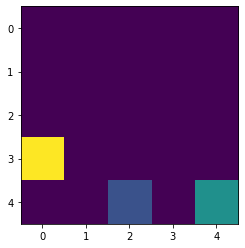

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158,

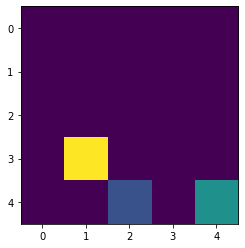

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158,

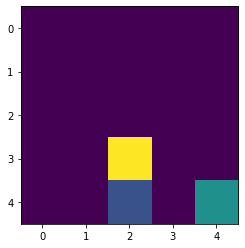

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158,

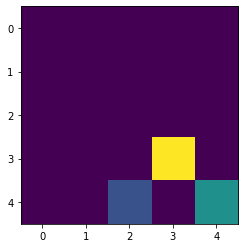

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158,

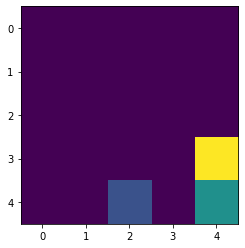

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

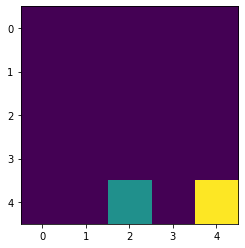

Reward in the end :  4
Timestep :  10

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8455}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D': -0.

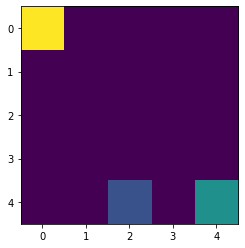

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4449}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158,

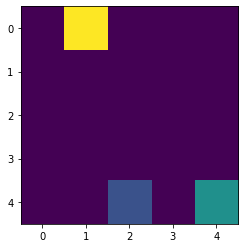

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0438}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158,

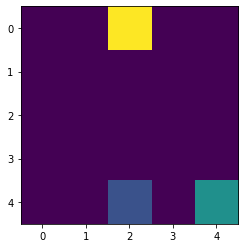

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.5897}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158,

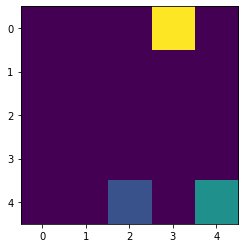

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.3072, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158,

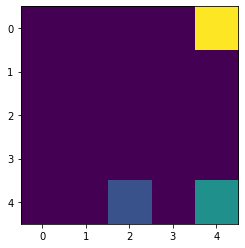

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.6028, 'D': -1.6288, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158,

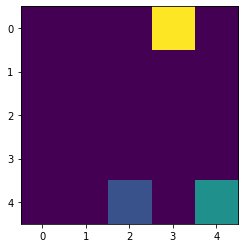

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.6288, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158,

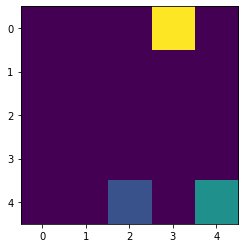

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.375}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158,

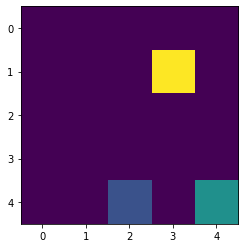

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.0058, 'D': -0.7305, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

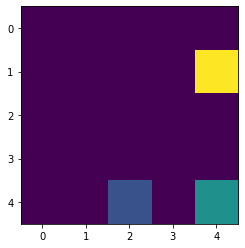

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.0058, 'D': -0.4998, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

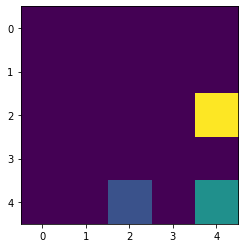

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.0058, 'D': -0.4998, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

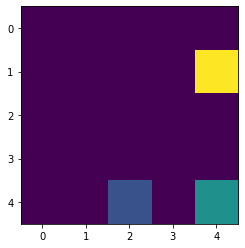

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3809, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.4998, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

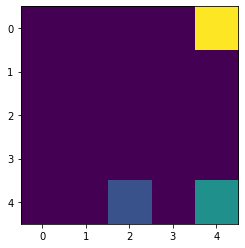

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.4998, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

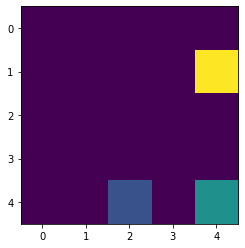

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

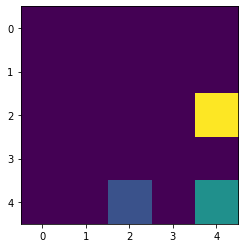

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

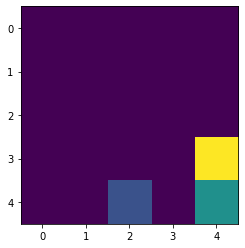

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

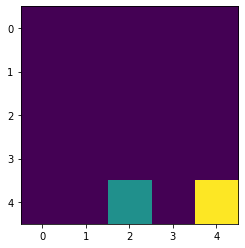

Reward in the end :  4
Timestep :  16

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8617, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D': -0

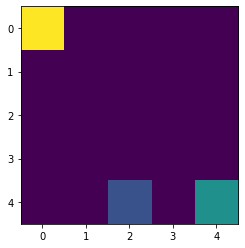

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.4643}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

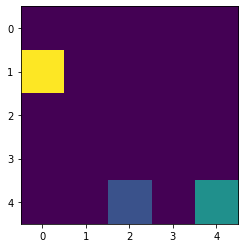

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.4285, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

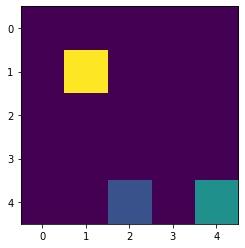

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.4659, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

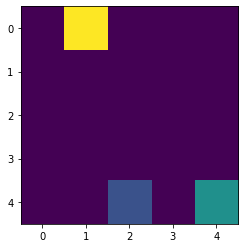

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.1342, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

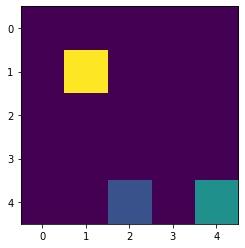

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.4801, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

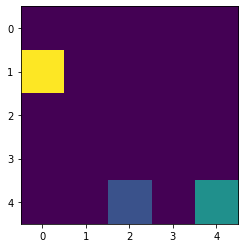

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1251}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

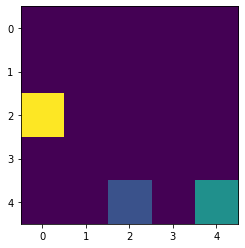

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.874, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

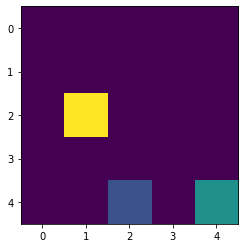

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

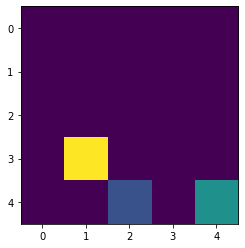

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9125}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

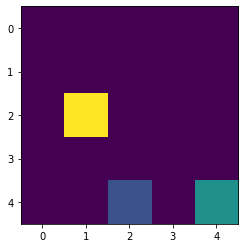

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4172, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.51

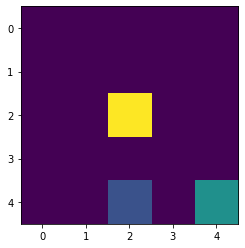

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.51

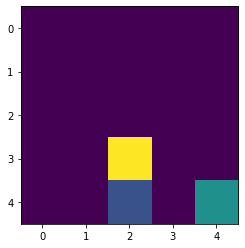

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.51

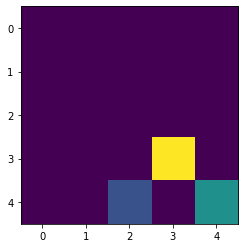

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.51

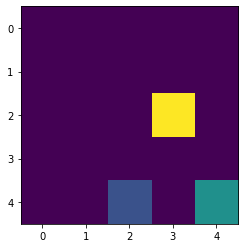

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.51

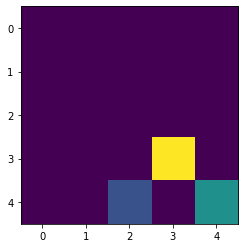

Next state of Agent :  (4, 3)
Reward got :  -1
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.51

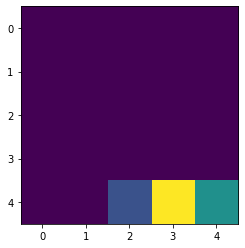

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  16
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.51

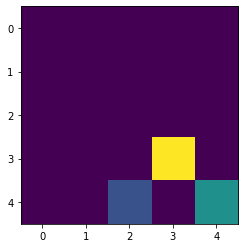

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  17
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.51

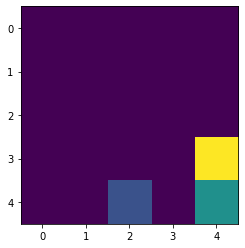

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  18
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

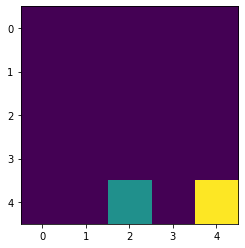

Reward in the end :  4
Timestep :  19

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8676}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D': -

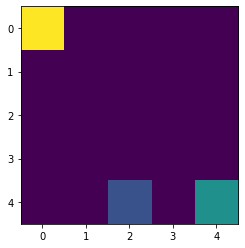

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.4669, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

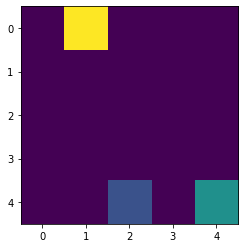

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.4806}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

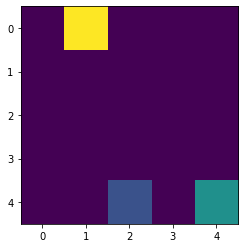

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.0295, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

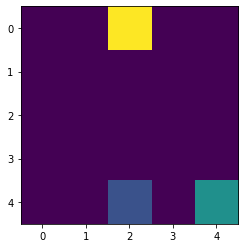

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.0894}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

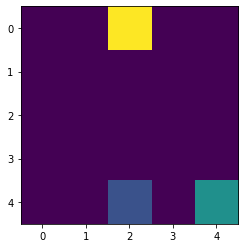

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.6809}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

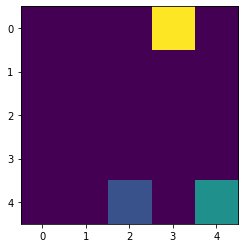

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.3565, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

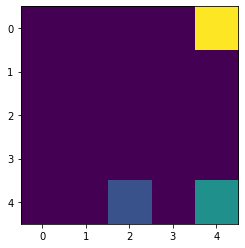

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3847, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

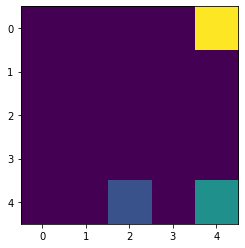

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.3152, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

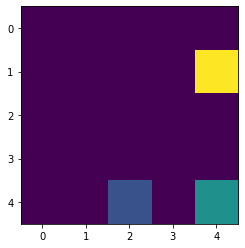

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

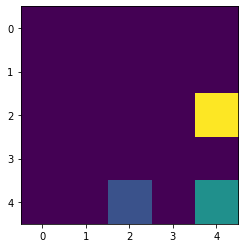

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.51

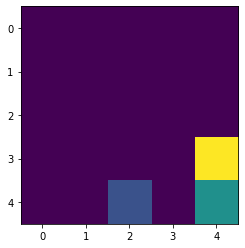

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.51

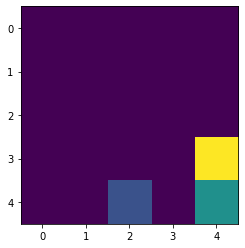

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

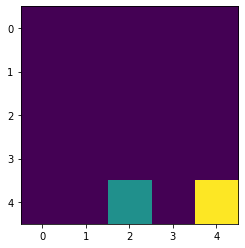

Reward in the end :  4
Timestep :  13

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.8836, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D': -

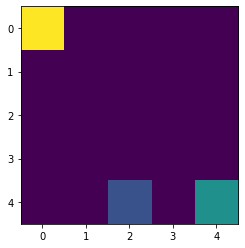

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.5129}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

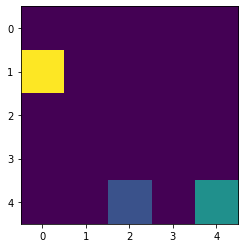

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.1792, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

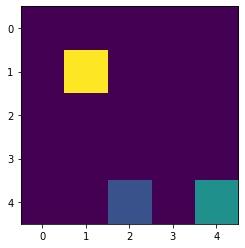

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -1.9311, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

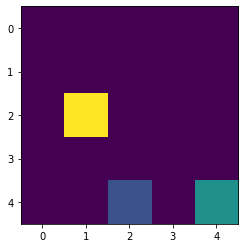

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2502}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

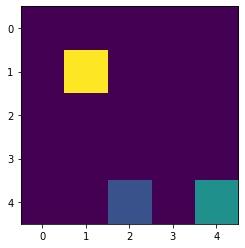

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8095}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

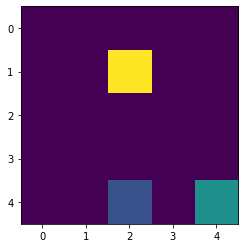

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8618}, (1, 3): {'U': -1.3471, 'D': -1.339, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

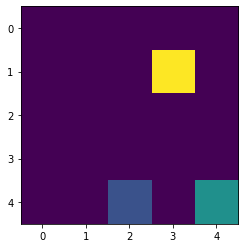

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8618}, (1, 3): {'U': -1.3471, 'D': -1.289, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

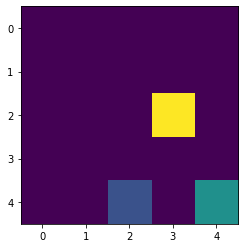

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8618}, (1, 3): {'U': -1.3471, 'D': -1.289, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

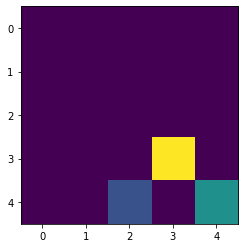

Next state of Agent :  (4, 3)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8618}, (1, 3): {'U': -1.3471, 'D': -1.289, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

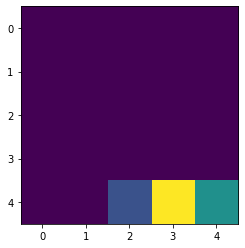

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8618}, (1, 3): {'U': -1.3471, 'D': -1.289, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

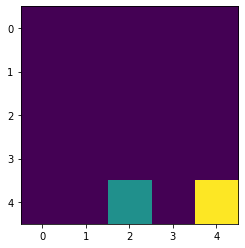

Reward in the end :  4
Timestep :  11

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.8888}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8618}, (1, 3): {'U': -1.3471, 'D': -1.289, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D': 0.

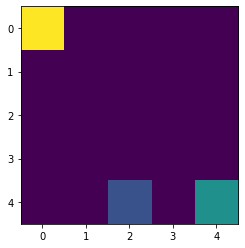

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5092}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8618}, (1, 3): {'U': -1.3471, 'D': -1.289, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

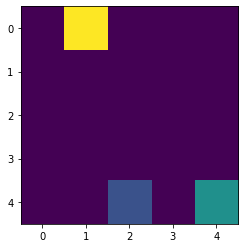

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.0798, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8618}, (1, 3): {'U': -1.3471, 'D': -1.289, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

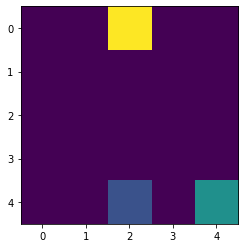

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8618}, (1, 3): {'U': -1.3471, 'D': -1.289, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

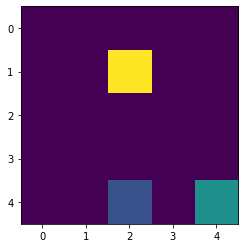

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.289, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

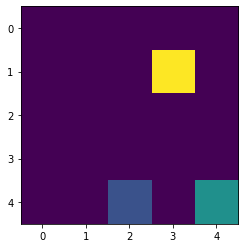

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

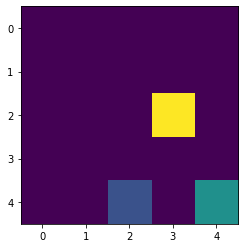

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

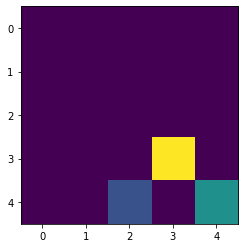

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.515

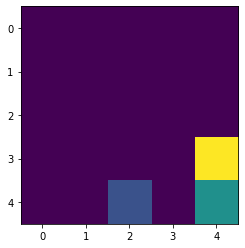

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

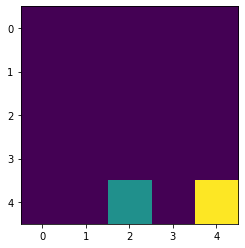

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9089, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D': 0.

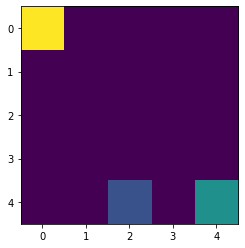

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5241, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

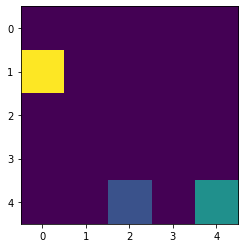

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.1328, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

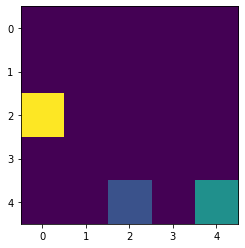

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

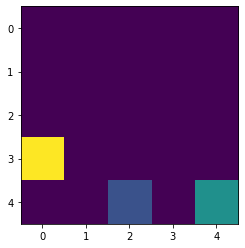

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

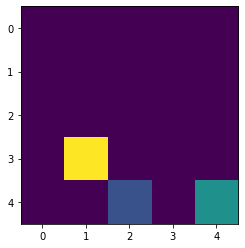

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

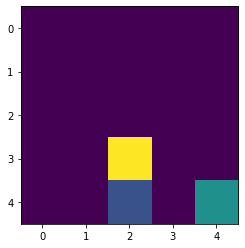

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1164, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

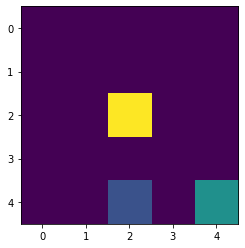

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.8753, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1932, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

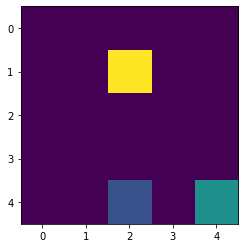

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1932, 'D': -1.4191, 'L': -1.6723, 'R': -1.4366}, (2, 3): {'U': -1.5158

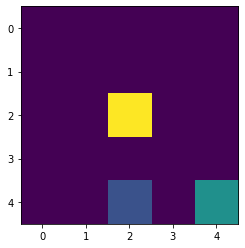

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9568}, (2, 2): {'U': -2.1932, 'D': -1.4191, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158

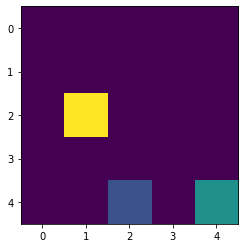

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.4191, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.515

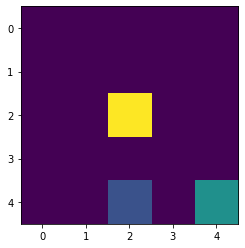

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158

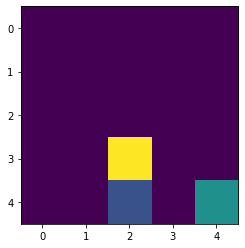

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158

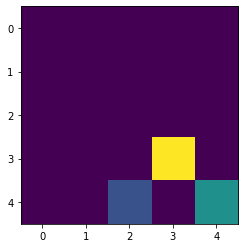

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158

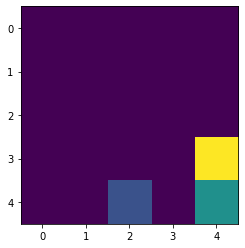

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

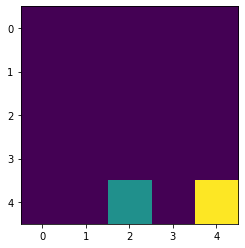

Reward in the end :  4
Timestep :  15

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9125}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D': 0.3

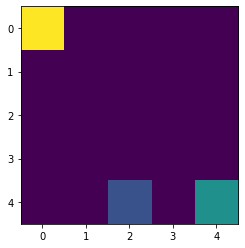

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5142, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

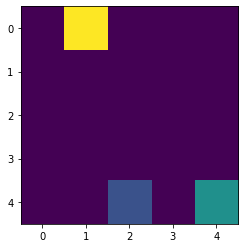

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.2523, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

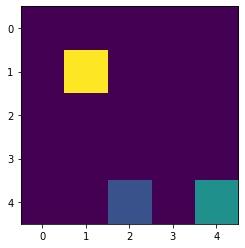

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -1.9573, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

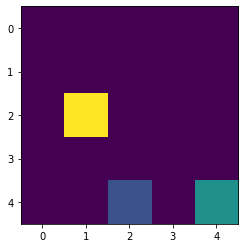

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

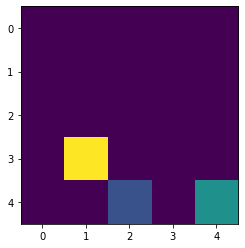

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

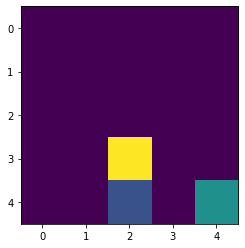

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

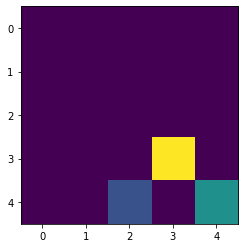

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

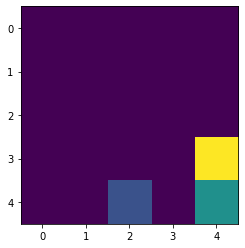

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, '

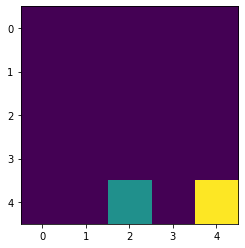

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0324, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D': 0.389

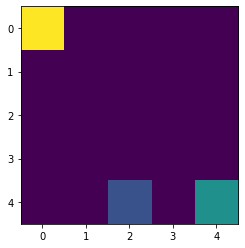

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.931, 'L': -3.0949, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

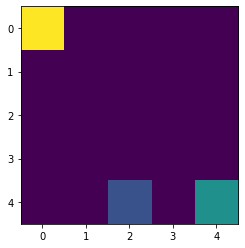

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.559}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

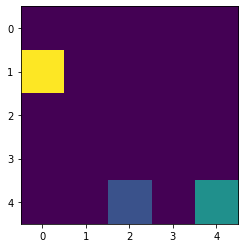

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.2897}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158

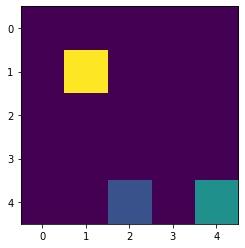

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8957}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158

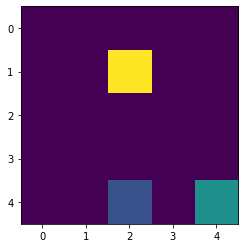

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.4169}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158

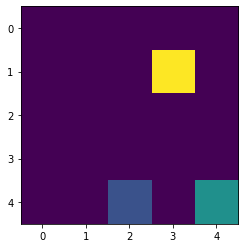

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': -0.0897, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158

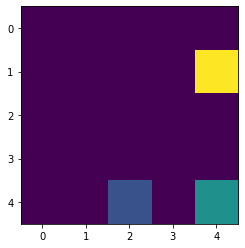

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

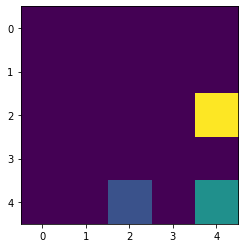

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

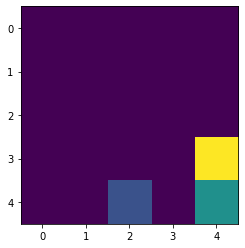

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

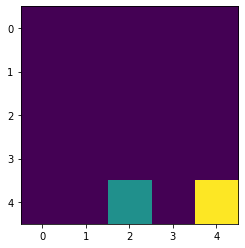

Reward in the end :  4
Timestep :  10

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9323}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D': 0.3

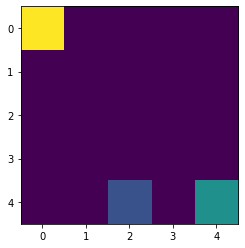

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9523}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5401}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

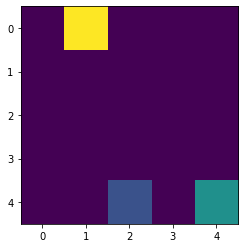

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9523}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1405}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

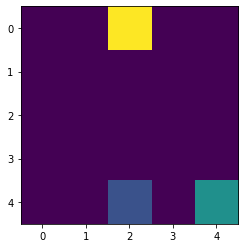

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9523}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7173, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

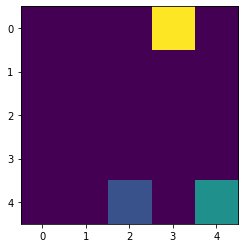

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9523}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.2045, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

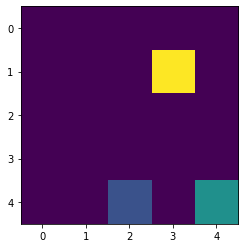

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9523}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

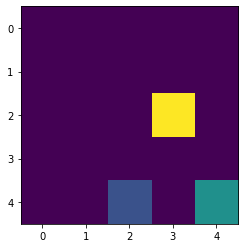

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9523}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

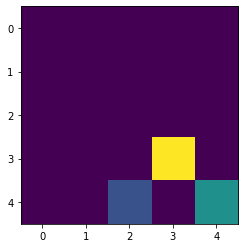

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9523}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

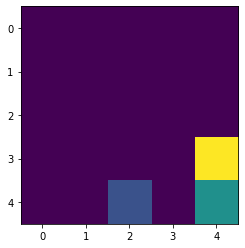

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9523}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

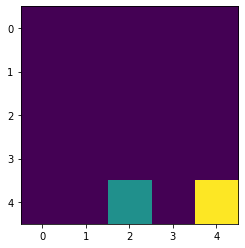

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9523}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D': 0.69

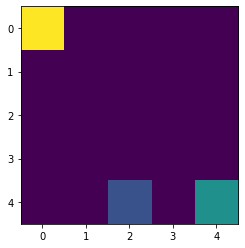

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9728}, (0, 1): {'U': -2.5682, 'D': -2.5717, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

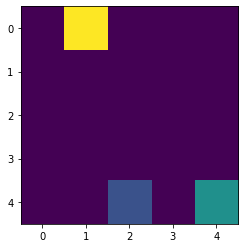

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9728}, (0, 1): {'U': -2.6655, 'D': -2.5717, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

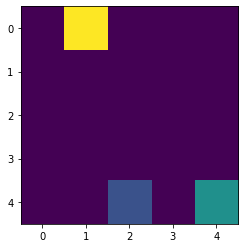

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9728}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.3042, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

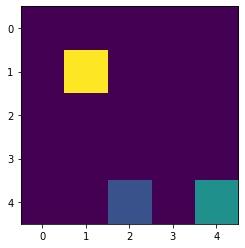

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9728}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.7994, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, '

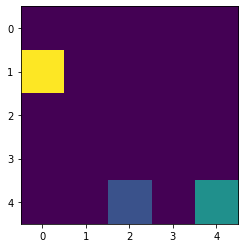

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9542, 'L': -3.0949, 'R': -2.9728}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, '

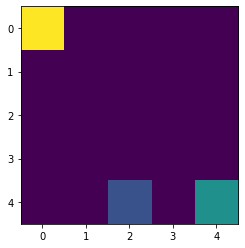

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.973, 'L': -3.0949, 'R': -2.9728}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.5605, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D

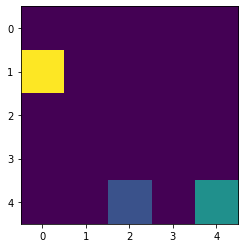

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.973, 'L': -3.0949, 'R': -2.9728}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6004, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.1999}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D

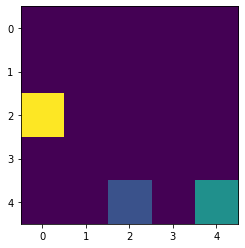

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.973, 'L': -3.0949, 'R': -2.9728}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6004, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -1.9925}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D

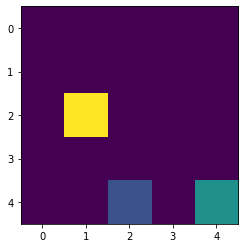

Next state of Agent :  (2, 2)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.973, 'L': -3.0949, 'R': -2.9728}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6004, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.372, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D

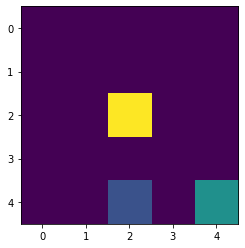

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.973, 'L': -3.0949, 'R': -2.9728}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6004, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

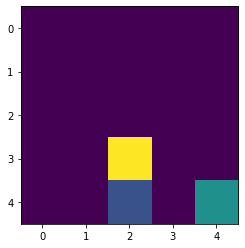

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.973, 'L': -3.0949, 'R': -2.9728}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6004, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

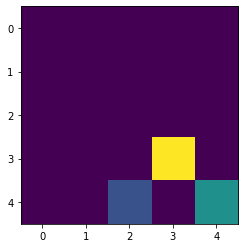

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.973, 'L': -3.0949, 'R': -2.9728}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6004, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

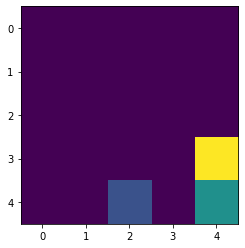

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.973, 'L': -3.0949, 'R': -2.9728}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6004, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, '

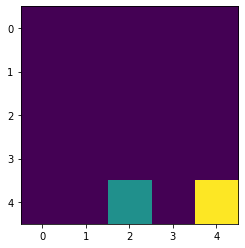

Reward in the end :  4
Timestep :  14

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.973, 'L': -3.0949, 'R': -2.9728}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6004, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D': 0.699

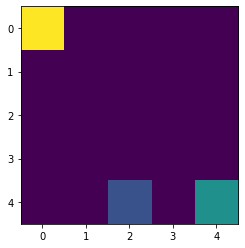

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.973, 'L': -3.0949, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -2.9481, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6004, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, '

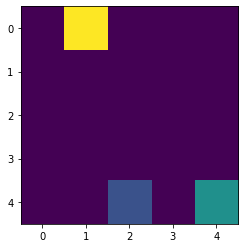

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.973, 'L': -3.0949, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6004, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, '

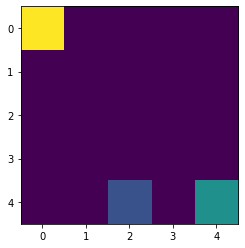

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.0949, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6004, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

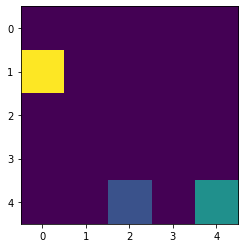

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.0949, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2132, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

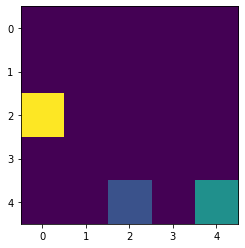

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.0949, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

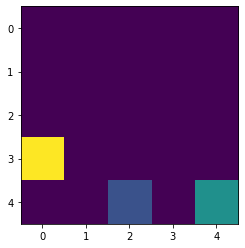

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.0949, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

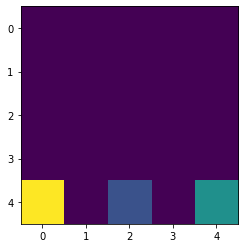

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.0949, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

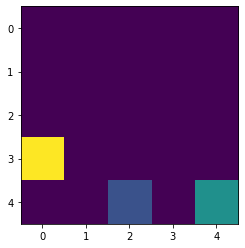

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.0949, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

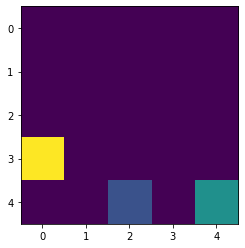

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.0949, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

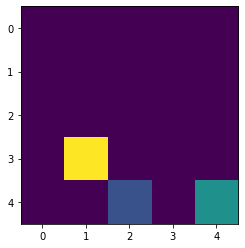

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.0949, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

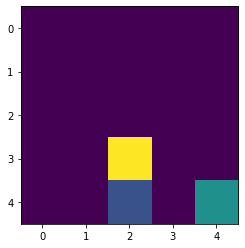

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.0949, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

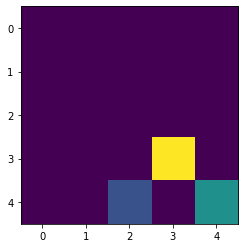

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.0949, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158,

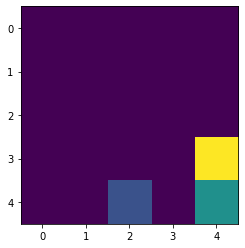

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.0949, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

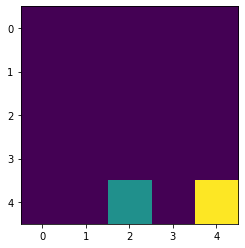

Reward in the end :  4
Timestep :  14

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.0949, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 'D': 0.69

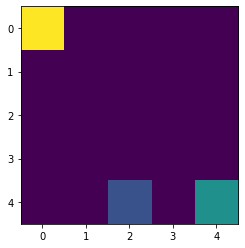

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -2.9902}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

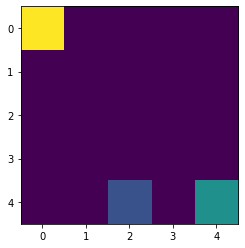

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.6655, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

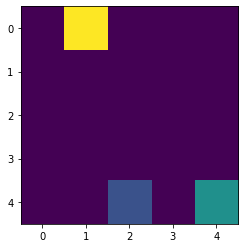

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.5746}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

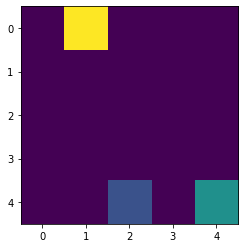

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.1483, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

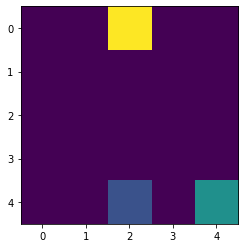

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.1617, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

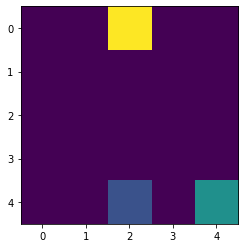

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9093}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

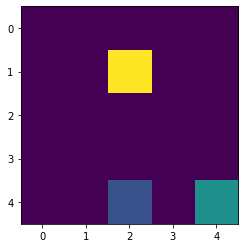

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9036}, (1, 3): {'U': -1.3471, 'D': -1.1013, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

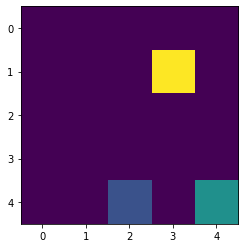

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9036}, (1, 3): {'U': -1.3471, 'D': -0.9692, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5158, 

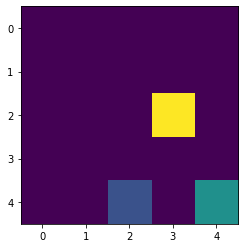

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9036}, (1, 3): {'U': -1.3471, 'D': -0.9692, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 

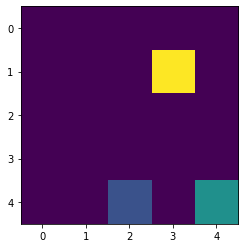

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9036}, (1, 3): {'U': -1.3471, 'D': -0.8635, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677,

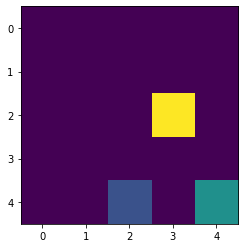

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9036}, (1, 3): {'U': -1.3471, 'D': -0.8635, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677,

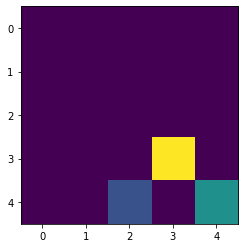

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9036}, (1, 3): {'U': -1.3471, 'D': -0.8635, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677,

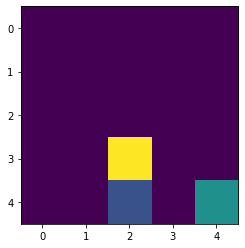

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9036}, (1, 3): {'U': -1.3471, 'D': -0.8635, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677,

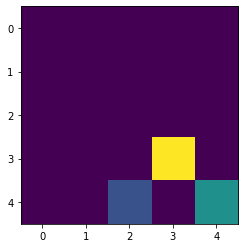

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  14
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9036}, (1, 3): {'U': -1.3471, 'D': -0.8635, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677,

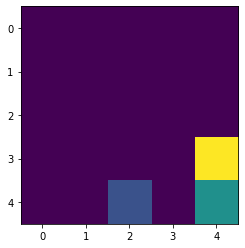

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  15
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9036}, (1, 3): {'U': -1.3471, 'D': -0.8635, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 

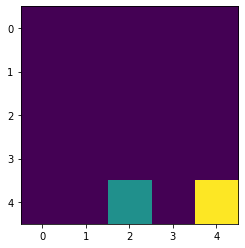

Reward in the end :  4
Timestep :  16

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -2.9945, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9036}, (1, 3): {'U': -1.3471, 'D': -0.8635, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 1.02

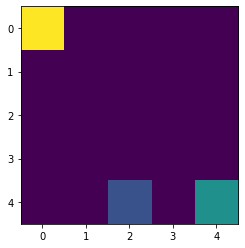

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6136}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9036}, (1, 3): {'U': -1.3471, 'D': -0.8635, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 

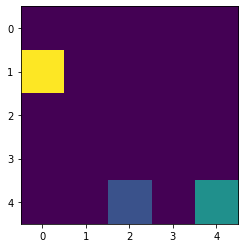

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3351}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9036}, (1, 3): {'U': -1.3471, 'D': -0.8635, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 

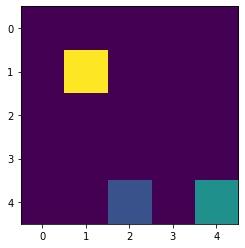

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.9036}, (1, 3): {'U': -1.3471, 'D': -0.8635, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 

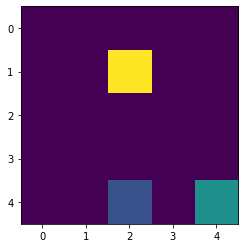

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.8635, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

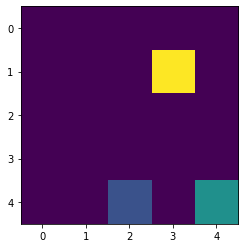

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

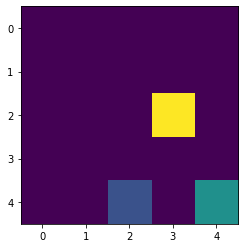

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

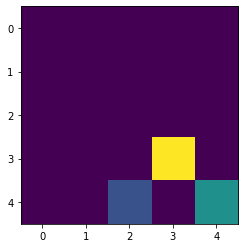

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

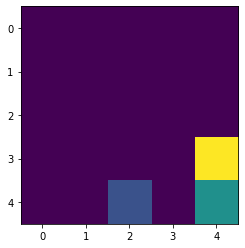

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

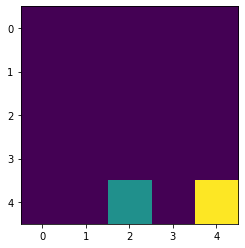

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0041}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 1.3028

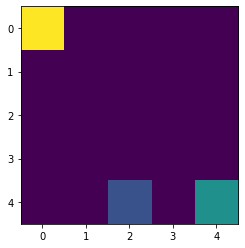

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6034}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

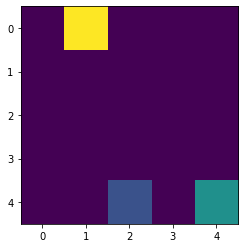

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.1872}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

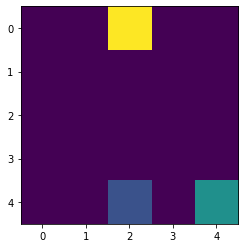

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.7387, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

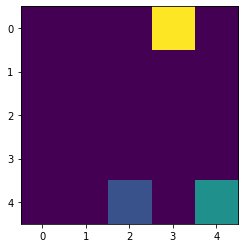

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.7618}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

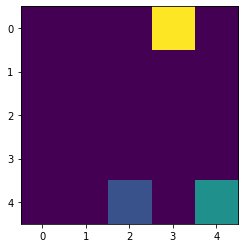

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.3582, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

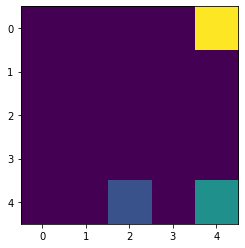

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.2611, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.2217, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

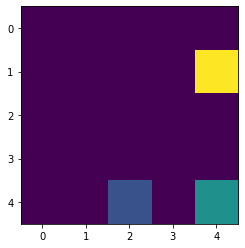

Next state of Agent :  (0, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.2611, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

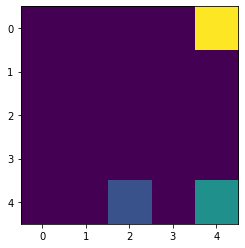

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.1592, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

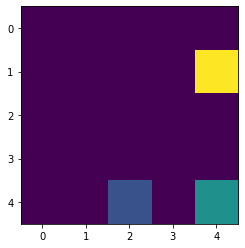

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

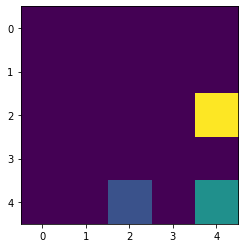

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

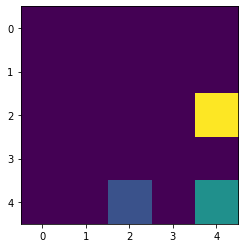

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

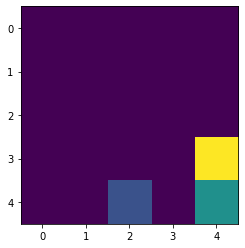

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

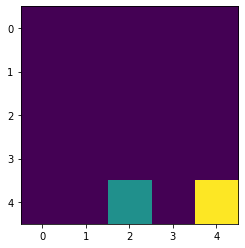

Reward in the end :  4
Timestep :  13

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0138, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 1.3028

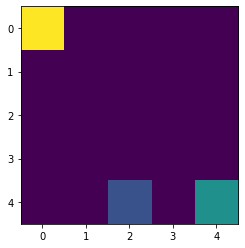

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.6344, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

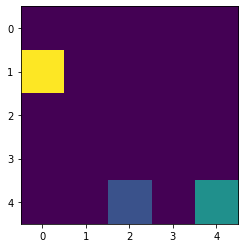

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.2779, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

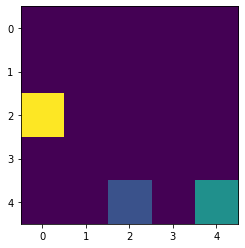

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

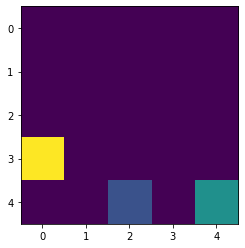

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

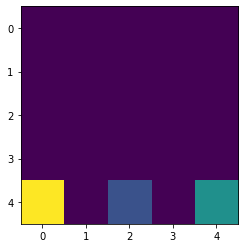

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

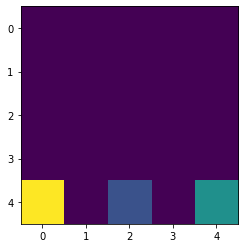

Next state of Agent :  (4, 0)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

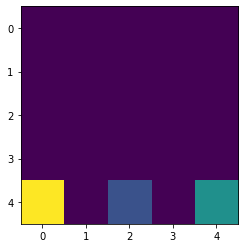

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

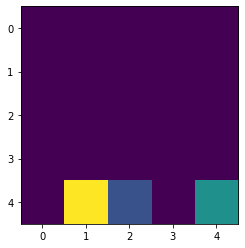

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

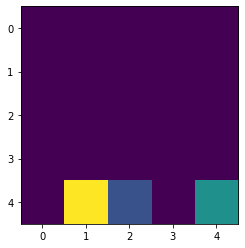

Next state of Agent :  (4, 1)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

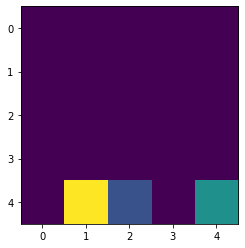

Next state of Agent :  (4, 2)
Reward got :  -3
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

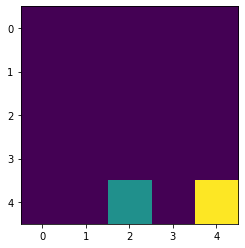

Reward in the end :  -3
Timestep :  11

GAME LOST!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.0198}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 1.302

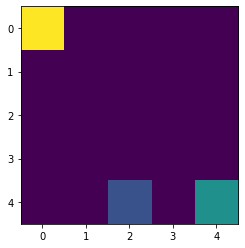

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.626, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

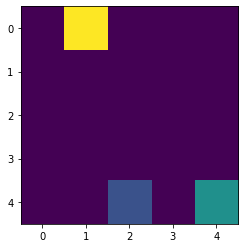

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.315, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

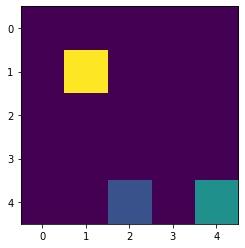

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -2.0102, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

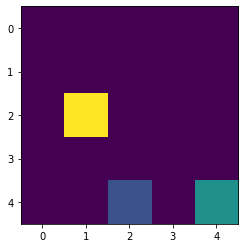

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

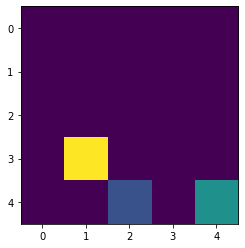

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

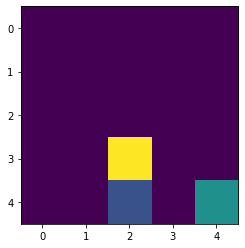

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

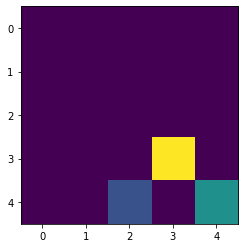

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

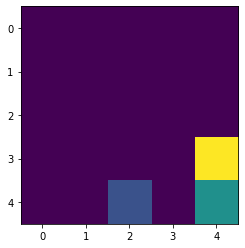

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

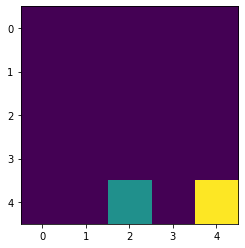

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.0876, 'D': -3.0325, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 1.3028,

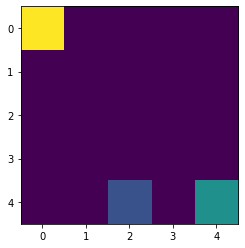

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0325, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

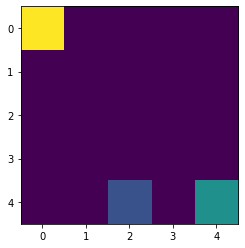

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0475, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.6344, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

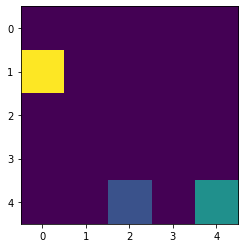

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0475, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.729, 'R': -2.6613}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

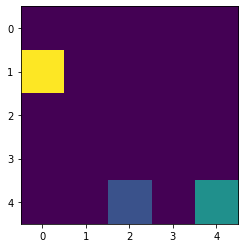

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0475, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3727}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

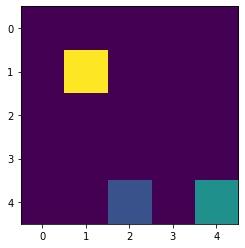

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0475, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.861}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

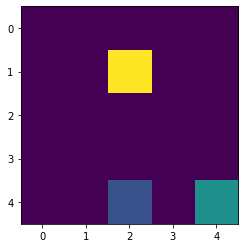

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0475, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.7268, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

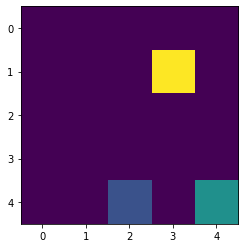

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0475, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

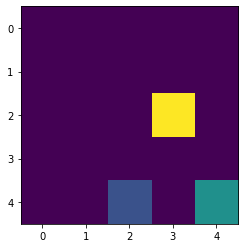

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0475, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

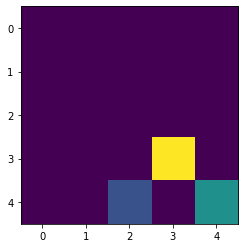

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0475, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

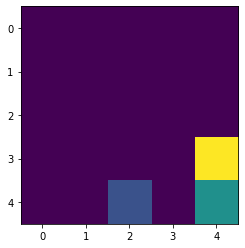

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0475, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

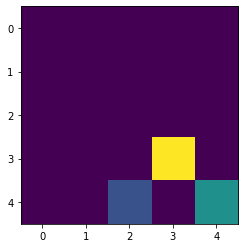

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0475, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

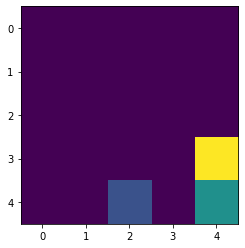

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0475, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

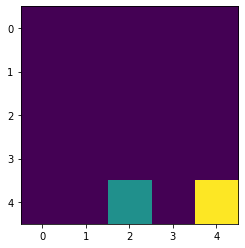

Reward in the end :  4
Timestep :  13

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0475, 'L': -3.1544, 'R': -3.036}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 1.5513,

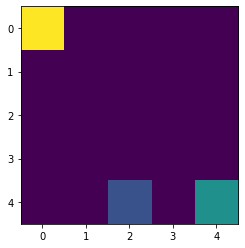

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0475, 'L': -3.1544, 'R': -3.05}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.0342, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

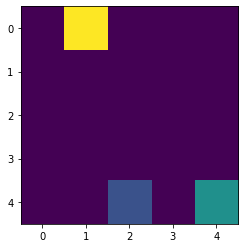

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0475, 'L': -3.1544, 'R': -3.05}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

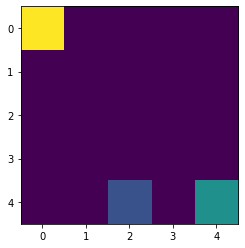

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.05}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.672, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

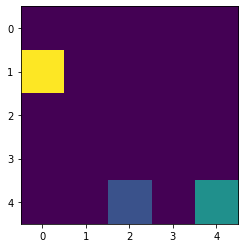

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.05}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.2787}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

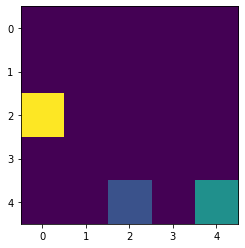

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.05}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9996, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

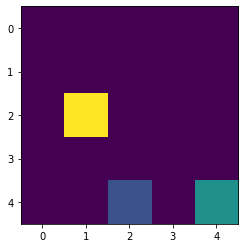

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.05}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

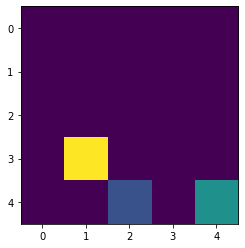

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.05}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

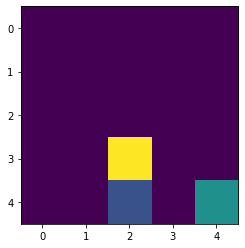

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.05}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

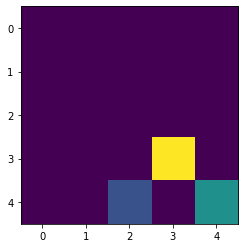

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.05}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

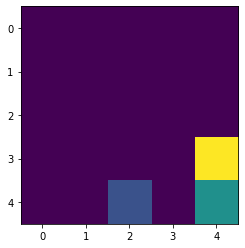

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.05}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

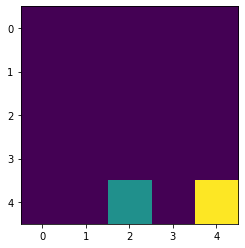

Reward in the end :  4
Timestep :  11

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.05}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 1.5513, 

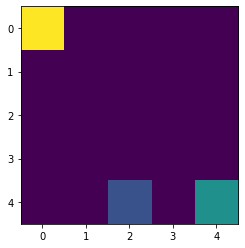

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.0612}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6327}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

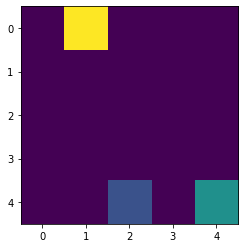

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.0612}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6626}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.228}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

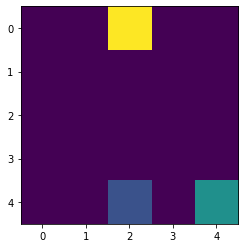

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.0612}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6626}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.7666, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

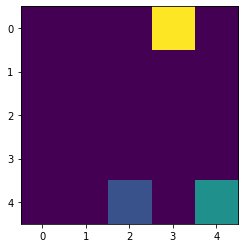

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.0612}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6626}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.3479}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

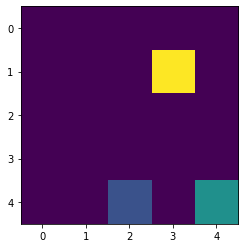

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.0612}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6626}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.4199, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

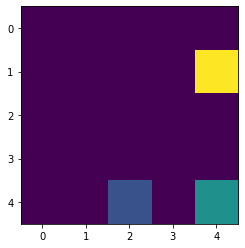

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.0612}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6626}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

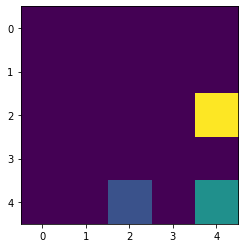

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.0612}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6626}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

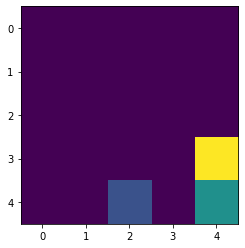

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.0612}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6626}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

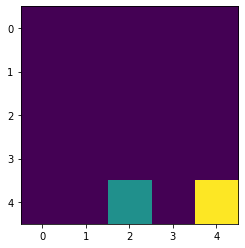

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.0612}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6626}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 1.5513, 

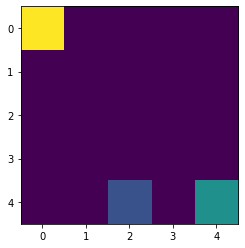

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6626}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

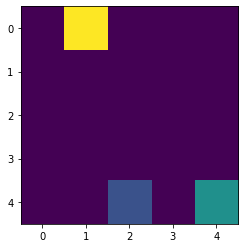

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2348, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

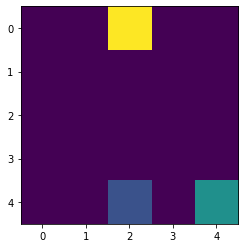

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.8051}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

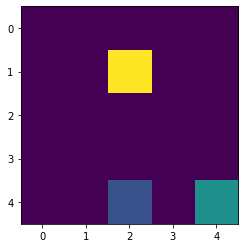

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.573, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

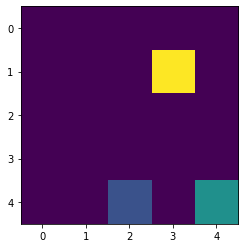

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

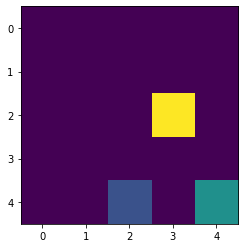

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

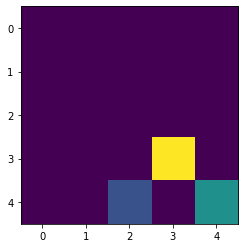

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

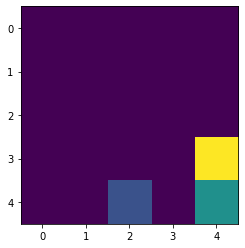

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

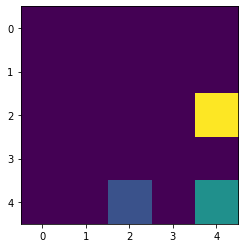

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

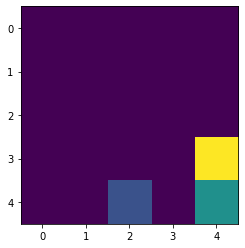

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

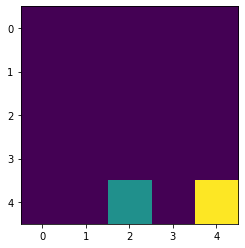

Reward in the end :  4
Timestep :  11

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0655, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 1.774, 

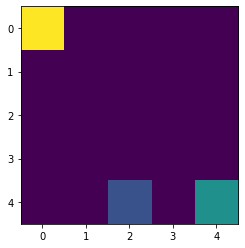

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7022, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

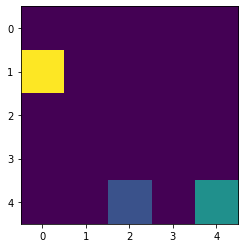

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.2959, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

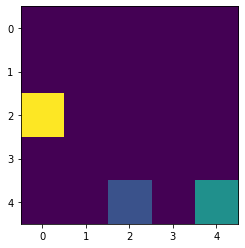

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3429}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

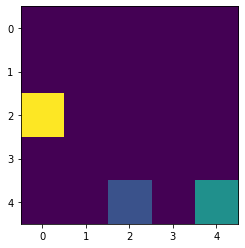

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.9511, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

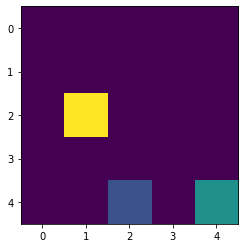

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.8742, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

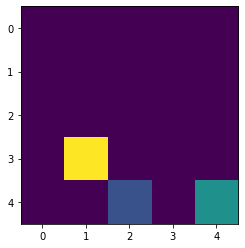

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.8742, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

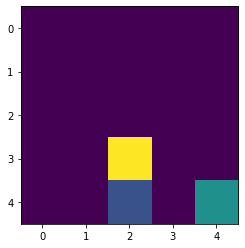

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.8742, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

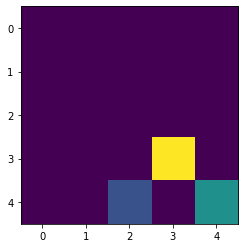

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.8742, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

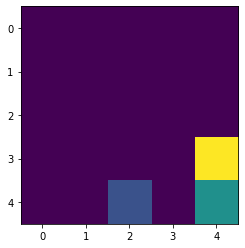

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.8742, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

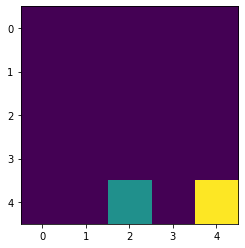

Reward in the end :  4
Timestep :  10

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.075}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.8742, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 1.774, 

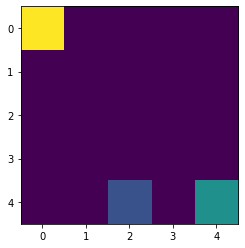

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.6712, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.8742, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

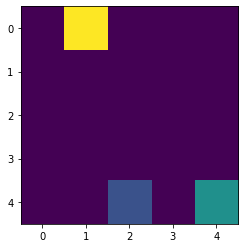

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3736, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.8742, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

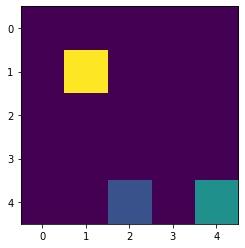

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.8742, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

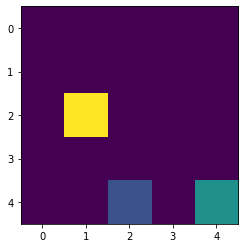

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

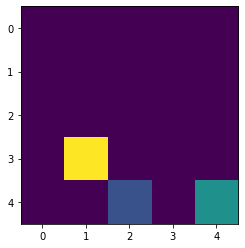

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

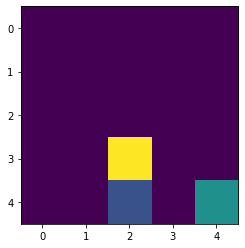

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

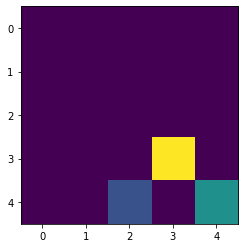

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

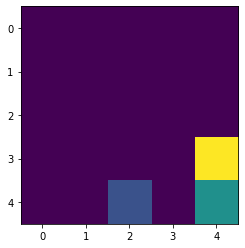

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

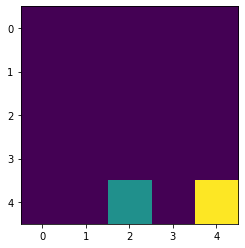

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.0848, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 1.774, 

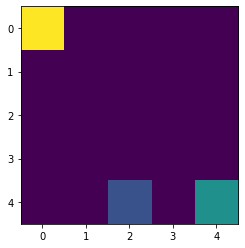

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7087}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

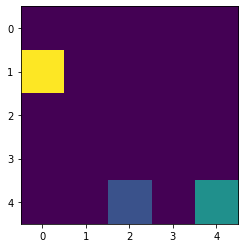

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3959}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

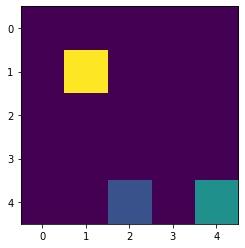

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.1077, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

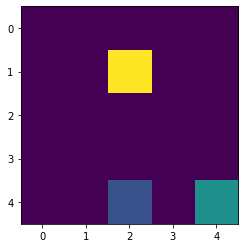

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.2624, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

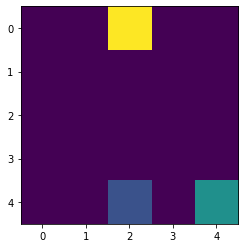

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.3719, 'D': -2.2767, 'L': -2.3645, 'R': -2.2651}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

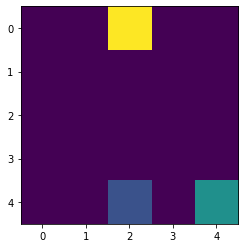

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.3719, 'D': -2.2767, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.705, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

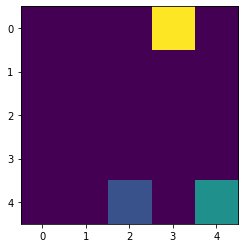

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.3719, 'D': -2.2767, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.4102, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

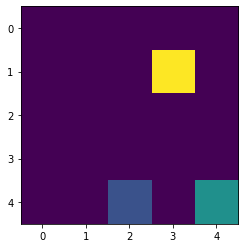

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.3719, 'D': -2.2767, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

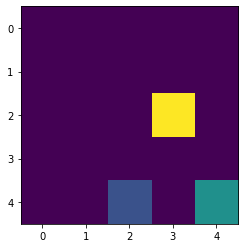

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.3719, 'D': -2.2767, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

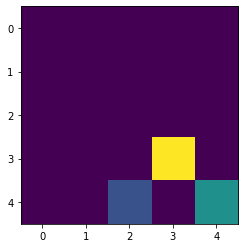

Next state of Agent :  (4, 3)
Reward got :  -1
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.3719, 'D': -2.2767, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 

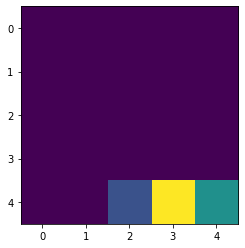

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  11
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.3719, 'D': -2.2767, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 

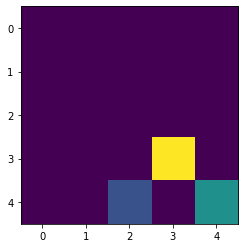

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  12
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.3719, 'D': -2.2767, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 

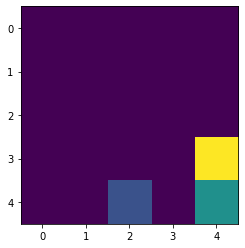

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  13
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.3719, 'D': -2.2767, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

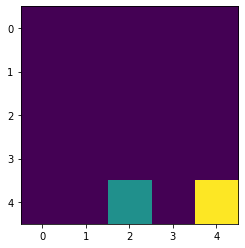

Reward in the end :  4
Timestep :  14

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0874}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.3719, 'D': -2.2767, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 1.965

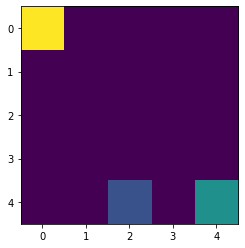

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0999}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.6876}, (0, 2): {'U': -2.3719, 'D': -2.2767, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

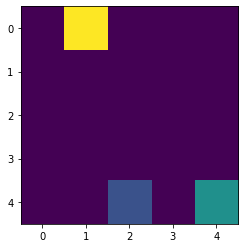

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0999}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7144}, (0, 2): {'U': -2.3719, 'D': -2.2767, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

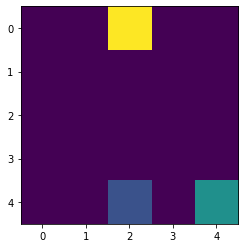

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0999}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7144}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.7358}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

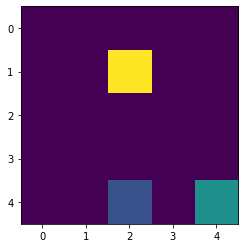

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0999}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7144}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.2111}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

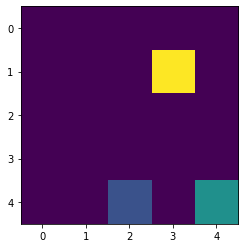

Next state of Agent :  (1, 4)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0999}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7144}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.681, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

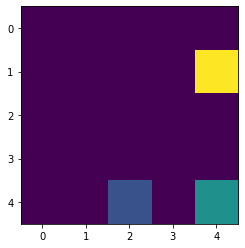

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0999}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7144}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

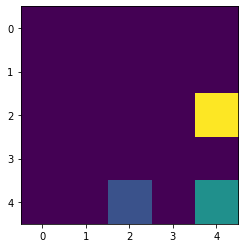

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0999}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7144}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

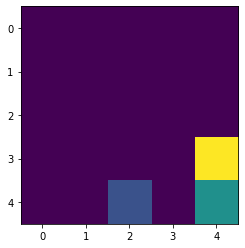

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0999}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7144}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

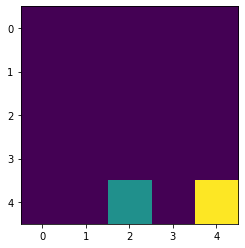

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.0999}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7144}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 1.9654

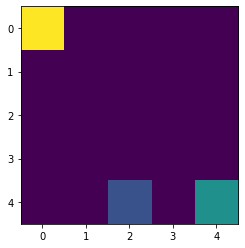

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7144}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

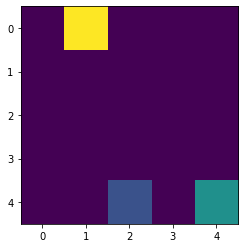

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2849}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

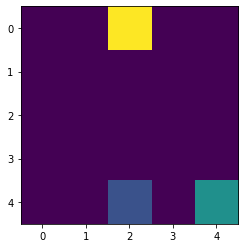

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.6296, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

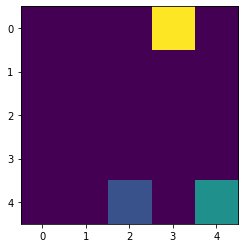

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.2443, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

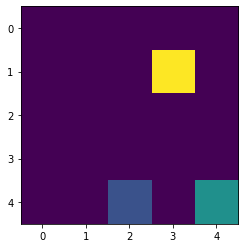

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

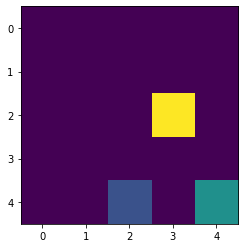

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

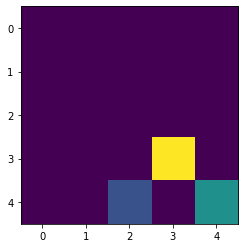

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

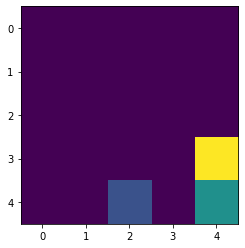

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

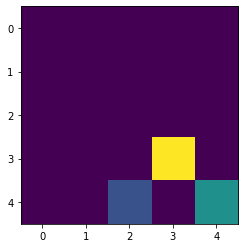

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

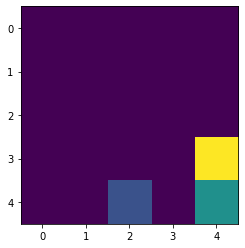

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

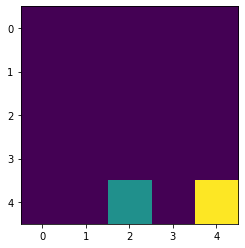

Reward in the end :  4
Timestep :  11

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1012, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.1214

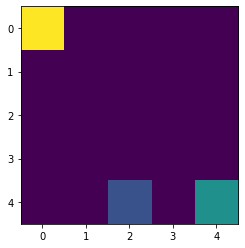

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.729, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

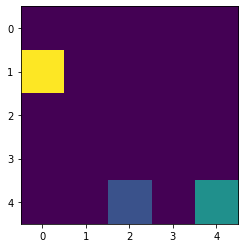

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7291, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

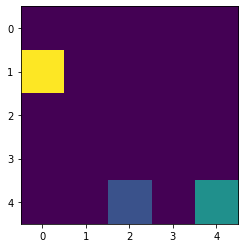

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3444, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

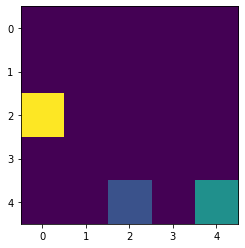

Next state of Agent :  (3, 0)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

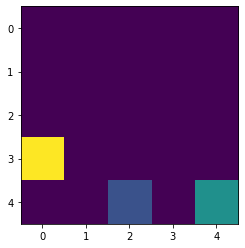

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

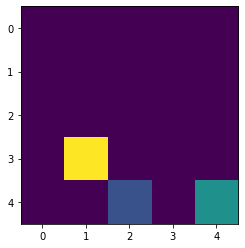

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

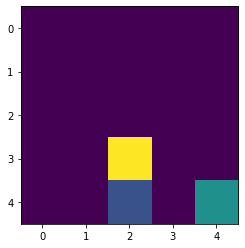

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

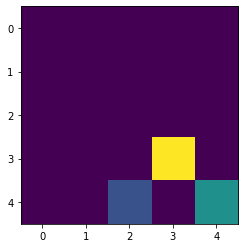

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

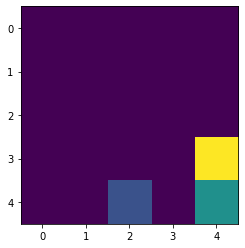

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

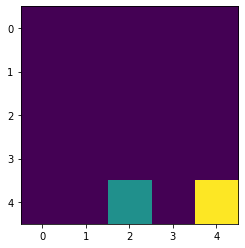

Reward in the end :  4
Timestep :  10

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.1142}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.121

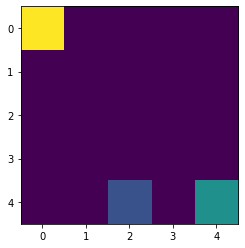

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7167, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

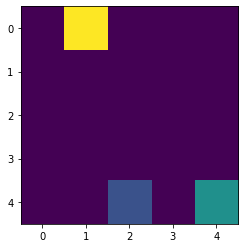

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3944}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

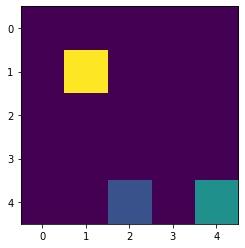

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.376}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.6277}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

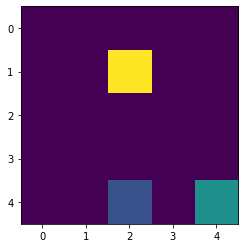

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.376}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.5151}, (1, 3): {'U': -1.3471, 'D': -0.081, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

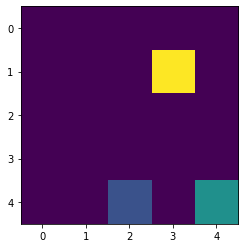

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.376}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.5151}, (1, 3): {'U': -1.3471, 'D': 0.0746, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

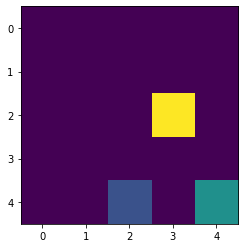

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.376}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.5151}, (1, 3): {'U': -1.3471, 'D': 0.0746, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

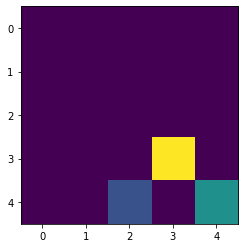

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.376}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.5151}, (1, 3): {'U': -1.3471, 'D': 0.0746, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

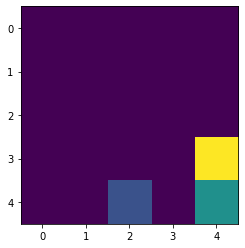

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.376}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.5151}, (1, 3): {'U': -1.3471, 'D': 0.0746, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

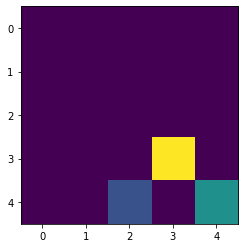

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.376}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.5151}, (1, 3): {'U': -1.3471, 'D': 0.0746, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

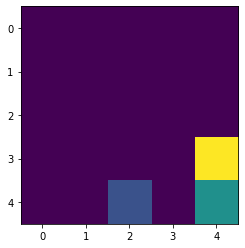

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.376}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.5151}, (1, 3): {'U': -1.3471, 'D': 0.0746, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

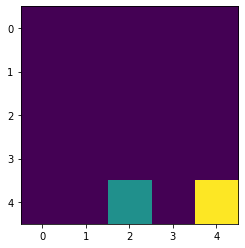

Reward in the end :  4
Timestep :  11

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1176, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.376}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.5151}, (1, 3): {'U': -1.3471, 'D': 0.0746, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.252, 

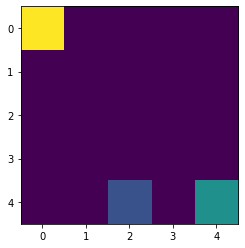

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7503}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.376}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.5151}, (1, 3): {'U': -1.3471, 'D': 0.0746, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

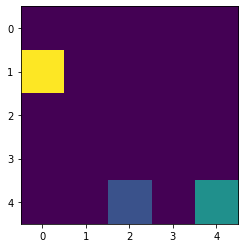

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.376}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.5151}, (1, 3): {'U': -1.3471, 'D': 0.0746, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

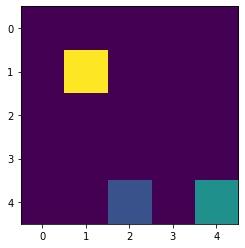

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.5151}, (1, 3): {'U': -1.3471, 'D': 0.0746, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

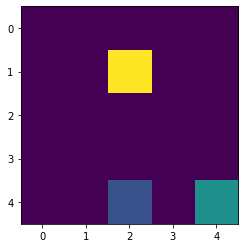

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.0746, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

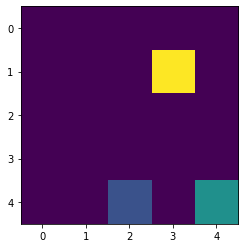

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.22, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

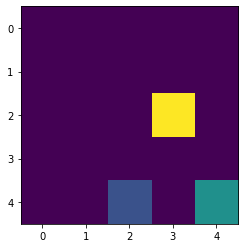

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.22, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

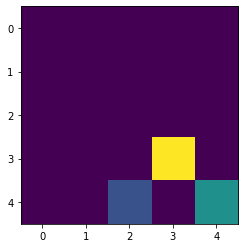

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.22, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

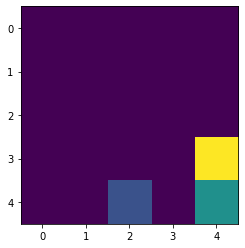

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.22, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

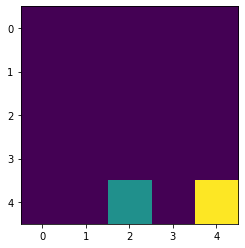

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.126}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.22, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.3588, '

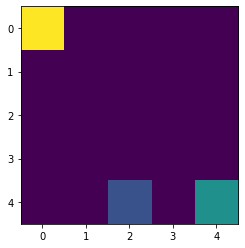

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7371}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.22, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

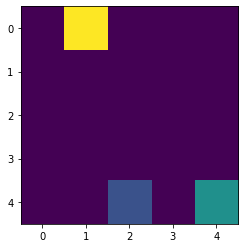

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2887}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.22, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

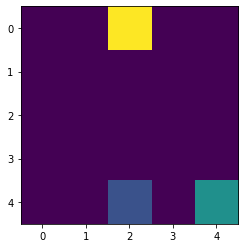

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.5428, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.22, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

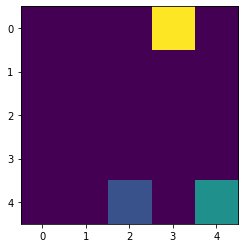

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.22, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

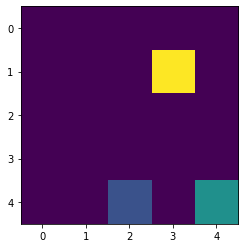

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

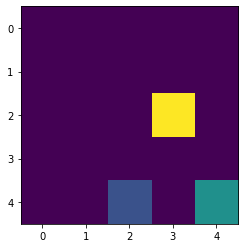

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

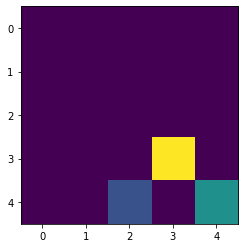

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

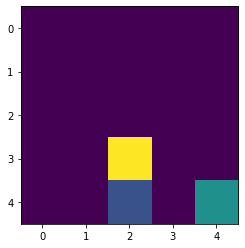

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

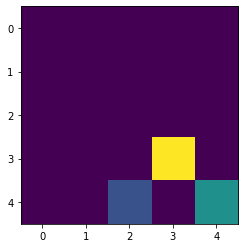

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

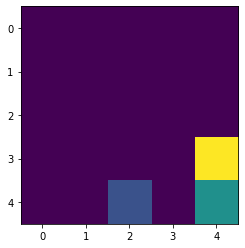

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

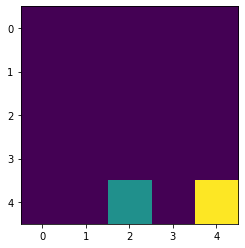

Reward in the end :  4
Timestep :  11

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1341, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.445,

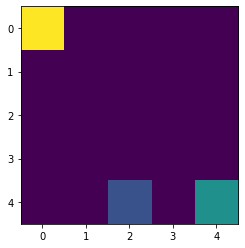

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7584, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

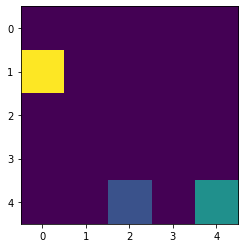

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3865}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

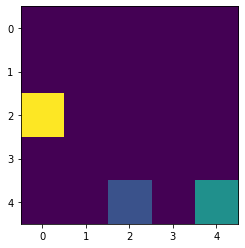

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.7768, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

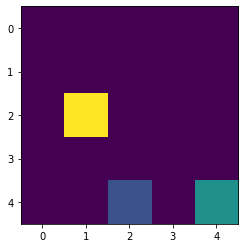

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

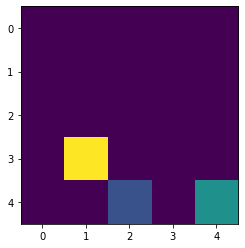

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

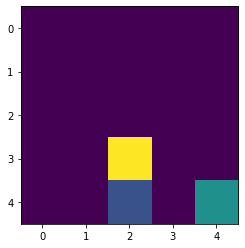

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

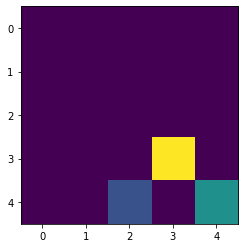

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

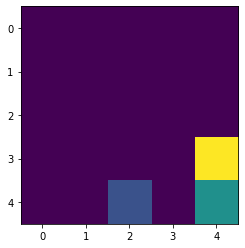

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

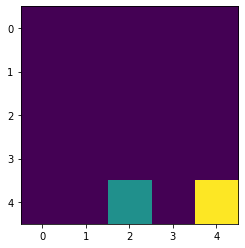

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.1387}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.445, 

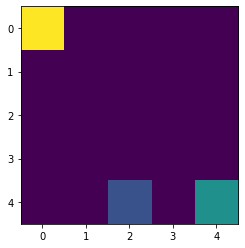

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.7443, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

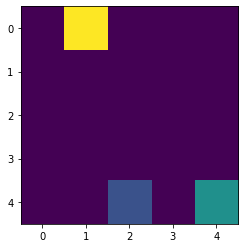

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7559}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

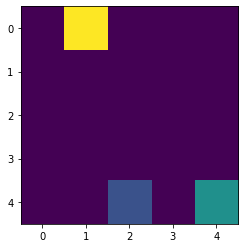

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2778}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

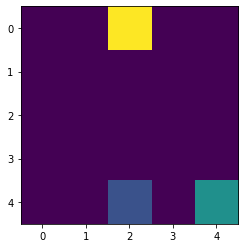

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.399, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

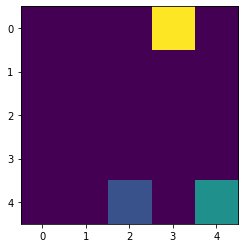

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.3534, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

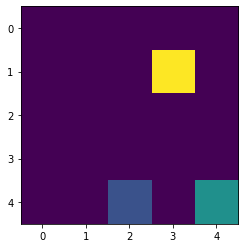

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.4739, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

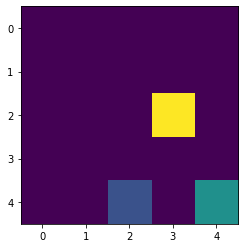

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.4739, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

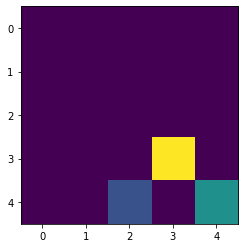

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.4739, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

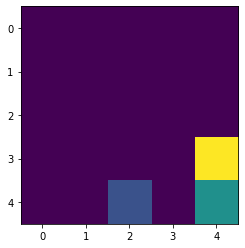

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.4739, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

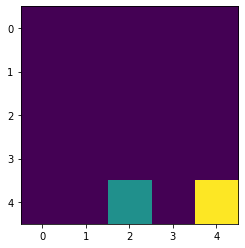

Reward in the end :  4
Timestep :  10

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1486, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.4739, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.5152,

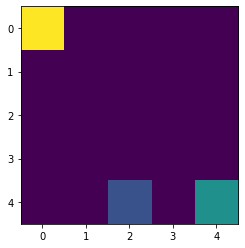

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7804}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.4739, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

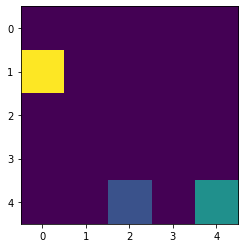

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.3432}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.4739, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

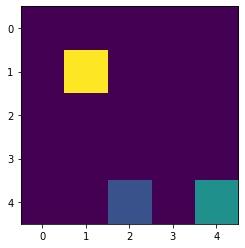

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.2986}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.4001}, (1, 3): {'U': -1.3471, 'D': 0.4739, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

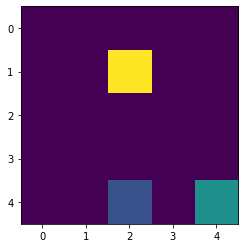

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.2986}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.2443}, (1, 3): {'U': -1.3471, 'D': 0.4739, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

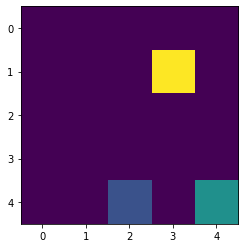

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.2986}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.2443}, (1, 3): {'U': -1.3471, 'D': 0.5816, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

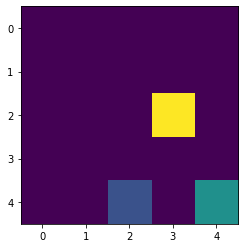

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.2986}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.2443}, (1, 3): {'U': -1.3471, 'D': 0.5816, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

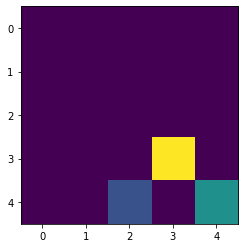

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.2986}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.2443}, (1, 3): {'U': -1.3471, 'D': 0.5816, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

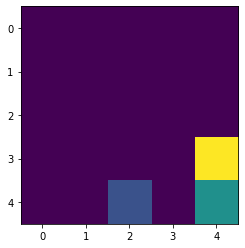

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.2986}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.2443}, (1, 3): {'U': -1.3471, 'D': 0.5816, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

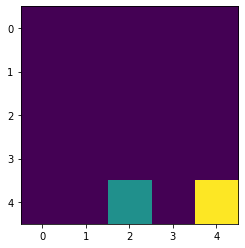

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.15}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.2986}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.2443}, (1, 3): {'U': -1.3471, 'D': 0.5816, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.5718, 

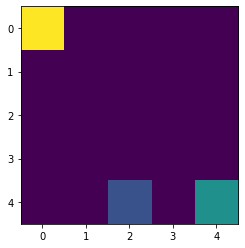

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.161}, (0, 1): {'U': -2.8345, 'D': -2.7565, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.2986}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.2443}, (1, 3): {'U': -1.3471, 'D': 0.5816, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

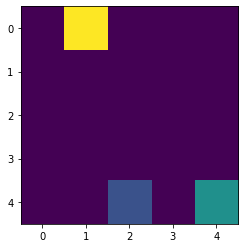

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.161}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.2986}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.2443}, (1, 3): {'U': -1.3471, 'D': 0.5816, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

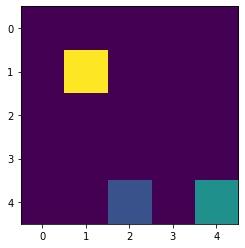

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.161}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.2443}, (1, 3): {'U': -1.3471, 'D': 0.5816, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

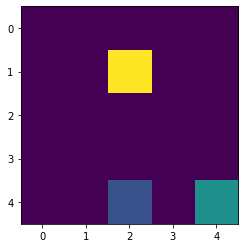

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.161}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.5816, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

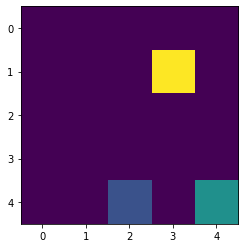

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.161}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.6768, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

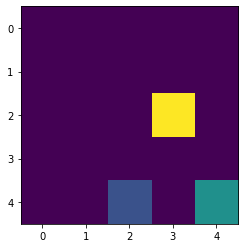

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.161}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.6768, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

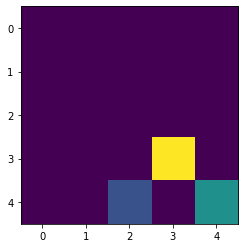

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.161}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.6768, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

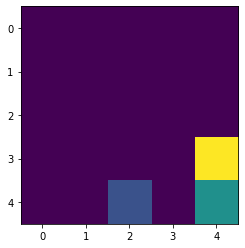

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.161}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.6768, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

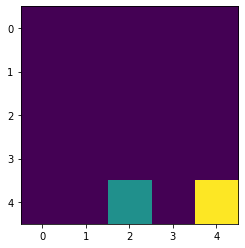

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.1544, 'R': -3.161}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.6768, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.6175, '

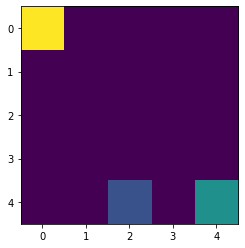

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.1553, 'D': -3.1637, 'L': -3.2282, 'R': -3.161}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.6768, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

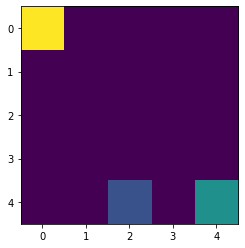

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1637, 'L': -3.2282, 'R': -3.161}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.6768, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

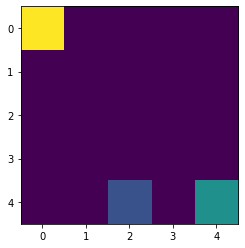

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1637, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7692}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.6768, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

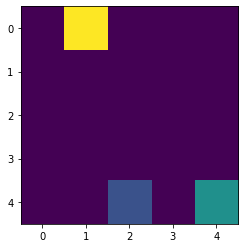

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1637, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.2461}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.6768, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

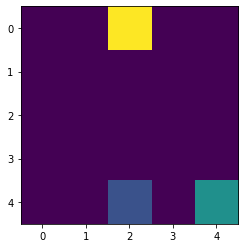

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1637, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.2627, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.6768, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

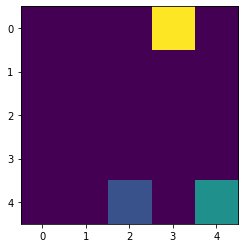

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1637, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.6768, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

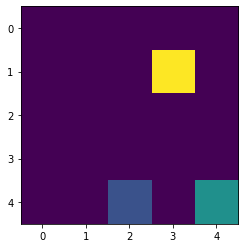

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1637, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

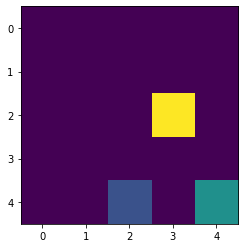

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1637, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

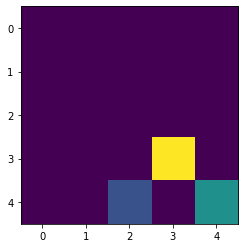

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1637, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

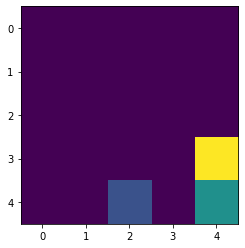

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1637, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

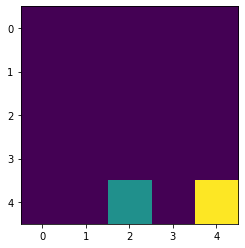

Reward in the end :  4
Timestep :  11

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1637, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.6543,

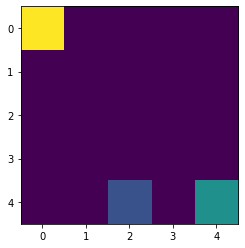

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.7886, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

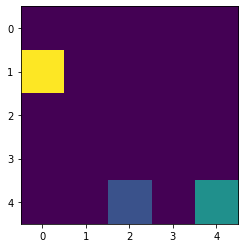

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.4041, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

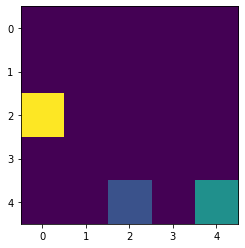

Next state of Agent :  (2, 0)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3935}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

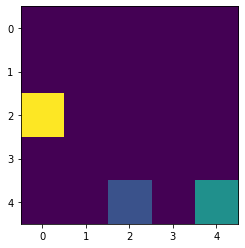

Next state of Agent :  (2, 1)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.6347, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

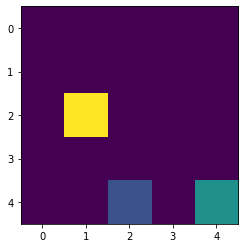

Next state of Agent :  (3, 1)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

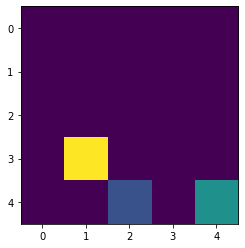

Next state of Agent :  (3, 2)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

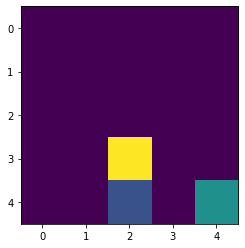

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

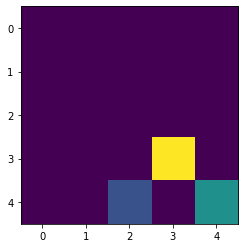

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

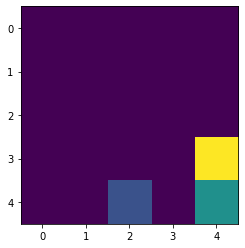

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

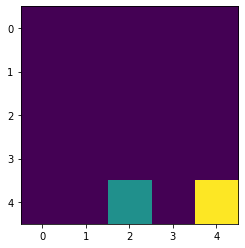

Reward in the end :  4
Timestep :  10

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1719}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.6543,

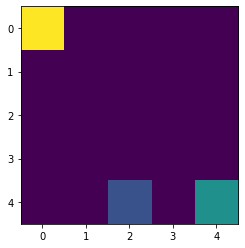

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.773, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

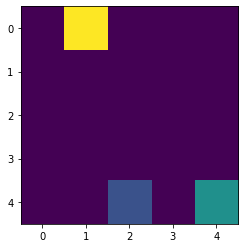

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.238}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

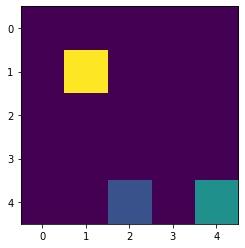

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.1668}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -1.1024}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

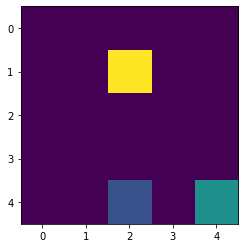

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.1668}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.9603}, (1, 3): {'U': -1.3471, 'D': 0.7602, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

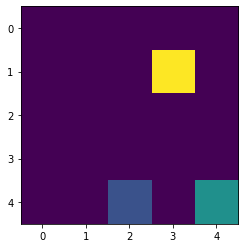

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.1668}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.9603}, (1, 3): {'U': -1.3471, 'D': 0.8328, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

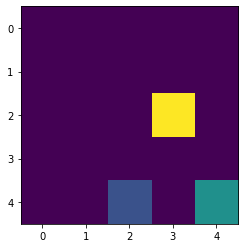

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.1668}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.9603}, (1, 3): {'U': -1.3471, 'D': 0.8328, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

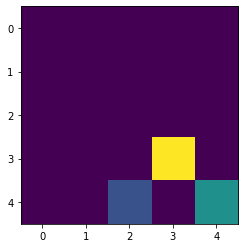

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.1668}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.9603}, (1, 3): {'U': -1.3471, 'D': 0.8328, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

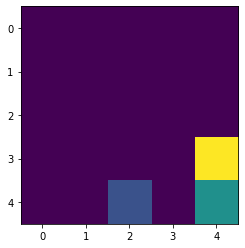

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.1668}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.9603}, (1, 3): {'U': -1.3471, 'D': 0.8328, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

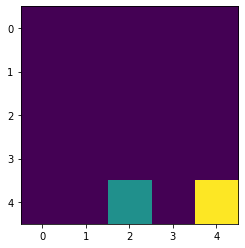

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1771, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.1668}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.9603}, (1, 3): {'U': -1.3471, 'D': 0.8328, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.6842

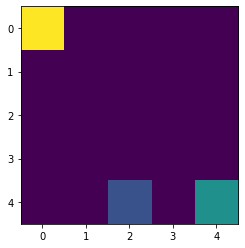

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7992}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.1668}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.9603}, (1, 3): {'U': -1.3471, 'D': 0.8328, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

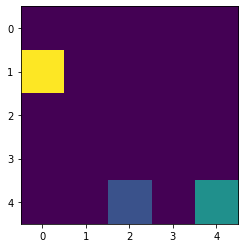

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.1668}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.9603}, (1, 3): {'U': -1.3471, 'D': 0.8328, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

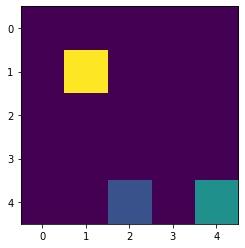

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.9603}, (1, 3): {'U': -1.3471, 'D': 0.8328, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

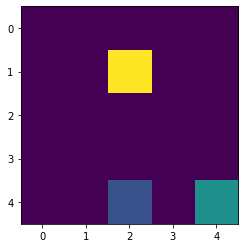

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.3471, 'D': 0.8328, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

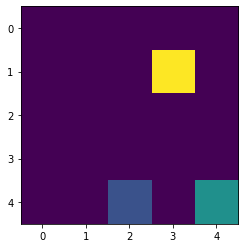

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -1.1019, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.8328, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

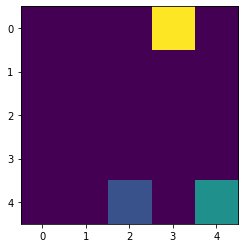

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -0.9483, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.8328, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

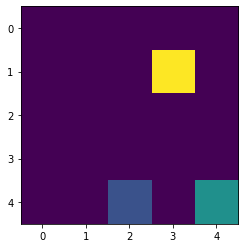

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -0.9483, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.8957, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

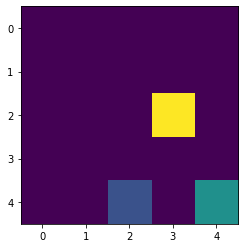

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -0.9483, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.8957, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

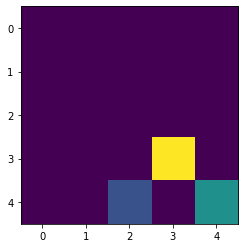

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -0.9483, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.8957, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

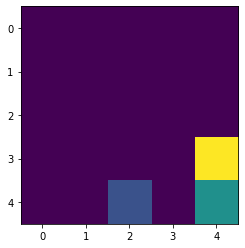

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -0.9483, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.8957, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

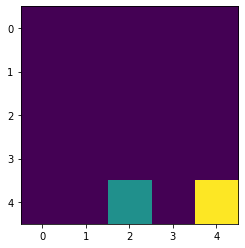

Reward in the end :  4
Timestep :  11

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2282, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -0.9483, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.8957, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.7083, 

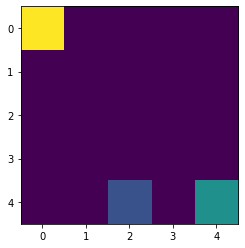

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1812}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -0.9483, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.8957, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

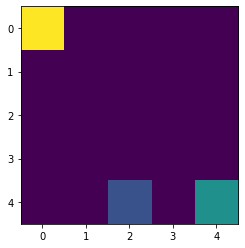

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1889}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7747}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -0.9483, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.8957, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

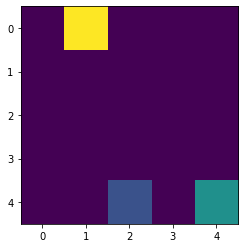

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1889}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7716}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1989}, (0, 3): {'U': -1.8692, 'D': -0.9483, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.8957, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

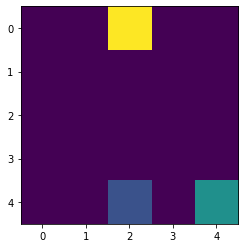

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1889}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7716}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1108}, (0, 3): {'U': -1.8692, 'D': -0.9483, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.8957, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

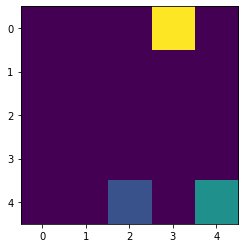

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1889}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7716}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1108}, (0, 3): {'U': -1.8692, 'D': -0.8153, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.8957, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

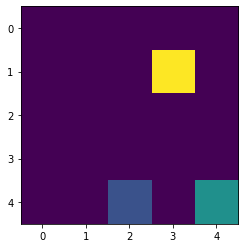

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1889}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7716}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1108}, (0, 3): {'U': -1.8692, 'D': -0.8153, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9499, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

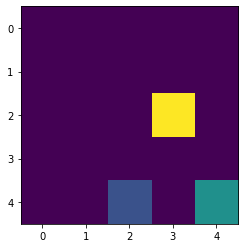

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1889}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7716}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1108}, (0, 3): {'U': -1.8692, 'D': -0.8153, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9499, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

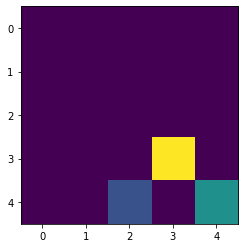

Next state of Agent :  (4, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1889}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7716}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1108}, (0, 3): {'U': -1.8692, 'D': -0.8153, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9499, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

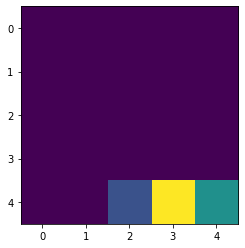

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1889}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7716}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1108}, (0, 3): {'U': -1.8692, 'D': -0.8153, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9499, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

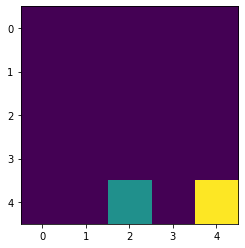

Reward in the end :  4
Timestep :  10

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1889}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7716}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1108}, (0, 3): {'U': -1.8692, 'D': -0.8153, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9499, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.7277, 

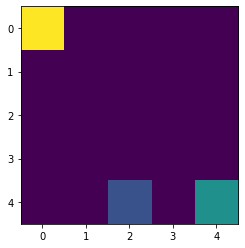

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7716}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1108}, (0, 3): {'U': -1.8692, 'D': -0.8153, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9499, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

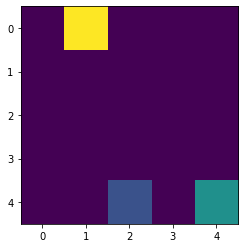

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.1108}, (0, 3): {'U': -1.8692, 'D': -0.8153, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9499, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

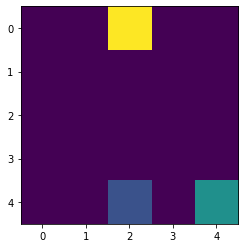

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.8153, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9499, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

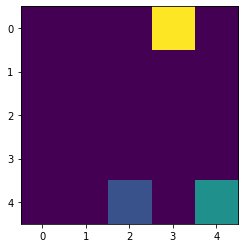

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9499, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

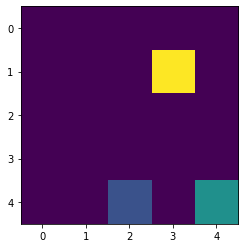

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9964, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

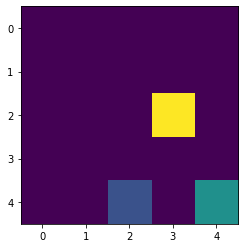

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9964, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

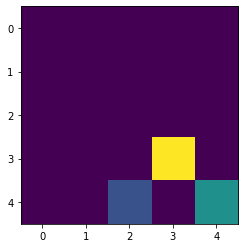

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9964, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

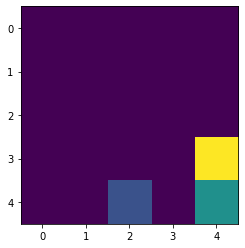

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9964, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2

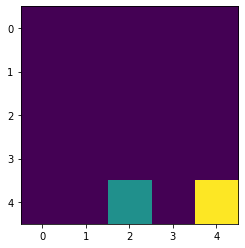

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1896, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9964, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.7432, 'L

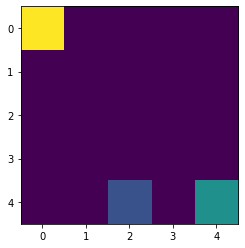

Next state of Agent :  (1, 0)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.786}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9964, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

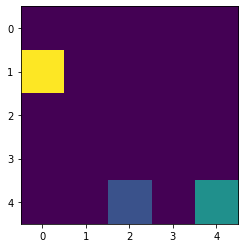

Next state of Agent :  (1, 1)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0871}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9964, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

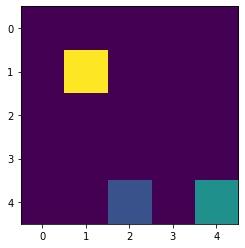

Next state of Agent :  (1, 2)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.835}, (1, 3): {'U': -1.454, 'D': 0.9964, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

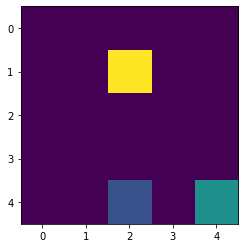

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 0.9964, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

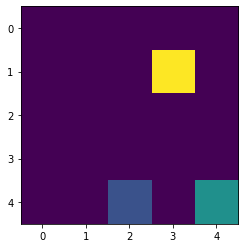

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.036, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

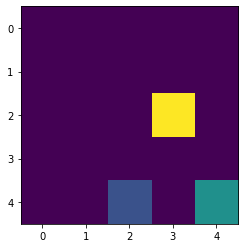

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.036, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

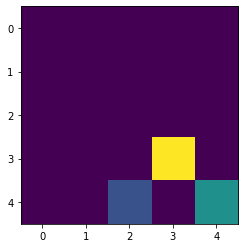

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.036, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

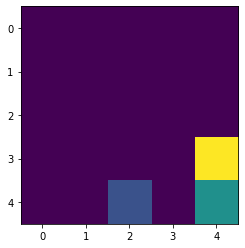

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.036, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

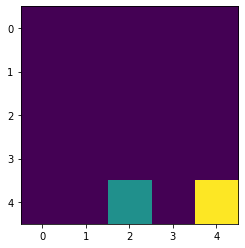

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1946}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.036, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.7557, '

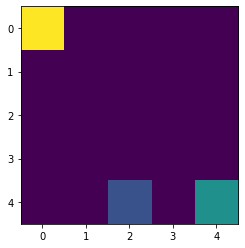

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1965}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.755}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.036, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

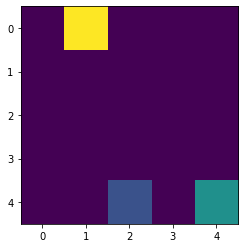

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1965}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7271}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -2.0191}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.036, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

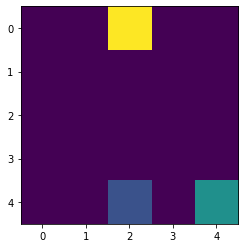

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1965}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7271}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.9273}, (0, 3): {'U': -1.8692, 'D': -0.7003, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.036, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

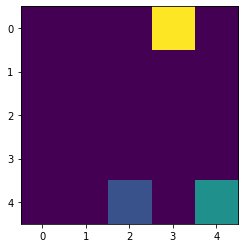

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1965}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7271}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.9273}, (0, 3): {'U': -1.8692, 'D': -0.5945, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.036, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

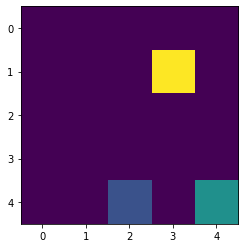

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1965}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7271}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.9273}, (0, 3): {'U': -1.8692, 'D': -0.5945, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0697, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

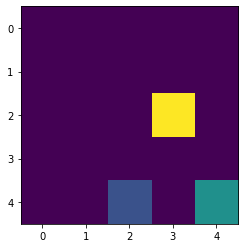

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1965}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7271}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.9273}, (0, 3): {'U': -1.8692, 'D': -0.5945, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0697, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

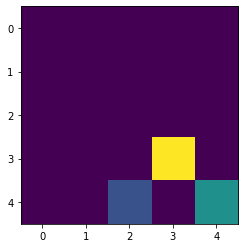

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1965}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7271}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.9273}, (0, 3): {'U': -1.8692, 'D': -0.5945, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0697, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

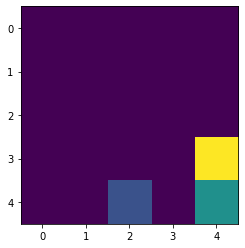

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1965}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7271}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.9273}, (0, 3): {'U': -1.8692, 'D': -0.5945, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0697, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

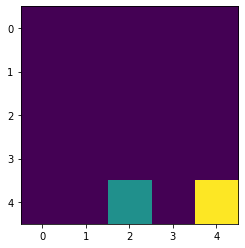

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1965}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7271}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.9273}, (0, 3): {'U': -1.8692, 'D': -0.5945, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0697, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.7658,

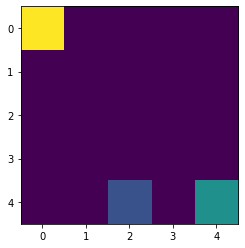

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1935}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.7271}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.9273}, (0, 3): {'U': -1.8692, 'D': -0.5945, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0697, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

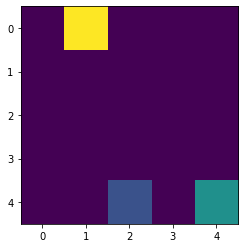

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1935}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.69}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.9273}, (0, 3): {'U': -1.8692, 'D': -0.5945, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0697, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

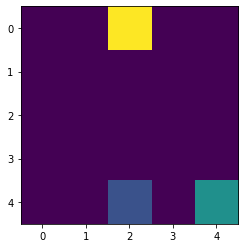

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1935}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.69}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.837}, (0, 3): {'U': -1.8692, 'D': -0.5945, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0697, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

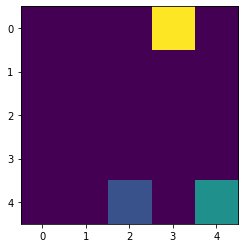

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1935}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.69}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.837}, (0, 3): {'U': -1.8692, 'D': -0.5044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0697, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

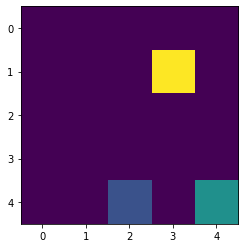

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1935}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.69}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.837}, (0, 3): {'U': -1.8692, 'D': -0.5044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0983, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

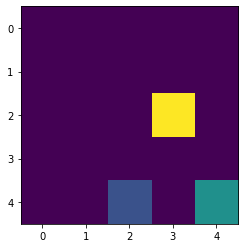

Next state of Agent :  (2, 4)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1935}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.69}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.837}, (0, 3): {'U': -1.8692, 'D': -0.5044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0983, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

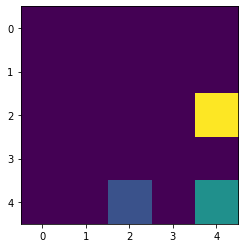

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1935}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.69}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.837}, (0, 3): {'U': -1.8692, 'D': -0.5044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0983, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

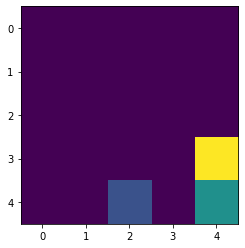

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1935}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.69}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.837}, (0, 3): {'U': -1.8692, 'D': -0.5044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0983, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2

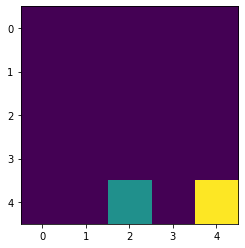

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1935}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.69}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.837}, (0, 3): {'U': -1.8692, 'D': -0.5044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0983, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.7658, 'L

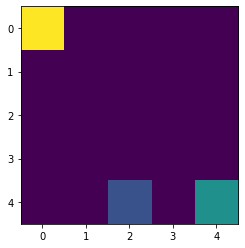

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1852}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.69}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.837}, (0, 3): {'U': -1.8692, 'D': -0.5044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0983, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

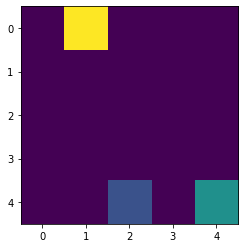

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1852}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.6459}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.837}, (0, 3): {'U': -1.8692, 'D': -0.5044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0983, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

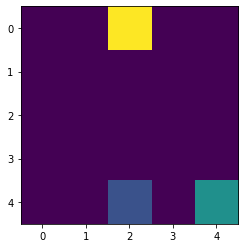

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1852}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.6459}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.7503}, (0, 3): {'U': -1.8692, 'D': -0.5044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0983, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

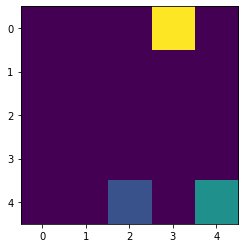

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1852}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.6459}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.7503}, (0, 3): {'U': -1.8692, 'D': -0.4278, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.0983, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

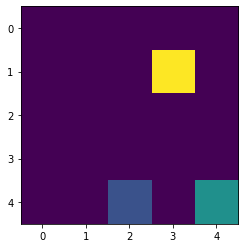

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1852}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.6459}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.7503}, (0, 3): {'U': -1.8692, 'D': -0.4278, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1212, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

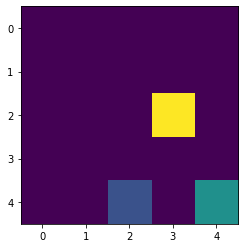

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1852}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.6459}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.7503}, (0, 3): {'U': -1.8692, 'D': -0.4278, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1212, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

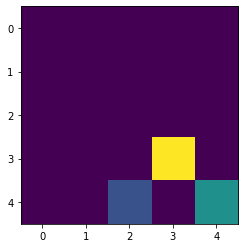

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1852}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.6459}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.7503}, (0, 3): {'U': -1.8692, 'D': -0.4278, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1212, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

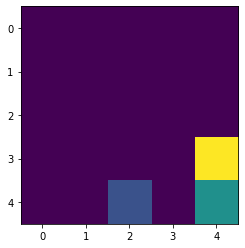

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1852}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.6459}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.7503}, (0, 3): {'U': -1.8692, 'D': -0.4278, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1212, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

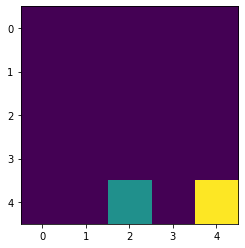

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1852}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.6459}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.7503}, (0, 3): {'U': -1.8692, 'D': -0.4278, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1212, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.7739,

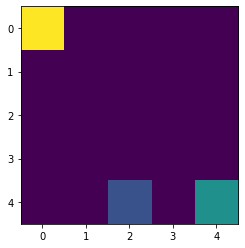

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1715}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.6459}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.7503}, (0, 3): {'U': -1.8692, 'D': -0.4278, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1212, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

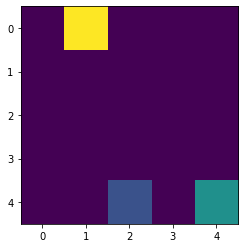

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1715}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5968}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.7503}, (0, 3): {'U': -1.8692, 'D': -0.4278, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1212, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

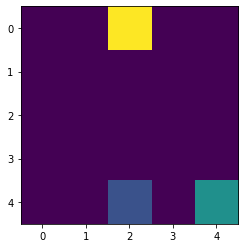

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1715}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5968}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.6687}, (0, 3): {'U': -1.8692, 'D': -0.4278, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1212, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

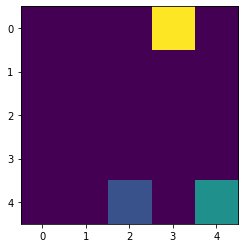

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1715}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5968}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.6687}, (0, 3): {'U': -1.7638, 'D': -0.4278, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1212, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

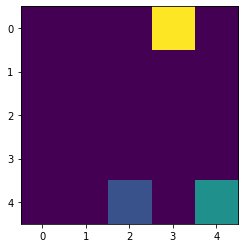

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1715}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5968}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.6687}, (0, 3): {'U': -1.7638, 'D': -0.3628, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1212, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

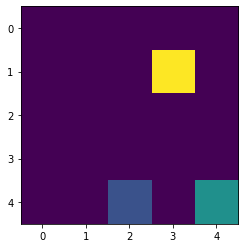

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1715}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5968}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.6687}, (0, 3): {'U': -1.7638, 'D': -0.3628, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1408, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

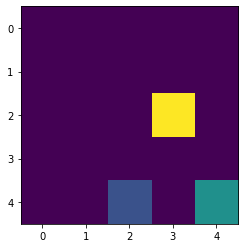

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1715}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5968}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.6687}, (0, 3): {'U': -1.7638, 'D': -0.3628, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1408, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

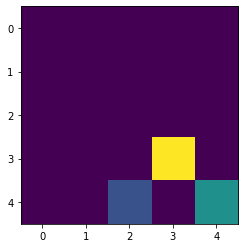

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1715}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5968}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.6687}, (0, 3): {'U': -1.7638, 'D': -0.3628, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1408, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

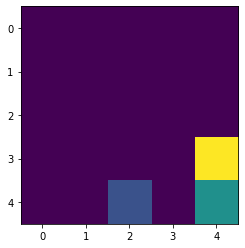

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1715}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5968}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.6687}, (0, 3): {'U': -1.7638, 'D': -0.3628, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1408, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

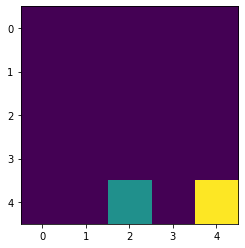

Reward in the end :  4
Timestep :  10

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1715}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5968}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.6687}, (0, 3): {'U': -1.7638, 'D': -0.3628, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1408, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.7805

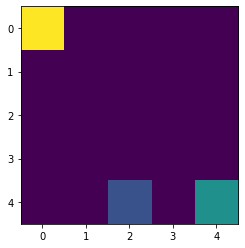

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1527}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5968}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.6687}, (0, 3): {'U': -1.7638, 'D': -0.3628, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1408, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

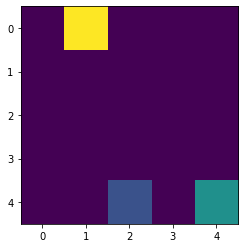

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1527}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5444}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.6687}, (0, 3): {'U': -1.7638, 'D': -0.3628, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1408, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

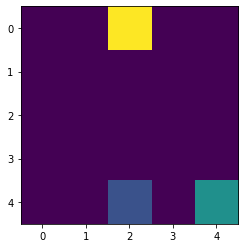

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1527}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5444}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.593}, (0, 3): {'U': -1.7638, 'D': -0.3628, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1408, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

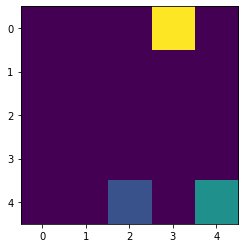

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1527}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5444}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.593}, (0, 3): {'U': -1.7638, 'D': -0.3077, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1408, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

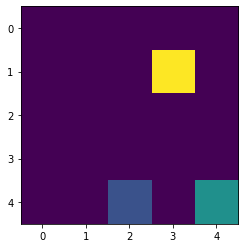

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1527}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5444}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.593}, (0, 3): {'U': -1.7638, 'D': -0.3077, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1575, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

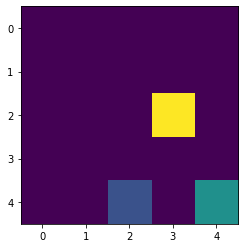

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1527}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5444}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.593}, (0, 3): {'U': -1.7638, 'D': -0.3077, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1575, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

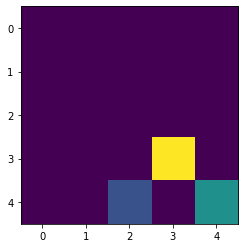

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1527}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5444}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.593}, (0, 3): {'U': -1.7638, 'D': -0.3077, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1575, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

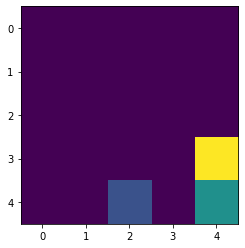

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1527}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5444}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.593}, (0, 3): {'U': -1.7638, 'D': -0.3077, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1575, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

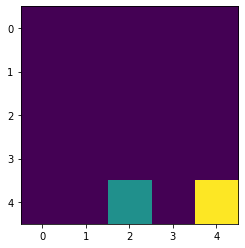

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1527}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5444}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.593}, (0, 3): {'U': -1.7638, 'D': -0.3077, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1575, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.7858, 

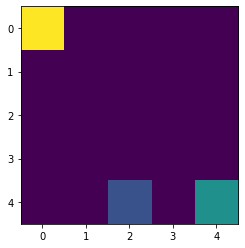

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1293}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.5444}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.593}, (0, 3): {'U': -1.7638, 'D': -0.3077, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1575, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

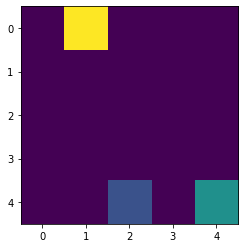

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1293}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4904}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.593}, (0, 3): {'U': -1.7638, 'D': -0.3077, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1575, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

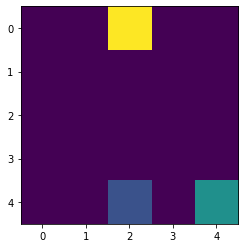

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1293}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4904}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.5236}, (0, 3): {'U': -1.7638, 'D': -0.3077, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1575, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

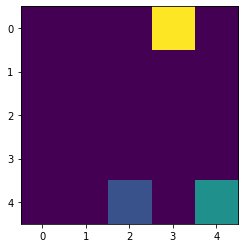

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1293}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4904}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.5236}, (0, 3): {'U': -1.7638, 'D': -0.261, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1575, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

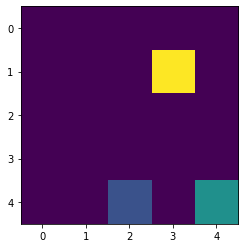

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1293}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4904}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.5236}, (0, 3): {'U': -1.7638, 'D': -0.261, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1717, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

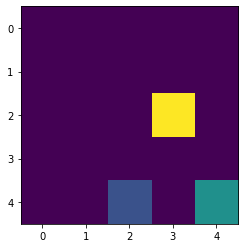

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1293}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4904}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.5236}, (0, 3): {'U': -1.7638, 'D': -0.261, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1717, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

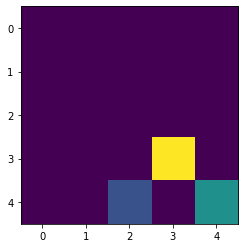

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1293}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4904}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.5236}, (0, 3): {'U': -1.7638, 'D': -0.261, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1717, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

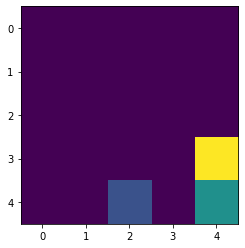

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1293}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4904}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.5236}, (0, 3): {'U': -1.7638, 'D': -0.261, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1717, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

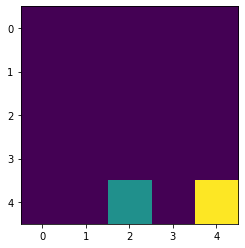

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1293}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4904}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.5236}, (0, 3): {'U': -1.7638, 'D': -0.261, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1717, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.7901, 

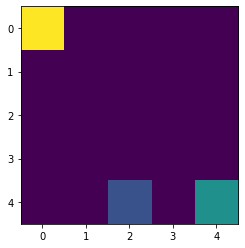

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1019}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4904}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.5236}, (0, 3): {'U': -1.7638, 'D': -0.261, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1717, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

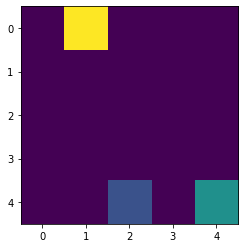

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1019}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4361}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.5236}, (0, 3): {'U': -1.7638, 'D': -0.261, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1717, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

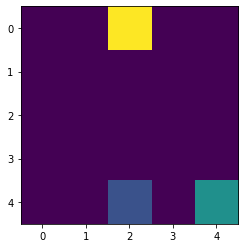

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1019}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4361}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4606}, (0, 3): {'U': -1.7638, 'D': -0.261, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1717, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

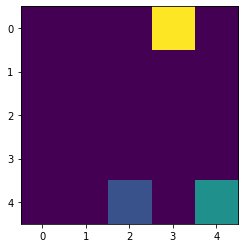

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1019}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4361}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4606}, (0, 3): {'U': -1.7638, 'D': -0.2213, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1717, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

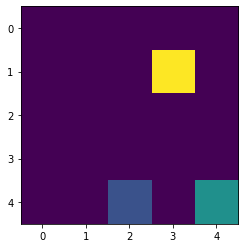

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1019}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4361}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4606}, (0, 3): {'U': -1.7638, 'D': -0.2213, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1838, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

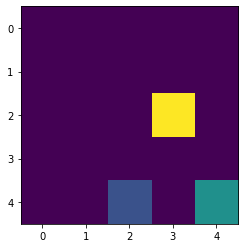

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1019}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4361}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4606}, (0, 3): {'U': -1.7638, 'D': -0.2213, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1838, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

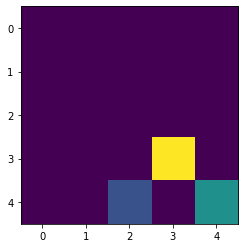

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1019}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4361}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4606}, (0, 3): {'U': -1.7638, 'D': -0.2213, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1838, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

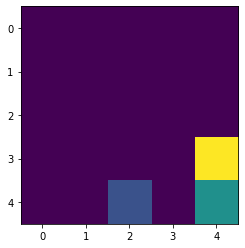

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1019}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4361}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4606}, (0, 3): {'U': -1.7638, 'D': -0.2213, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1838, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

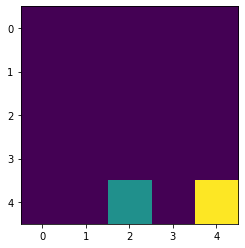

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.1019}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4361}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4606}, (0, 3): {'U': -1.7638, 'D': -0.2213, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1838, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.7935,

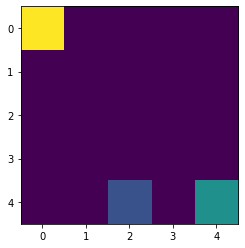

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0713}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.4361}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4606}, (0, 3): {'U': -1.7638, 'D': -0.2213, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1838, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

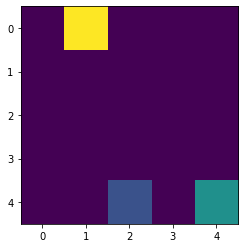

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0713}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3826}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4606}, (0, 3): {'U': -1.7638, 'D': -0.2213, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1838, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

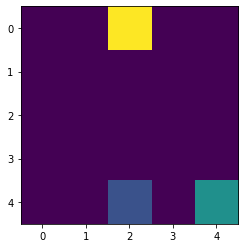

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0713}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3826}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4039}, (0, 3): {'U': -1.7638, 'D': -0.2213, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1838, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

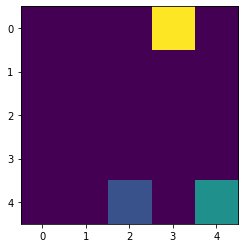

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0713}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3826}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4039}, (0, 3): {'U': -1.7638, 'D': -0.1876, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.1838, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

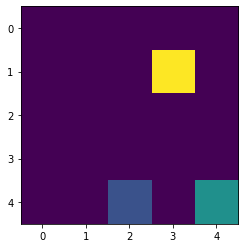

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0713}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3826}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4039}, (0, 3): {'U': -1.7638, 'D': -0.1876, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.194, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

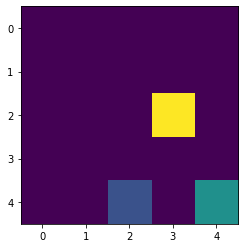

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0713}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3826}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4039}, (0, 3): {'U': -1.7638, 'D': -0.1876, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.194, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

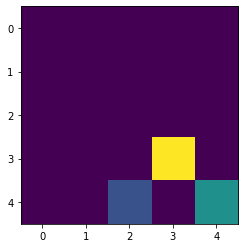

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0713}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3826}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4039}, (0, 3): {'U': -1.7638, 'D': -0.1876, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.194, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

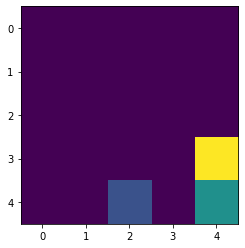

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0713}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3826}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4039}, (0, 3): {'U': -1.7638, 'D': -0.1876, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.194, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

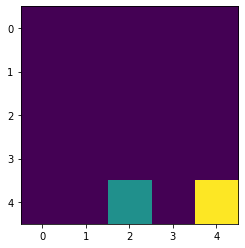

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0713}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3826}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4039}, (0, 3): {'U': -1.7638, 'D': -0.1876, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.194, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.7963, 

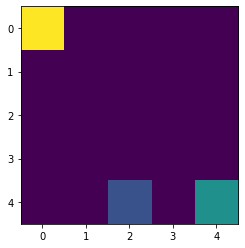

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0383}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3826}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4039}, (0, 3): {'U': -1.7638, 'D': -0.1876, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.194, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

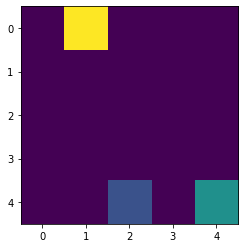

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0383}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3307}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.4039}, (0, 3): {'U': -1.7638, 'D': -0.1876, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.194, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

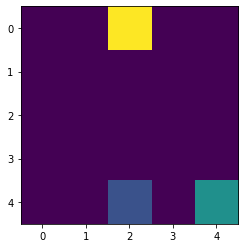

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0383}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3307}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3531}, (0, 3): {'U': -1.7638, 'D': -0.1876, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.194, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

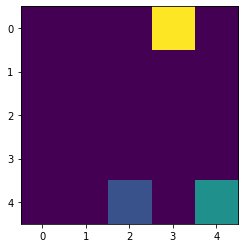

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0383}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3307}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3531}, (0, 3): {'U': -1.7638, 'D': -0.159, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.194, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

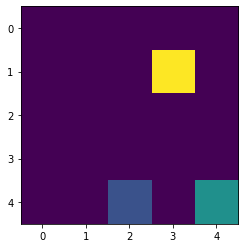

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0383}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3307}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3531}, (0, 3): {'U': -1.7638, 'D': -0.159, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2026, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

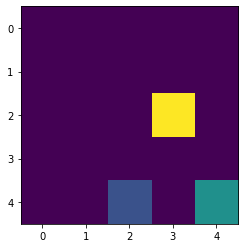

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0383}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3307}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3531}, (0, 3): {'U': -1.7638, 'D': -0.159, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2026, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

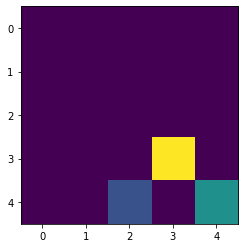

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0383}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3307}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3531}, (0, 3): {'U': -1.7638, 'D': -0.159, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2026, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

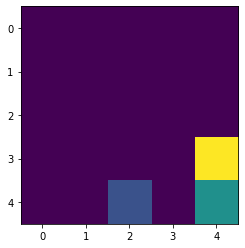

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0383}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3307}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3531}, (0, 3): {'U': -1.7638, 'D': -0.159, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2026, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

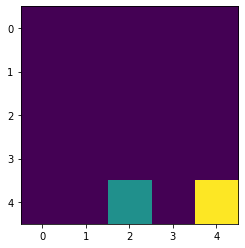

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0383}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3307}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3531}, (0, 3): {'U': -1.7638, 'D': -0.159, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2026, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.7985, 

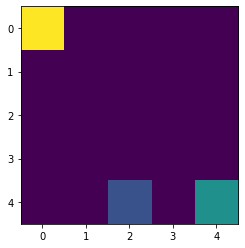

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0036}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.3307}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3531}, (0, 3): {'U': -1.7638, 'D': -0.159, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2026, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

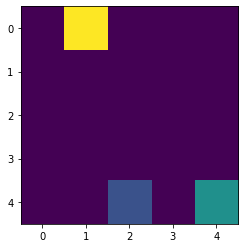

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0036}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2811}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3531}, (0, 3): {'U': -1.7638, 'D': -0.159, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2026, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

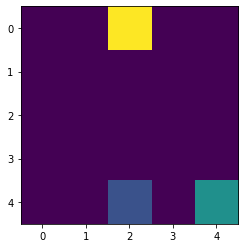

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0036}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2811}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3079}, (0, 3): {'U': -1.7638, 'D': -0.159, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2026, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

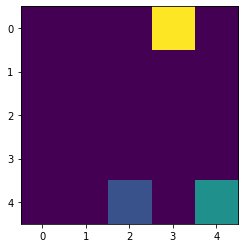

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0036}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2811}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3079}, (0, 3): {'U': -1.7638, 'D': -0.1348, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2026, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

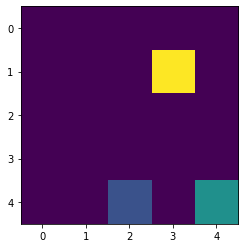

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0036}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2811}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3079}, (0, 3): {'U': -1.7638, 'D': -0.1348, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2098, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

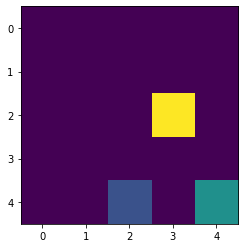

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0036}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2811}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3079}, (0, 3): {'U': -1.7638, 'D': -0.1348, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2098, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

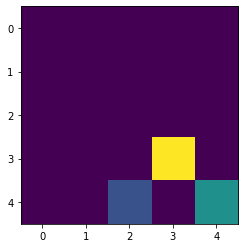

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0036}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2811}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3079}, (0, 3): {'U': -1.7638, 'D': -0.1348, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2098, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

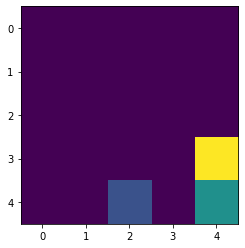

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0036}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2811}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3079}, (0, 3): {'U': -1.7638, 'D': -0.1348, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2098, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

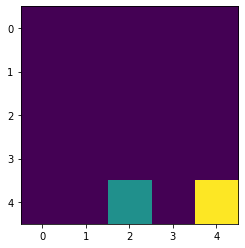

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -3.0036}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2811}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3079}, (0, 3): {'U': -1.7638, 'D': -0.1348, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2098, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8003,

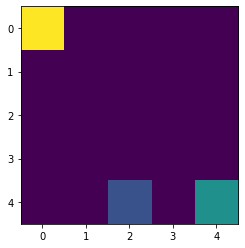

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9679}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2811}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3079}, (0, 3): {'U': -1.7638, 'D': -0.1348, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2098, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

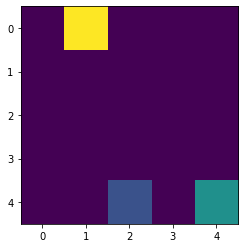

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9679}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2341}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.3079}, (0, 3): {'U': -1.7638, 'D': -0.1348, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2098, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

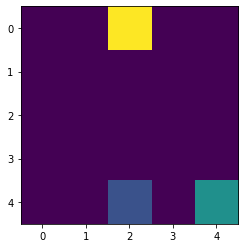

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9679}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2341}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2679}, (0, 3): {'U': -1.7638, 'D': -0.1348, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2098, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

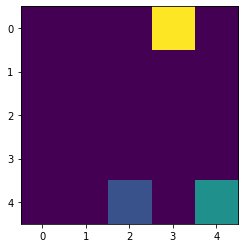

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9679}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2341}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2679}, (0, 3): {'U': -1.7638, 'D': -0.1143, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2098, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

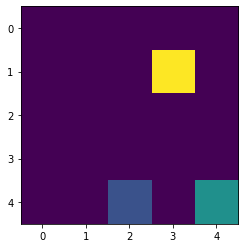

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9679}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2341}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2679}, (0, 3): {'U': -1.7638, 'D': -0.1143, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2159, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

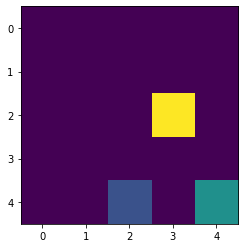

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9679}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2341}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2679}, (0, 3): {'U': -1.7638, 'D': -0.1143, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2159, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

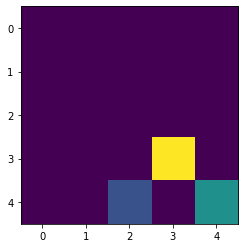

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9679}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2341}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2679}, (0, 3): {'U': -1.7638, 'D': -0.1143, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2159, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

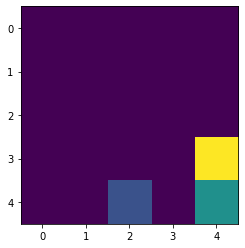

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9679}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2341}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2679}, (0, 3): {'U': -1.7638, 'D': -0.1143, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2159, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

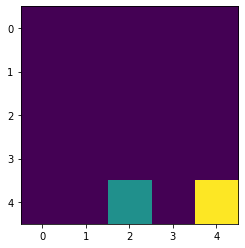

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9679}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2341}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2679}, (0, 3): {'U': -1.7638, 'D': -0.1143, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2159, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8018,

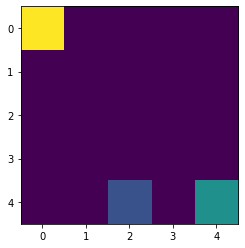

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9318}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.115, 'R': -2.2341}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2679}, (0, 3): {'U': -1.7638, 'D': -0.1143, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2159, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

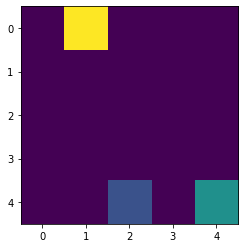

Next state of Agent :  (0, 0)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9318}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.2341}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2679}, (0, 3): {'U': -1.7638, 'D': -0.1143, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2159, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

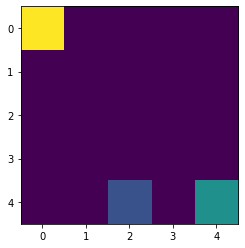

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9029}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.2341}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2679}, (0, 3): {'U': -1.7638, 'D': -0.1143, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2159, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

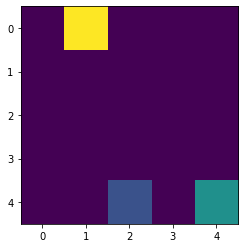

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9029}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1901}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2679}, (0, 3): {'U': -1.7638, 'D': -0.1143, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2159, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

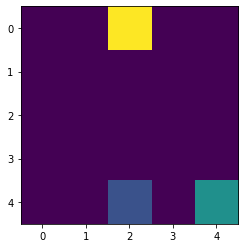

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9029}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1901}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2326}, (0, 3): {'U': -1.7638, 'D': -0.1143, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2159, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

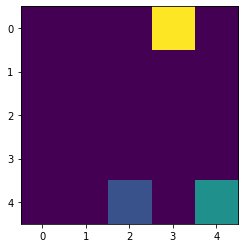

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9029}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1901}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2326}, (0, 3): {'U': -1.7638, 'D': -0.0969, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2159, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

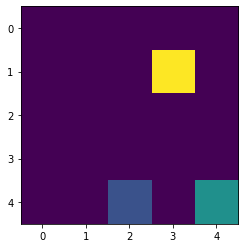

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9029}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1901}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2326}, (0, 3): {'U': -1.7638, 'D': -0.0969, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.221, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

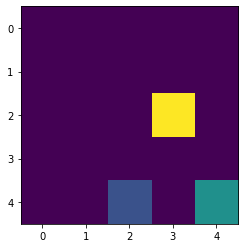

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9029}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1901}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2326}, (0, 3): {'U': -1.7638, 'D': -0.0969, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.221, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

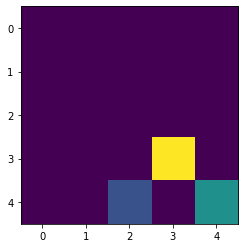

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  9
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9029}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1901}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2326}, (0, 3): {'U': -1.7638, 'D': -0.0969, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.221, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

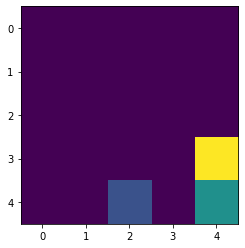

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  10
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9029}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1901}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2326}, (0, 3): {'U': -1.7638, 'D': -0.0969, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.221, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

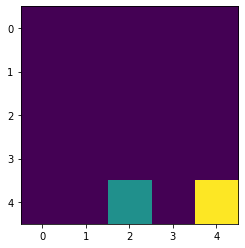

Reward in the end :  4
Timestep :  11

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.9029}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1901}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2326}, (0, 3): {'U': -1.7638, 'D': -0.0969, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.221, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.803,

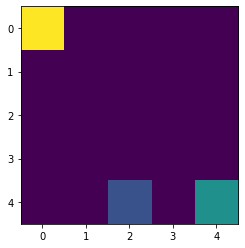

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8727}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1901}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2326}, (0, 3): {'U': -1.7638, 'D': -0.0969, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.221, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

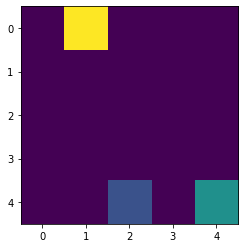

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8727}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1493}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2326}, (0, 3): {'U': -1.7638, 'D': -0.0969, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.221, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

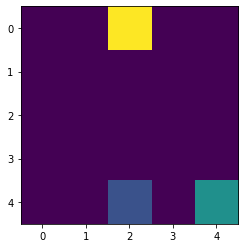

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8727}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1493}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2016}, (0, 3): {'U': -1.7638, 'D': -0.0969, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.221, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

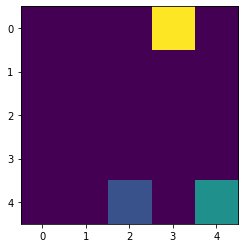

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8727}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1493}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2016}, (0, 3): {'U': -1.7638, 'D': -0.0822, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.221, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

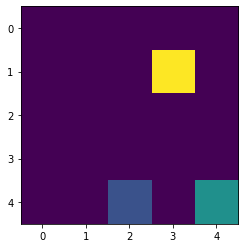

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8727}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1493}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2016}, (0, 3): {'U': -1.7638, 'D': -0.0822, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2253, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

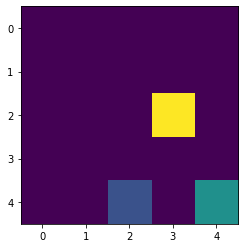

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8727}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1493}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2016}, (0, 3): {'U': -1.7638, 'D': -0.0822, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2253, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

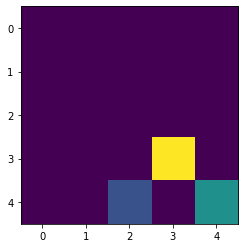

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8727}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1493}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2016}, (0, 3): {'U': -1.7638, 'D': -0.0822, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2253, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

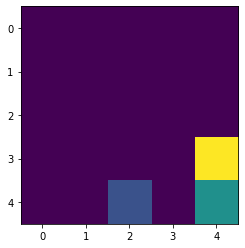

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8727}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1493}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2016}, (0, 3): {'U': -1.7638, 'D': -0.0822, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2253, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

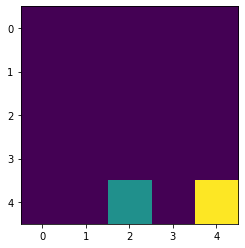

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8727}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1493}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2016}, (0, 3): {'U': -1.7638, 'D': -0.0822, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2253, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8039

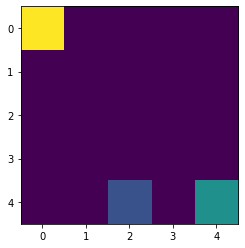

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1493}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2016}, (0, 3): {'U': -1.7638, 'D': -0.0822, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2253, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

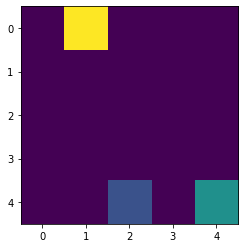

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1117}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.2016}, (0, 3): {'U': -1.7638, 'D': -0.0822, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2253, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

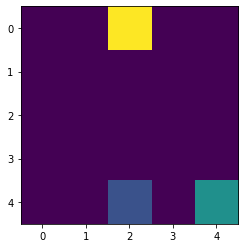

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1117}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1744}, (0, 3): {'U': -1.7638, 'D': -0.0822, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2253, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

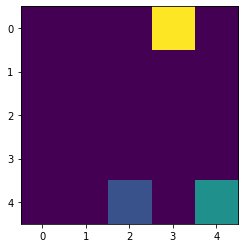

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1117}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1744}, (0, 3): {'U': -1.7638, 'D': -0.0697, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2253, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

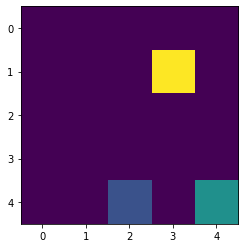

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1117}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1744}, (0, 3): {'U': -1.7638, 'D': -0.0697, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2289, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

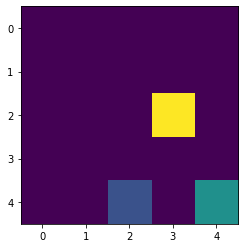

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1117}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1744}, (0, 3): {'U': -1.7638, 'D': -0.0697, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2289, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

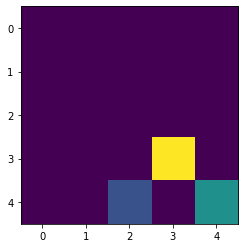

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1117}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1744}, (0, 3): {'U': -1.7638, 'D': -0.0697, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2289, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

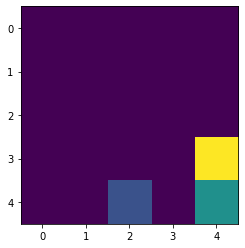

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1117}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1744}, (0, 3): {'U': -1.7638, 'D': -0.0697, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2289, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

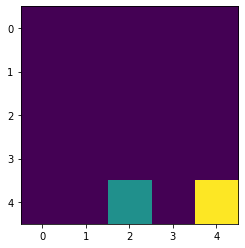

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1117}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1744}, (0, 3): {'U': -1.7638, 'D': -0.0697, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2289, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8047,

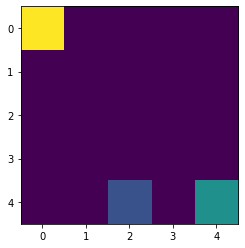

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8115}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.1117}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1744}, (0, 3): {'U': -1.7638, 'D': -0.0697, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2289, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

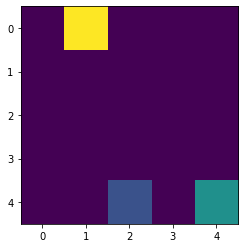

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8115}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0773}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1744}, (0, 3): {'U': -1.7638, 'D': -0.0697, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2289, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

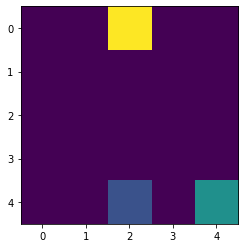

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8115}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0773}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1507}, (0, 3): {'U': -1.7638, 'D': -0.0697, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2289, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

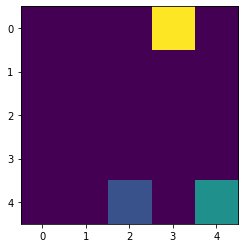

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8115}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0773}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1507}, (0, 3): {'U': -1.7638, 'D': -0.0591, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2289, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

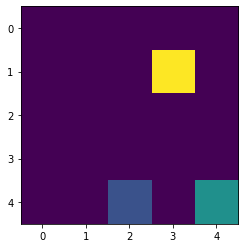

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8115}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0773}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1507}, (0, 3): {'U': -1.7638, 'D': -0.0591, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2319, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

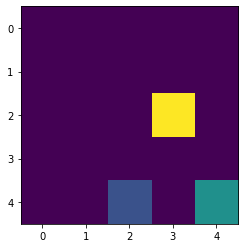

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8115}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0773}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1507}, (0, 3): {'U': -1.7638, 'D': -0.0591, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2319, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

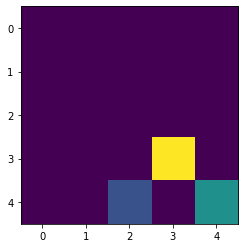

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8115}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0773}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1507}, (0, 3): {'U': -1.7638, 'D': -0.0591, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2319, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

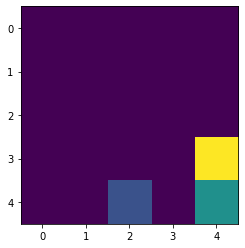

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8115}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0773}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1507}, (0, 3): {'U': -1.7638, 'D': -0.0591, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2319, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

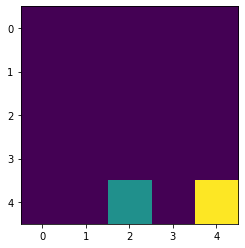

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.8115}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0773}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1507}, (0, 3): {'U': -1.7638, 'D': -0.0591, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2319, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8053

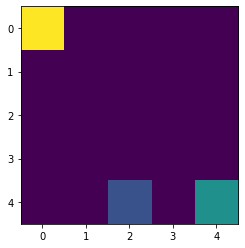

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7816}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0773}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1507}, (0, 3): {'U': -1.7638, 'D': -0.0591, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2319, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

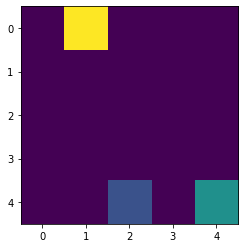

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7816}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.046}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.1507}, (0, 3): {'U': -1.7638, 'D': -0.0591, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2319, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

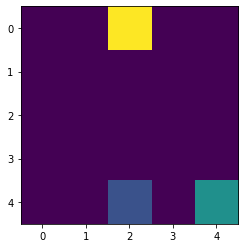

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7816}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.046}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.13}, (0, 3): {'U': -1.7638, 'D': -0.0591, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2319, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

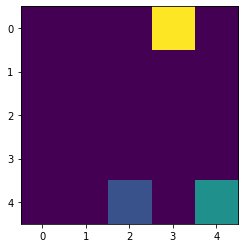

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7816}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.046}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.13}, (0, 3): {'U': -1.7638, 'D': -0.0502, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2319, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

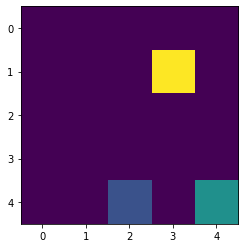

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7816}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.046}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.13}, (0, 3): {'U': -1.7638, 'D': -0.0502, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2344, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

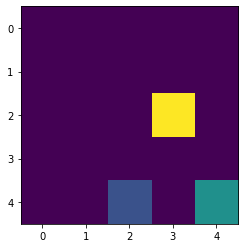

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7816}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.046}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.13}, (0, 3): {'U': -1.7638, 'D': -0.0502, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2344, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

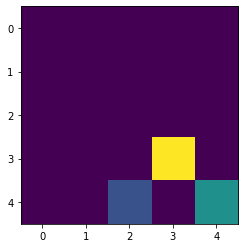

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7816}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.046}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.13}, (0, 3): {'U': -1.7638, 'D': -0.0502, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2344, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

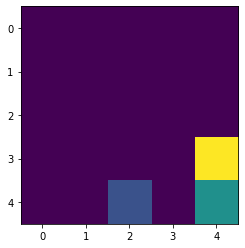

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7816}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.046}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.13}, (0, 3): {'U': -1.7638, 'D': -0.0502, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2344, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 

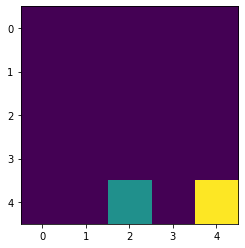

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7816}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.046}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.13}, (0, 3): {'U': -1.7638, 'D': -0.0502, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2344, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8058, '

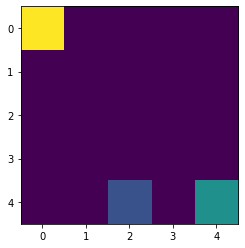

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7526}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.046}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.13}, (0, 3): {'U': -1.7638, 'D': -0.0502, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2344, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D':

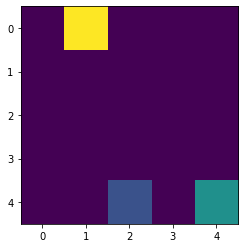

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7526}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0176}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.13}, (0, 3): {'U': -1.7638, 'D': -0.0502, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2344, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

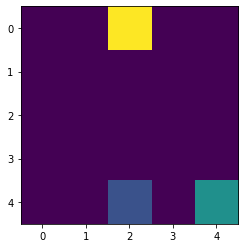

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7526}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0176}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.112}, (0, 3): {'U': -1.7638, 'D': -0.0502, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2344, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

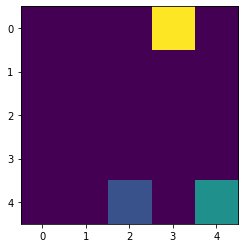

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7526}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0176}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.112}, (0, 3): {'U': -1.7638, 'D': -0.0427, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2344, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

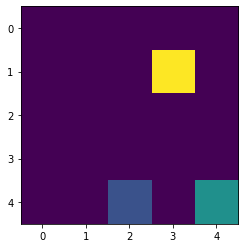

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7526}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0176}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.112}, (0, 3): {'U': -1.7638, 'D': -0.0427, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2364, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

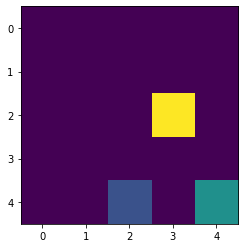

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7526}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0176}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.112}, (0, 3): {'U': -1.7638, 'D': -0.0427, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2364, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

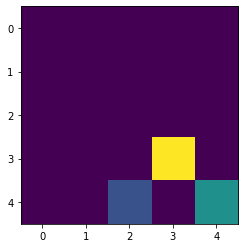

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7526}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0176}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.112}, (0, 3): {'U': -1.7638, 'D': -0.0427, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2364, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

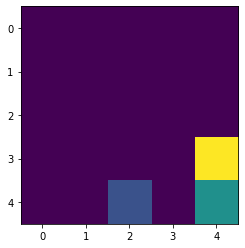

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7526}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0176}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.112}, (0, 3): {'U': -1.7638, 'D': -0.0427, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2364, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

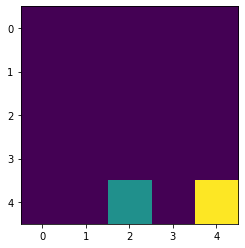

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7526}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0176}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.112}, (0, 3): {'U': -1.7638, 'D': -0.0427, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2364, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8062,

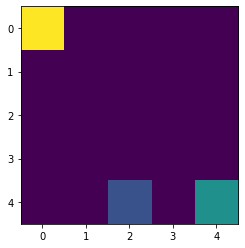

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7249}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -2.0176}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.112}, (0, 3): {'U': -1.7638, 'D': -0.0427, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2364, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

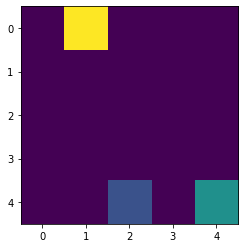

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7249}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.992}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.112}, (0, 3): {'U': -1.7638, 'D': -0.0427, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2364, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

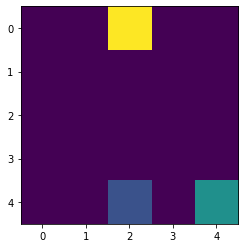

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7249}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.992}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0964}, (0, 3): {'U': -1.7638, 'D': -0.0427, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2364, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

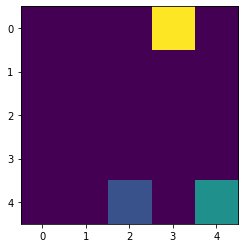

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7249}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.992}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0964}, (0, 3): {'U': -1.7638, 'D': -0.0363, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2364, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

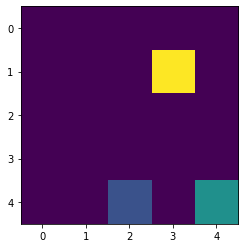

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7249}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.992}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0964}, (0, 3): {'U': -1.7638, 'D': -0.0363, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2381, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

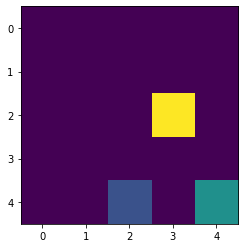

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7249}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.992}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0964}, (0, 3): {'U': -1.7638, 'D': -0.0363, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2381, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

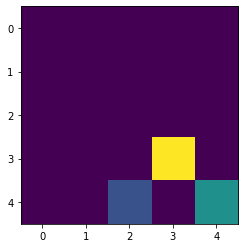

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7249}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.992}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0964}, (0, 3): {'U': -1.7638, 'D': -0.0363, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2381, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

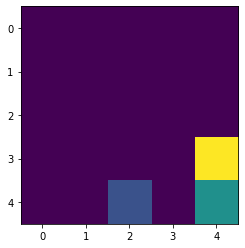

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7249}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.992}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0964}, (0, 3): {'U': -1.7638, 'D': -0.0363, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2381, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

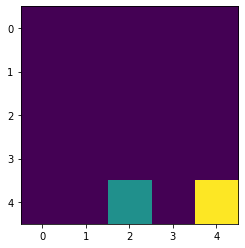

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.7249}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.992}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0964}, (0, 3): {'U': -1.7638, 'D': -0.0363, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2381, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8065,

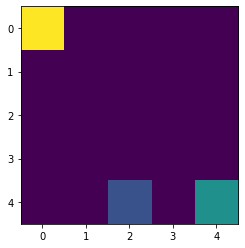

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6986}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.992}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0964}, (0, 3): {'U': -1.7638, 'D': -0.0363, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2381, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

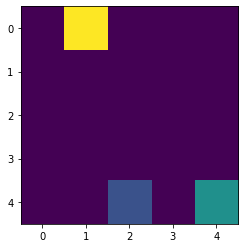

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6986}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.969}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0964}, (0, 3): {'U': -1.7638, 'D': -0.0363, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2381, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

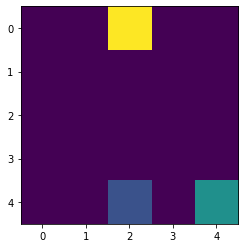

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6986}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.969}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0829}, (0, 3): {'U': -1.7638, 'D': -0.0363, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2381, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

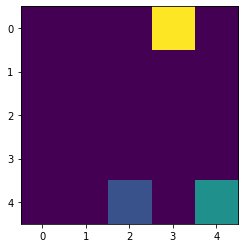

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6986}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.969}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0829}, (0, 3): {'U': -1.7638, 'D': -0.0309, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2381, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

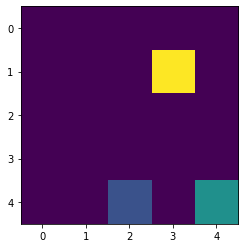

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6986}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.969}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0829}, (0, 3): {'U': -1.7638, 'D': -0.0309, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2395, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

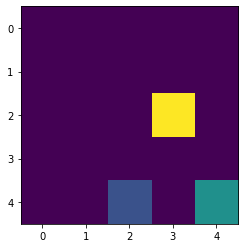

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6986}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.969}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0829}, (0, 3): {'U': -1.7638, 'D': -0.0309, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2395, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

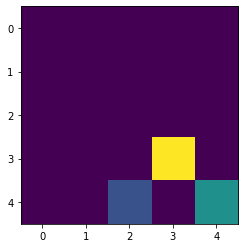

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6986}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.969}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0829}, (0, 3): {'U': -1.7638, 'D': -0.0309, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2395, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

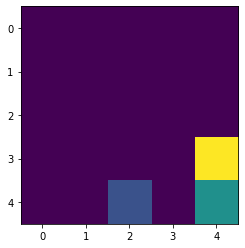

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6986}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.969}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0829}, (0, 3): {'U': -1.7638, 'D': -0.0309, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2395, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

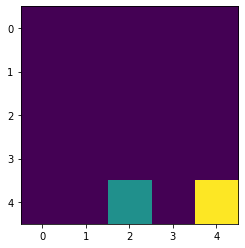

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6986}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.969}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0829}, (0, 3): {'U': -1.7638, 'D': -0.0309, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2395, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8067,

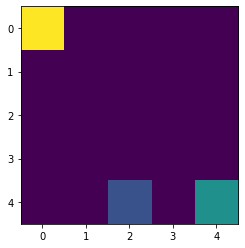

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6739}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.969}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0829}, (0, 3): {'U': -1.7638, 'D': -0.0309, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2395, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

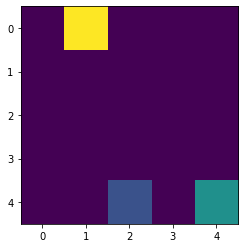

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6739}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9485}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0829}, (0, 3): {'U': -1.7638, 'D': -0.0309, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2395, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

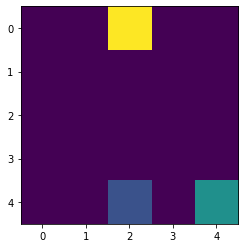

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6739}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9485}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0713}, (0, 3): {'U': -1.7638, 'D': -0.0309, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2395, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

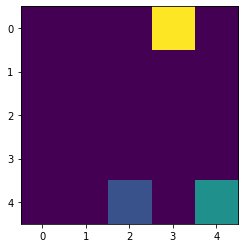

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6739}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9485}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0713}, (0, 3): {'U': -1.7638, 'D': -0.0264, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2395, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

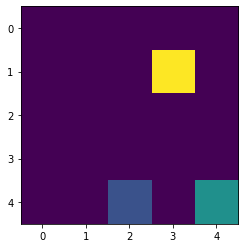

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6739}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9485}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0713}, (0, 3): {'U': -1.7638, 'D': -0.0264, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2407, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

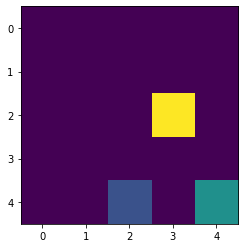

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6739}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9485}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0713}, (0, 3): {'U': -1.7638, 'D': -0.0264, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2407, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

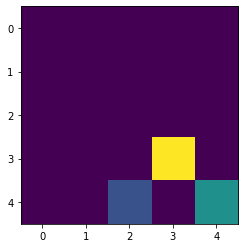

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6739}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9485}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0713}, (0, 3): {'U': -1.7638, 'D': -0.0264, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2407, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

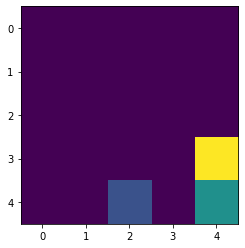

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6739}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9485}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0713}, (0, 3): {'U': -1.7638, 'D': -0.0264, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2407, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

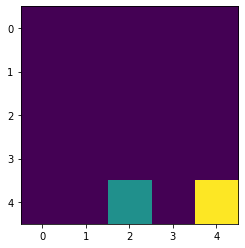

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6739}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9485}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0713}, (0, 3): {'U': -1.7638, 'D': -0.0264, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2407, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8069

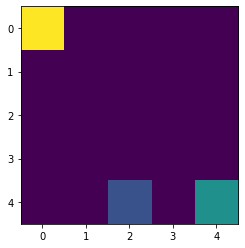

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6509}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9485}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0713}, (0, 3): {'U': -1.7638, 'D': -0.0264, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2407, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

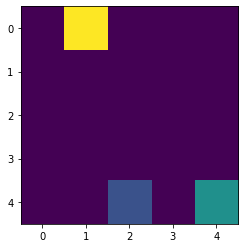

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6509}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9302}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0713}, (0, 3): {'U': -1.7638, 'D': -0.0264, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2407, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

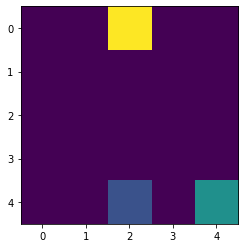

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6509}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9302}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0613}, (0, 3): {'U': -1.7638, 'D': -0.0264, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2407, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

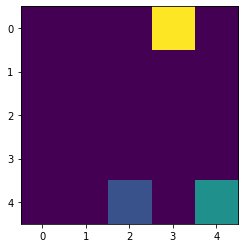

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6509}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9302}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0613}, (0, 3): {'U': -1.7638, 'D': -0.0226, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2407, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

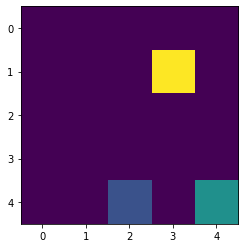

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6509}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9302}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0613}, (0, 3): {'U': -1.7638, 'D': -0.0226, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2417, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

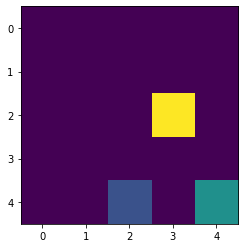

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6509}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9302}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0613}, (0, 3): {'U': -1.7638, 'D': -0.0226, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2417, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

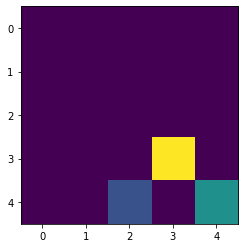

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6509}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9302}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0613}, (0, 3): {'U': -1.7638, 'D': -0.0226, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2417, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

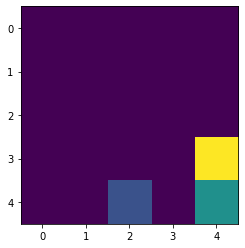

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6509}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9302}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0613}, (0, 3): {'U': -1.7638, 'D': -0.0226, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2417, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

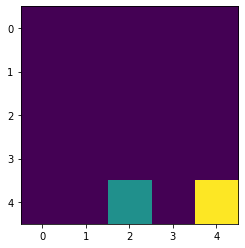

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6509}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9302}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0613}, (0, 3): {'U': -1.7638, 'D': -0.0226, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2417, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8071

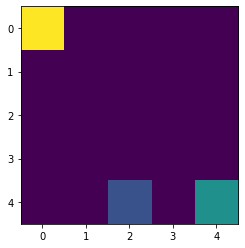

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6296}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.9302}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0613}, (0, 3): {'U': -1.7638, 'D': -0.0226, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2417, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

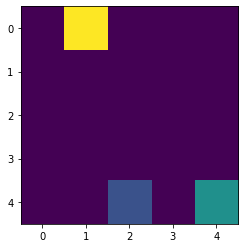

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6296}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.914}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0613}, (0, 3): {'U': -1.7638, 'D': -0.0226, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2417, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

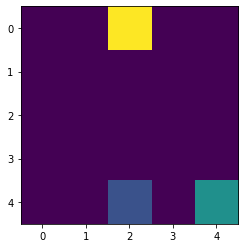

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6296}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.914}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0527}, (0, 3): {'U': -1.7638, 'D': -0.0226, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2417, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

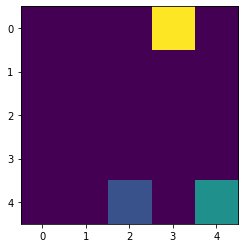

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6296}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.914}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0527}, (0, 3): {'U': -1.7638, 'D': -0.0194, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2417, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

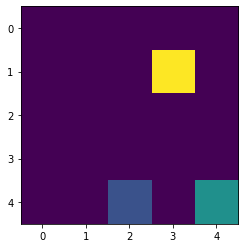

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6296}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.914}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0527}, (0, 3): {'U': -1.7638, 'D': -0.0194, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2425, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

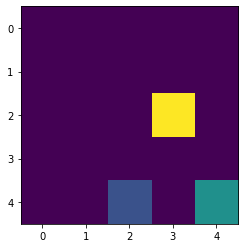

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6296}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.914}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0527}, (0, 3): {'U': -1.7638, 'D': -0.0194, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2425, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

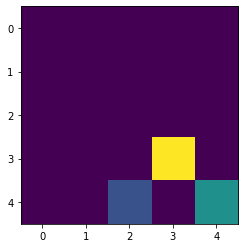

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6296}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.914}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0527}, (0, 3): {'U': -1.7638, 'D': -0.0194, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2425, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

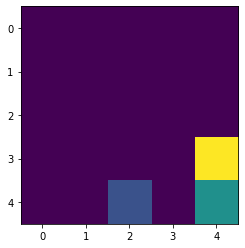

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6296}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.914}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0527}, (0, 3): {'U': -1.7638, 'D': -0.0194, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2425, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

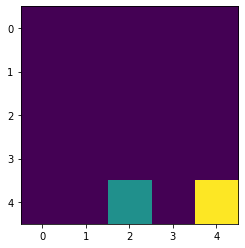

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6296}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.914}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0527}, (0, 3): {'U': -1.7638, 'D': -0.0194, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2425, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8072,

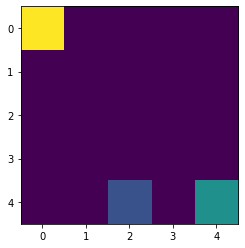

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6099}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.914}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0527}, (0, 3): {'U': -1.7638, 'D': -0.0194, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2425, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

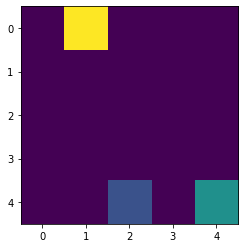

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6099}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8996}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0527}, (0, 3): {'U': -1.7638, 'D': -0.0194, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2425, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

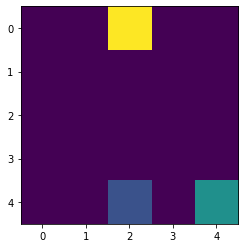

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6099}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8996}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0453}, (0, 3): {'U': -1.7638, 'D': -0.0194, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2425, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

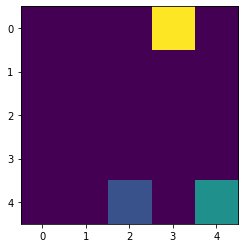

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6099}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8996}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0453}, (0, 3): {'U': -1.7638, 'D': -0.0167, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2425, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

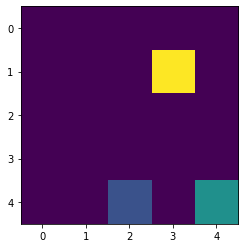

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6099}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8996}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0453}, (0, 3): {'U': -1.7638, 'D': -0.0167, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2432, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

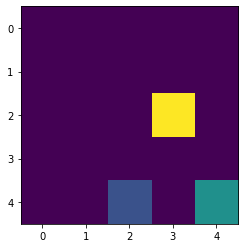

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6099}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8996}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0453}, (0, 3): {'U': -1.7638, 'D': -0.0167, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2432, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

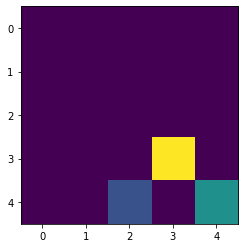

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6099}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8996}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0453}, (0, 3): {'U': -1.7638, 'D': -0.0167, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2432, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

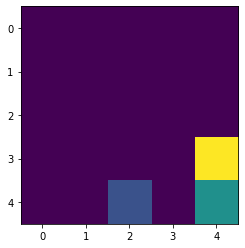

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6099}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8996}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0453}, (0, 3): {'U': -1.7638, 'D': -0.0167, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2432, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

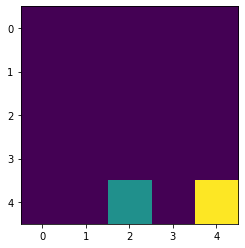

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.6099}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8996}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0453}, (0, 3): {'U': -1.7638, 'D': -0.0167, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2432, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8073

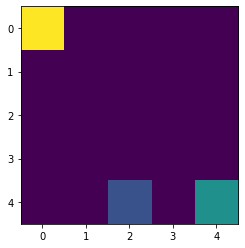

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5919}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8996}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0453}, (0, 3): {'U': -1.7638, 'D': -0.0167, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2432, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

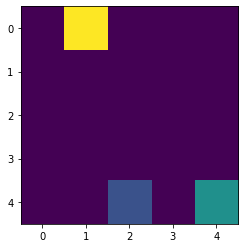

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5919}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8869}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0453}, (0, 3): {'U': -1.7638, 'D': -0.0167, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2432, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

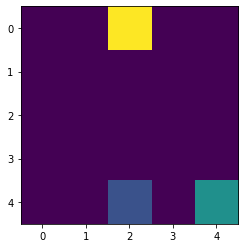

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5919}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8869}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0389}, (0, 3): {'U': -1.7638, 'D': -0.0167, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2432, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

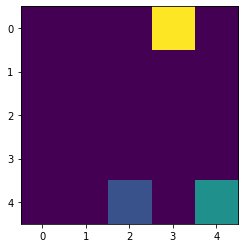

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5919}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8869}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0389}, (0, 3): {'U': -1.7638, 'D': -0.0144, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2432, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

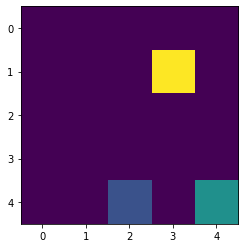

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5919}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8869}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0389}, (0, 3): {'U': -1.7638, 'D': -0.0144, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2437, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

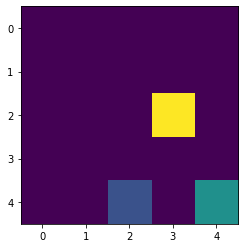

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5919}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8869}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0389}, (0, 3): {'U': -1.7638, 'D': -0.0144, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2437, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

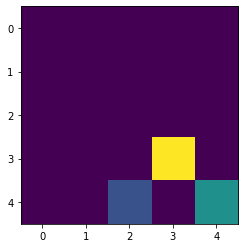

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5919}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8869}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0389}, (0, 3): {'U': -1.7638, 'D': -0.0144, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2437, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

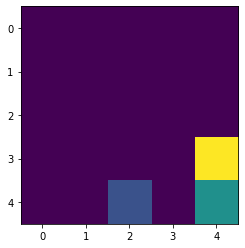

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5919}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8869}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0389}, (0, 3): {'U': -1.7638, 'D': -0.0144, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2437, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

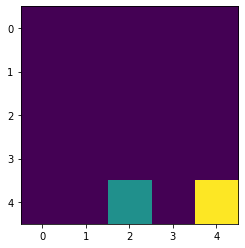

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5919}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8869}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0389}, (0, 3): {'U': -1.7638, 'D': -0.0144, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2437, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8074

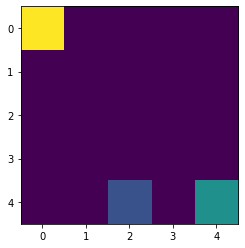

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5754}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8869}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0389}, (0, 3): {'U': -1.7638, 'D': -0.0144, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2437, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

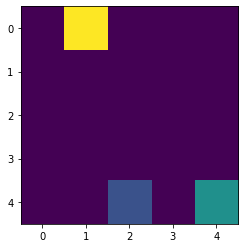

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5754}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8757}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0389}, (0, 3): {'U': -1.7638, 'D': -0.0144, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2437, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

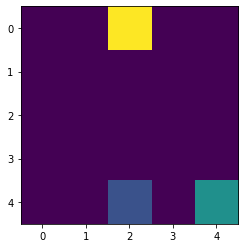

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5754}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8757}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0334}, (0, 3): {'U': -1.7638, 'D': -0.0144, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2437, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

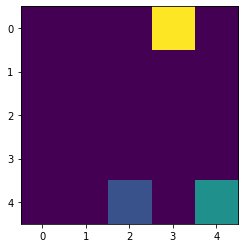

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5754}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8757}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0334}, (0, 3): {'U': -1.7638, 'D': -0.0125, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2437, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

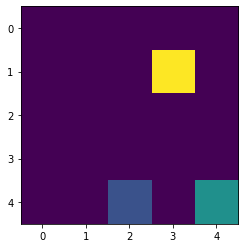

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5754}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8757}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0334}, (0, 3): {'U': -1.7638, 'D': -0.0125, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2441, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

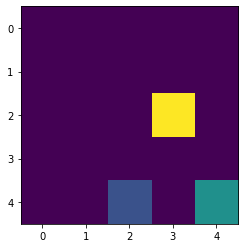

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5754}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8757}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0334}, (0, 3): {'U': -1.7638, 'D': -0.0125, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2441, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

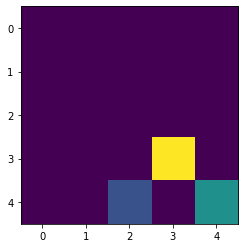

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5754}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8757}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0334}, (0, 3): {'U': -1.7638, 'D': -0.0125, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2441, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

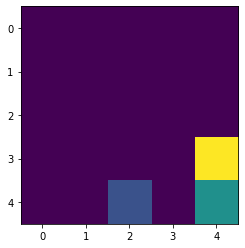

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5754}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8757}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0334}, (0, 3): {'U': -1.7638, 'D': -0.0125, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2441, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

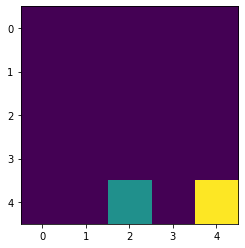

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5754}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8757}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0334}, (0, 3): {'U': -1.7638, 'D': -0.0125, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2441, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8075

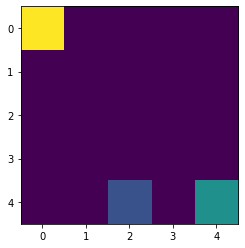

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5604}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8757}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0334}, (0, 3): {'U': -1.7638, 'D': -0.0125, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2441, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

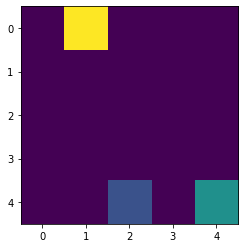

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5604}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8659}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0334}, (0, 3): {'U': -1.7638, 'D': -0.0125, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2441, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

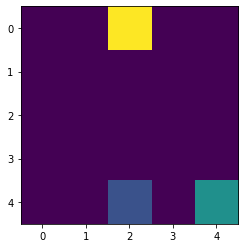

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5604}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8659}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0287}, (0, 3): {'U': -1.7638, 'D': -0.0125, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2441, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

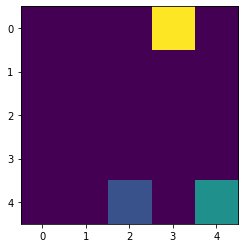

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5604}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8659}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0287}, (0, 3): {'U': -1.7638, 'D': -0.0109, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2441, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

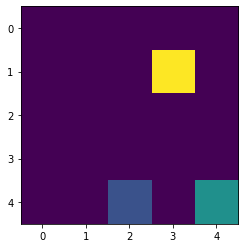

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5604}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8659}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0287}, (0, 3): {'U': -1.7638, 'D': -0.0109, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2445, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

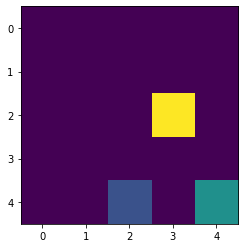

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5604}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8659}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0287}, (0, 3): {'U': -1.7638, 'D': -0.0109, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2445, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

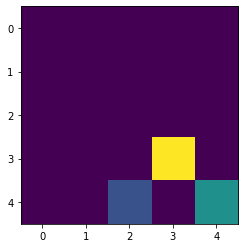

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5604}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8659}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0287}, (0, 3): {'U': -1.7638, 'D': -0.0109, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2445, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

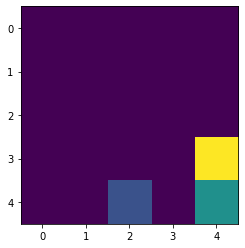

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5604}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8659}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0287}, (0, 3): {'U': -1.7638, 'D': -0.0109, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2445, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

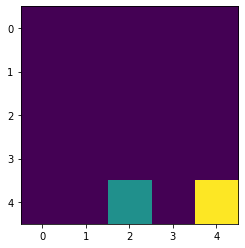

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5604}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8659}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0287}, (0, 3): {'U': -1.7638, 'D': -0.0109, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2445, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8075

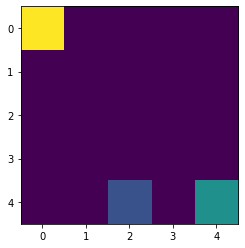

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5469}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8659}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0287}, (0, 3): {'U': -1.7638, 'D': -0.0109, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2445, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

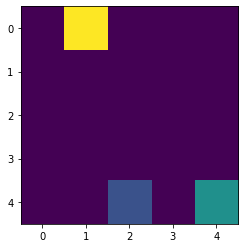

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5469}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8573}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0287}, (0, 3): {'U': -1.7638, 'D': -0.0109, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2445, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

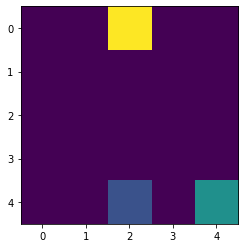

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5469}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8573}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0247}, (0, 3): {'U': -1.7638, 'D': -0.0109, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2445, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

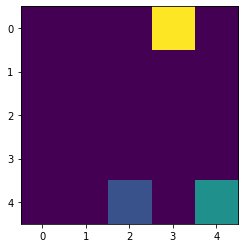

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5469}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8573}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0247}, (0, 3): {'U': -1.7638, 'D': -0.0096, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2445, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

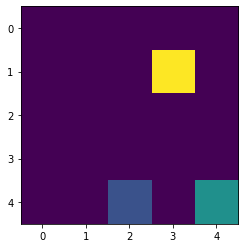

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5469}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8573}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0247}, (0, 3): {'U': -1.7638, 'D': -0.0096, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2448, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

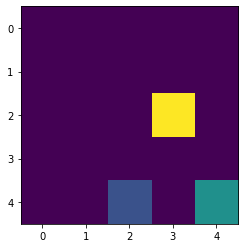

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5469}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8573}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0247}, (0, 3): {'U': -1.7638, 'D': -0.0096, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2448, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

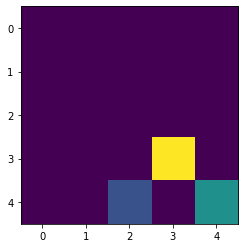

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5469}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8573}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0247}, (0, 3): {'U': -1.7638, 'D': -0.0096, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2448, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

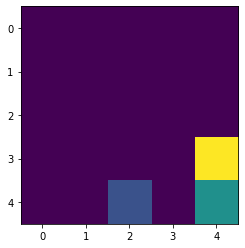

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5469}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8573}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0247}, (0, 3): {'U': -1.7638, 'D': -0.0096, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2448, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

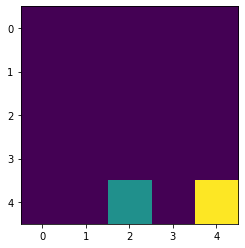

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5469}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8573}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0247}, (0, 3): {'U': -1.7638, 'D': -0.0096, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2448, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8075

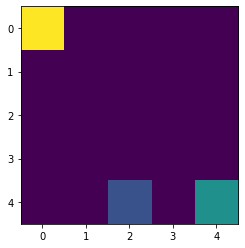

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5347}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8573}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0247}, (0, 3): {'U': -1.7638, 'D': -0.0096, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2448, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

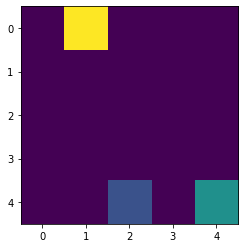

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5347}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8498}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0247}, (0, 3): {'U': -1.7638, 'D': -0.0096, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2448, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

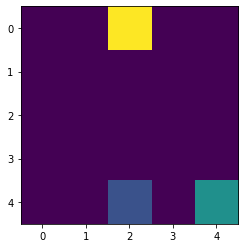

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5347}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8498}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0213}, (0, 3): {'U': -1.7638, 'D': -0.0096, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2448, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

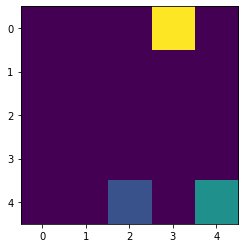

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5347}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8498}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0213}, (0, 3): {'U': -1.7638, 'D': -0.0085, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2448, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

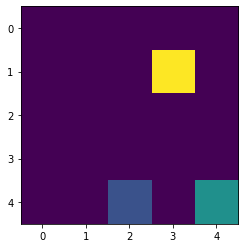

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5347}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8498}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0213}, (0, 3): {'U': -1.7638, 'D': -0.0085, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.245, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

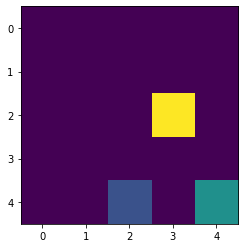

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5347}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8498}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0213}, (0, 3): {'U': -1.7638, 'D': -0.0085, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.245, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

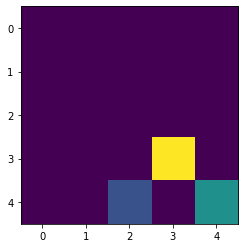

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5347}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8498}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0213}, (0, 3): {'U': -1.7638, 'D': -0.0085, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.245, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

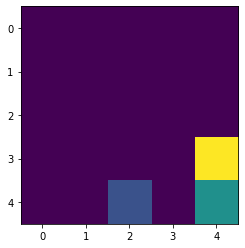

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5347}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8498}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0213}, (0, 3): {'U': -1.7638, 'D': -0.0085, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.245, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

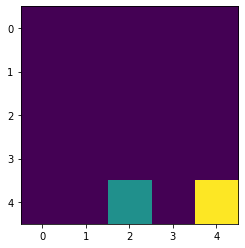

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5347}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8498}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0213}, (0, 3): {'U': -1.7638, 'D': -0.0085, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.245, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8075,

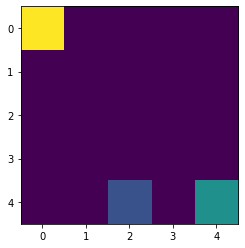

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5237}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8498}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0213}, (0, 3): {'U': -1.7638, 'D': -0.0085, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.245, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

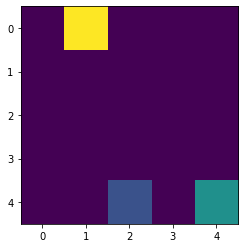

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5237}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8432}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0213}, (0, 3): {'U': -1.7638, 'D': -0.0085, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.245, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

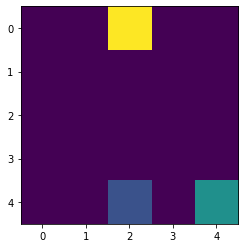

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5237}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8432}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0184}, (0, 3): {'U': -1.7638, 'D': -0.0085, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.245, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

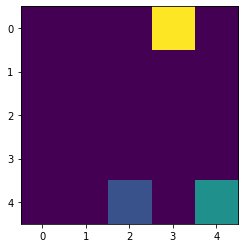

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5237}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8432}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0184}, (0, 3): {'U': -1.7638, 'D': -0.0076, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.245, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

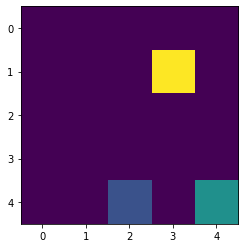

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5237}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8432}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0184}, (0, 3): {'U': -1.7638, 'D': -0.0076, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2452, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

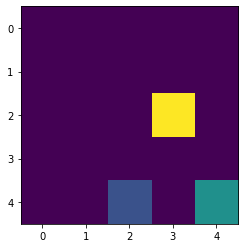

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5237}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8432}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0184}, (0, 3): {'U': -1.7638, 'D': -0.0076, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2452, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

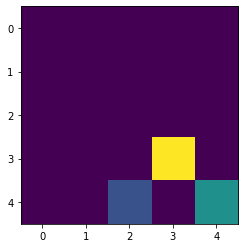

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5237}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8432}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0184}, (0, 3): {'U': -1.7638, 'D': -0.0076, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2452, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

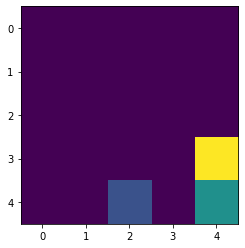

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5237}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8432}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0184}, (0, 3): {'U': -1.7638, 'D': -0.0076, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2452, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

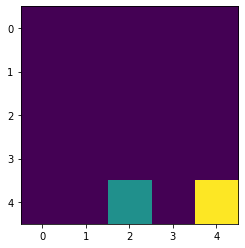

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5237}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8432}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0184}, (0, 3): {'U': -1.7638, 'D': -0.0076, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2452, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8075

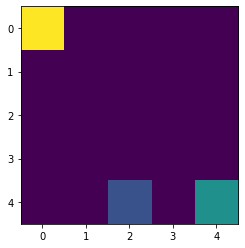

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5139}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8432}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0184}, (0, 3): {'U': -1.7638, 'D': -0.0076, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2452, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

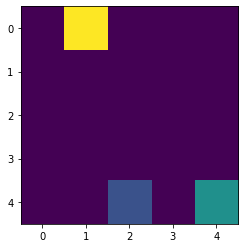

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5139}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8375}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0184}, (0, 3): {'U': -1.7638, 'D': -0.0076, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2452, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

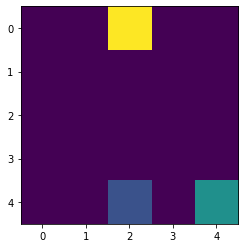

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5139}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8375}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0159}, (0, 3): {'U': -1.7638, 'D': -0.0076, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2452, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

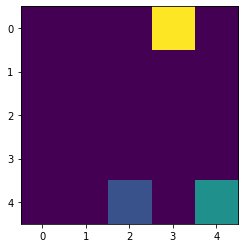

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5139}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8375}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0159}, (0, 3): {'U': -1.7638, 'D': -0.0068, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2452, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

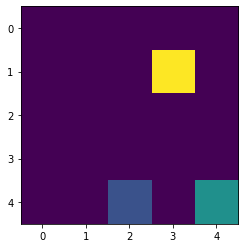

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5139}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8375}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0159}, (0, 3): {'U': -1.7638, 'D': -0.0068, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2454, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

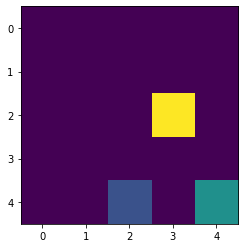

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5139}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8375}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0159}, (0, 3): {'U': -1.7638, 'D': -0.0068, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2454, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

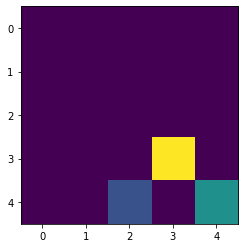

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5139}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8375}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0159}, (0, 3): {'U': -1.7638, 'D': -0.0068, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2454, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

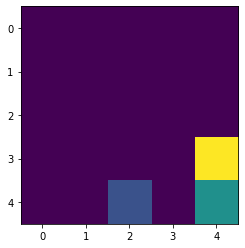

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5139}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8375}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0159}, (0, 3): {'U': -1.7638, 'D': -0.0068, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2454, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

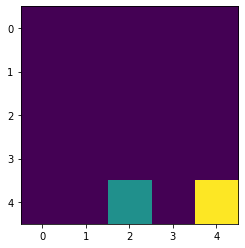

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5139}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8375}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0159}, (0, 3): {'U': -1.7638, 'D': -0.0068, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2454, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8075

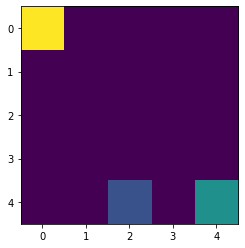

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5051}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8375}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0159}, (0, 3): {'U': -1.7638, 'D': -0.0068, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2454, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

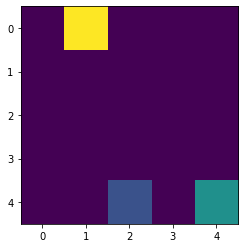

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5051}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8325}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0159}, (0, 3): {'U': -1.7638, 'D': -0.0068, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2454, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

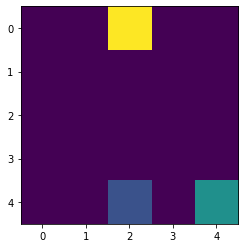

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5051}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8325}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0138}, (0, 3): {'U': -1.7638, 'D': -0.0068, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2454, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

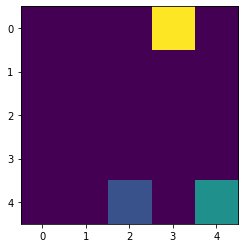

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5051}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8325}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0138}, (0, 3): {'U': -1.7638, 'D': -0.0062, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2454, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

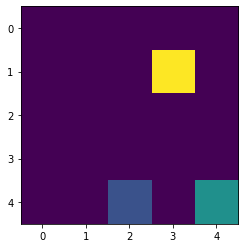

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5051}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8325}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0138}, (0, 3): {'U': -1.7638, 'D': -0.0062, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2455, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

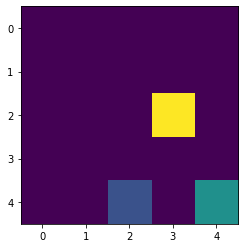

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5051}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8325}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0138}, (0, 3): {'U': -1.7638, 'D': -0.0062, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2455, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

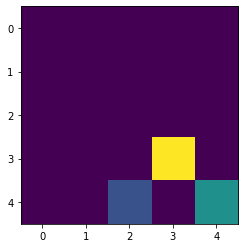

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5051}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8325}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0138}, (0, 3): {'U': -1.7638, 'D': -0.0062, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2455, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

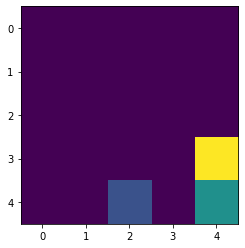

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5051}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8325}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0138}, (0, 3): {'U': -1.7638, 'D': -0.0062, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2455, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

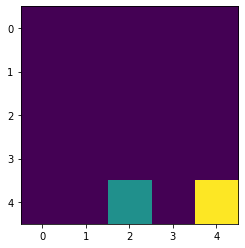

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.5051}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8325}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0138}, (0, 3): {'U': -1.7638, 'D': -0.0062, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2455, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8075

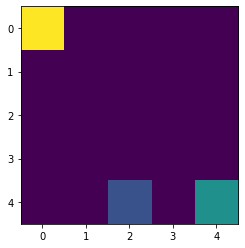

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4973}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8325}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0138}, (0, 3): {'U': -1.7638, 'D': -0.0062, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2455, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

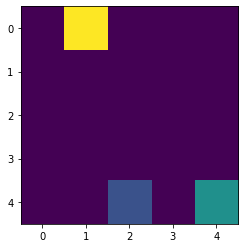

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4973}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8282}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0138}, (0, 3): {'U': -1.7638, 'D': -0.0062, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2455, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

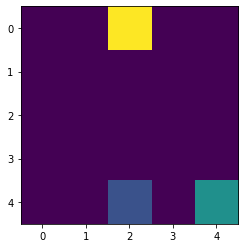

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4973}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8282}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.012}, (0, 3): {'U': -1.7638, 'D': -0.0062, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2455, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

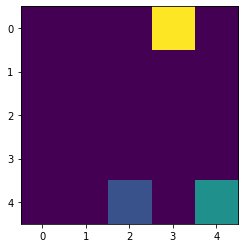

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4973}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8282}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.012}, (0, 3): {'U': -1.7638, 'D': -0.0057, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2455, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

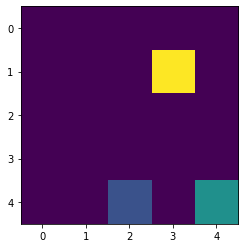

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4973}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8282}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.012}, (0, 3): {'U': -1.7638, 'D': -0.0057, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2456, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

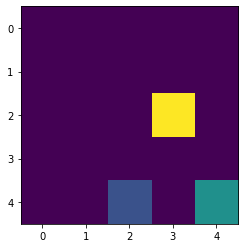

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4973}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8282}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.012}, (0, 3): {'U': -1.7638, 'D': -0.0057, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2456, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

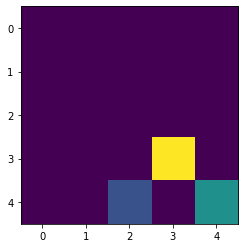

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4973}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8282}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.012}, (0, 3): {'U': -1.7638, 'D': -0.0057, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2456, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

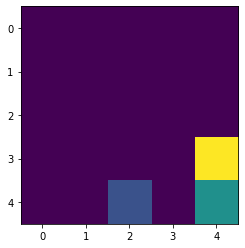

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4973}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8282}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.012}, (0, 3): {'U': -1.7638, 'D': -0.0057, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2456, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

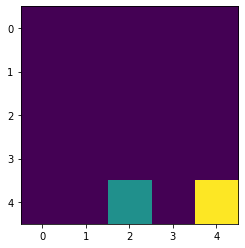

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4973}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8282}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.012}, (0, 3): {'U': -1.7638, 'D': -0.0057, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2456, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8075,

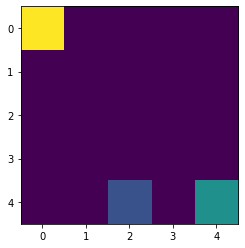

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4904}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8282}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.012}, (0, 3): {'U': -1.7638, 'D': -0.0057, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2456, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

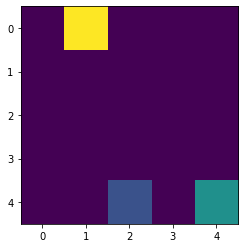

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4904}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8245}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.012}, (0, 3): {'U': -1.7638, 'D': -0.0057, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2456, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

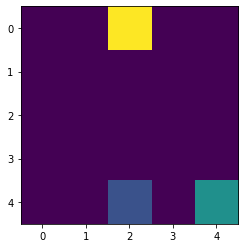

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4904}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8245}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0105}, (0, 3): {'U': -1.7638, 'D': -0.0057, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2456, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

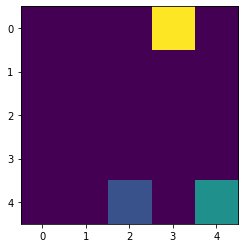

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4904}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8245}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0105}, (0, 3): {'U': -1.7638, 'D': -0.0053, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2456, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

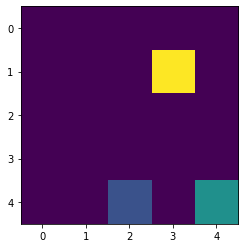

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4904}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8245}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0105}, (0, 3): {'U': -1.7638, 'D': -0.0053, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2457, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

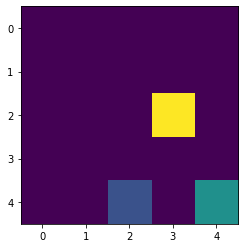

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4904}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8245}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0105}, (0, 3): {'U': -1.7638, 'D': -0.0053, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2457, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

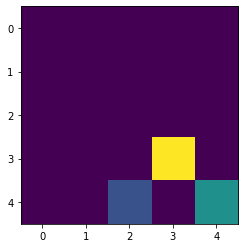

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4904}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8245}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0105}, (0, 3): {'U': -1.7638, 'D': -0.0053, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2457, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

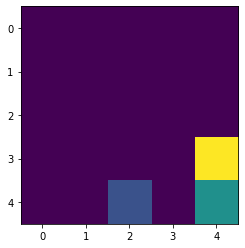

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4904}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8245}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0105}, (0, 3): {'U': -1.7638, 'D': -0.0053, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2457, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

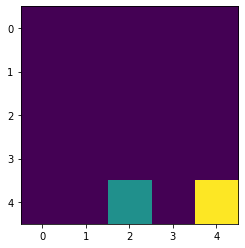

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4904}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8245}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0105}, (0, 3): {'U': -1.7638, 'D': -0.0053, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2457, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8075

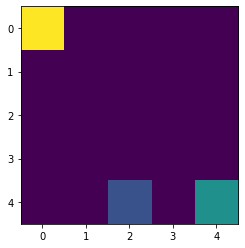

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8245}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0105}, (0, 3): {'U': -1.7638, 'D': -0.0053, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2457, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

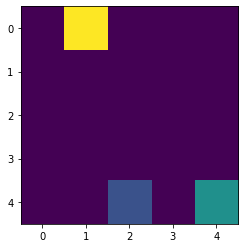

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8213}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0105}, (0, 3): {'U': -1.7638, 'D': -0.0053, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2457, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

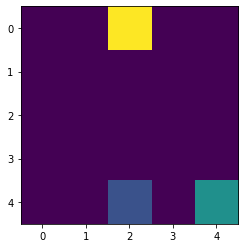

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8213}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0092}, (0, 3): {'U': -1.7638, 'D': -0.0053, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2457, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

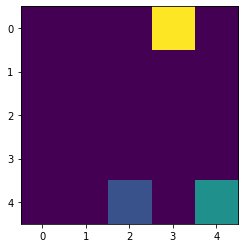

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8213}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0092}, (0, 3): {'U': -1.7638, 'D': -0.0049, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2457, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

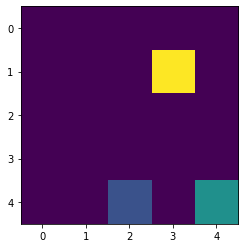

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8213}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0092}, (0, 3): {'U': -1.7638, 'D': -0.0049, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

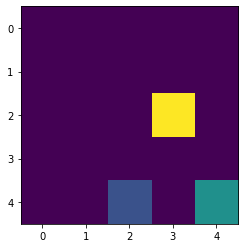

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8213}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0092}, (0, 3): {'U': -1.7638, 'D': -0.0049, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

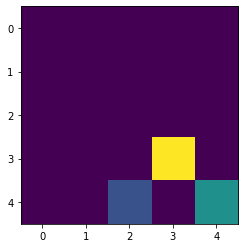

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8213}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0092}, (0, 3): {'U': -1.7638, 'D': -0.0049, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

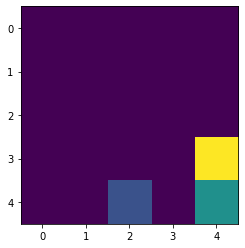

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8213}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0092}, (0, 3): {'U': -1.7638, 'D': -0.0049, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

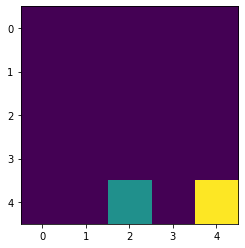

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4842}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8213}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0092}, (0, 3): {'U': -1.7638, 'D': -0.0049, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8075

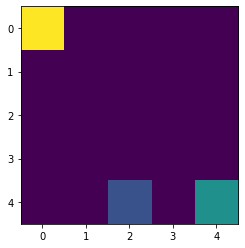

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4788}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8213}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0092}, (0, 3): {'U': -1.7638, 'D': -0.0049, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

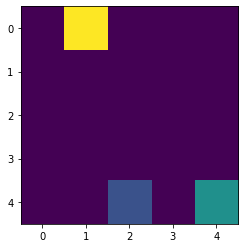

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4788}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8185}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0092}, (0, 3): {'U': -1.7638, 'D': -0.0049, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

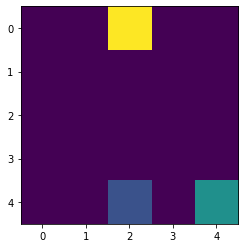

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4788}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8185}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0081}, (0, 3): {'U': -1.7638, 'D': -0.0049, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

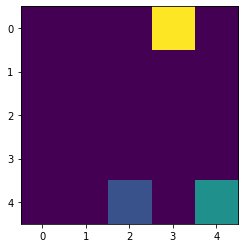

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4788}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8185}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0081}, (0, 3): {'U': -1.7638, 'D': -0.0046, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

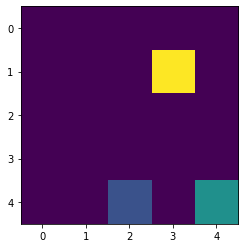

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4788}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8185}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0081}, (0, 3): {'U': -1.7638, 'D': -0.0046, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

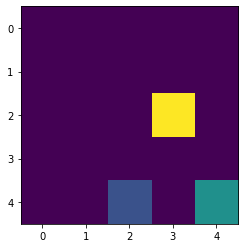

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4788}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8185}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0081}, (0, 3): {'U': -1.7638, 'D': -0.0046, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

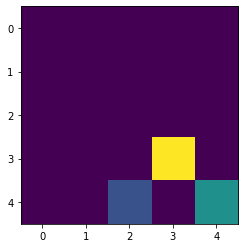

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4788}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8185}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0081}, (0, 3): {'U': -1.7638, 'D': -0.0046, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

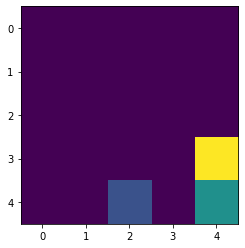

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4788}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8185}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0081}, (0, 3): {'U': -1.7638, 'D': -0.0046, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

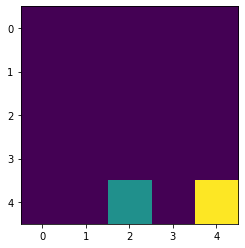

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4788}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8185}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0081}, (0, 3): {'U': -1.7638, 'D': -0.0046, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8075

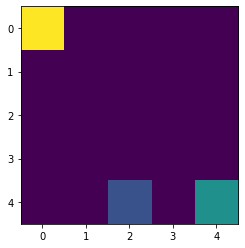

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.474}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8185}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0081}, (0, 3): {'U': -1.7638, 'D': -0.0046, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

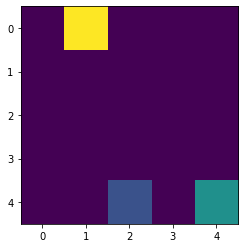

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.474}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8161}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0081}, (0, 3): {'U': -1.7638, 'D': -0.0046, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

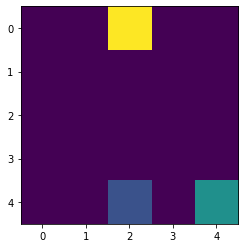

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.474}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8161}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0072}, (0, 3): {'U': -1.7638, 'D': -0.0046, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

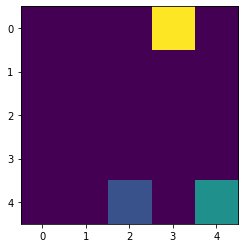

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.474}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8161}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0072}, (0, 3): {'U': -1.7638, 'D': -0.0044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

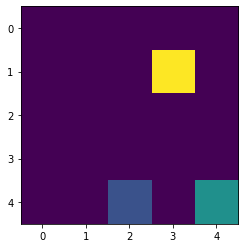

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.474}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8161}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0072}, (0, 3): {'U': -1.7638, 'D': -0.0044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

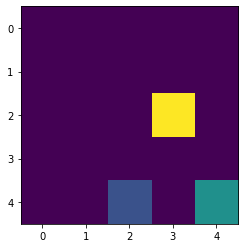

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.474}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8161}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0072}, (0, 3): {'U': -1.7638, 'D': -0.0044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

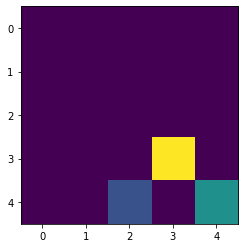

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.474}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8161}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0072}, (0, 3): {'U': -1.7638, 'D': -0.0044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

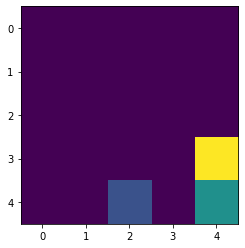

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.474}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8161}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0072}, (0, 3): {'U': -1.7638, 'D': -0.0044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

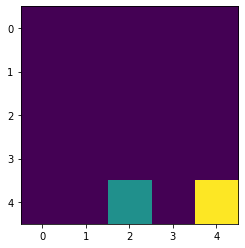

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.474}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8161}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0072}, (0, 3): {'U': -1.7638, 'D': -0.0044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8075,

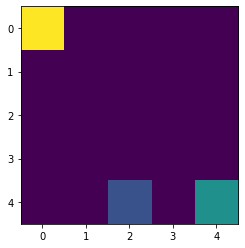

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4698}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.8161}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0072}, (0, 3): {'U': -1.7638, 'D': -0.0044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, '

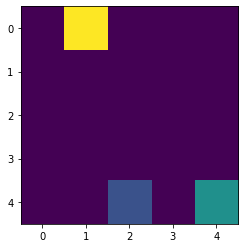

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4698}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.814}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0072}, (0, 3): {'U': -1.7638, 'D': -0.0044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

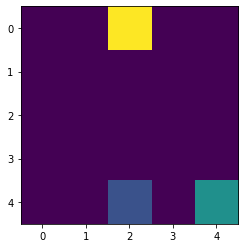

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4698}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.814}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0065}, (0, 3): {'U': -1.7638, 'D': -0.0044, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

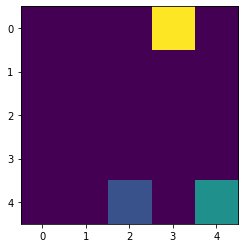

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4698}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.814}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0065}, (0, 3): {'U': -1.7638, 'D': -0.0042, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

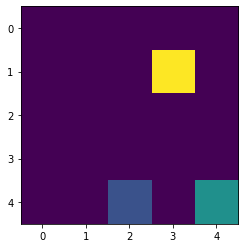

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4698}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.814}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0065}, (0, 3): {'U': -1.7638, 'D': -0.0042, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

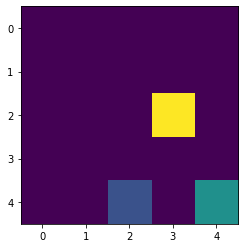

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4698}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.814}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0065}, (0, 3): {'U': -1.7638, 'D': -0.0042, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

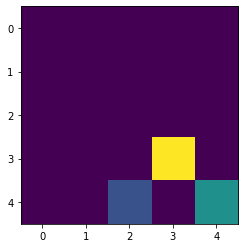

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4698}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.814}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0065}, (0, 3): {'U': -1.7638, 'D': -0.0042, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D

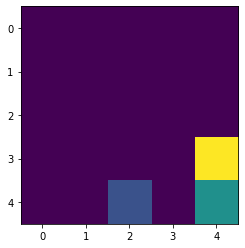

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4698}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.814}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0065}, (0, 3): {'U': -1.7638, 'D': -0.0042, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D'

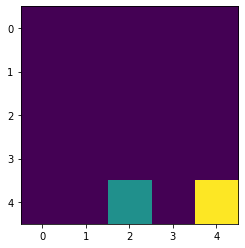

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................

Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4698}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.814}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0065}, (0, 3): {'U': -1.7638, 'D': -0.0042, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8075,

In [5]:
Qplay=Q_Agent()
Qplay.qval
Qplay.execute(100,False)


Q-Table 

{(0, 0): {'U': -3.2291, 'D': -3.1974, 'L': -3.2916, 'R': -2.4698}, (0, 1): {'U': -2.8345, 'D': -2.7765, 'L': -3.1611, 'R': -1.814}, (0, 2): {'U': -2.3719, 'D': -2.2991, 'L': -2.3645, 'R': -1.0065}, (0, 3): {'U': -1.7638, 'D': -0.0042, 'L': -1.8188, 'R': -1.8268}, (0, 4): {'U': -1.5022, 'D': -1.1834, 'L': -1.5022, 'R': -1.4698}, (1, 0): {'U': -2.9122, 'D': -2.8138, 'L': -2.8198, 'R': -2.7627}, (1, 1): {'U': -2.5373, 'D': -2.3988, 'L': -2.453, 'R': -2.0033}, (1, 2): {'U': -2.2481, 'D': -1.9273, 'L': -2.0119, 'R': -0.7086}, (1, 3): {'U': -1.454, 'D': 1.2458, 'L': -1.866, 'R': -1.0599}, (1, 4): {'U': -1.3791, 'D': 0.967, 'L': -1.4734, 'R': -1.3029}, (2, 0): {'U': -2.6145, 'D': -2.3985, 'L': -2.5062, 'R': -2.3764}, (2, 1): {'U': -2.1049, 'D': -1.4902, 'L': -2.0282, 'R': -2.0135}, (2, 2): {'U': -2.1932, 'D': -1.2254, 'L': -1.8509, 'R': -1.4366}, (2, 3): {'U': -1.5677, 'D': 2.8075, 'L': -1.4546, 'R': -0.2045}, (2, 4): {'U': -0.8148, 'D': 4.2017, 'L': -0.6902, 'R': -0.2097}, (3, 0):

Text(0.5, 0, 'Epsilon')

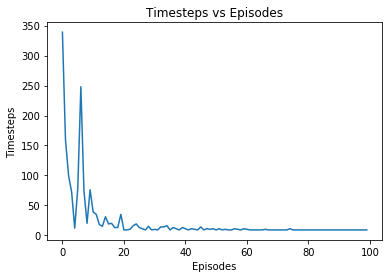

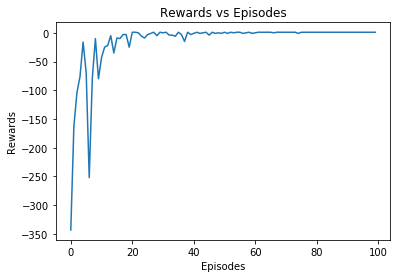

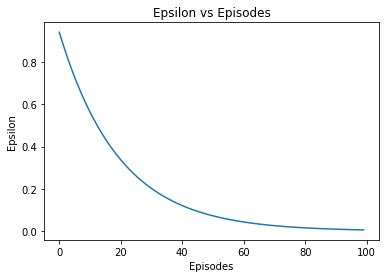

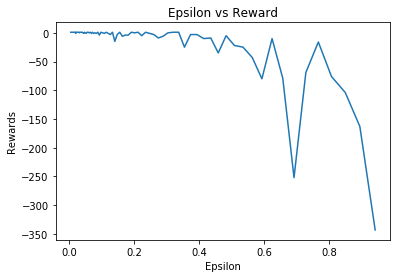

In [6]:
print("\nQ-Table \n")
print(Qplay.qval)

plt.figure(1)             
plt.plot(ovsteps)
plt.title('Timesteps vs Episodes')
plt.ylabel('Timesteps')
plt.xlabel('Episodes')

plt.figure(2)             
plt.plot(rew)
plt.title('Rewards vs Episodes')
plt.ylabel('Rewards')
plt.xlabel('Episodes')

plt.figure(3)             
plt.plot(eps)
plt.title('Epsilon vs Episodes')
plt.ylabel('Epsilon')
plt.xlabel('Episodes')

plt.figure(4)             
plt.plot(eps,rew)
plt.title('Epsilon vs Reward')
plt.ylabel('Rewards')
plt.xlabel('Epsilon')

..................................................


Iteration :  0
Current State of Agent :  (0, 0)
Action Taken by Agent (U:Up; D:Down: R:Right; L:Left):  R


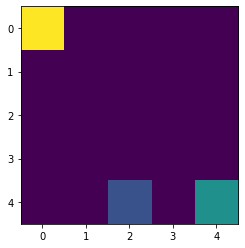

Next state of Agent :  (0, 1)
Reward got :  -1
Timestep :  1
..................................................
..................................................


Iteration :  0
Current State of Agent :  (0, 1)
Action Taken by Agent (U:Up; D:Down: R:Right; L:Left):  R


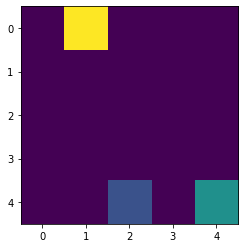

Next state of Agent :  (0, 2)
Reward got :  -1
Timestep :  2
..................................................
..................................................


Iteration :  0
Current State of Agent :  (0, 2)
Action Taken by Agent (U:Up; D:Down: R:Right; L:Left):  R


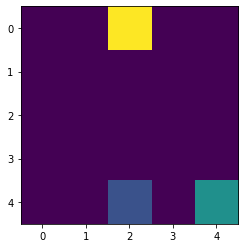

Next state of Agent :  (0, 3)
Reward got :  -1
Timestep :  3
..................................................
..................................................


Iteration :  0
Current State of Agent :  (0, 3)
Action Taken by Agent (U:Up; D:Down: R:Right; L:Left):  D


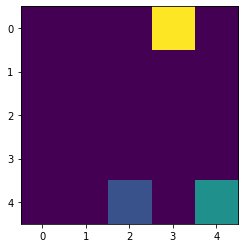

Next state of Agent :  (1, 3)
Reward got :  -1
Timestep :  4
..................................................
..................................................


Iteration :  0
Current State of Agent :  (1, 3)
Action Taken by Agent (U:Up; D:Down: R:Right; L:Left):  D


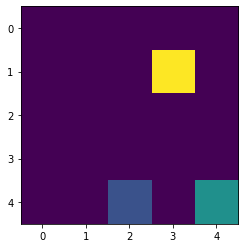

Next state of Agent :  (2, 3)
Reward got :  -1
Timestep :  5
..................................................
..................................................


Iteration :  0
Current State of Agent :  (2, 3)
Action Taken by Agent (U:Up; D:Down: R:Right; L:Left):  D


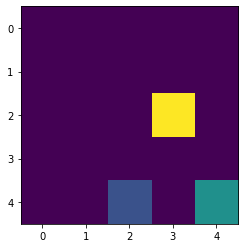

Next state of Agent :  (3, 3)
Reward got :  -1
Timestep :  6
..................................................
..................................................


Iteration :  0
Current State of Agent :  (3, 3)
Action Taken by Agent (U:Up; D:Down: R:Right; L:Left):  R


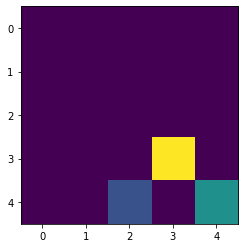

Next state of Agent :  (3, 4)
Reward got :  -1
Timestep :  7
..................................................
..................................................


Iteration :  0
Current State of Agent :  (3, 4)
Action Taken by Agent (U:Up; D:Down: R:Right; L:Left):  D


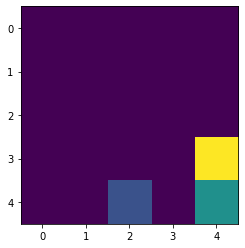

Next state of Agent :  (4, 4)
Reward got :  4
Timestep :  8
..................................................
..................................................


Iteration :  0


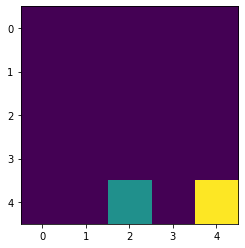

Reward in the end :  4
Timestep :  9

GAME WON!!!!
..................................................


In [7]:
Qplay.execute(1,True)